In [1]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
import json
import numpy as np
import random
import os
import matplotlib.pyplot as plt

In [2]:
tf.__version__
seed = 18
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(random)
tf.keras.backend.set_floatx('float64')

In [3]:
resize = True

In [4]:
names = []

with os.scandir('training/') as entries:
    for entry in entries:
        names.append("training/"+entry.name)

In [5]:
def toRep(inp, channels, resize):
    if resize:
        cX = np.zeros((30, 30, 22+channels))
        for i in range(0, 11):
            clayer = inp[:, :] == i-1
            cX[:, :, i] = clayer
            cX[:, :, 11+i] = clayer
        return cX
    else:
        cX = np.zeros((inp.shape[0], inp.shape[1], 20+channels))
        for i in range(0, 10):
            clayer = inp[:, :] == i
            cX[:, :, i] = clayer
            cX[:, :, 10+i] = clayer
        return cX


def fromRep(rep, resize):
    if resize:
        toprint = rep[:, :, 0:11]
        toprint = np.argmax(toprint, axis=-1)-1
    else:
        toprint = rep[:, :, 0:10]
        toprint = np.argmax(toprint, axis=-1)
    return toprint

def onConf(rep, resize):
    toprint = rep[:, :, 0:10]
    maxtype = np.argmax(toprint, axis=-1)
    confidence = np.max(toprint, axis=-1)
    nonzeros = maxtype != 0
    confidence = confidence*nonzeros
    return confidence

def plot(inp):
    plt.imshow(inp)
    plt.colorbar()
    plt.show()

def load(name, channels, resize):
    X = []
    Y = []
    Xtest = []
    with open(name) as json_file:
        data = json.load(json_file) 
        l = len(data['train'])
        i = 0
        for t in data['train']:
            i += 1
            
            cin = np.array(t['input'])
            cout = np.array(t['output'])

            if not resize:
                if cin.shape != cout.shape:
                    return False
            
            if resize:
                cinr = np.full((30, 30), -1)
                cinr[:cin.shape[0], :cin.shape[1]] = cin
                coutr = np.full((30, 30), -1)
                coutr[:cout.shape[0], :cout.shape[1]] = cout
            else:
                cinr = cin
                coutr = cout
                
            cX = toRep(cinr, channels, resize)
            
            cY = toRep(coutr, channels, resize)
            
            X.append(cX)
            Y.append(cY)
            
        for t in data['test']:
            cin = np.array(t['input'])
            
            if resize:
                cinr = np.full((30, 30), -1)
                cinr[:cin.shape[0], :cin.shape[1]] = cin
            else:
                cinr = cin
                
            cX = toRep(cinr, channels, resize)
            
            Xtest.append(cX)
            
    return [np.array(X), np.array(Y), np.array(Xtest)]

In [6]:
def loss_f(x, y, resize):
    #logits = x[:, :, :, 0:11]
    #labels = y[:, :, :, 0:11]
    #return tf.nn.softmax_cross_entropy_with_logits(labels, logits)
    if resize:
        return tf.reduce_mean(tf.square(x[:, :, :, 0:11]-y[:, :, :, 0:11]))
    else:
        #y = y[:, :, :, 0:10]
        #x = x[:, :, :, 0:10]
        #print(np.sum(x[0, 0, 0, 0:10]))
        #onx = tf.math.log(x)
        #offx = tf.math.log(1-x)
        #loss = (onx*y)+(offx*(1-y))
        #print(onx)
        #print(offx)
        #return (-1)*tf.reduce_mean(loss)
        return tf.reduce_mean(tf.square((x[:, :, :, 0:10]-y[:, :, :, 0:10])))

def generate(model, cin, channels, iterations, resize):
    if resize:
        mask = np.zeros((cin.shape[0], cin.shape[1], cin.shape[2], channels+22))
        mask[:, :, :, 11:22] = 1
    else:
        mask = np.zeros((cin.shape[0], cin.shape[1], cin.shape[2], channels+20))
        mask[:, :, :, 10:20] = 1
        
        initialmask = np.zeros((cin.shape[0], cin.shape[1], cin.shape[2], channels+20))
        initialmask[:, :, :, 0:10] = 1

    xl2 = cin*mask
    
    for i in range(iterations):
        cin += model(cin)
        #Should be ok but still
        cin = (cin*(1-mask))+xl2
    toprint = cin.numpy()
    return toprint

def train(model, ctask, epochs, iterations, channels, verbose=False, validate=False, testtask=None, resize=False):
    trainer = tf.keras.optimizers.Adam()

    for l in ctask[0]:
        plot(fromRep(l, resize))
    
    origx = ctask[0]
    x = origx.copy()
    y = ctask[1]

    if resize:
        mask = np.zeros((x.shape[0], x.shape[1], x.shape[2], channels+22))
        mask[:, :, :, 11:22] = 1 
        xl2 = origx*mask
    
        initialmask = np.zeros((x.shape[0], x.shape[1], x.shape[2], channels+22))
        initialmask[:, :, :, 0:11] = 1
    else:
        mask = np.zeros((x.shape[0], x.shape[1], x.shape[2], channels+20))
        mask[:, :, :, 10:20] = 1 
        xl2 = origx*mask
    
        initialmask = np.zeros((x.shape[0], x.shape[1], x.shape[2], channels+20))
        initialmask[:, :, :, 0:10] = 1
    
    for k in range(epochs):
        x = origx.copy()
        with tf.GradientTape() as g:
            for i in tf.range(iterations):
                x += model(x)
                #logits = x
                #tosoftmax = tf.nn.softmax(x[:, :, :, 0:11])
                #newx = np.zeros((x.shape[0], x.shape[1], x.shape[2], channels+22))
                #newx[:, :, :, 0:11] = tosoftmax
                #x = (newx*initialmask)+(x*(1-mask))
                x = (x*(1-mask))+xl2
            loss = loss_f(x, y, resize)
            yin = y.copy()
            yin = model(y)
            
            #lossout = loss_f(yin, y, resize)
            #loss = lossinp+lossout
            grads = g.gradient(loss, model.weights)
            #grads = [g/(tf.norm(g)+1e-8) for g in grads]
            trainer.apply_gradients(zip(grads, model.weights))
        if k%2 == 0 or k == epochs-1:
            generatedinp = generate(model, ctask[0], channels, iterations, resize)
            generatedtask = generate(model, testtask, channels, iterations, resize)
            #groundtruth = wholetask[1]
            #valacc = testacc(generated, groundtruth)
            if verbose:
                print("TRAINING")
                for l in generatedinp:
                    plot(fromRep(l, resize))
                    #plot(onConf(l, resize))
                print("TEST")
                plot(fromRep(generatedtask[0], resize))
                #plot(onConf(generatedtask[0], resize))
                print("LOSS AT EPOCH "+str(k)+": "+str(tf.reduce_mean(loss.numpy())))
                #print("LOSS AT EPOCH "+str(k)+": "+str(loss.numpy())+" TRAIN ACCURACY: "+str(np.sum(valacc[0:-1]))+" VALIDATION ACCURACY: "+str(valacc[-1]))
    return model

In [ ]:
if resize:
    defaultchannels = 22
else:
    defaultchannels = 20

attentionchannels = 1
attentionfilters = 4
attentionneurons = 30*30*(channels+defaultchannels)
attentionsize = 5

ntasks = 5
channels = 5
filters = 8
perceptionsize = 7
neurons = 8
epochs = 1000
iterations = 30

tid = 106

ctask = load(names[tid], channels, resize)

if ctask == False:
    print("DIFFERENT SIZED IN/OUT")

taskin = tf.keras.Input(shape=(ctask[0].shape[1], ctask[0].shape[2], channels+defaultchannels))

#aX = Conv2D(attentionfilters, attentionsize, activation="relu")(taskin)
#aX = Flatten()(aX)
#aX = Dense(8, activation="relu")(aX)
#aX = Dense(30*30*(attentionchannels), activation=None)(aX)
#aX = Reshape((30, 30, attentionchannels))(aX)

#attmodel = tf.keras.Model(inputs=[taskin], outputs=[aX])

#attmodel.summary()

#X = Concatenate(axis=-1)([taskin, aX])

#X = DepthwiseConv2D((perceptionsize, perceptionsize), strides=[1, 1], padding="same", depth_multiplier=filters, activation="relu")(taskin)
#X = Conv2D(neurons, 1, activation="relu")(X)
#X = Conv2D(channels+defaultchannels, 1, activation=None)(X)


model = tf.keras.Model(inputs=[taskin], outputs=[X])
model.summary()

cin = ctask[0:2]
ctest = ctask[2]

model = train(model, cin, epochs, iterations, channels, True, True, ctest, resize)
#X = Concatenate()([taskin, aX])

#X = DepthwiseConv2D((perceptionsize, perceptionsize), strides=[1, 1], padding="same", depth_multiplier=filters, activation="relu")(taskin)
#X = 


In [ ]:
'''ntasks = 5
channels = 5
filters = 8
perceptionsize = 3
neurons = 8
epochs = 1000
iterations = 30
'''
ntasks = 5
channels = 5
filters = 8
perceptionsize = 5
neurons = 8
epochs = 1000
iterations = 30

#ctask = load(names[104], channels, resize)
ctask = load(names[106], channels, resize)
#task = load("training/db3e9e38.json", channels, resize)
if ctask == False:
    print("DIFFERENT SIZED IN/OUT")

if resize:
    model = tf.keras.Sequential([
        tf.keras.layers.DepthwiseConv2D((perceptionsize, perceptionsize), input_shape=(ctask[0].shape[1], ctask[0].shape[2], channels+22), strides=[1, 1], padding="same", depth_multiplier=filters, activation="relu"),
        #tf.keras.layers.Conv2D(filters, (perceptionsize, perceptionsize), input_shape=(ctask[0].shape[1], ctask[0].shape[2], channels+22), activation="relu", padding="same"),
        tf.keras.layers.Conv2D(neurons, 1, activation="relu"),
        tf.keras.layers.Conv2D(channels+22, 1, activation=None)
    ])
else:
    model = tf.keras.Sequential([
        tf.keras.layers.DepthwiseConv2D((perceptionsize, perceptionsize), input_shape=(ctask[0].shape[1], ctask[0].shape[2], channels+20), strides=[1, 1], padding="same", depth_multiplier=filters, activation="relu"),
        #tf.keras.layers.Conv2D(filters, (perceptionsize, perceptionsize), input_shape=(ctask[0].shape[1], ctask[0].shape[2], channels+20), activation="relu", padding="same"),
        tf.keras.layers.Conv2D(neurons, 1, activation="relu"),
        tf.keras.layers.Conv2D(channels+20, 1, activation=None)
    ])


cin = ctask[0:2]
ctest = ctask[2]
model = train(model, cin, epochs, iterations, channels, True, True, ctest, resize)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
depthwise_conv2d (DepthwiseC (None, 30, 30, 216)       10800     
_________________________________________________________________
conv2d (Conv2D)              (None, 30, 30, 8)         1736      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 30, 30, 27)        243       
Total params: 12,779
Trainable params: 12,779
Non-trainable params: 0
_________________________________________________________________


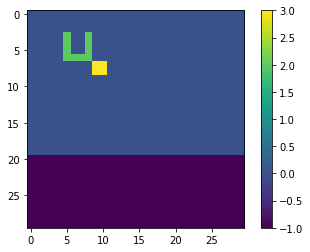

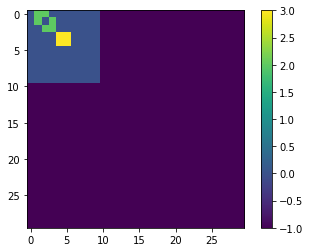

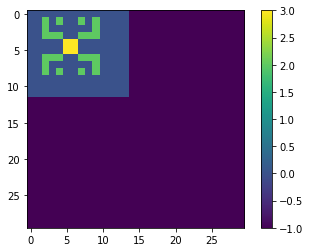

TRAINING


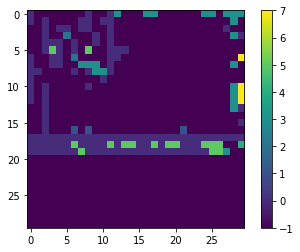

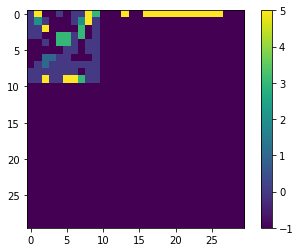

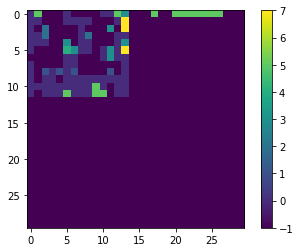

TEST


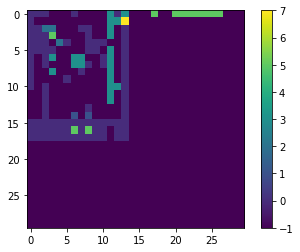

LOSS AT EPOCH 0: tf.Tensor(1.7575799238158623, shape=(), dtype=float64)
TRAINING


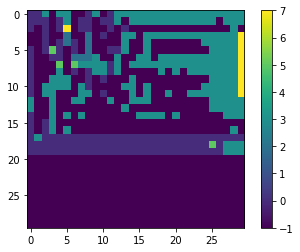

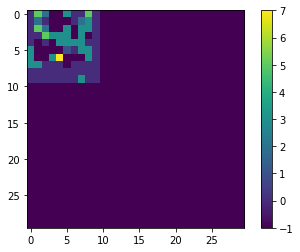

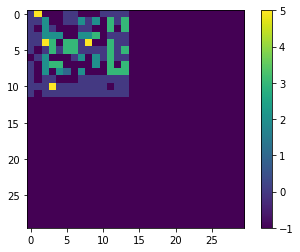

TEST


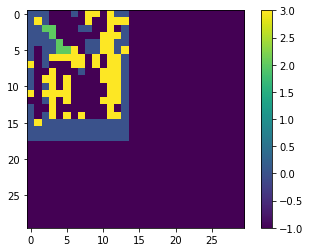

LOSS AT EPOCH 2: tf.Tensor(0.23737396349429454, shape=(), dtype=float64)
TRAINING


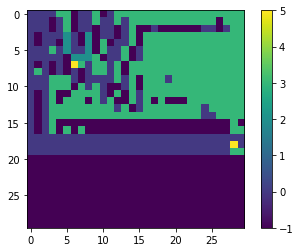

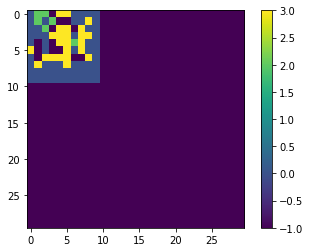

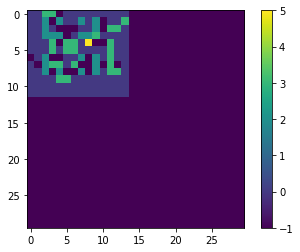

TEST


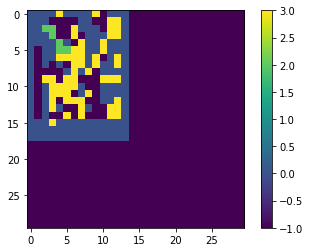

LOSS AT EPOCH 4: tf.Tensor(0.09585587872586859, shape=(), dtype=float64)
TRAINING


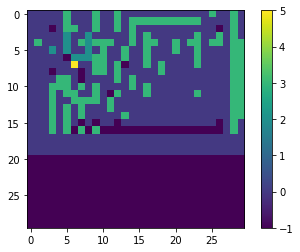

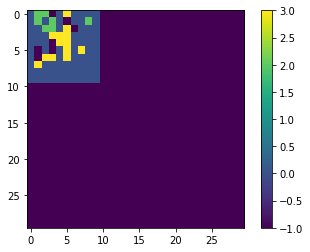

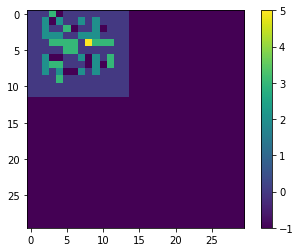

TEST


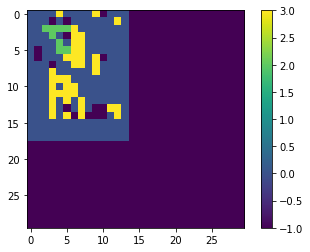

LOSS AT EPOCH 6: tf.Tensor(0.0524861337818117, shape=(), dtype=float64)
TRAINING


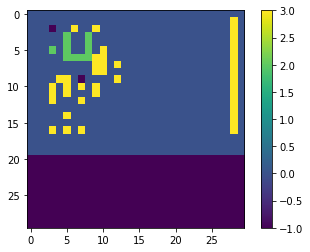

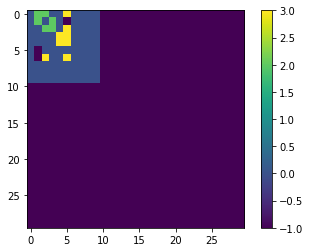

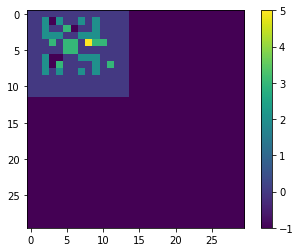

TEST


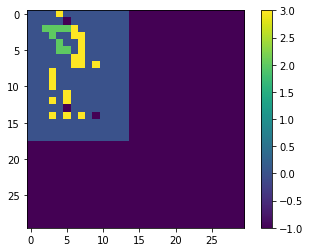

LOSS AT EPOCH 8: tf.Tensor(0.03706637390937239, shape=(), dtype=float64)
TRAINING


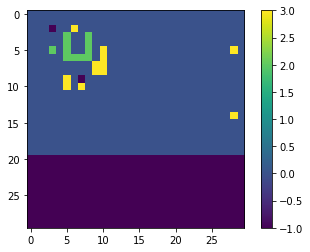

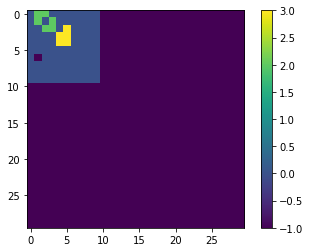

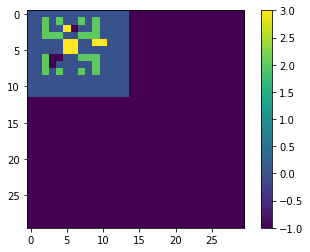

TEST


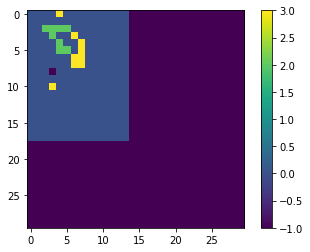

LOSS AT EPOCH 10: tf.Tensor(0.029507120958156195, shape=(), dtype=float64)
TRAINING


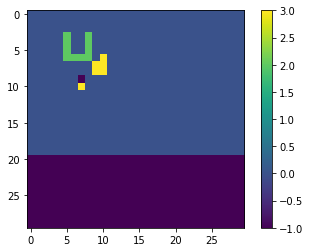

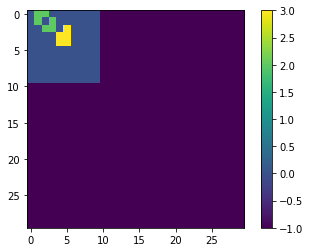

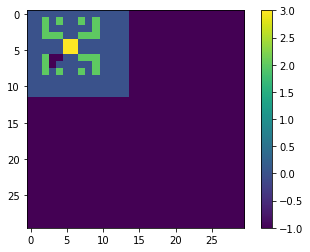

TEST


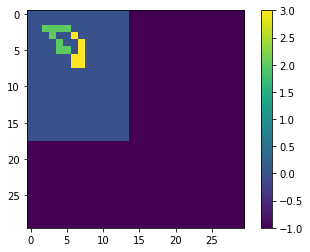

LOSS AT EPOCH 12: tf.Tensor(0.025710576392933105, shape=(), dtype=float64)
TRAINING


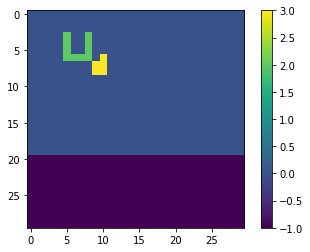

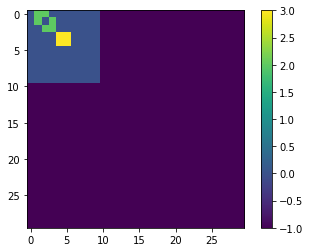

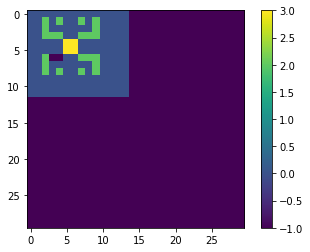

TEST


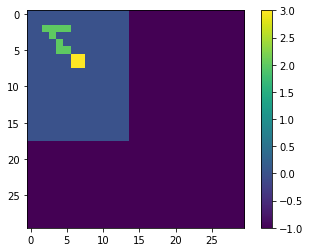

LOSS AT EPOCH 14: tf.Tensor(0.02395297085161231, shape=(), dtype=float64)
TRAINING


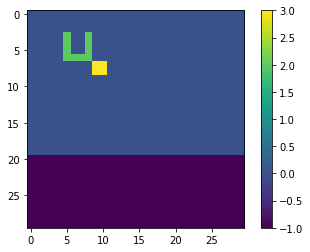

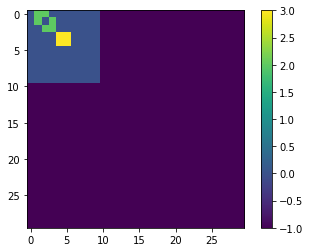

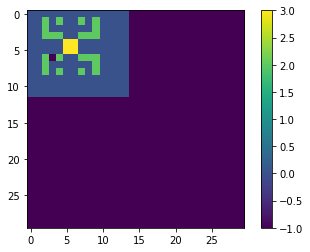

TEST


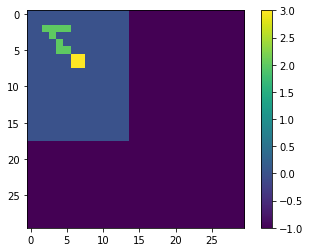

LOSS AT EPOCH 16: tf.Tensor(0.02308783812100098, shape=(), dtype=float64)
TRAINING


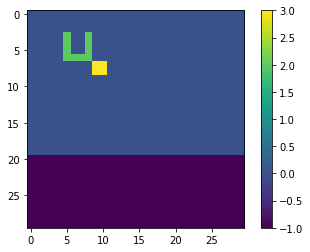

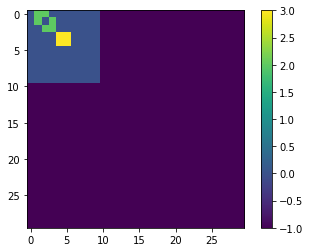

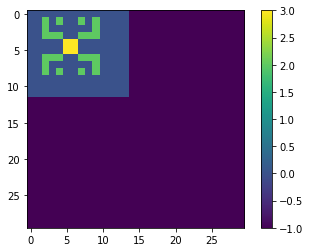

TEST


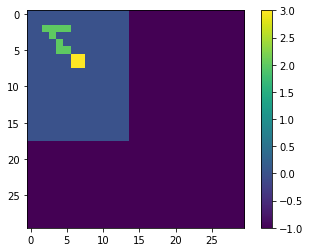

LOSS AT EPOCH 18: tf.Tensor(0.02241757490176417, shape=(), dtype=float64)
TRAINING


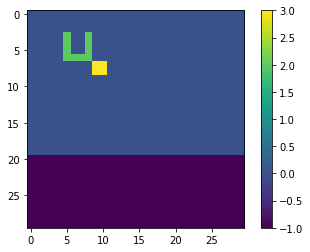

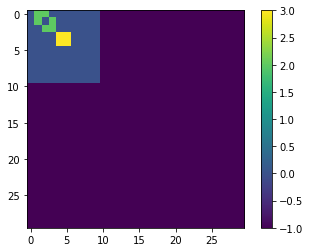

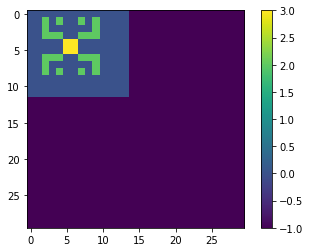

TEST


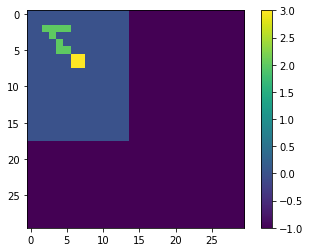

LOSS AT EPOCH 20: tf.Tensor(0.021611509827810748, shape=(), dtype=float64)
TRAINING


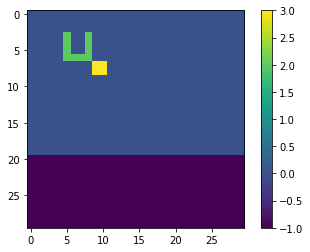

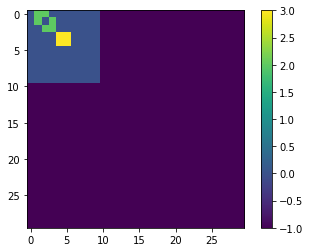

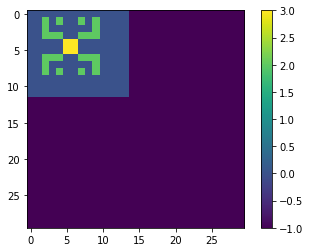

TEST


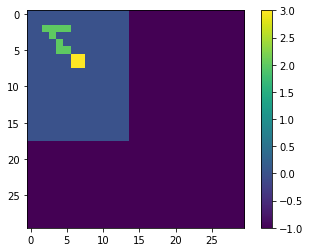

LOSS AT EPOCH 22: tf.Tensor(0.02058114996864381, shape=(), dtype=float64)
TRAINING


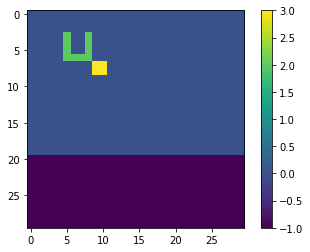

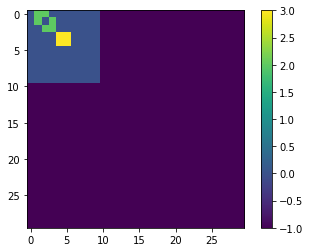

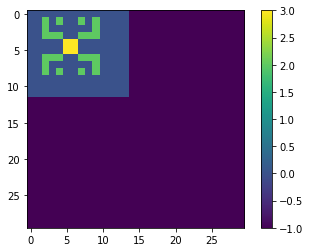

TEST


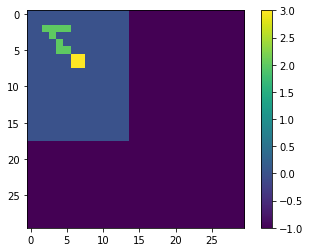

LOSS AT EPOCH 24: tf.Tensor(0.0193387564123058, shape=(), dtype=float64)
TRAINING


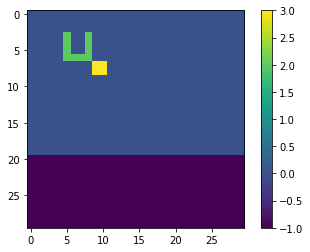

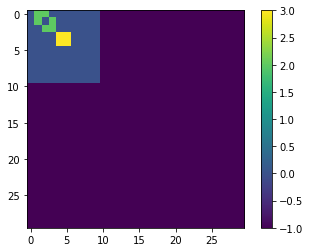

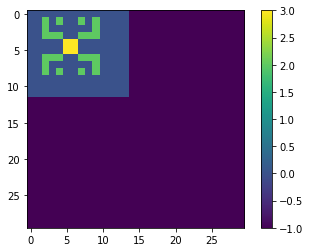

TEST


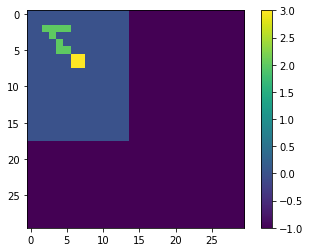

LOSS AT EPOCH 26: tf.Tensor(0.01793345459377216, shape=(), dtype=float64)
TRAINING


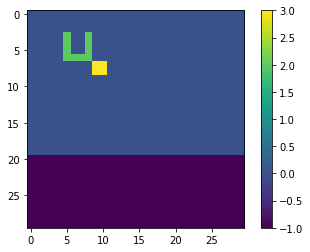

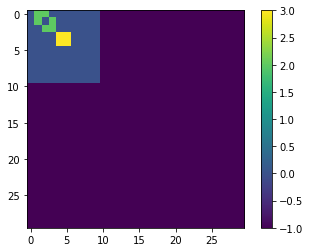

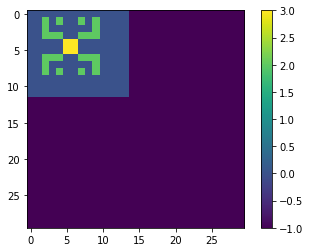

TEST


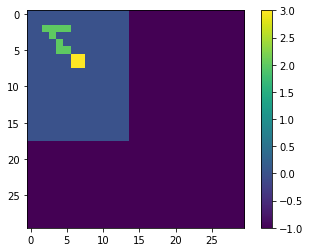

LOSS AT EPOCH 28: tf.Tensor(0.016438732647164434, shape=(), dtype=float64)
TRAINING


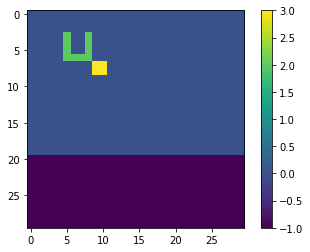

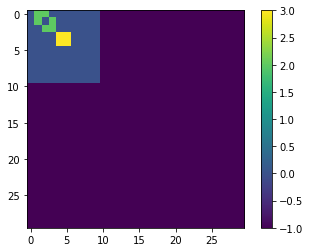

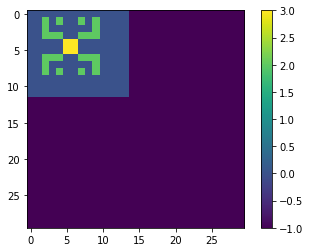

TEST


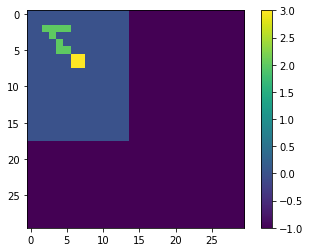

LOSS AT EPOCH 30: tf.Tensor(0.014924845113708297, shape=(), dtype=float64)
TRAINING


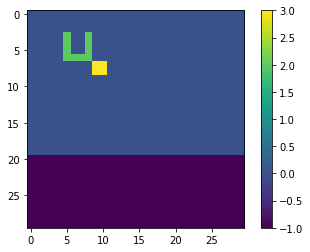

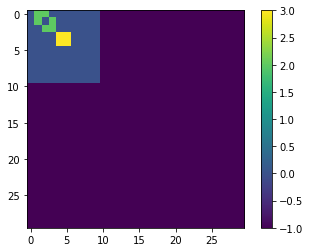

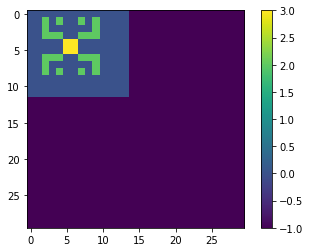

TEST


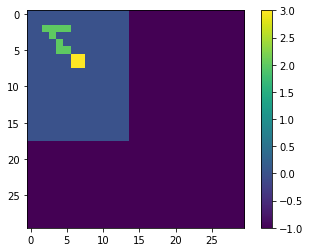

LOSS AT EPOCH 32: tf.Tensor(0.013445291362819994, shape=(), dtype=float64)
TRAINING


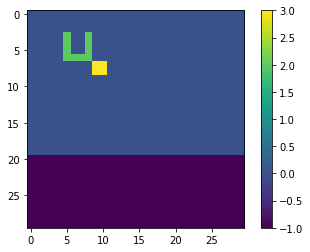

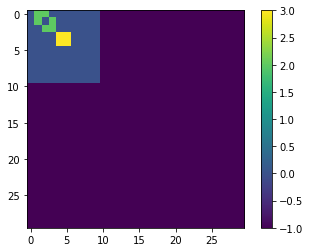

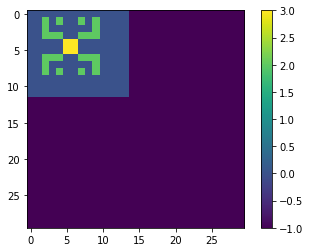

TEST


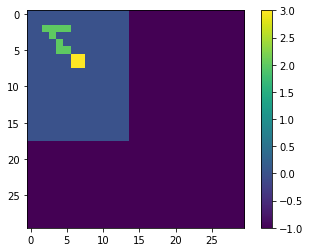

LOSS AT EPOCH 34: tf.Tensor(0.012042883096717022, shape=(), dtype=float64)
TRAINING


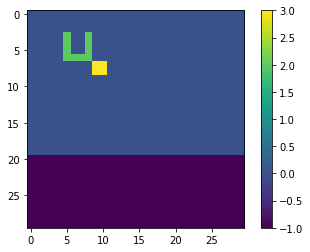

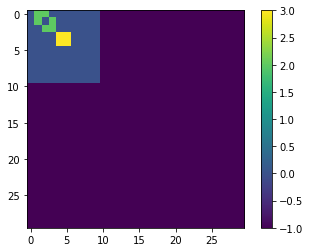

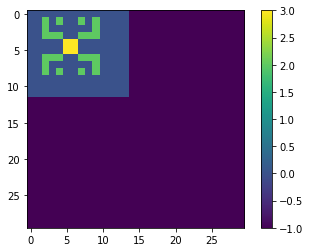

TEST


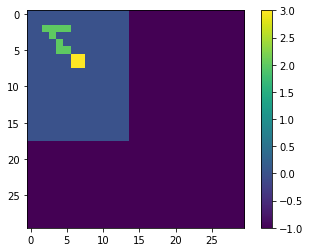

LOSS AT EPOCH 36: tf.Tensor(0.010747866226104281, shape=(), dtype=float64)
TRAINING


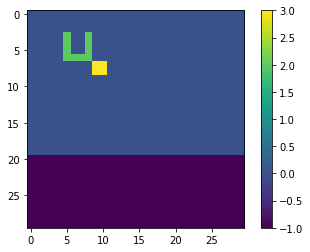

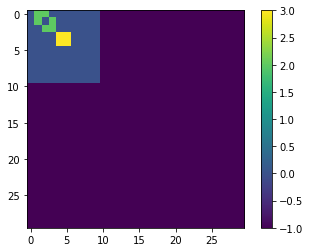

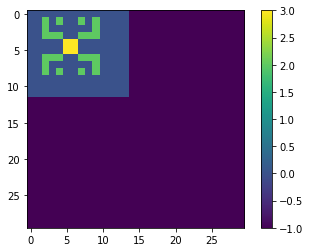

TEST


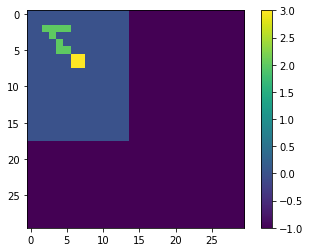

LOSS AT EPOCH 38: tf.Tensor(0.009579220102930112, shape=(), dtype=float64)
TRAINING


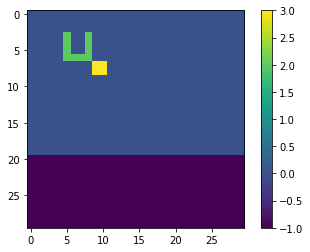

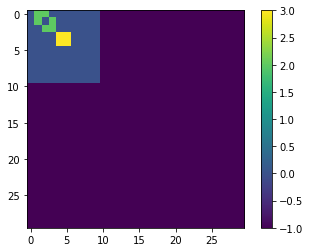

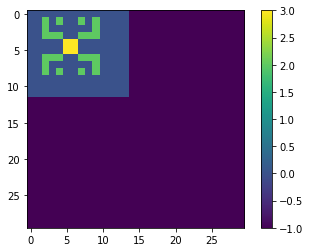

TEST


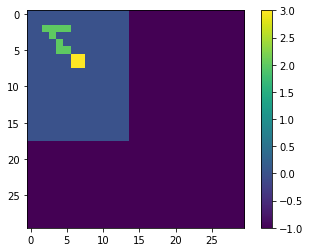

LOSS AT EPOCH 40: tf.Tensor(0.00854584679961178, shape=(), dtype=float64)
TRAINING


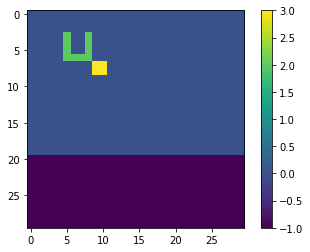

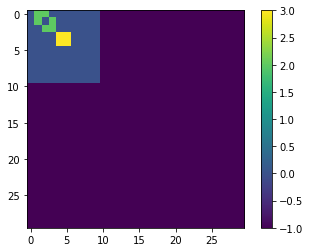

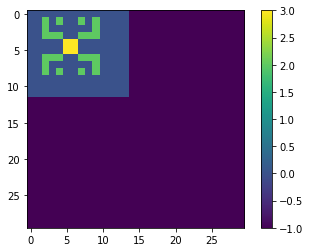

TEST


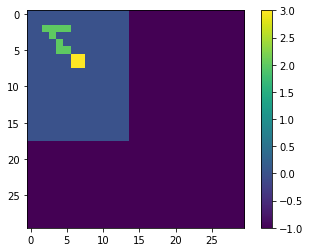

LOSS AT EPOCH 42: tf.Tensor(0.007649091346999493, shape=(), dtype=float64)
TRAINING


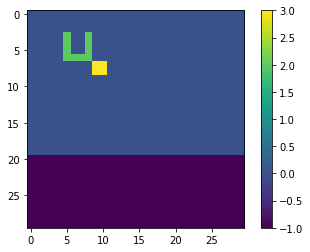

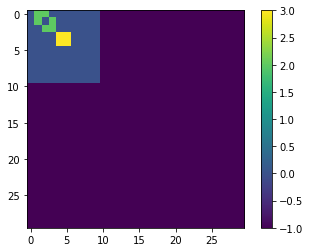

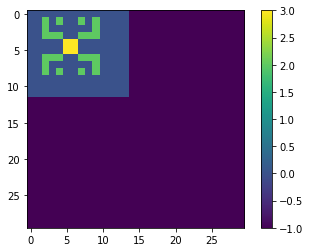

TEST


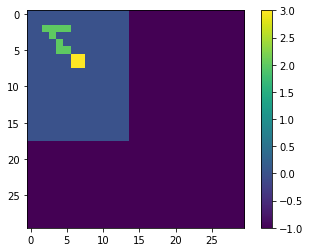

LOSS AT EPOCH 44: tf.Tensor(0.006883479350839589, shape=(), dtype=float64)
TRAINING


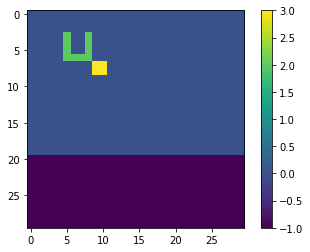

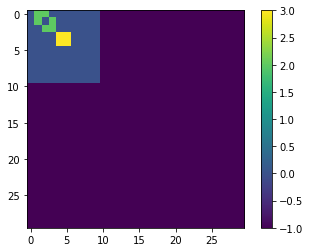

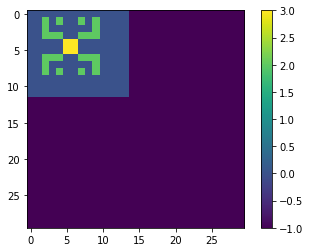

TEST


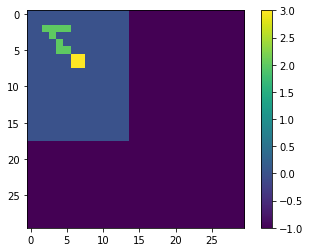

LOSS AT EPOCH 46: tf.Tensor(0.006240421077176736, shape=(), dtype=float64)
TRAINING


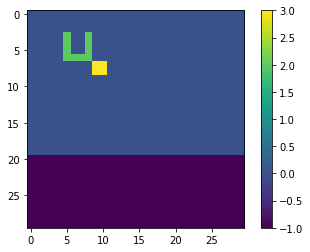

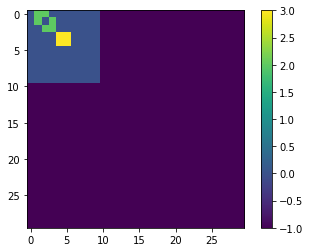

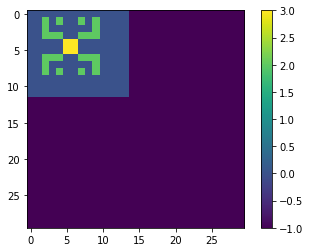

TEST


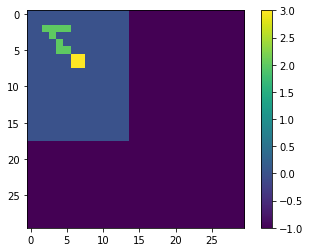

LOSS AT EPOCH 48: tf.Tensor(0.00570710290891792, shape=(), dtype=float64)
TRAINING


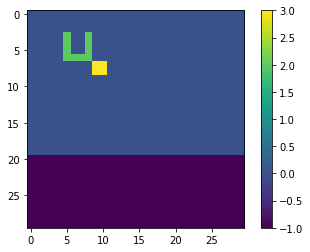

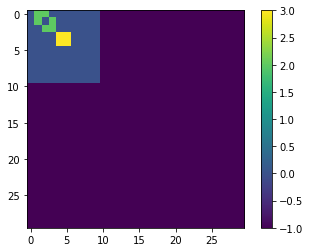

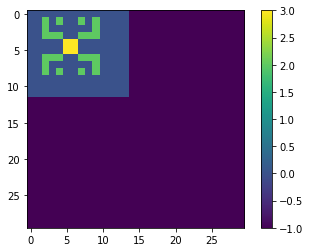

TEST


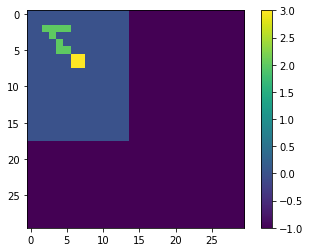

LOSS AT EPOCH 50: tf.Tensor(0.005269092299690188, shape=(), dtype=float64)
TRAINING


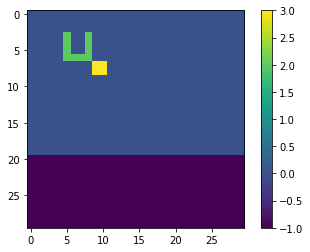

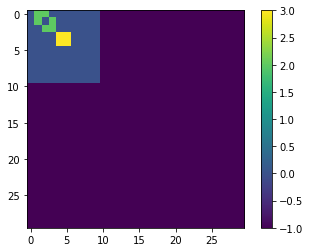

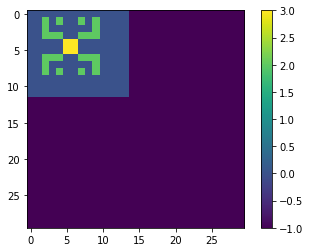

TEST


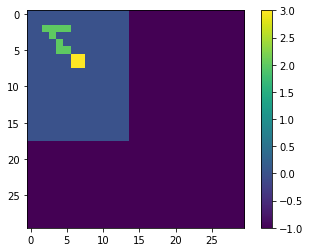

LOSS AT EPOCH 52: tf.Tensor(0.004911361305039182, shape=(), dtype=float64)
TRAINING


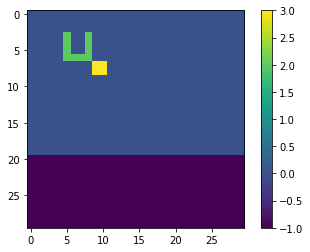

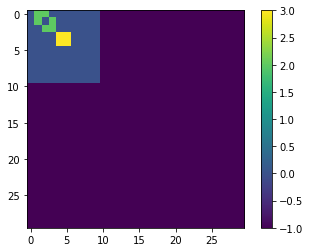

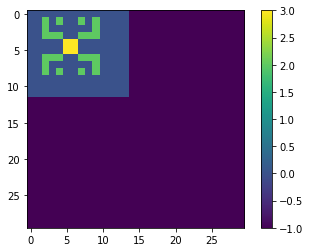

TEST


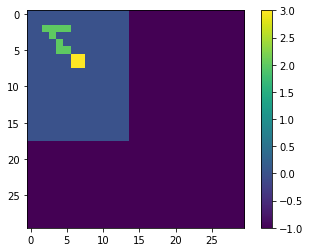

LOSS AT EPOCH 54: tf.Tensor(0.004621072433889332, shape=(), dtype=float64)
TRAINING


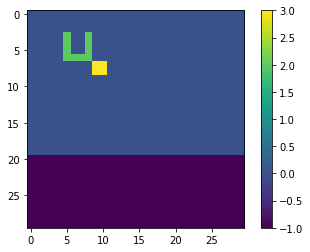

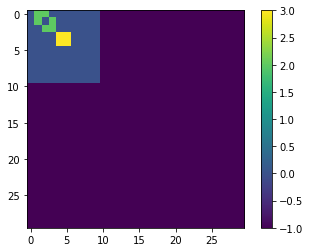

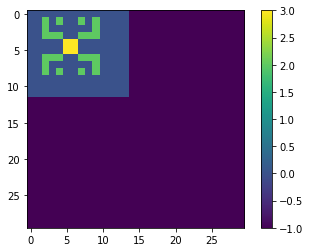

TEST


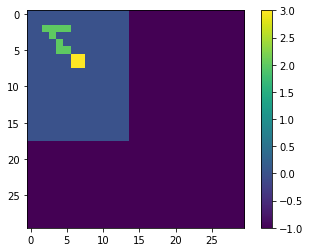

LOSS AT EPOCH 56: tf.Tensor(0.004386506555554782, shape=(), dtype=float64)
TRAINING


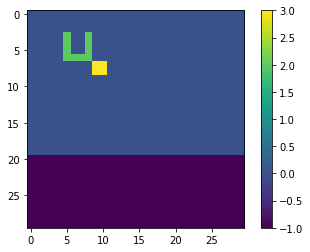

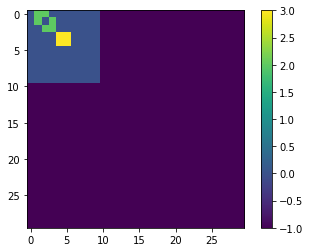

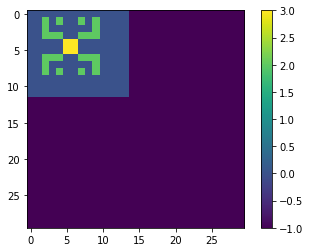

TEST


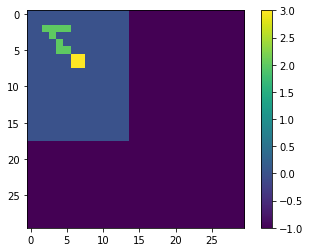

LOSS AT EPOCH 58: tf.Tensor(0.004197507214028093, shape=(), dtype=float64)
TRAINING


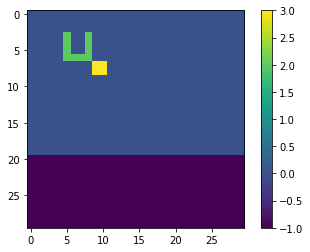

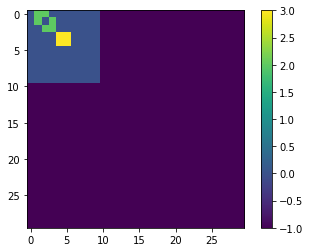

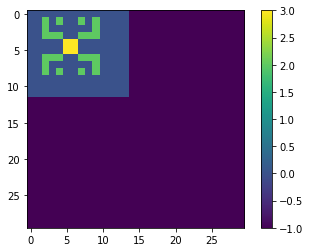

TEST


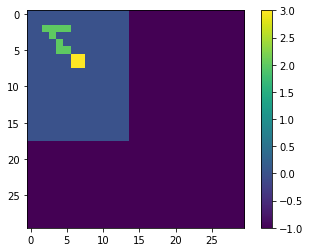

LOSS AT EPOCH 60: tf.Tensor(0.004045075160160262, shape=(), dtype=float64)
TRAINING


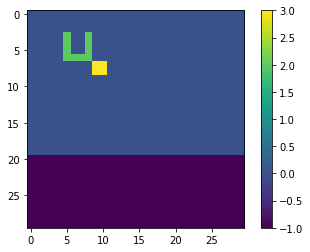

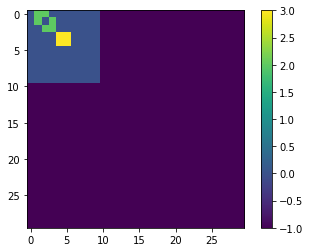

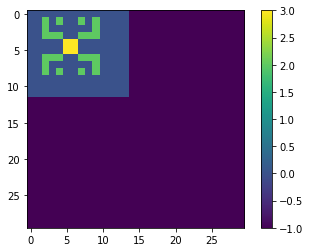

TEST


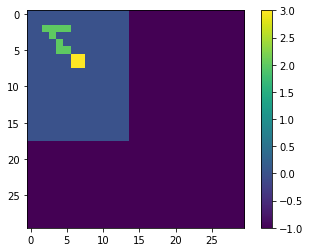

LOSS AT EPOCH 62: tf.Tensor(0.003921515971408691, shape=(), dtype=float64)
TRAINING


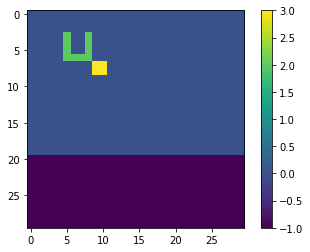

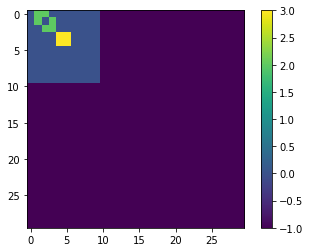

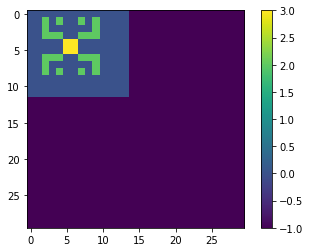

TEST


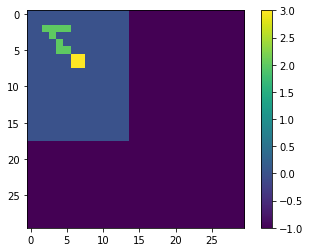

LOSS AT EPOCH 64: tf.Tensor(0.003820951921205477, shape=(), dtype=float64)
TRAINING


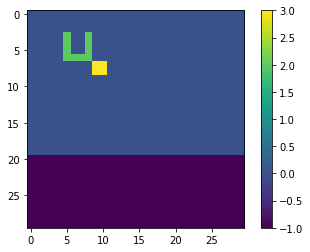

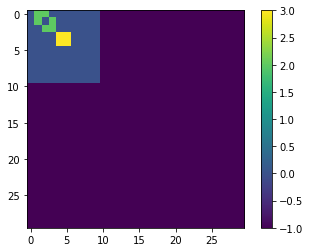

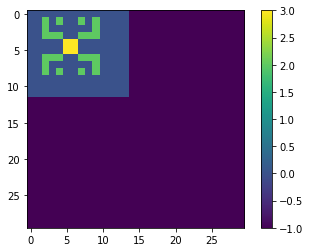

TEST


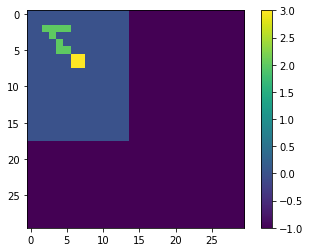

LOSS AT EPOCH 66: tf.Tensor(0.0037385853697875634, shape=(), dtype=float64)
TRAINING


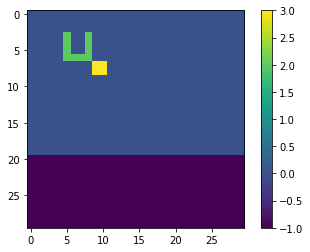

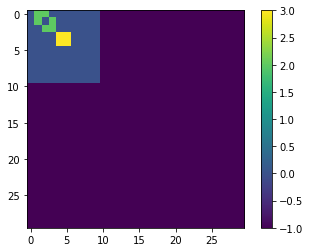

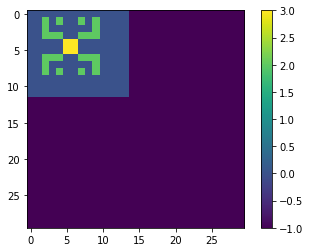

TEST


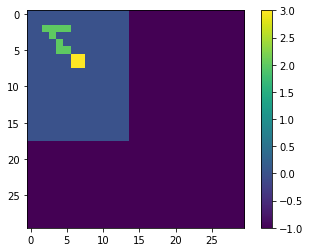

LOSS AT EPOCH 68: tf.Tensor(0.0036705780251244584, shape=(), dtype=float64)
TRAINING


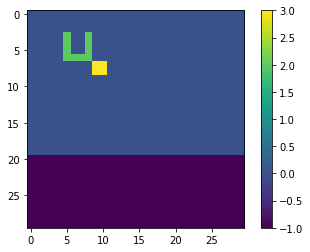

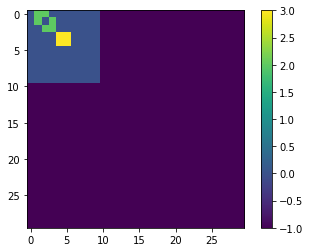

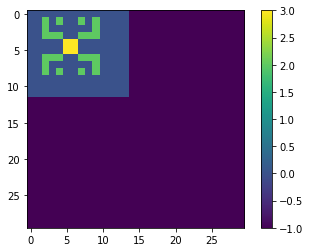

TEST


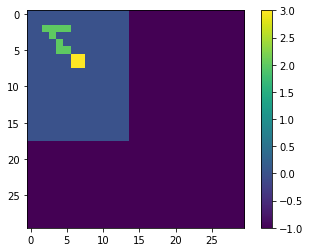

LOSS AT EPOCH 70: tf.Tensor(0.0036140909663924087, shape=(), dtype=float64)
TRAINING


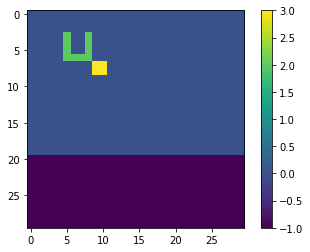

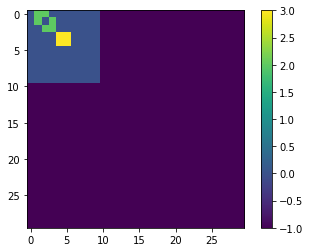

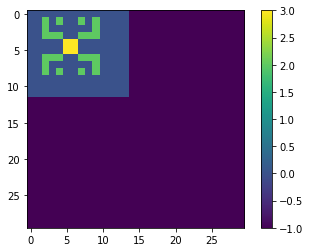

TEST


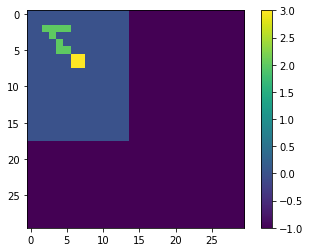

LOSS AT EPOCH 72: tf.Tensor(0.0035667448189133618, shape=(), dtype=float64)
TRAINING


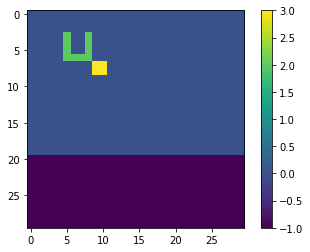

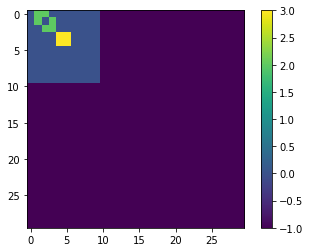

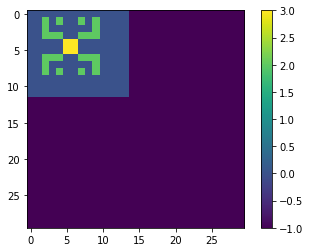

TEST


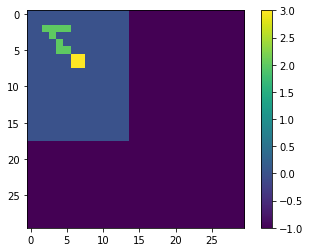

LOSS AT EPOCH 74: tf.Tensor(0.0035265436881327292, shape=(), dtype=float64)
TRAINING


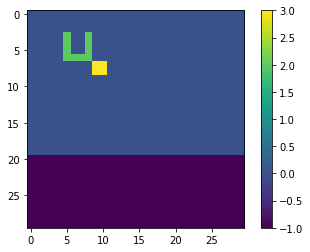

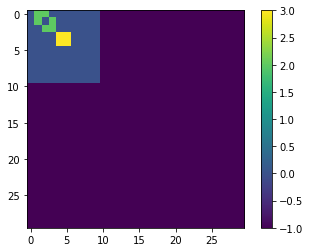

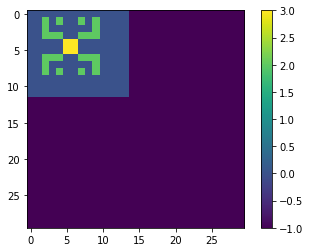

TEST


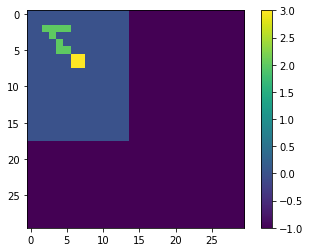

LOSS AT EPOCH 76: tf.Tensor(0.0034919627476474465, shape=(), dtype=float64)
TRAINING


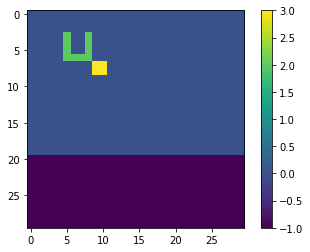

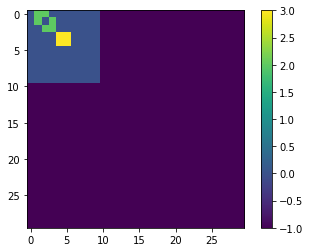

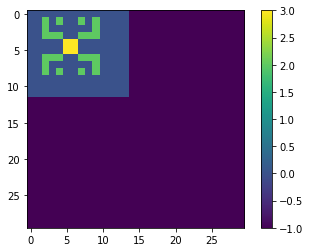

TEST


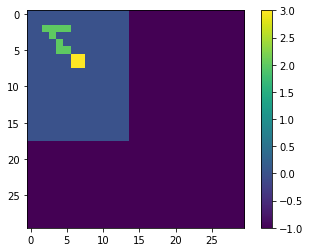

LOSS AT EPOCH 78: tf.Tensor(0.003462153288017931, shape=(), dtype=float64)
TRAINING


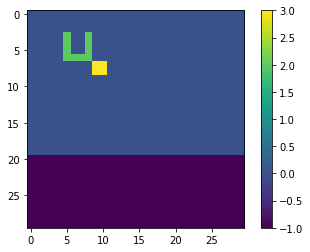

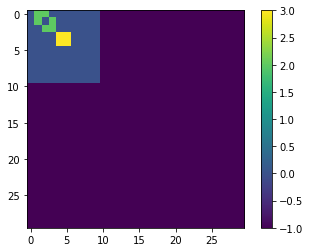

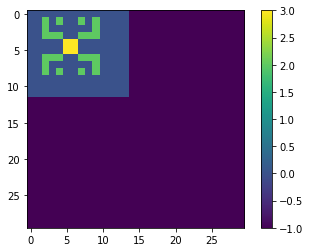

TEST


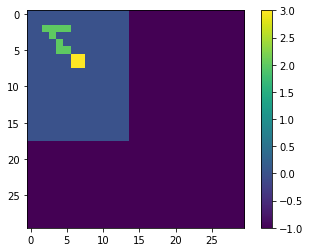

LOSS AT EPOCH 80: tf.Tensor(0.0034360516647520918, shape=(), dtype=float64)
TRAINING


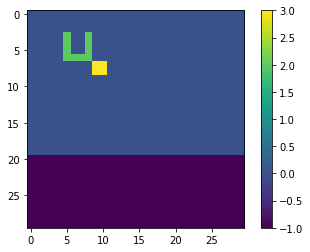

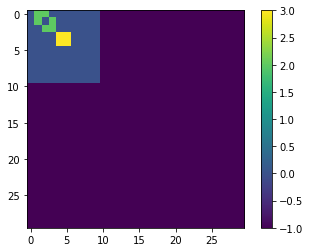

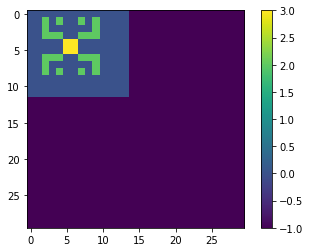

TEST


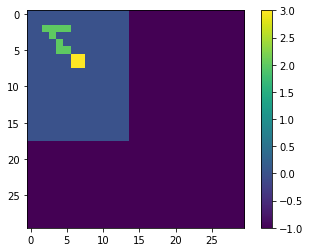

LOSS AT EPOCH 82: tf.Tensor(0.003412884970376201, shape=(), dtype=float64)
TRAINING


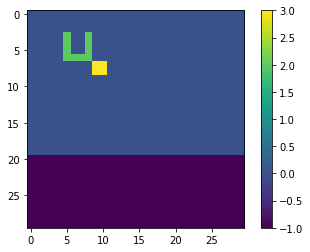

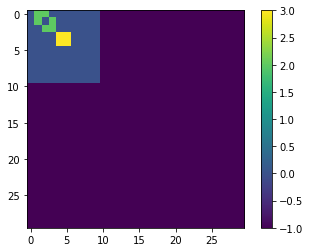

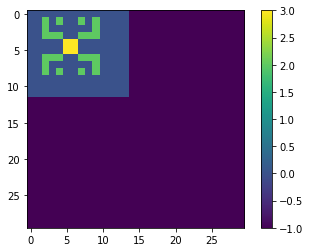

TEST


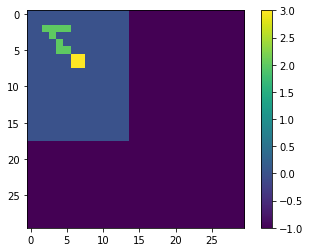

LOSS AT EPOCH 84: tf.Tensor(0.0033921632158321986, shape=(), dtype=float64)
TRAINING


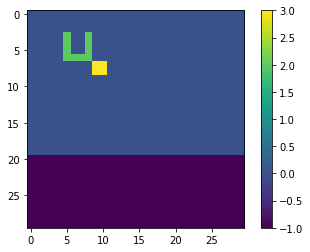

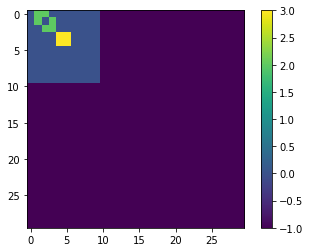

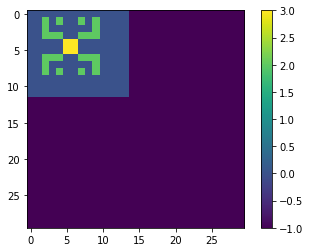

TEST


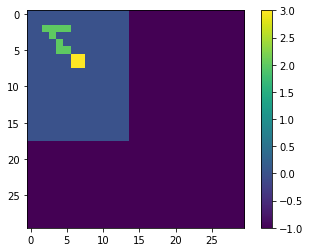

LOSS AT EPOCH 86: tf.Tensor(0.0033734997161693364, shape=(), dtype=float64)
TRAINING


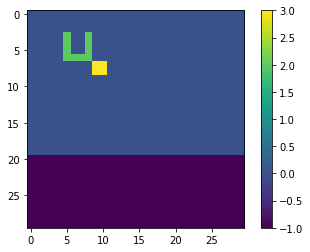

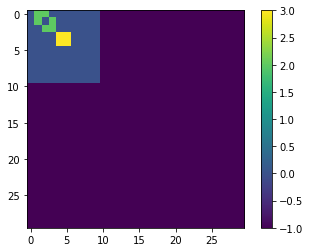

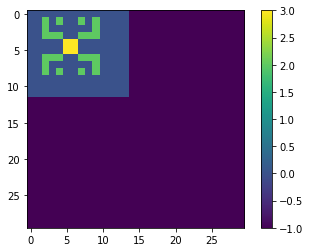

TEST


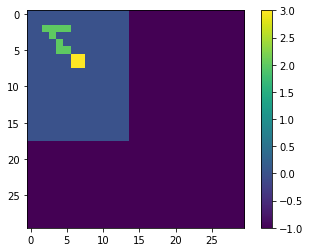

LOSS AT EPOCH 88: tf.Tensor(0.003356680460722924, shape=(), dtype=float64)
TRAINING


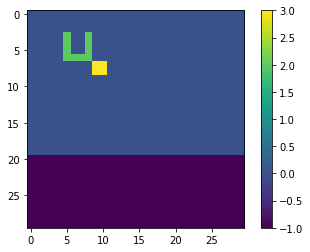

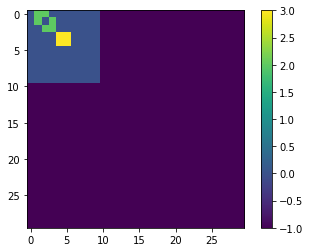

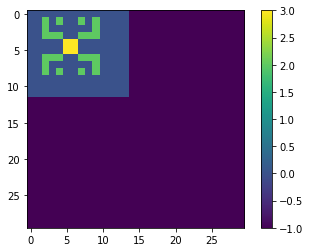

TEST


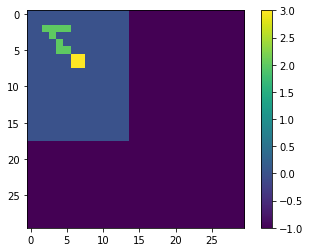

LOSS AT EPOCH 90: tf.Tensor(0.003341552871357745, shape=(), dtype=float64)
TRAINING


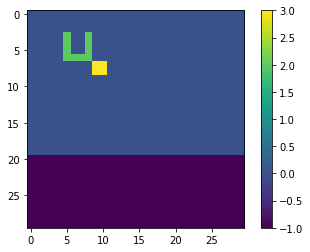

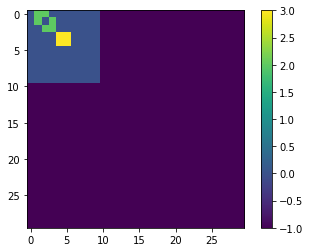

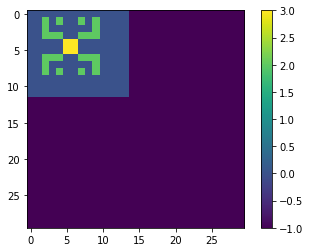

TEST


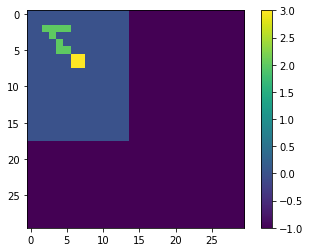

LOSS AT EPOCH 92: tf.Tensor(0.003327855419666258, shape=(), dtype=float64)
TRAINING


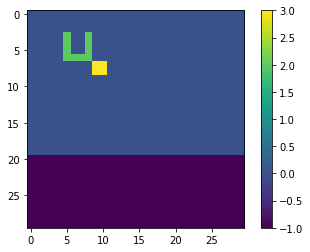

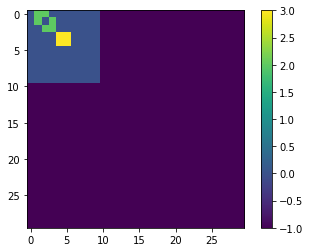

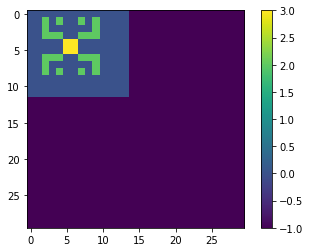

TEST


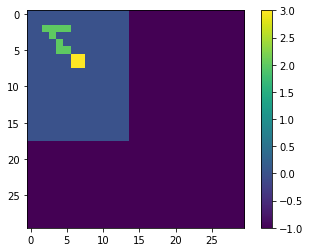

LOSS AT EPOCH 94: tf.Tensor(0.0033155902897161046, shape=(), dtype=float64)
TRAINING


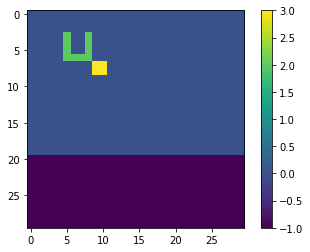

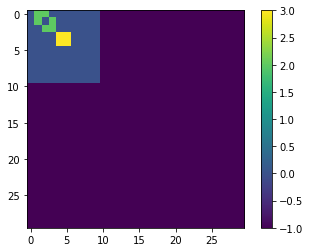

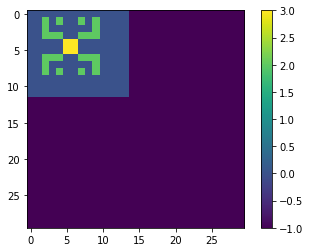

TEST


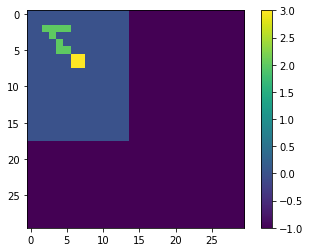

LOSS AT EPOCH 96: tf.Tensor(0.003304627250299571, shape=(), dtype=float64)
TRAINING


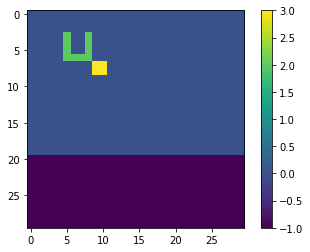

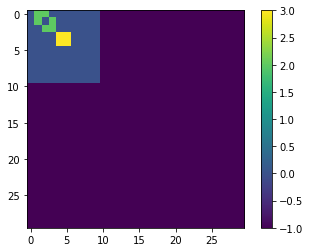

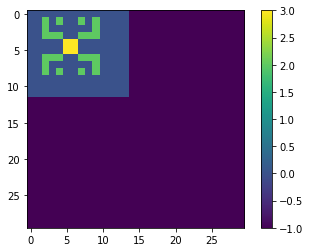

TEST


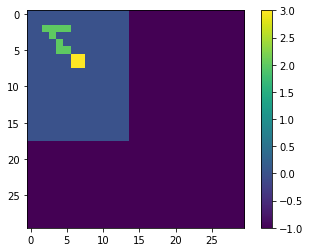

LOSS AT EPOCH 98: tf.Tensor(0.0032948217572336858, shape=(), dtype=float64)
TRAINING


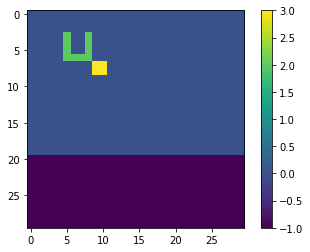

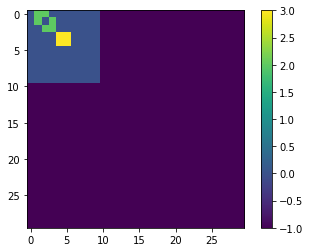

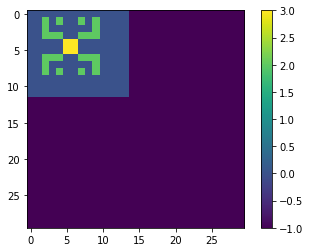

TEST


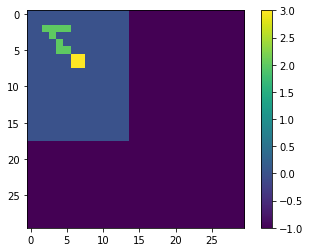

LOSS AT EPOCH 100: tf.Tensor(0.0032860654263089473, shape=(), dtype=float64)
TRAINING


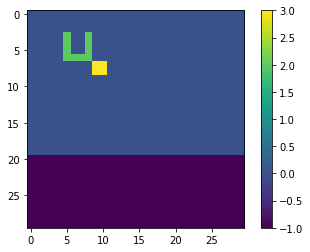

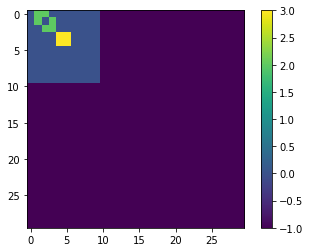

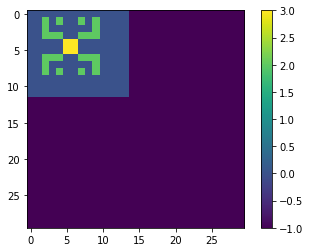

TEST


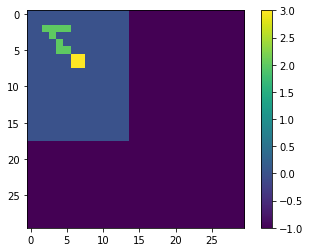

LOSS AT EPOCH 102: tf.Tensor(0.0032782328926661526, shape=(), dtype=float64)
TRAINING


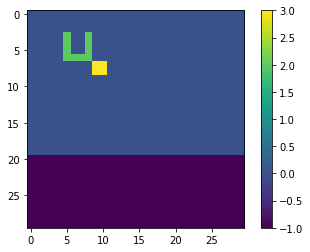

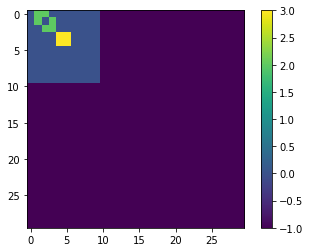

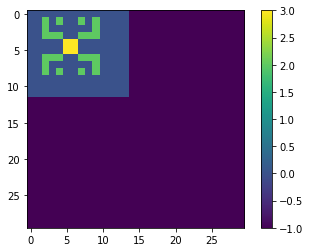

TEST


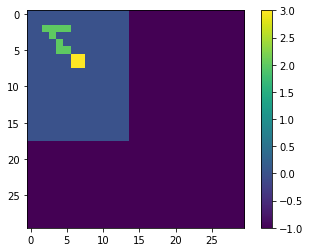

LOSS AT EPOCH 104: tf.Tensor(0.0032712606400957145, shape=(), dtype=float64)
TRAINING


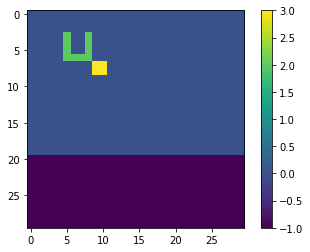

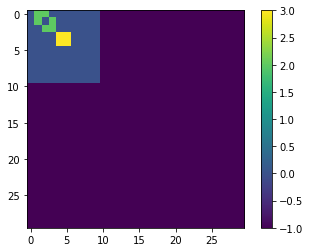

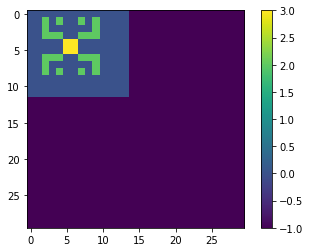

TEST


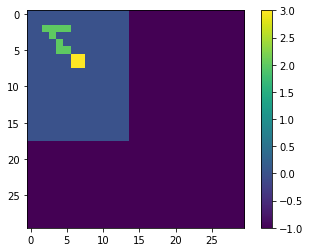

LOSS AT EPOCH 106: tf.Tensor(0.0032649016646591794, shape=(), dtype=float64)
TRAINING


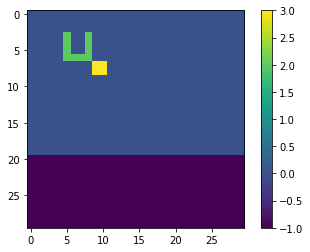

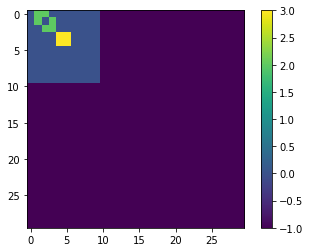

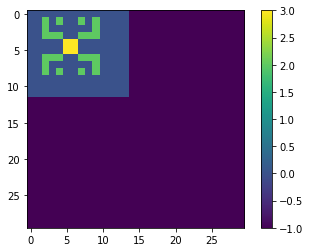

TEST


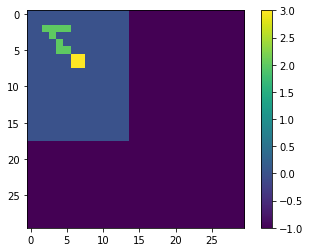

LOSS AT EPOCH 108: tf.Tensor(0.0032590261468927613, shape=(), dtype=float64)
TRAINING


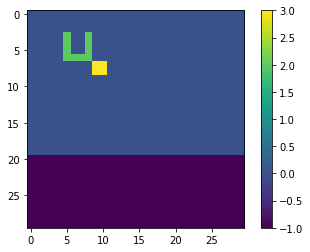

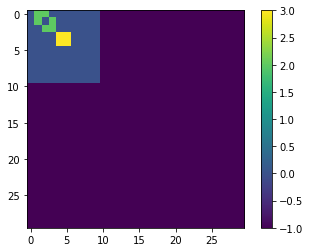

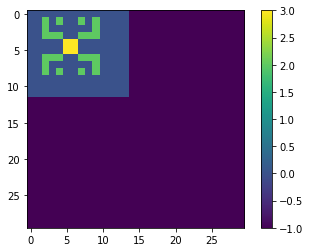

TEST


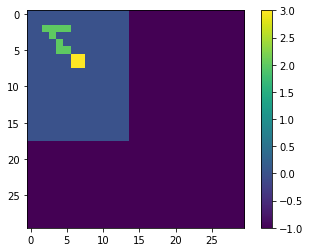

LOSS AT EPOCH 110: tf.Tensor(0.003253657616547579, shape=(), dtype=float64)
TRAINING


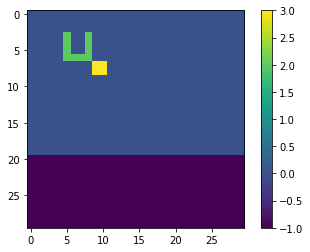

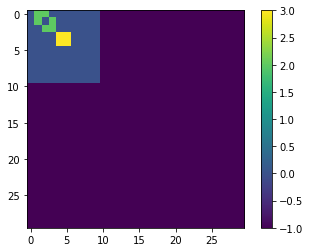

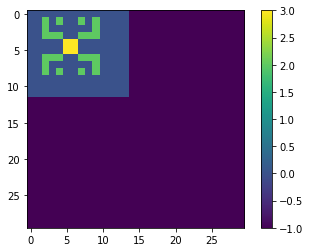

TEST


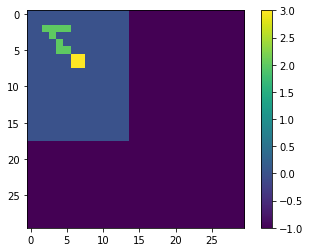

LOSS AT EPOCH 112: tf.Tensor(0.003248743781249551, shape=(), dtype=float64)
TRAINING


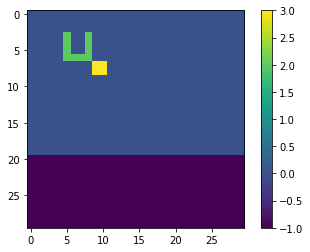

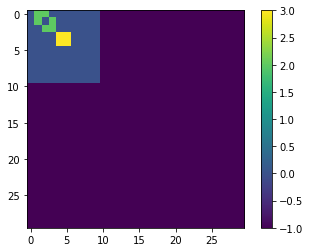

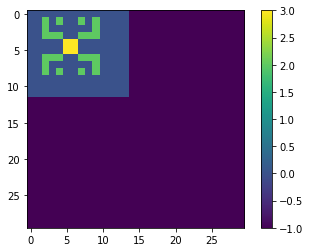

TEST


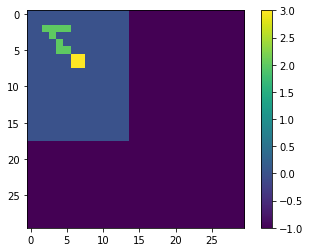

LOSS AT EPOCH 114: tf.Tensor(0.0032441926999716413, shape=(), dtype=float64)
TRAINING


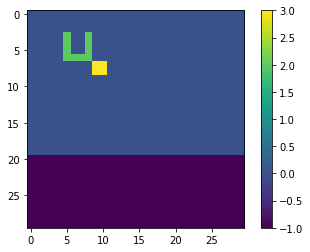

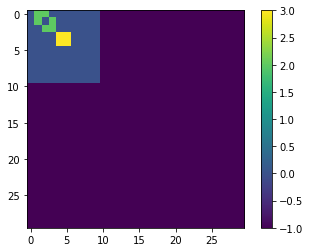

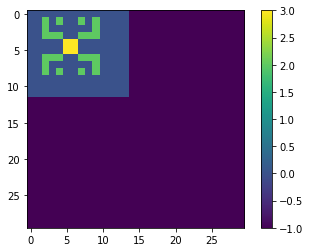

TEST


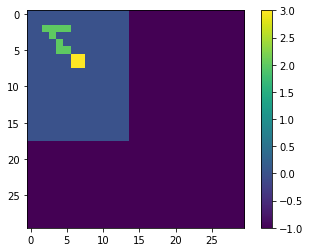

LOSS AT EPOCH 116: tf.Tensor(0.0032399653521125245, shape=(), dtype=float64)
TRAINING


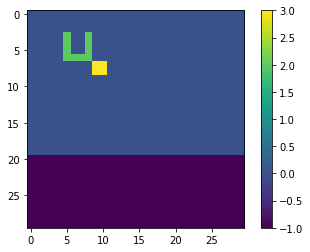

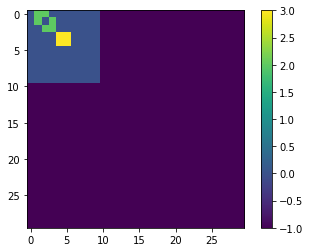

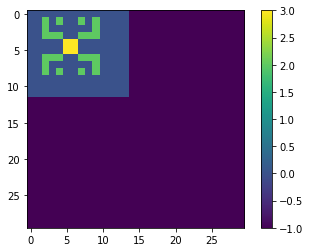

TEST


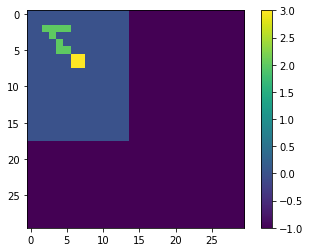

LOSS AT EPOCH 118: tf.Tensor(0.003236020096037886, shape=(), dtype=float64)
TRAINING


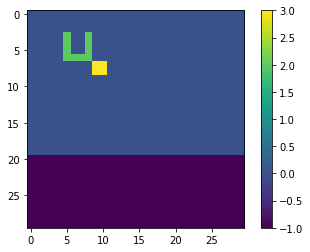

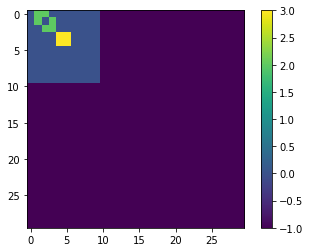

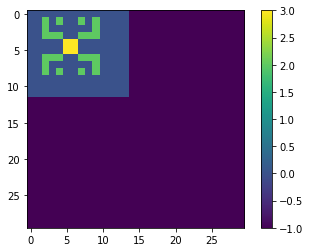

TEST


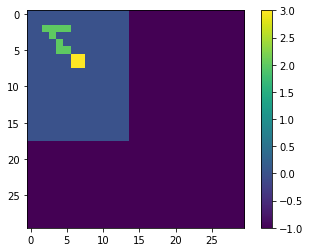

LOSS AT EPOCH 120: tf.Tensor(0.003232318425550027, shape=(), dtype=float64)
TRAINING


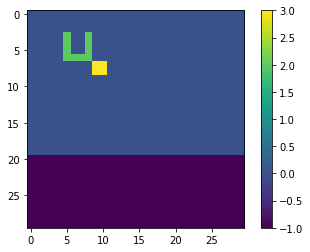

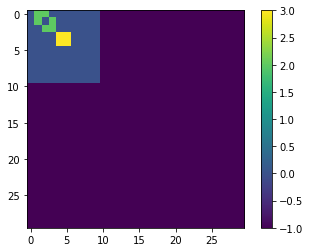

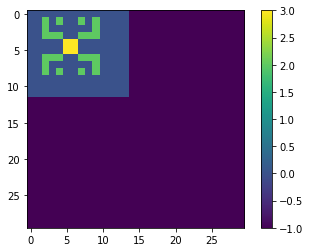

TEST


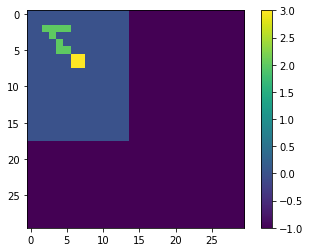

LOSS AT EPOCH 122: tf.Tensor(0.0032288626201782363, shape=(), dtype=float64)
TRAINING


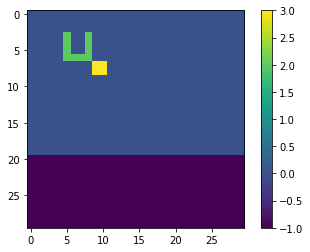

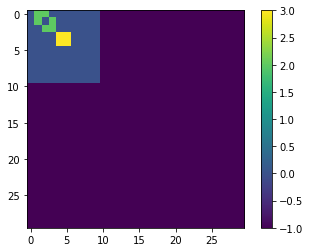

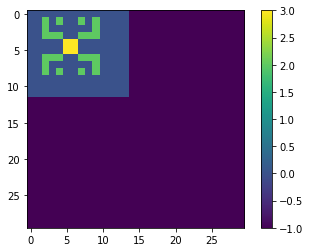

TEST


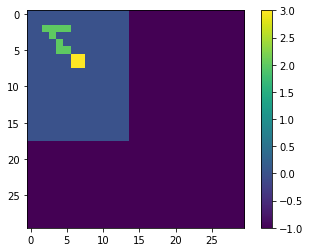

LOSS AT EPOCH 124: tf.Tensor(0.0032257070306062315, shape=(), dtype=float64)
TRAINING


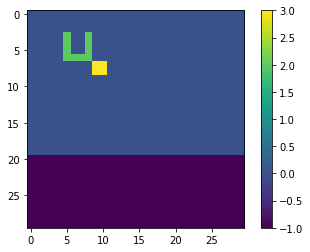

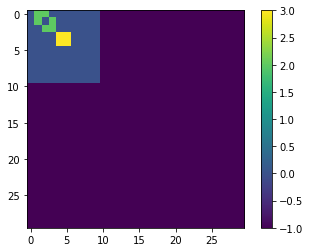

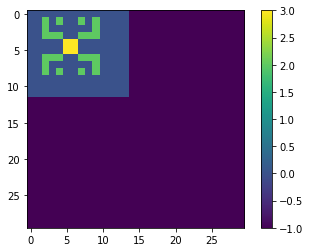

TEST


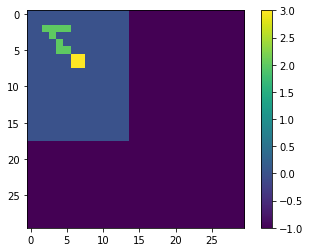

LOSS AT EPOCH 126: tf.Tensor(0.003222804692520478, shape=(), dtype=float64)
TRAINING


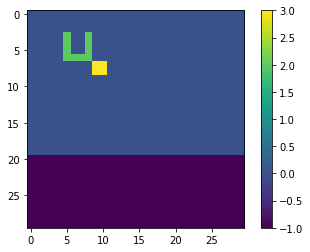

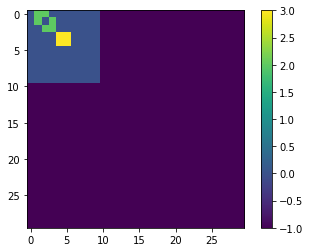

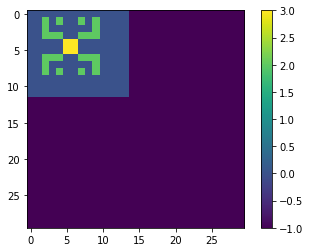

TEST


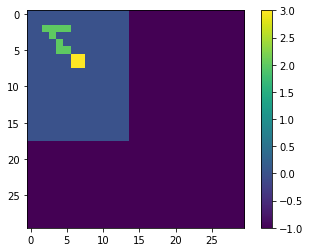

LOSS AT EPOCH 128: tf.Tensor(0.0032201289567387915, shape=(), dtype=float64)
TRAINING


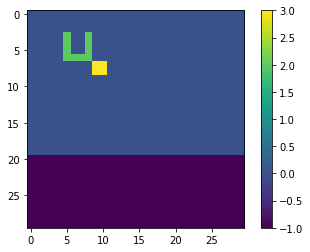

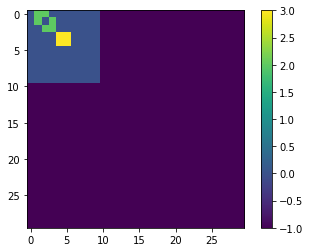

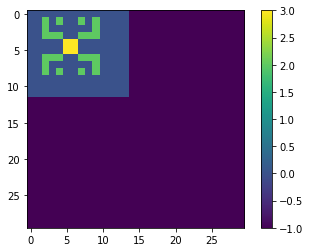

TEST


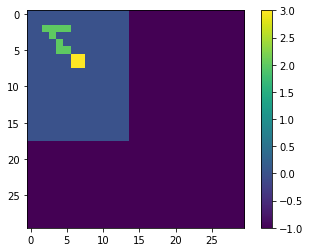

LOSS AT EPOCH 130: tf.Tensor(0.0032176500718039884, shape=(), dtype=float64)
TRAINING


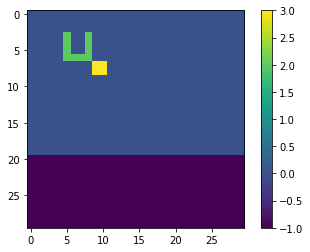

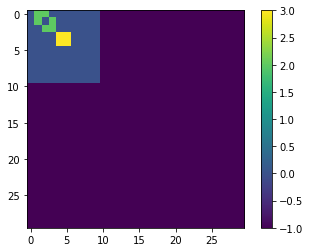

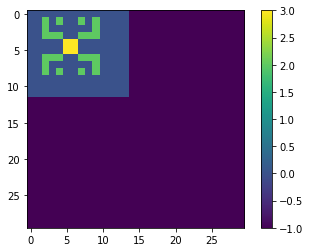

TEST


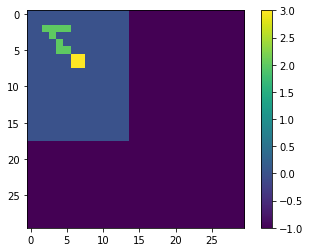

LOSS AT EPOCH 132: tf.Tensor(0.003215350385678063, shape=(), dtype=float64)
TRAINING


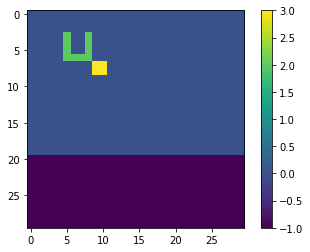

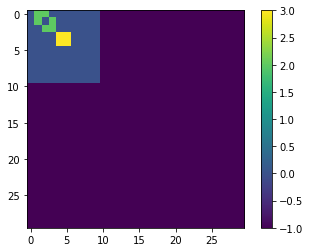

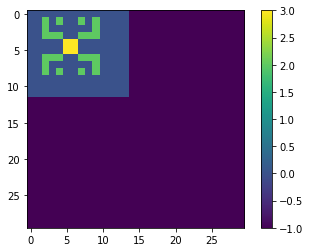

TEST


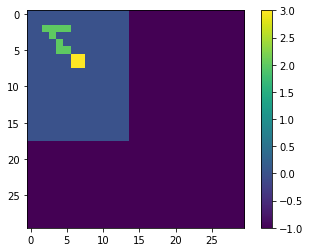

LOSS AT EPOCH 134: tf.Tensor(0.0032132056467133164, shape=(), dtype=float64)
TRAINING


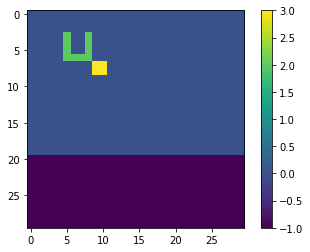

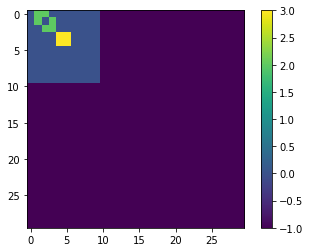

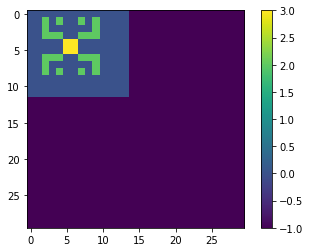

TEST


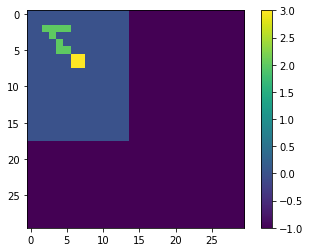

LOSS AT EPOCH 136: tf.Tensor(0.0032110230395686174, shape=(), dtype=float64)
TRAINING


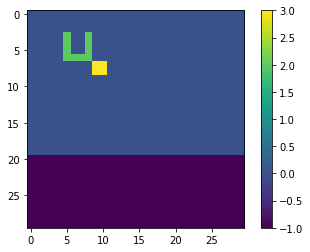

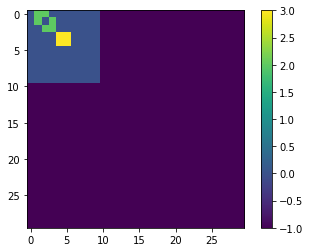

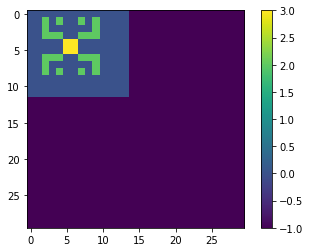

TEST


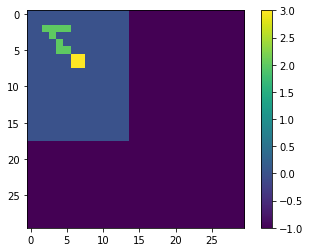

LOSS AT EPOCH 138: tf.Tensor(0.0032089533102795643, shape=(), dtype=float64)
TRAINING


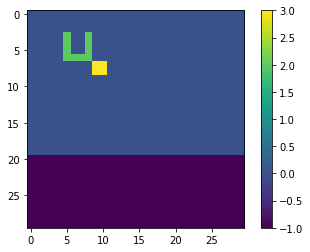

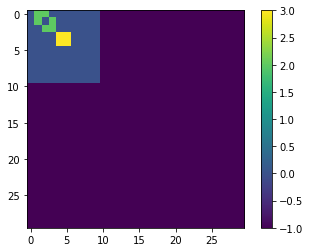

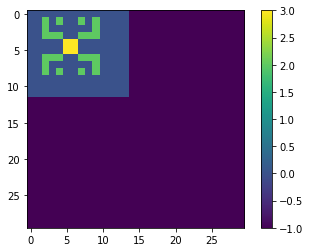

TEST


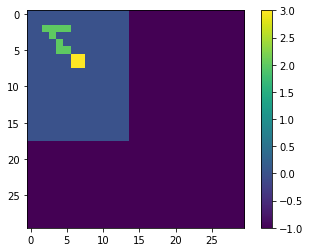

LOSS AT EPOCH 140: tf.Tensor(0.0032070033601047966, shape=(), dtype=float64)
TRAINING


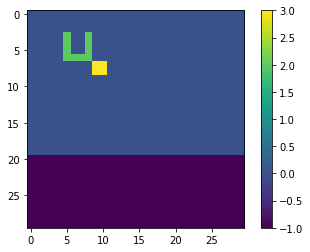

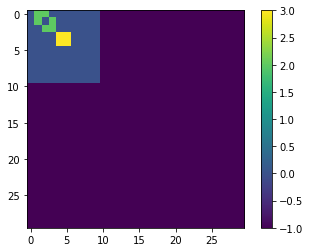

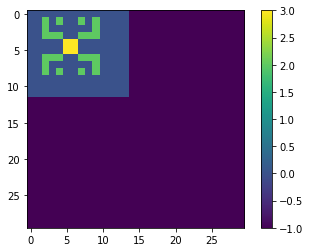

TEST


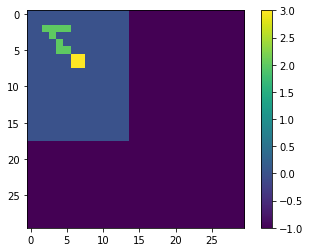

LOSS AT EPOCH 142: tf.Tensor(0.0032049134858088916, shape=(), dtype=float64)
TRAINING


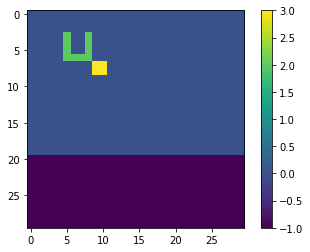

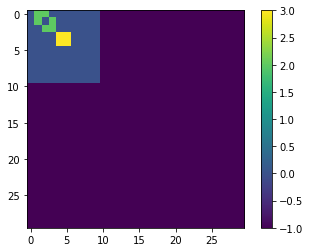

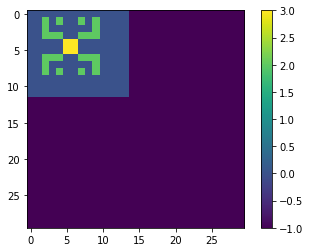

TEST


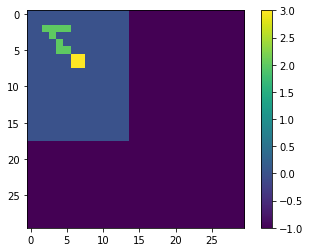

LOSS AT EPOCH 144: tf.Tensor(0.0032024899107073075, shape=(), dtype=float64)
TRAINING


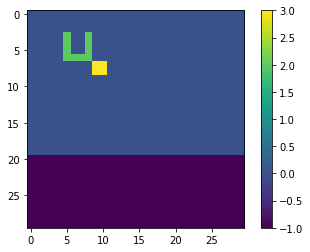

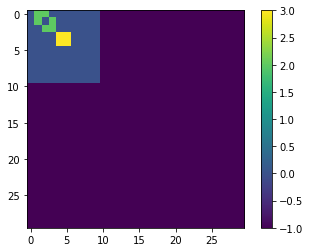

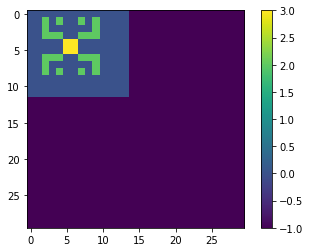

TEST


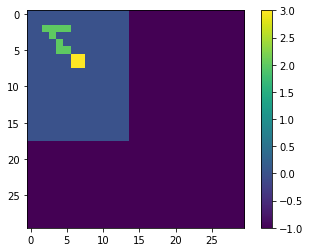

LOSS AT EPOCH 146: tf.Tensor(0.0032001142303531623, shape=(), dtype=float64)
TRAINING


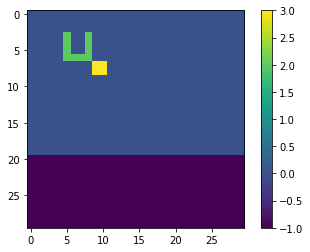

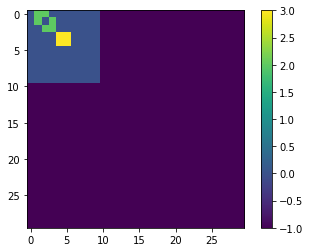

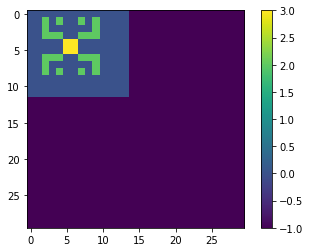

TEST


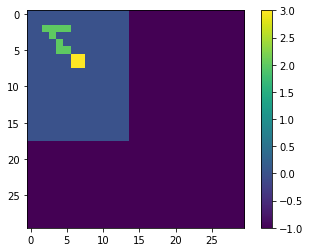

LOSS AT EPOCH 148: tf.Tensor(0.003197917087683032, shape=(), dtype=float64)
TRAINING


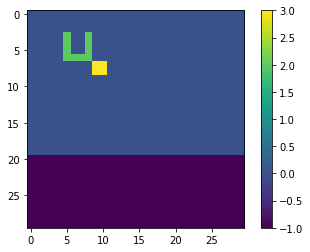

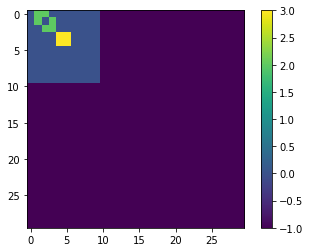

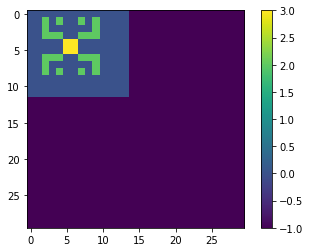

TEST


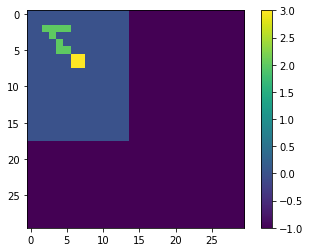

LOSS AT EPOCH 150: tf.Tensor(0.0031959411552662884, shape=(), dtype=float64)
TRAINING


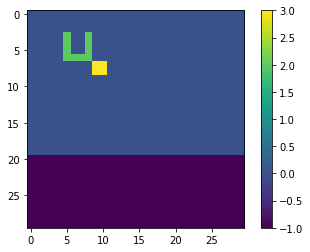

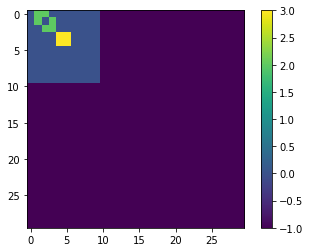

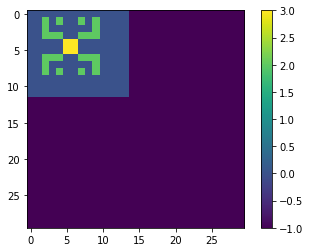

TEST


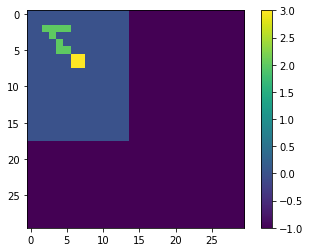

LOSS AT EPOCH 152: tf.Tensor(0.0031941572877567923, shape=(), dtype=float64)
TRAINING


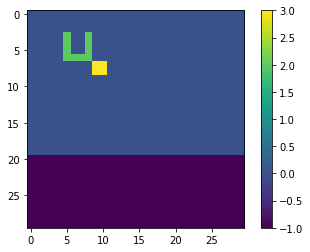

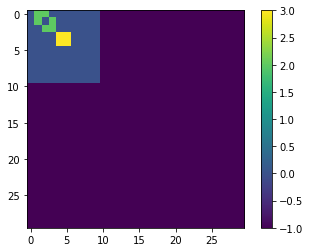

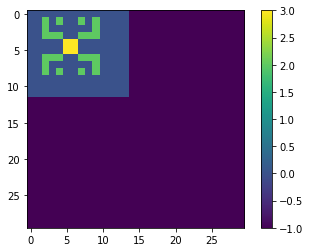

TEST


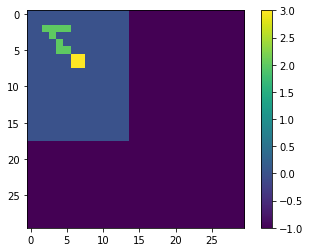

LOSS AT EPOCH 154: tf.Tensor(0.003192550694329329, shape=(), dtype=float64)
TRAINING


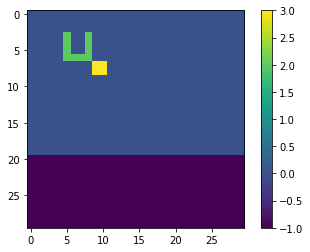

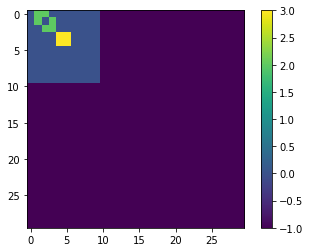

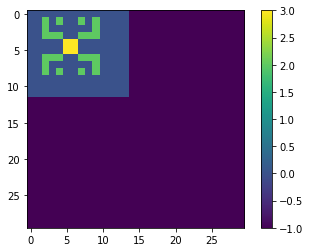

TEST


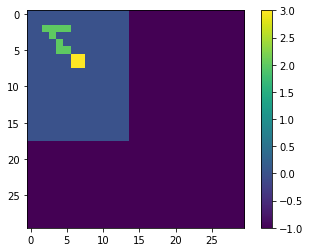

LOSS AT EPOCH 156: tf.Tensor(0.003191084952685506, shape=(), dtype=float64)
TRAINING


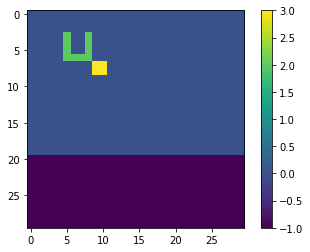

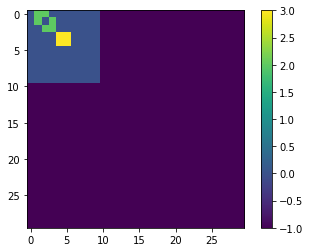

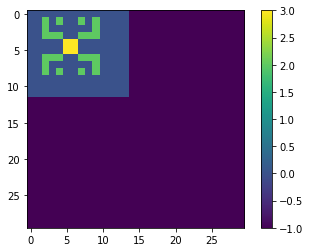

TEST


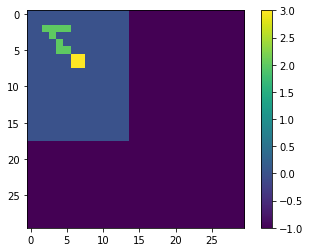

LOSS AT EPOCH 158: tf.Tensor(0.0031897381726771383, shape=(), dtype=float64)
TRAINING


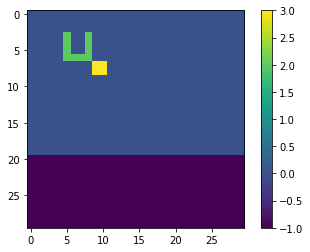

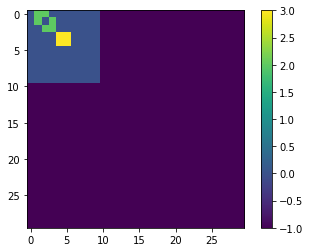

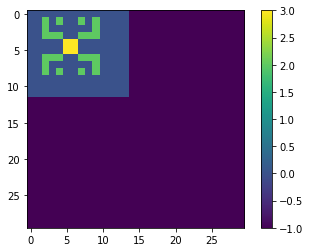

TEST


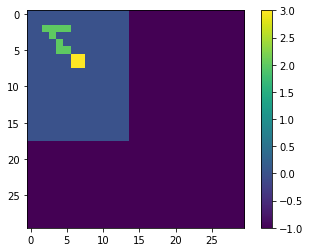

LOSS AT EPOCH 160: tf.Tensor(0.0031885202070231463, shape=(), dtype=float64)
TRAINING


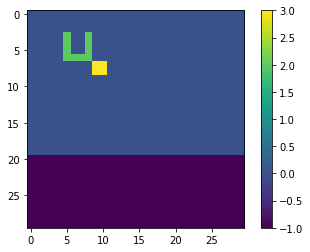

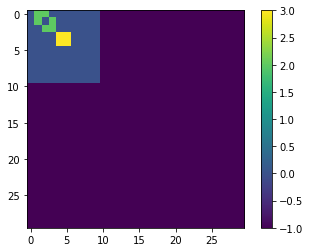

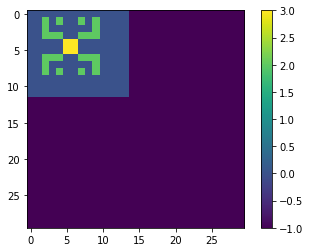

TEST


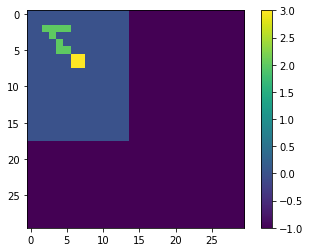

LOSS AT EPOCH 162: tf.Tensor(0.0031873924784270404, shape=(), dtype=float64)
TRAINING


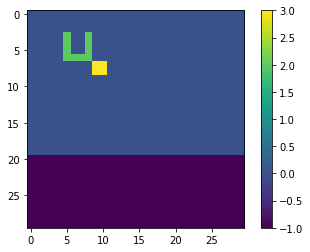

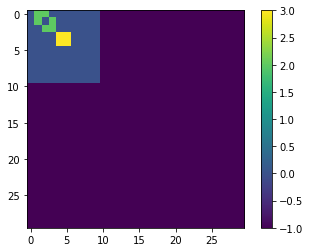

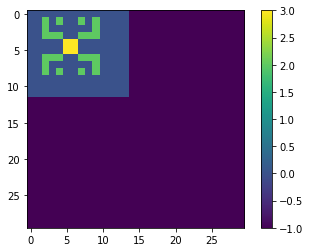

TEST


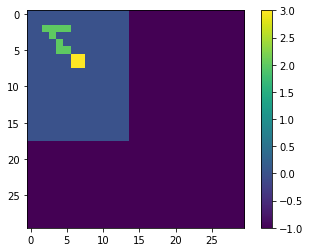

LOSS AT EPOCH 164: tf.Tensor(0.0031863541910798843, shape=(), dtype=float64)
TRAINING


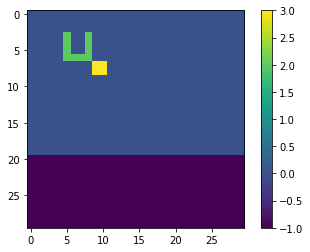

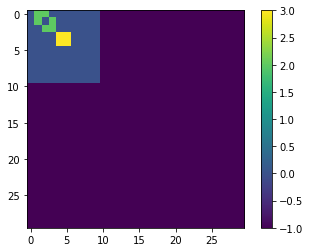

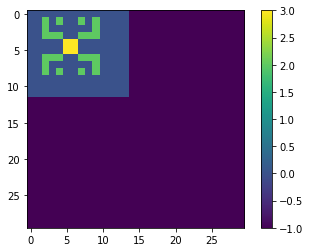

TEST


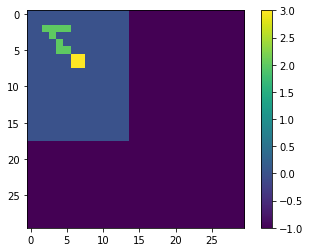

LOSS AT EPOCH 166: tf.Tensor(0.003185392166365919, shape=(), dtype=float64)
TRAINING


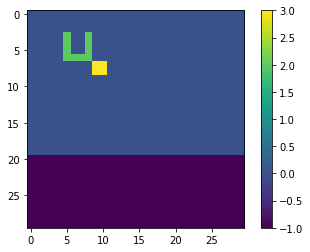

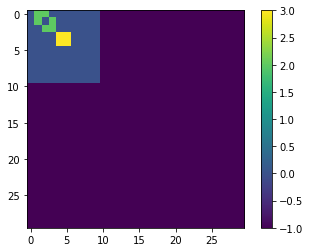

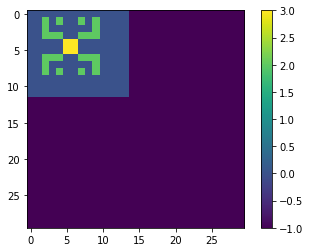

TEST


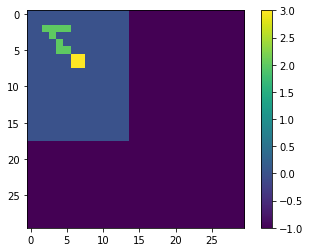

LOSS AT EPOCH 168: tf.Tensor(0.003184474197862648, shape=(), dtype=float64)
TRAINING


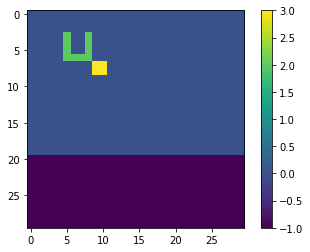

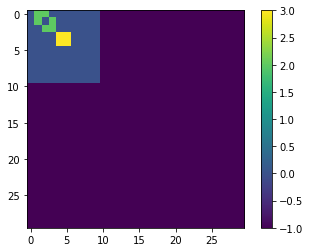

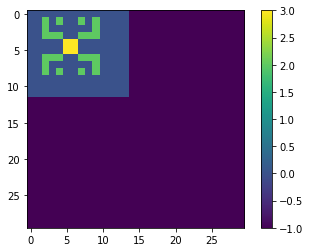

TEST


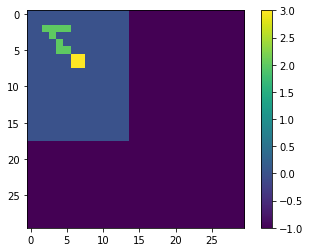

LOSS AT EPOCH 170: tf.Tensor(0.0031836326365764244, shape=(), dtype=float64)
TRAINING


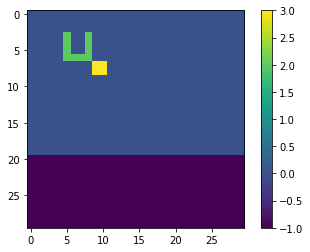

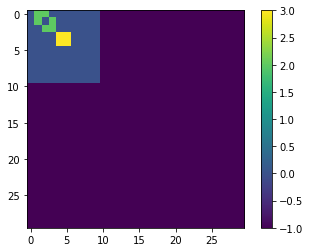

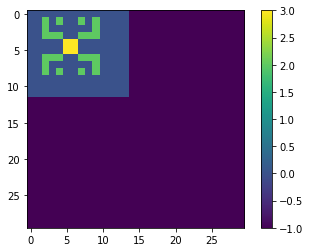

TEST


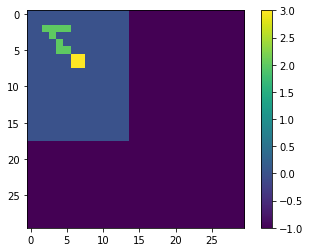

LOSS AT EPOCH 172: tf.Tensor(0.003182835471004304, shape=(), dtype=float64)
TRAINING


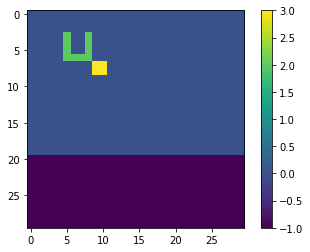

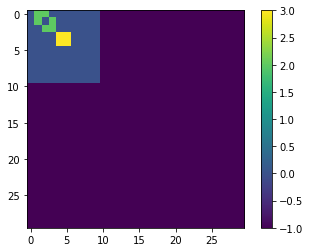

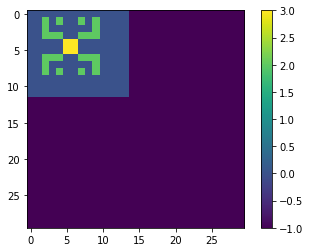

TEST


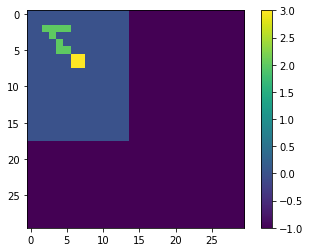

LOSS AT EPOCH 174: tf.Tensor(0.0031820890133728743, shape=(), dtype=float64)
TRAINING


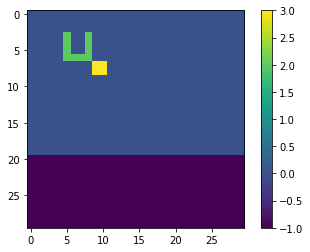

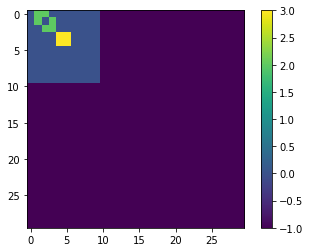

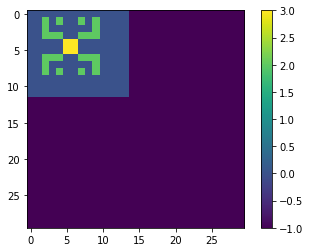

TEST


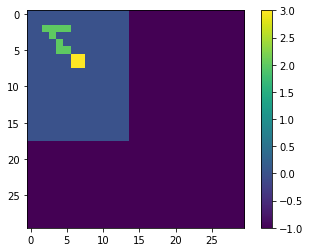

LOSS AT EPOCH 176: tf.Tensor(0.003181370968461669, shape=(), dtype=float64)
TRAINING


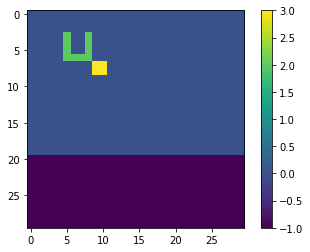

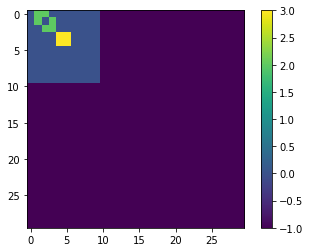

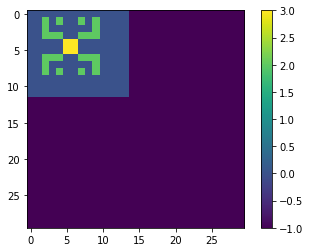

TEST


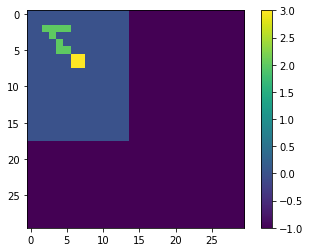

LOSS AT EPOCH 178: tf.Tensor(0.003180675367480307, shape=(), dtype=float64)
TRAINING


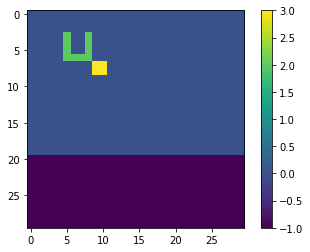

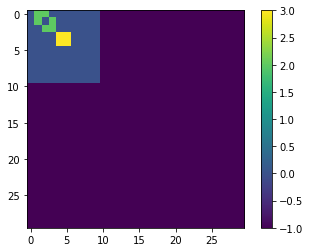

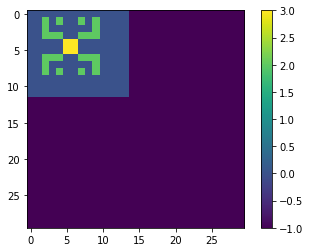

TEST


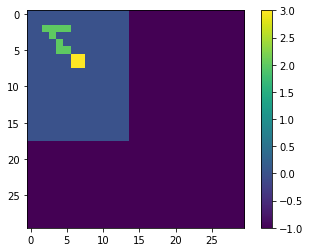

LOSS AT EPOCH 180: tf.Tensor(0.0031800162032052776, shape=(), dtype=float64)
TRAINING


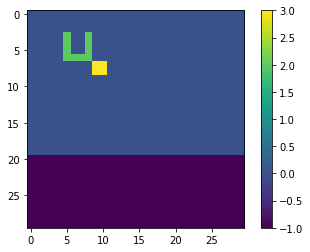

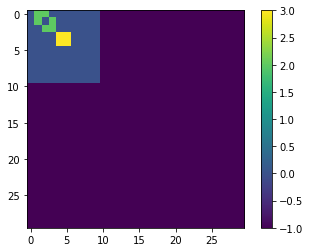

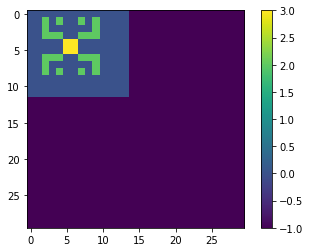

TEST


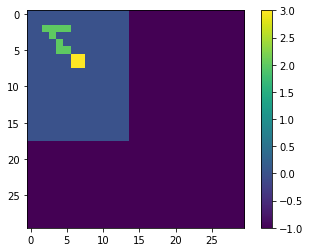

LOSS AT EPOCH 182: tf.Tensor(0.0031793570377174015, shape=(), dtype=float64)
TRAINING


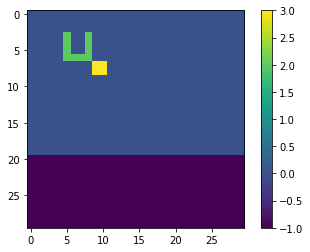

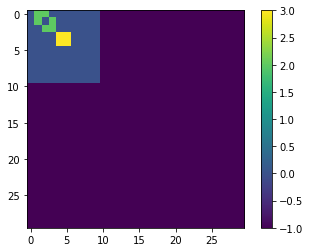

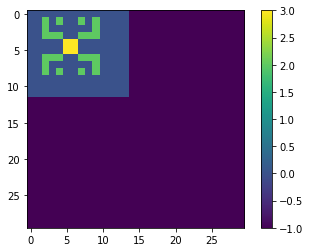

TEST


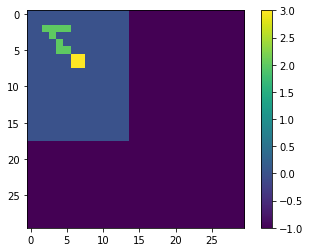

LOSS AT EPOCH 184: tf.Tensor(0.0031787129777848854, shape=(), dtype=float64)
TRAINING


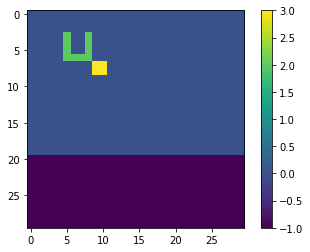

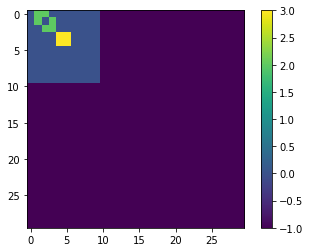

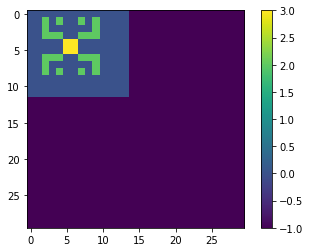

TEST


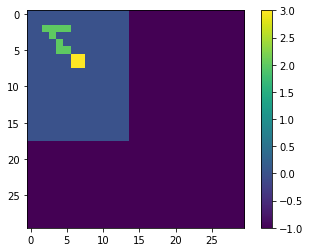

LOSS AT EPOCH 186: tf.Tensor(0.0031780842053144402, shape=(), dtype=float64)
TRAINING


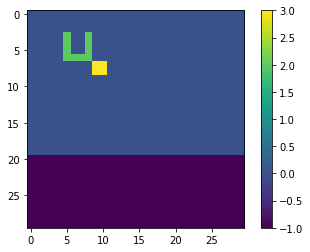

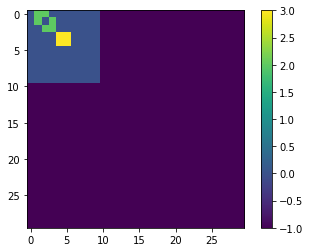

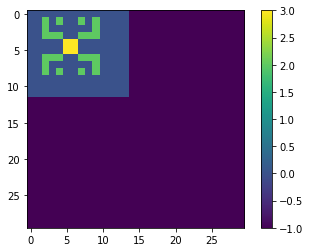

TEST


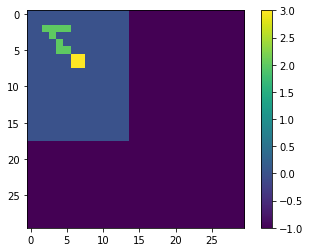

LOSS AT EPOCH 188: tf.Tensor(0.003177464168762547, shape=(), dtype=float64)
TRAINING


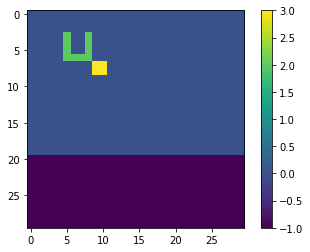

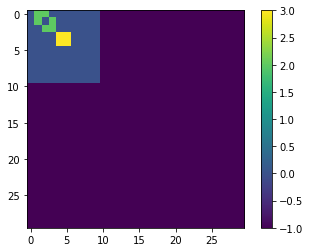

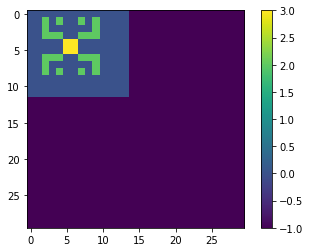

TEST


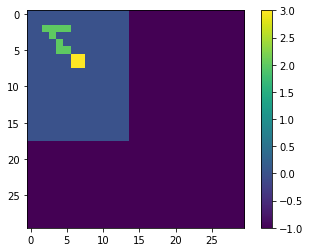

LOSS AT EPOCH 190: tf.Tensor(0.0031768594479830627, shape=(), dtype=float64)
TRAINING


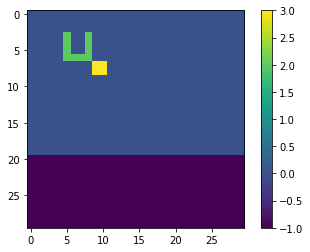

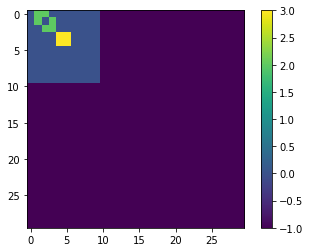

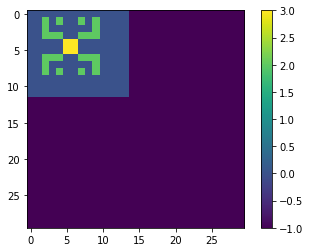

TEST


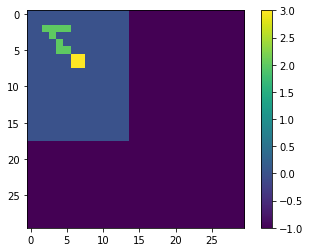

LOSS AT EPOCH 192: tf.Tensor(0.0031762747343392003, shape=(), dtype=float64)
TRAINING


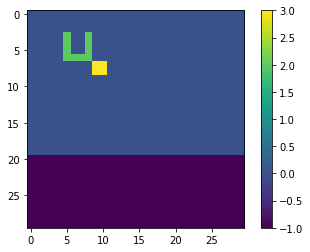

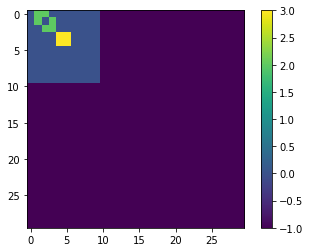

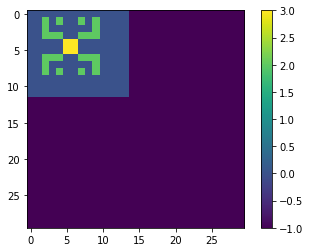

TEST


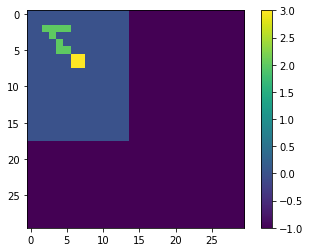

LOSS AT EPOCH 194: tf.Tensor(0.003175694113134884, shape=(), dtype=float64)
TRAINING


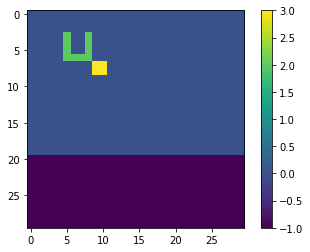

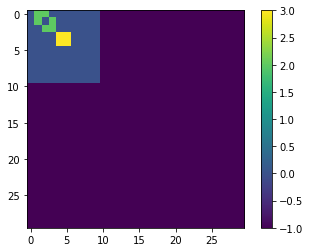

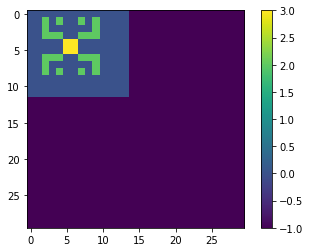

TEST


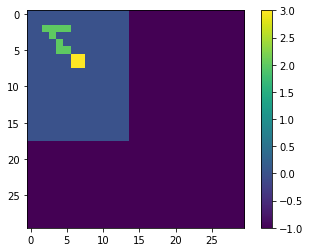

LOSS AT EPOCH 196: tf.Tensor(0.0031751158983678476, shape=(), dtype=float64)
TRAINING


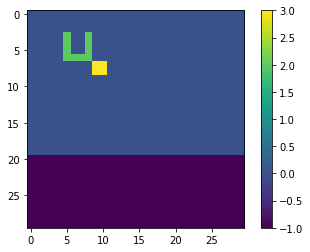

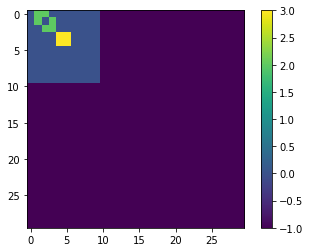

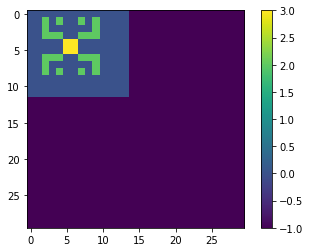

TEST


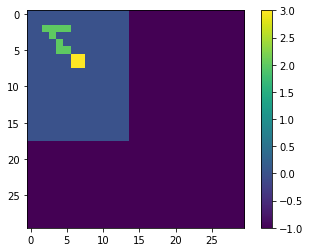

LOSS AT EPOCH 198: tf.Tensor(0.003174543168880366, shape=(), dtype=float64)
TRAINING


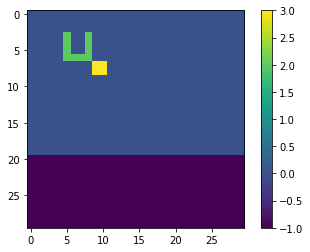

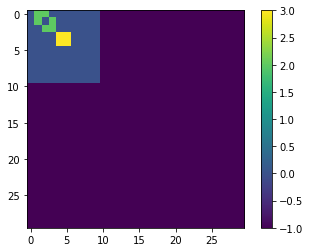

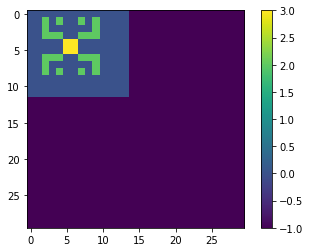

TEST


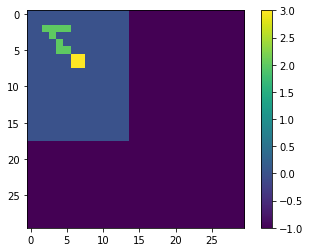

LOSS AT EPOCH 200: tf.Tensor(0.003173957349048563, shape=(), dtype=float64)
TRAINING


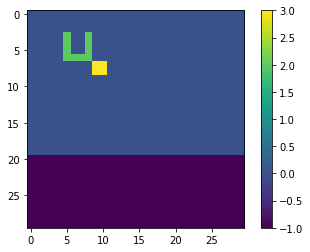

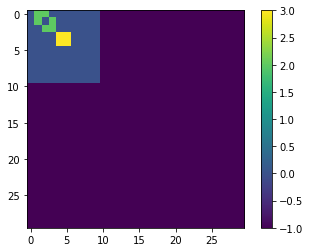

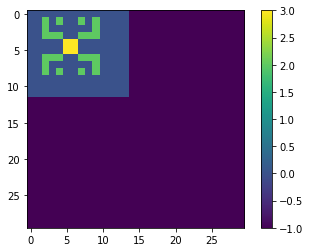

TEST


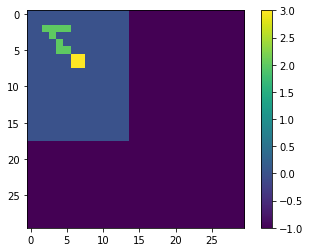

LOSS AT EPOCH 202: tf.Tensor(0.003173376322661687, shape=(), dtype=float64)
TRAINING


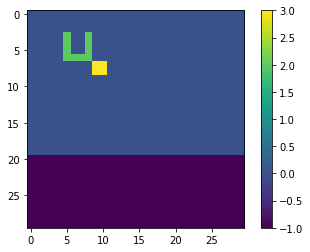

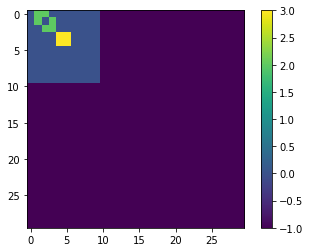

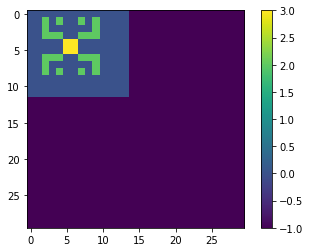

TEST


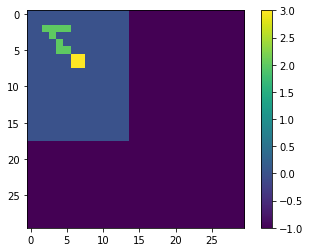

LOSS AT EPOCH 204: tf.Tensor(0.0031728148038769593, shape=(), dtype=float64)
TRAINING


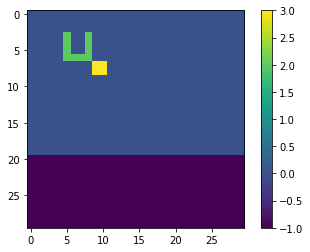

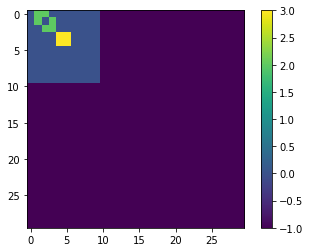

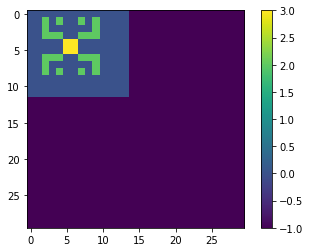

TEST


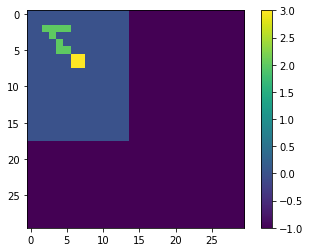

LOSS AT EPOCH 206: tf.Tensor(0.0031722823293104823, shape=(), dtype=float64)
TRAINING


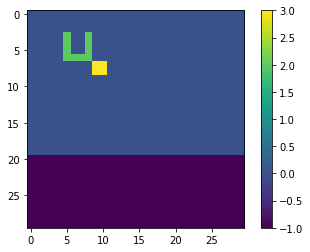

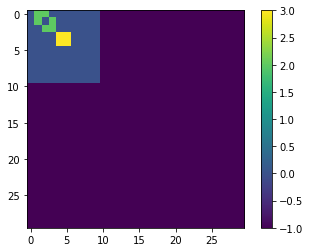

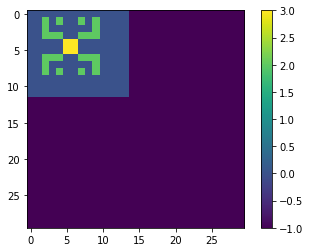

TEST


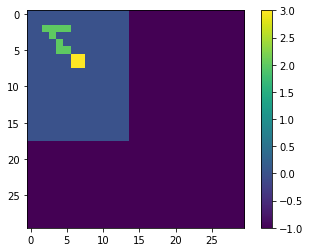

LOSS AT EPOCH 208: tf.Tensor(0.0031717490781016443, shape=(), dtype=float64)
TRAINING


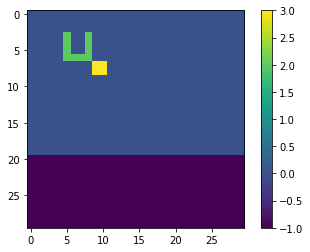

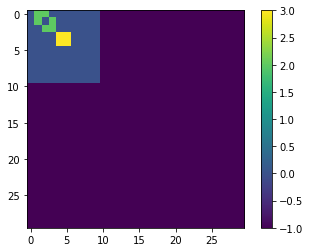

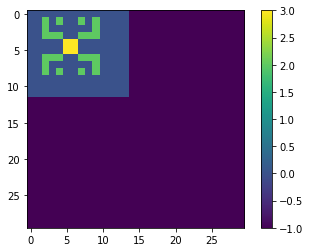

TEST


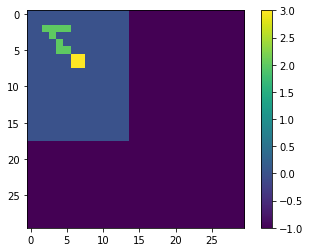

LOSS AT EPOCH 210: tf.Tensor(0.00317120404593984, shape=(), dtype=float64)
TRAINING


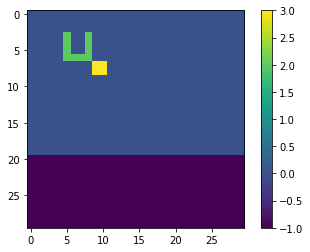

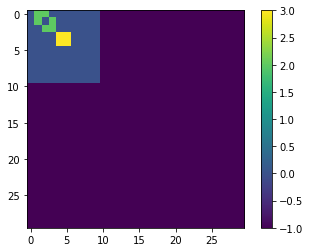

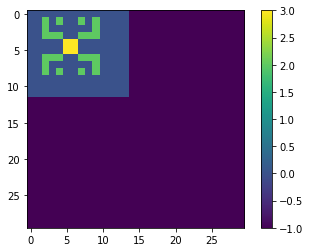

TEST


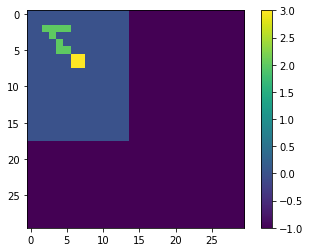

LOSS AT EPOCH 212: tf.Tensor(0.0031706638608217466, shape=(), dtype=float64)
TRAINING


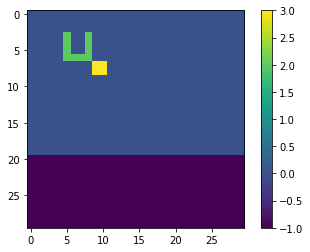

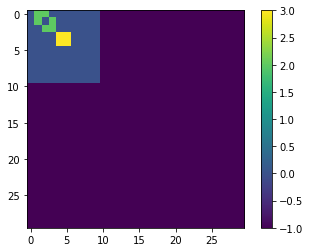

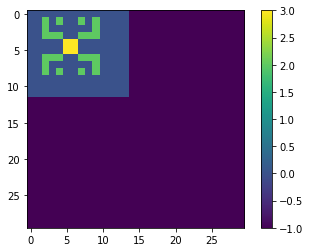

TEST


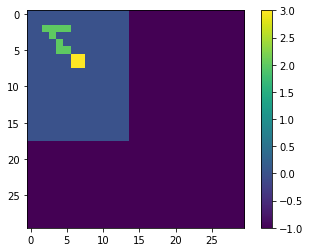

LOSS AT EPOCH 214: tf.Tensor(0.003170118369371342, shape=(), dtype=float64)
TRAINING


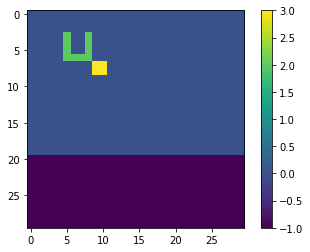

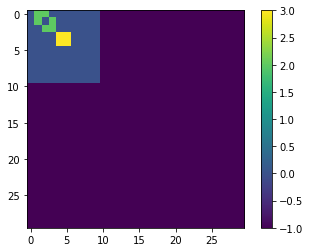

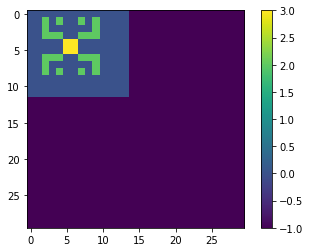

TEST


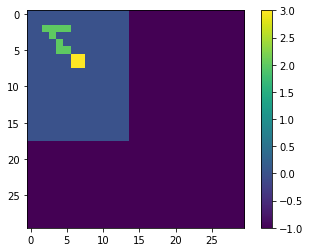

LOSS AT EPOCH 216: tf.Tensor(0.0031695776719008546, shape=(), dtype=float64)
TRAINING


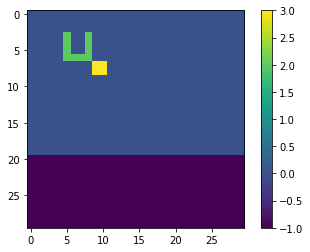

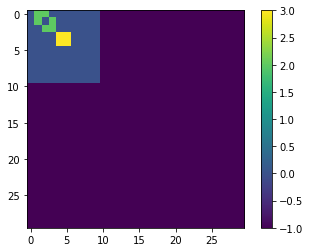

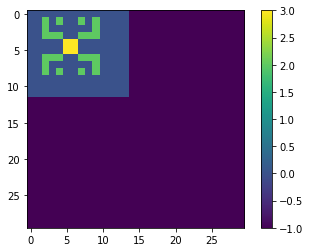

TEST


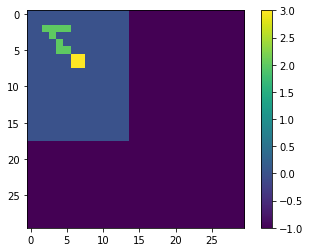

LOSS AT EPOCH 218: tf.Tensor(0.003169031492036134, shape=(), dtype=float64)
TRAINING


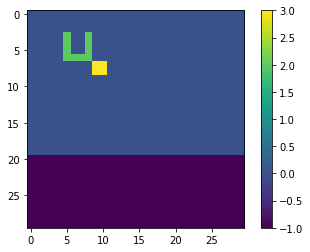

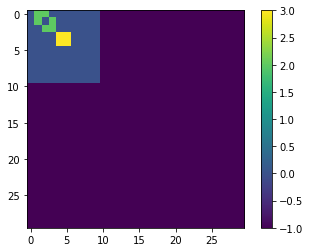

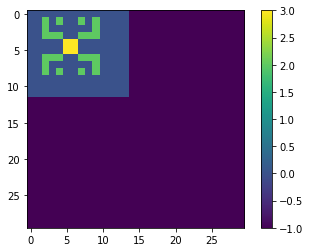

TEST


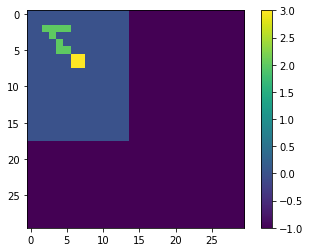

LOSS AT EPOCH 220: tf.Tensor(0.0031684752760507764, shape=(), dtype=float64)
TRAINING


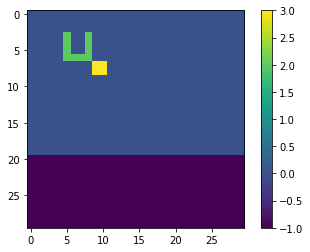

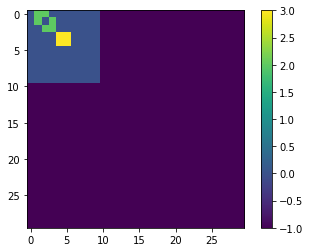

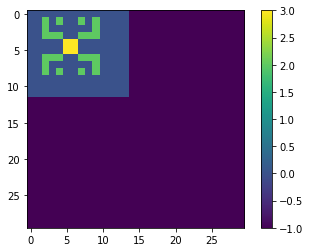

TEST


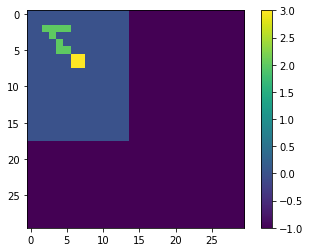

LOSS AT EPOCH 222: tf.Tensor(0.0031679227682501086, shape=(), dtype=float64)
TRAINING


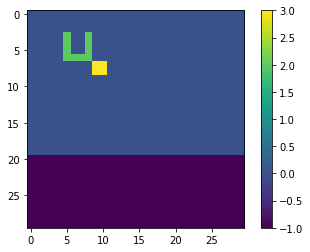

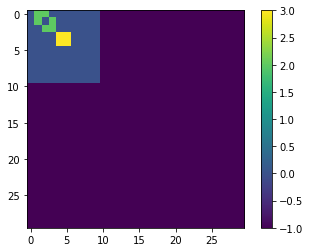

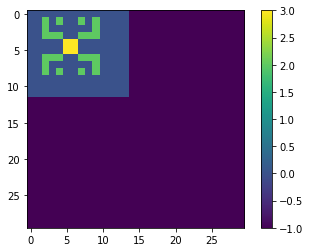

TEST


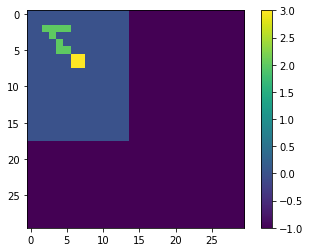

LOSS AT EPOCH 224: tf.Tensor(0.003167380071056038, shape=(), dtype=float64)
TRAINING


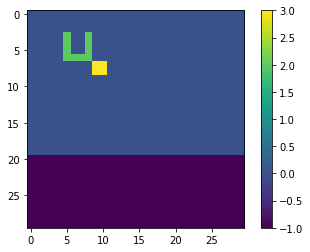

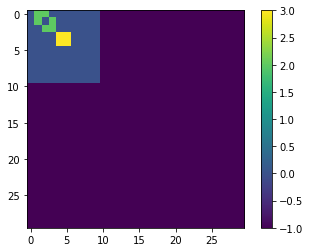

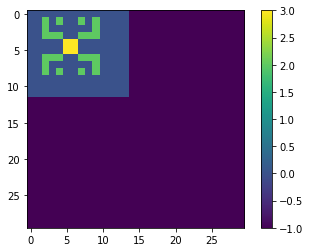

TEST


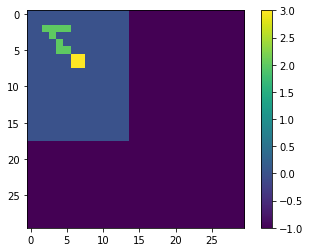

LOSS AT EPOCH 226: tf.Tensor(0.003166840472968149, shape=(), dtype=float64)
TRAINING


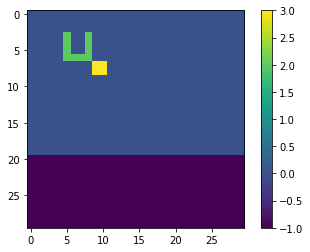

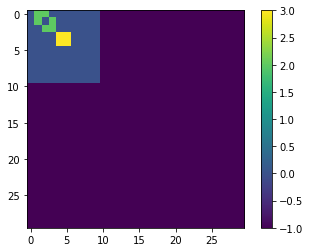

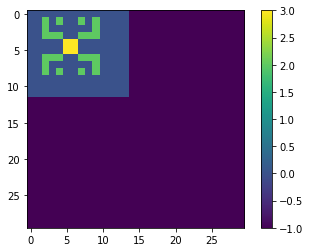

TEST


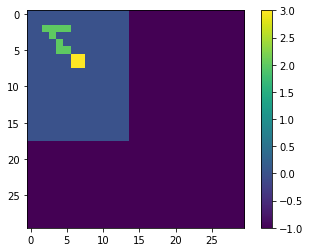

LOSS AT EPOCH 228: tf.Tensor(0.0031662795551212577, shape=(), dtype=float64)
TRAINING


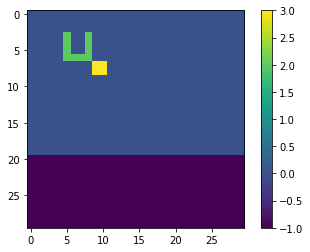

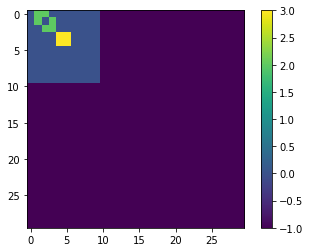

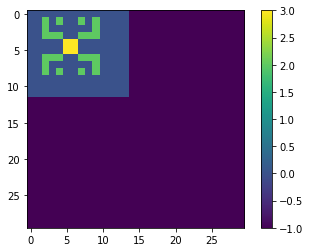

TEST


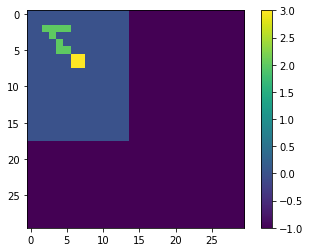

LOSS AT EPOCH 230: tf.Tensor(0.003165724357890144, shape=(), dtype=float64)
TRAINING


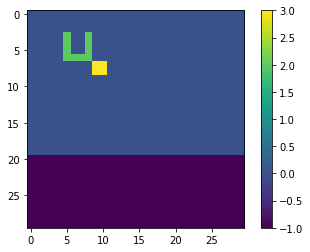

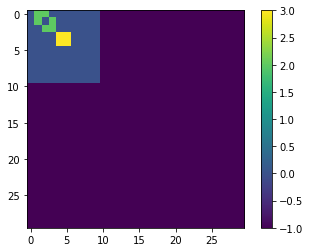

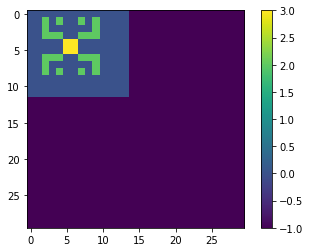

TEST


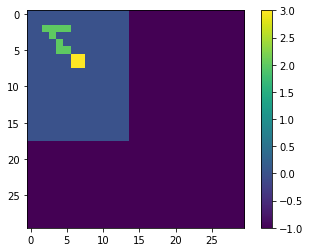

LOSS AT EPOCH 232: tf.Tensor(0.0031651656329746793, shape=(), dtype=float64)
TRAINING


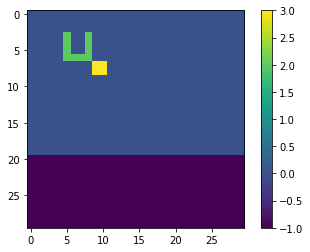

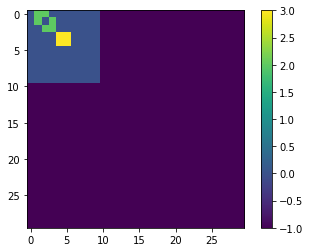

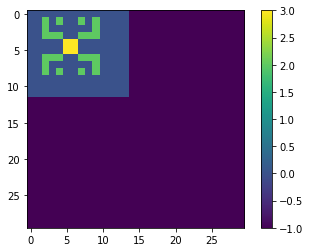

TEST


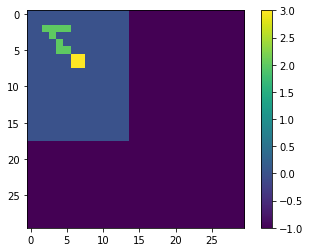

LOSS AT EPOCH 234: tf.Tensor(0.0031646073306332775, shape=(), dtype=float64)
TRAINING


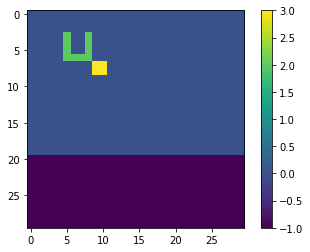

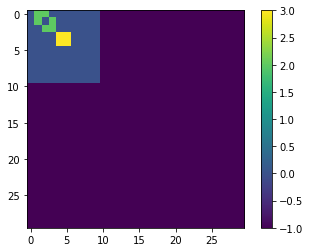

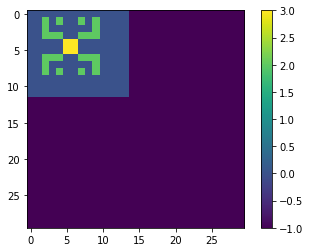

TEST


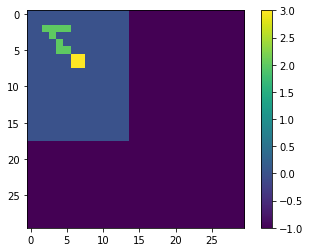

LOSS AT EPOCH 236: tf.Tensor(0.003164030889117416, shape=(), dtype=float64)
TRAINING


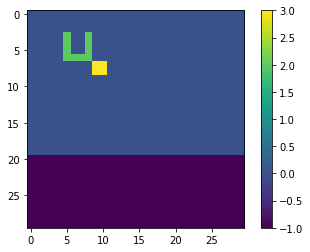

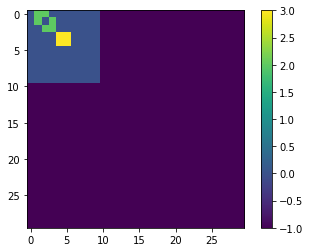

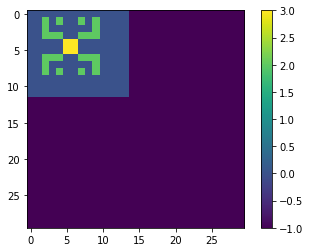

TEST


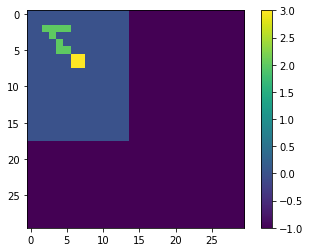

LOSS AT EPOCH 238: tf.Tensor(0.0031634468797897062, shape=(), dtype=float64)
TRAINING


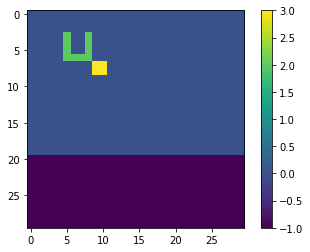

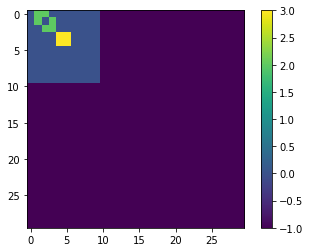

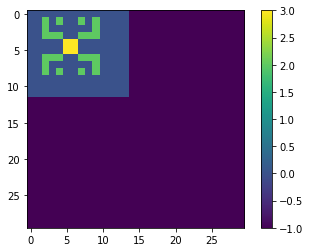

TEST


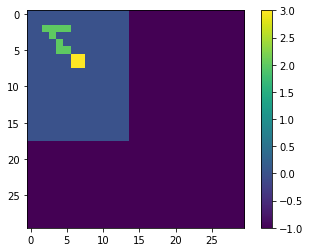

LOSS AT EPOCH 240: tf.Tensor(0.003162857135615085, shape=(), dtype=float64)
TRAINING


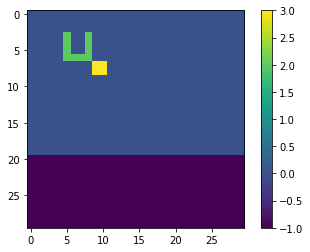

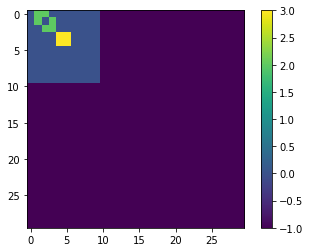

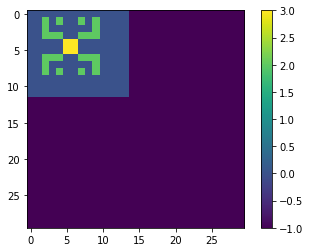

TEST


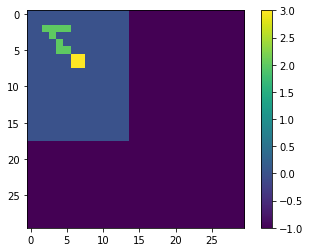

LOSS AT EPOCH 242: tf.Tensor(0.003162255842530707, shape=(), dtype=float64)
TRAINING


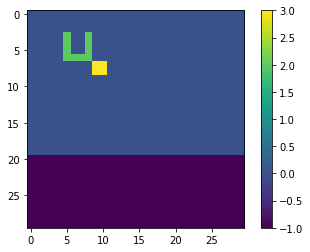

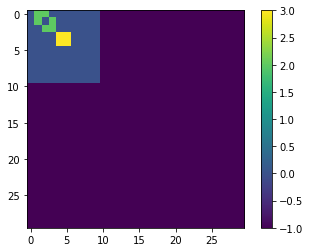

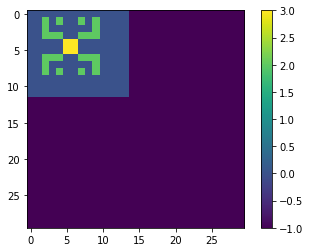

TEST


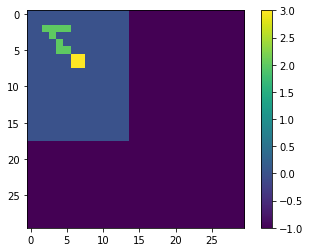

LOSS AT EPOCH 244: tf.Tensor(0.0031616532045547446, shape=(), dtype=float64)
TRAINING


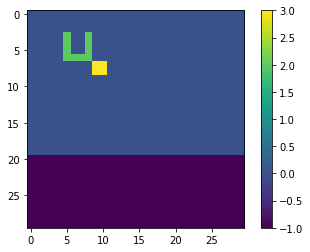

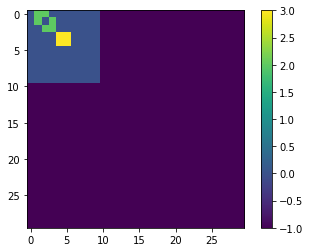

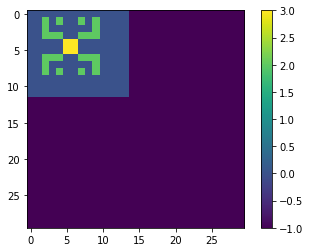

TEST


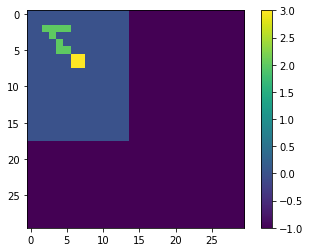

LOSS AT EPOCH 246: tf.Tensor(0.003161049918686068, shape=(), dtype=float64)
TRAINING


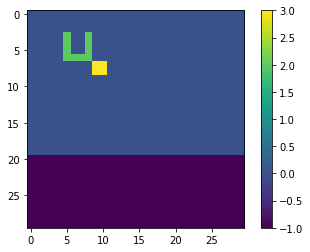

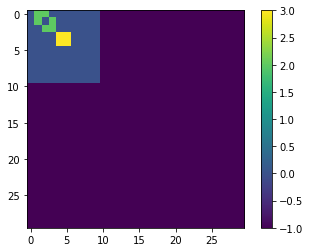

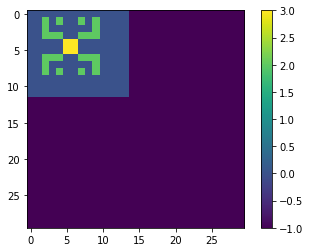

TEST


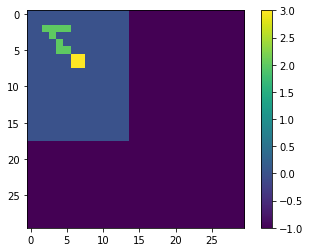

LOSS AT EPOCH 248: tf.Tensor(0.0031604372034459535, shape=(), dtype=float64)
TRAINING


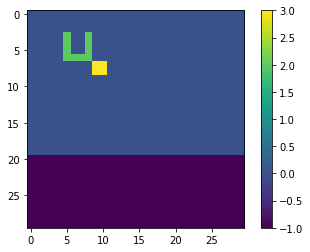

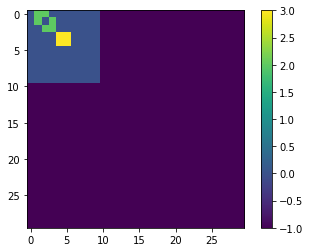

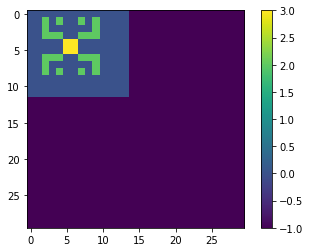

TEST


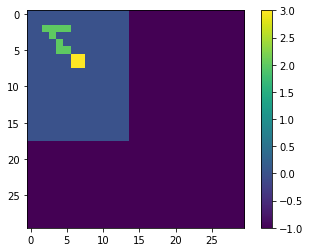

LOSS AT EPOCH 250: tf.Tensor(0.003159812943808378, shape=(), dtype=float64)
TRAINING


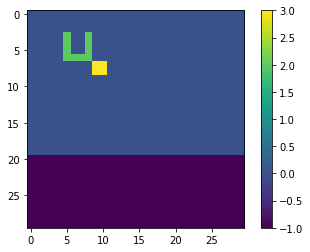

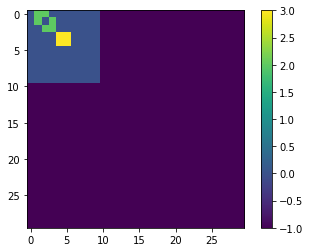

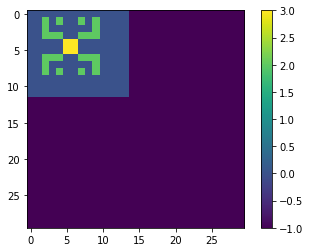

TEST


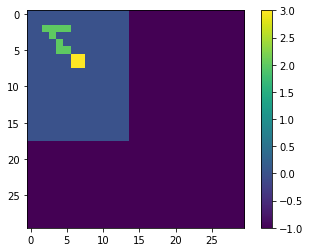

LOSS AT EPOCH 252: tf.Tensor(0.0031591979904262587, shape=(), dtype=float64)
TRAINING


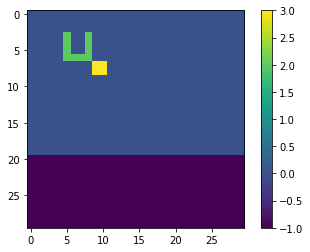

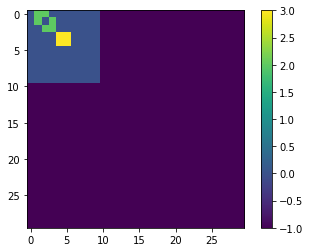

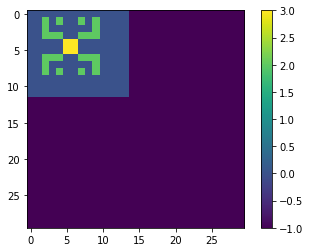

TEST


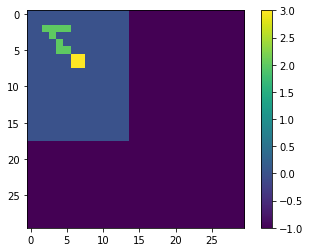

LOSS AT EPOCH 254: tf.Tensor(0.003158584083122107, shape=(), dtype=float64)
TRAINING


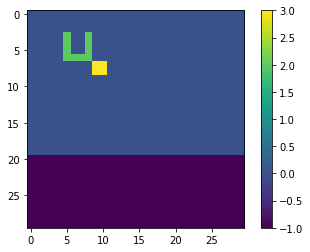

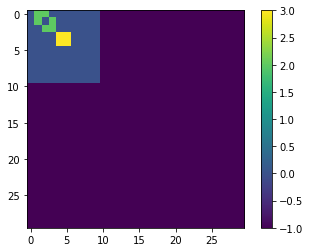

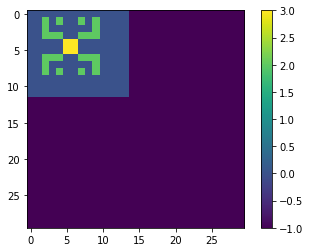

TEST


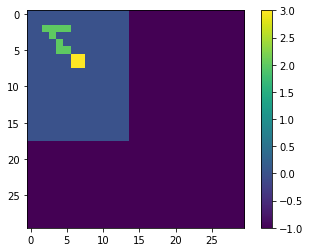

LOSS AT EPOCH 256: tf.Tensor(0.003157943423931934, shape=(), dtype=float64)
TRAINING


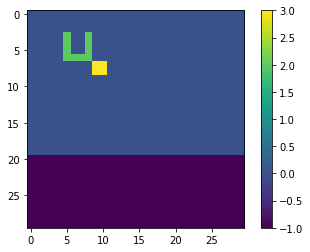

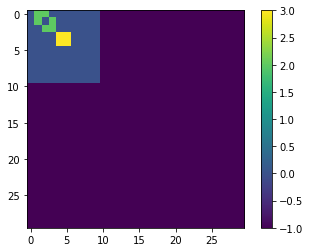

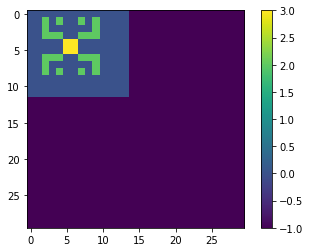

TEST


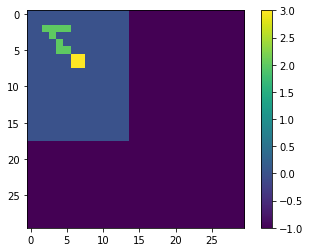

LOSS AT EPOCH 258: tf.Tensor(0.0031573049171589223, shape=(), dtype=float64)
TRAINING


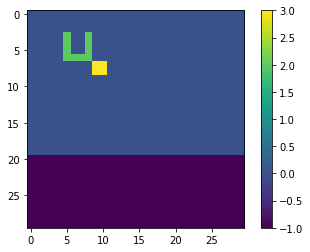

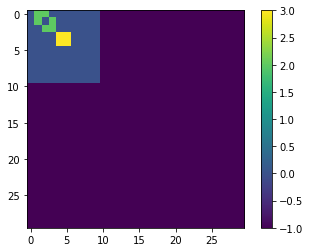

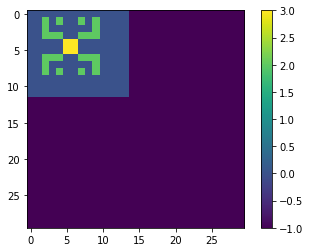

TEST


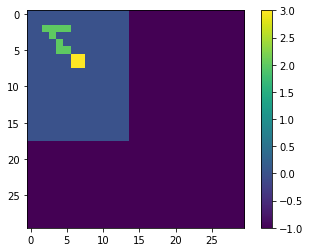

LOSS AT EPOCH 260: tf.Tensor(0.0031566660530257815, shape=(), dtype=float64)
TRAINING


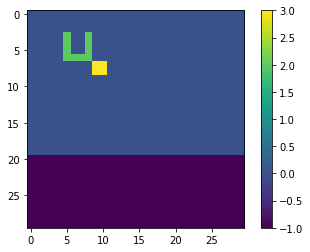

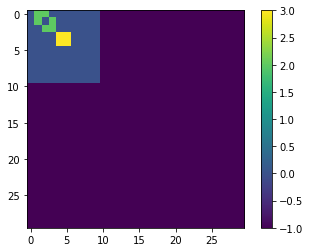

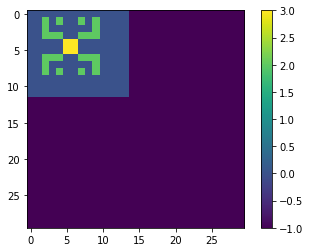

TEST


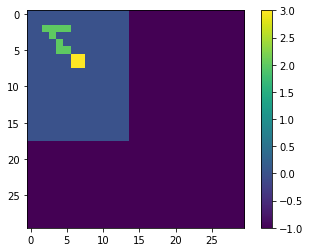

LOSS AT EPOCH 262: tf.Tensor(0.0031560214101804245, shape=(), dtype=float64)
TRAINING


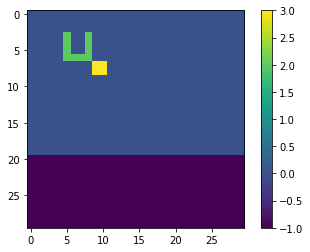

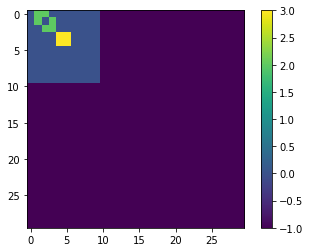

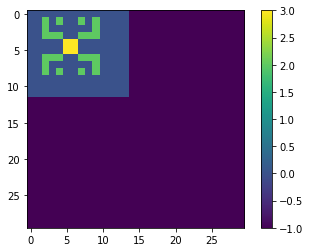

TEST


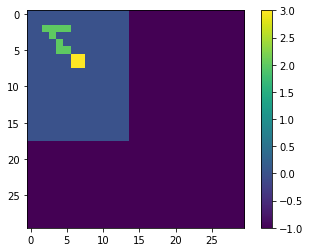

LOSS AT EPOCH 264: tf.Tensor(0.003155363053716577, shape=(), dtype=float64)
TRAINING


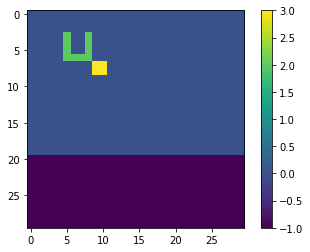

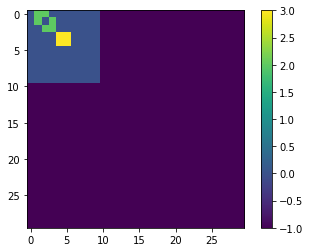

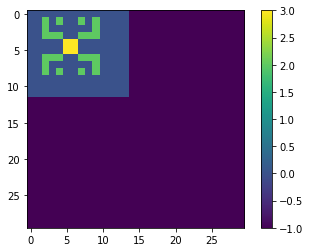

TEST


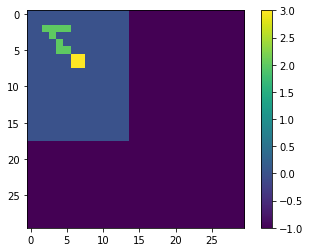

LOSS AT EPOCH 266: tf.Tensor(0.003154706990602403, shape=(), dtype=float64)
TRAINING


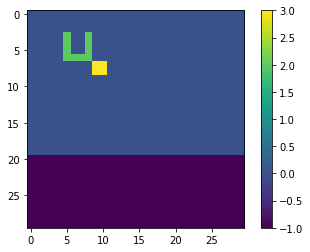

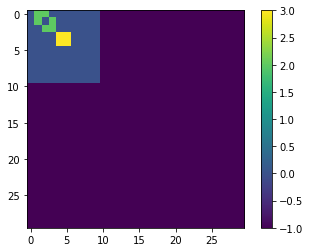

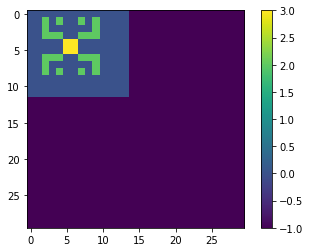

TEST


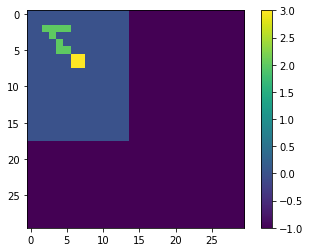

LOSS AT EPOCH 268: tf.Tensor(0.0031540446311504097, shape=(), dtype=float64)
TRAINING


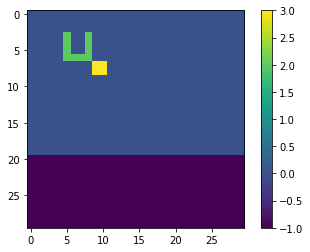

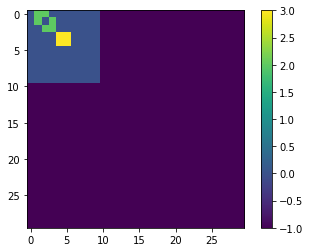

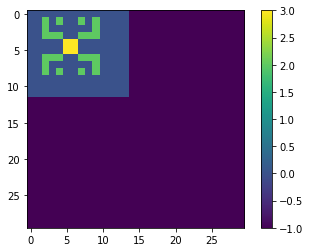

TEST


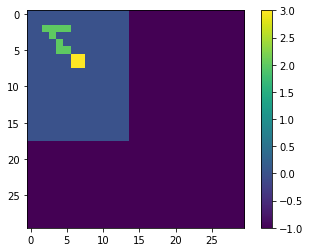

LOSS AT EPOCH 270: tf.Tensor(0.003153382120896239, shape=(), dtype=float64)
TRAINING


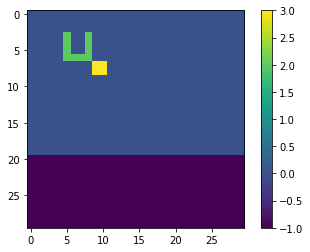

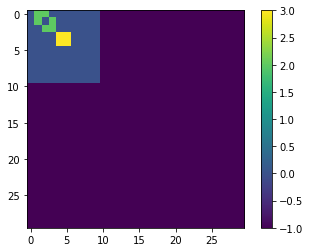

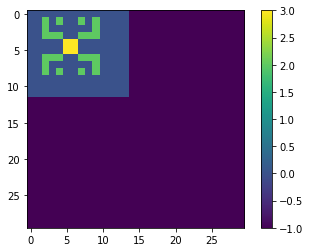

TEST


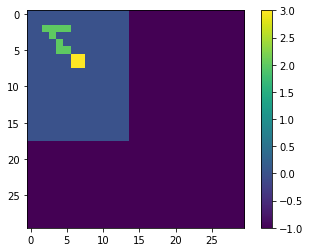

LOSS AT EPOCH 272: tf.Tensor(0.0031526963782759682, shape=(), dtype=float64)
TRAINING


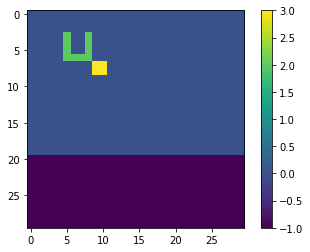

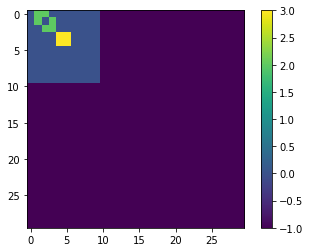

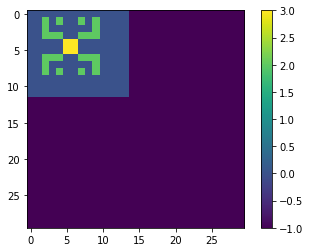

TEST


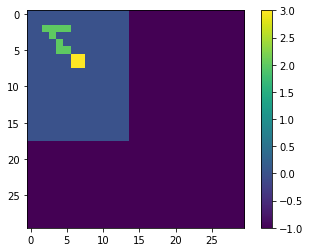

LOSS AT EPOCH 274: tf.Tensor(0.0031519888034702, shape=(), dtype=float64)
TRAINING


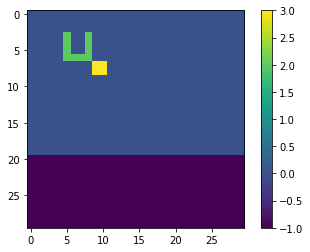

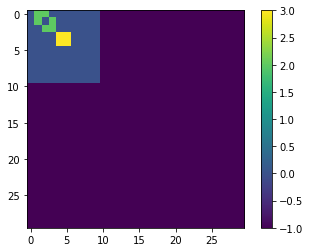

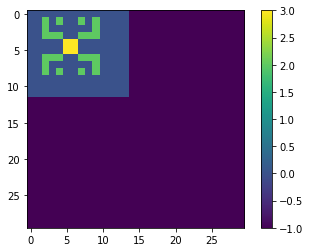

TEST


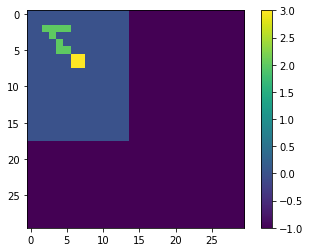

LOSS AT EPOCH 276: tf.Tensor(0.0031512874696676945, shape=(), dtype=float64)
TRAINING


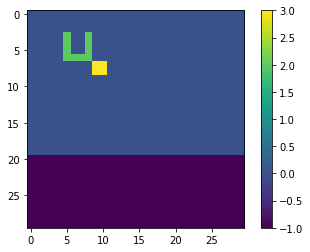

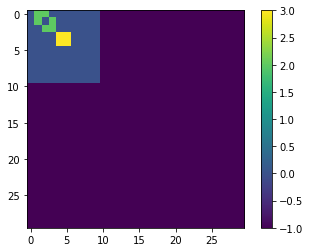

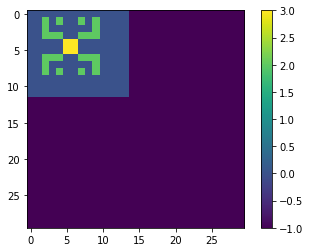

TEST


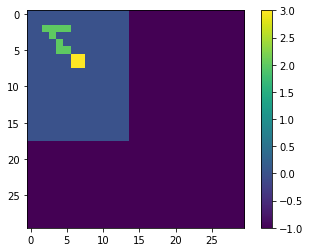

LOSS AT EPOCH 278: tf.Tensor(0.0031505619120547577, shape=(), dtype=float64)
TRAINING


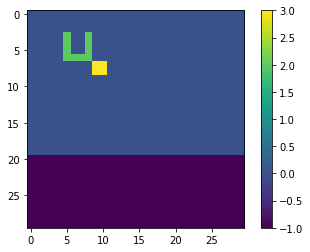

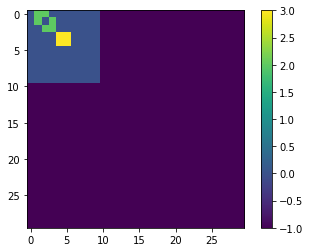

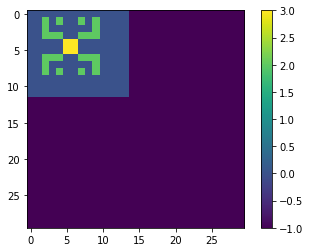

TEST


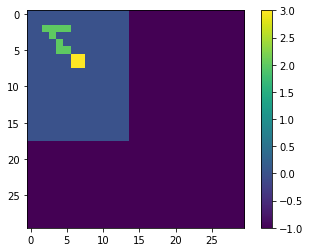

LOSS AT EPOCH 280: tf.Tensor(0.0031497975660938504, shape=(), dtype=float64)
TRAINING


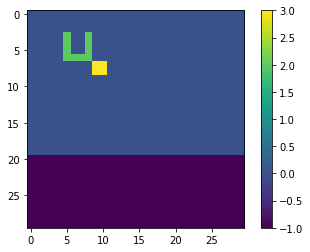

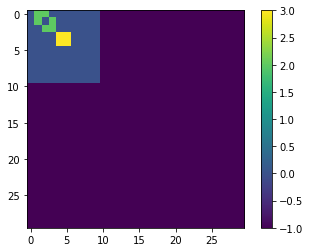

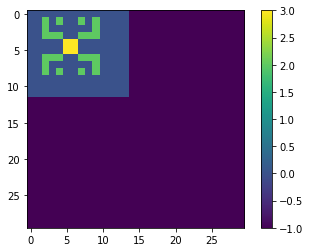

TEST


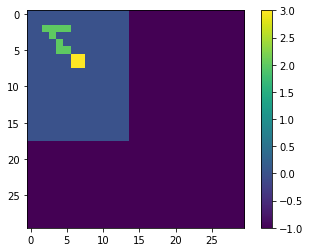

LOSS AT EPOCH 282: tf.Tensor(0.0031490051625676957, shape=(), dtype=float64)
TRAINING


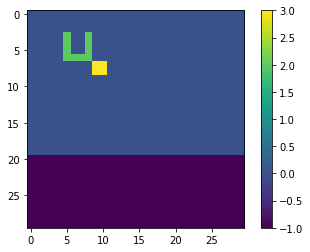

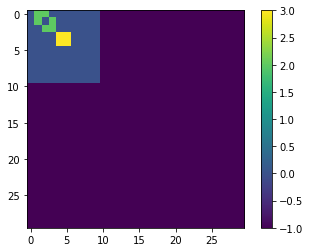

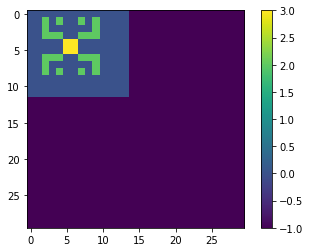

TEST


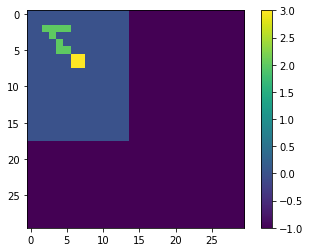

LOSS AT EPOCH 284: tf.Tensor(0.003148193788042743, shape=(), dtype=float64)
TRAINING


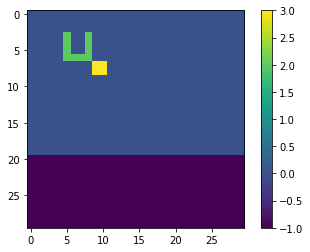

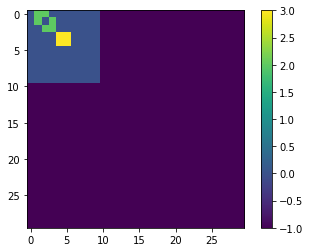

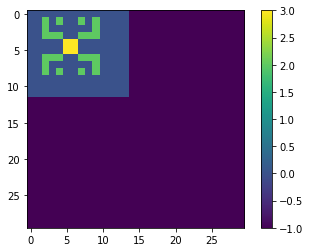

TEST


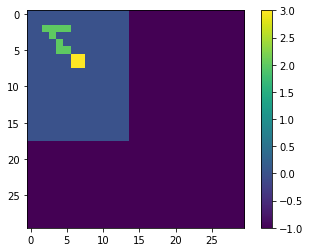

LOSS AT EPOCH 286: tf.Tensor(0.003147360798053685, shape=(), dtype=float64)
TRAINING


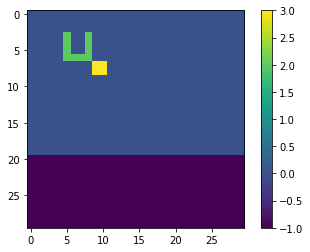

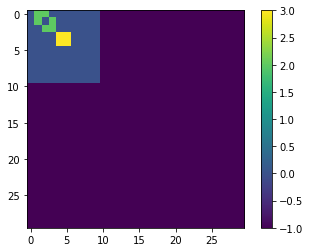

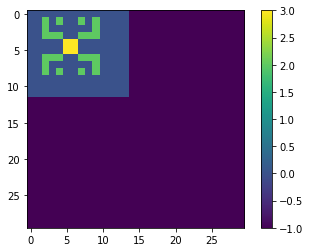

TEST


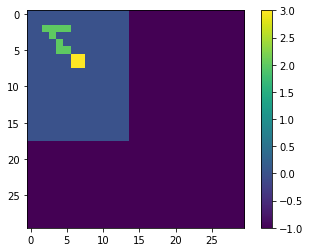

LOSS AT EPOCH 288: tf.Tensor(0.003146486280111684, shape=(), dtype=float64)
TRAINING


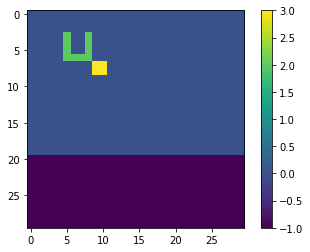

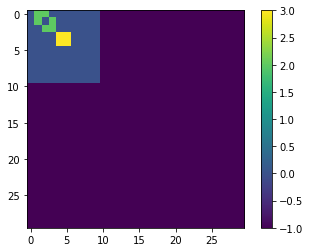

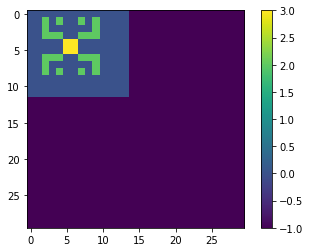

TEST


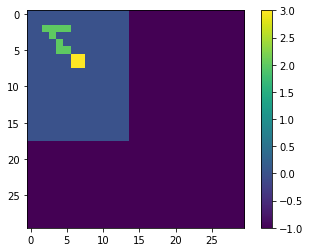

LOSS AT EPOCH 290: tf.Tensor(0.003145614207706399, shape=(), dtype=float64)
TRAINING


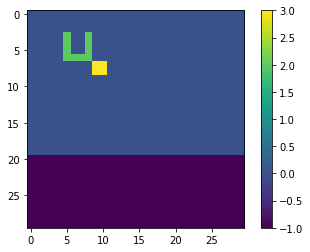

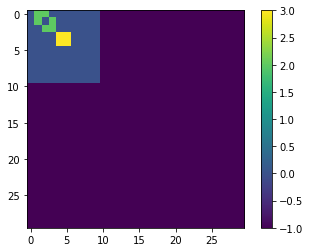

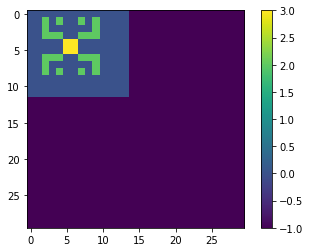

TEST


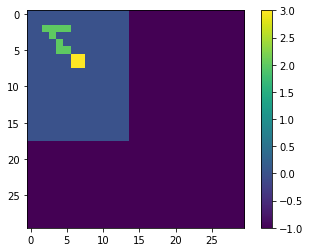

LOSS AT EPOCH 292: tf.Tensor(0.003144697598459088, shape=(), dtype=float64)
TRAINING


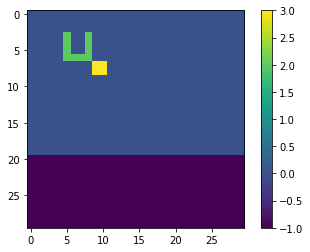

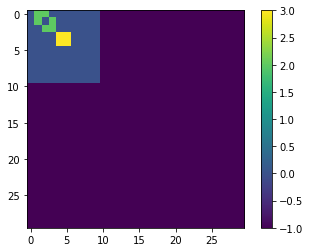

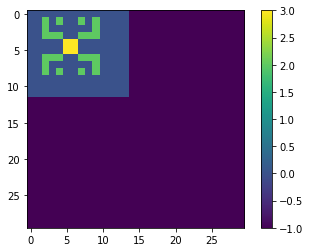

TEST


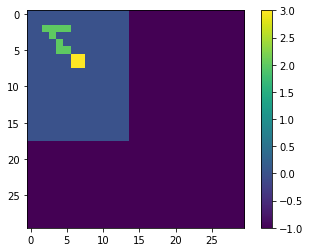

LOSS AT EPOCH 294: tf.Tensor(0.0031437688522488313, shape=(), dtype=float64)
TRAINING


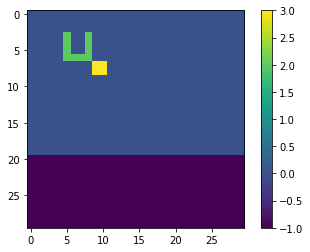

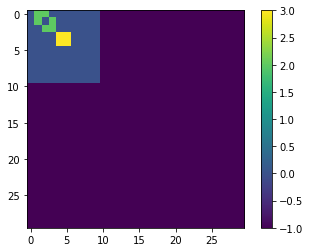

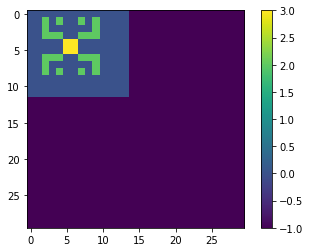

TEST


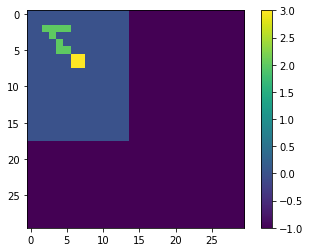

LOSS AT EPOCH 296: tf.Tensor(0.0031428425599840494, shape=(), dtype=float64)
TRAINING


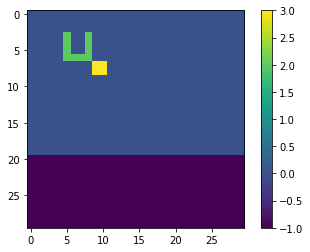

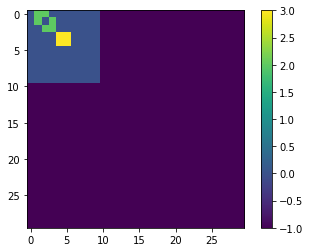

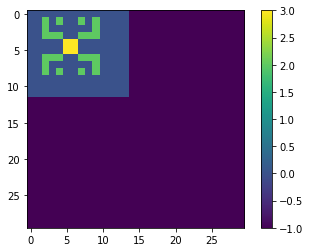

TEST


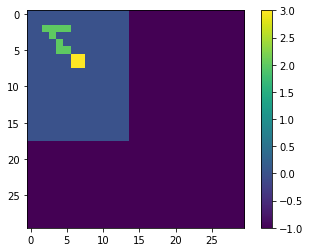

LOSS AT EPOCH 298: tf.Tensor(0.003141874534002344, shape=(), dtype=float64)
TRAINING


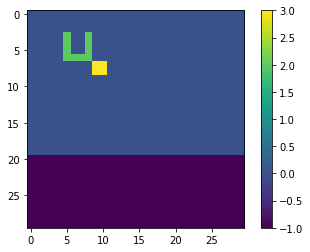

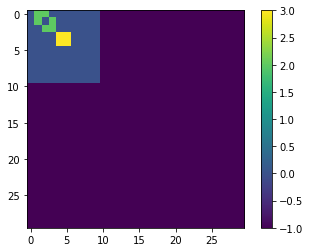

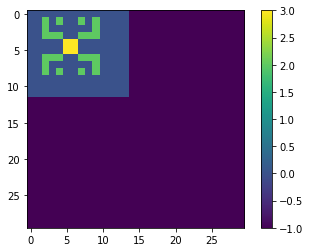

TEST


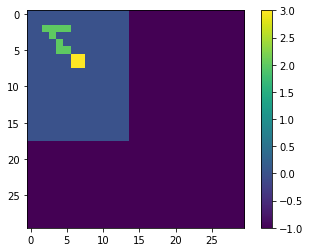

LOSS AT EPOCH 300: tf.Tensor(0.0031409219236723457, shape=(), dtype=float64)
TRAINING


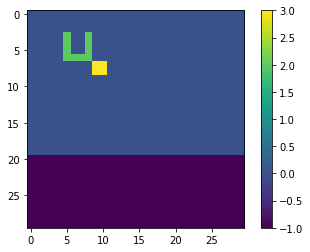

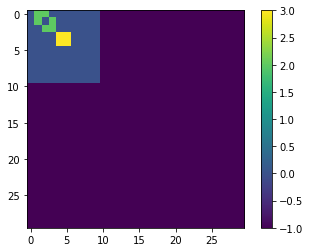

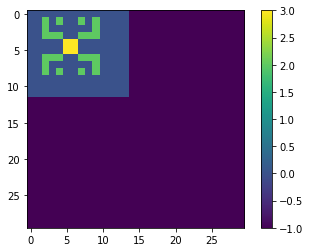

TEST


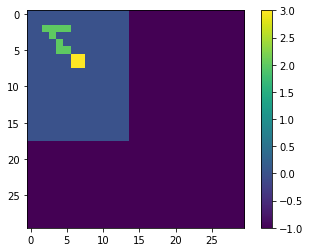

LOSS AT EPOCH 302: tf.Tensor(0.0031399446382137423, shape=(), dtype=float64)
TRAINING


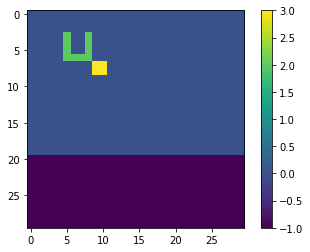

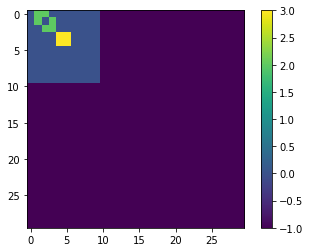

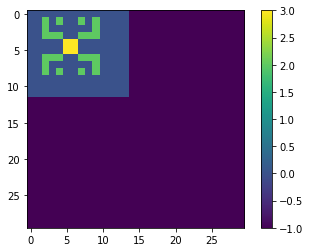

TEST


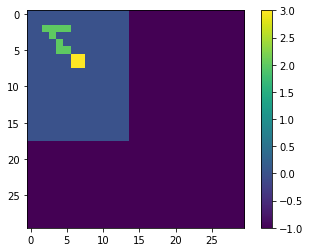

LOSS AT EPOCH 304: tf.Tensor(0.0031390097479698504, shape=(), dtype=float64)
TRAINING


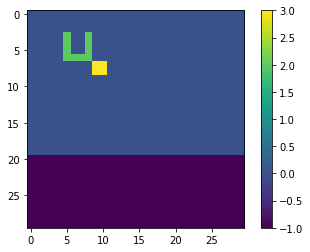

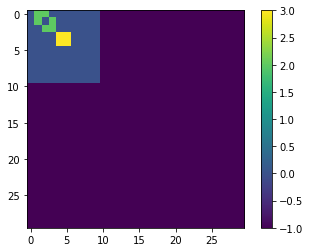

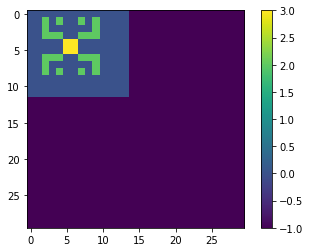

TEST


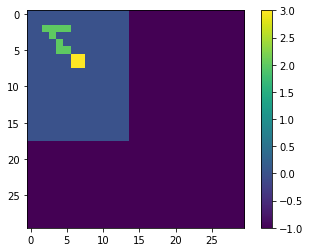

LOSS AT EPOCH 306: tf.Tensor(0.003138078564103844, shape=(), dtype=float64)
TRAINING


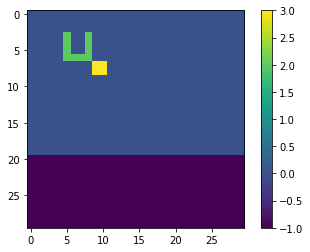

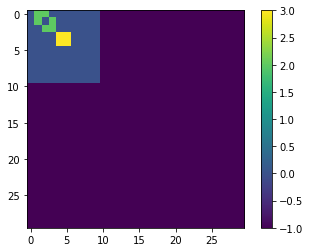

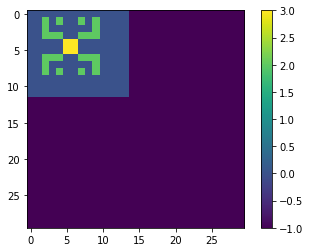

TEST


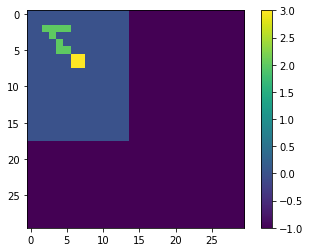

LOSS AT EPOCH 308: tf.Tensor(0.0031371891235259645, shape=(), dtype=float64)
TRAINING


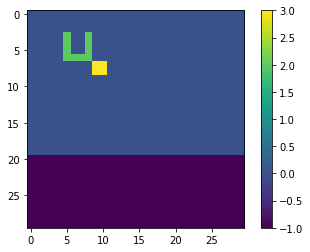

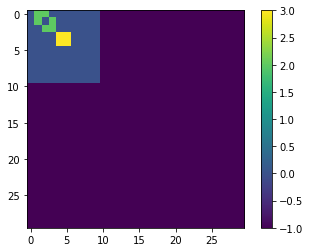

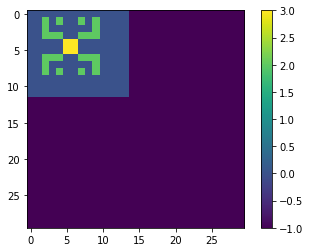

TEST


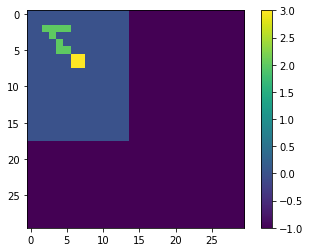

LOSS AT EPOCH 310: tf.Tensor(0.0031363167996075873, shape=(), dtype=float64)
TRAINING


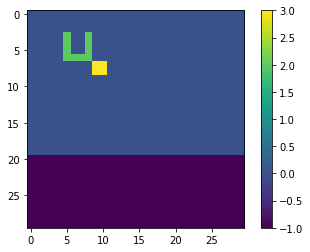

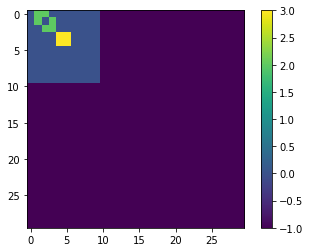

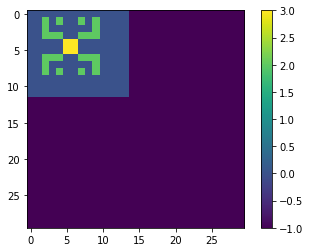

TEST


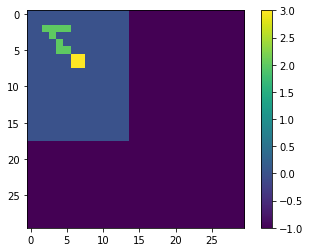

LOSS AT EPOCH 312: tf.Tensor(0.003135462749498365, shape=(), dtype=float64)
TRAINING


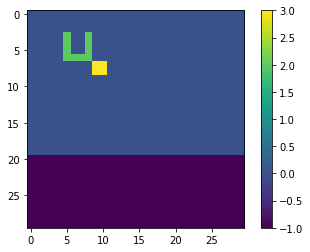

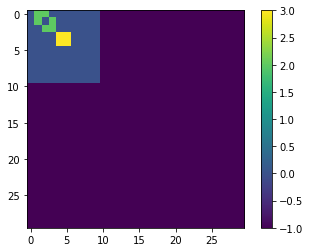

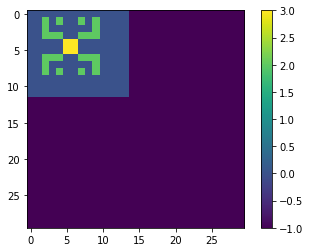

TEST


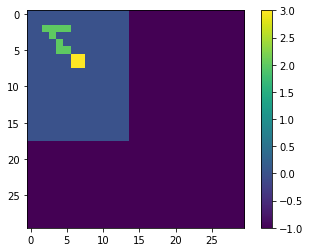

LOSS AT EPOCH 314: tf.Tensor(0.0031346448660798886, shape=(), dtype=float64)
TRAINING


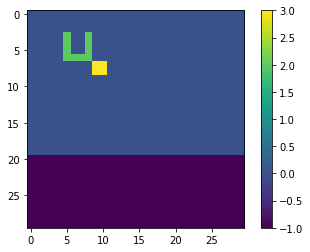

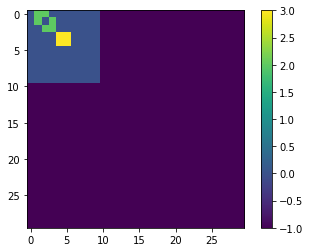

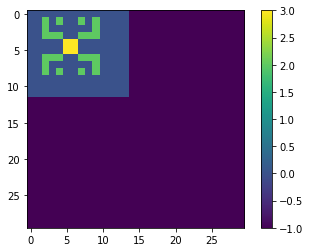

TEST


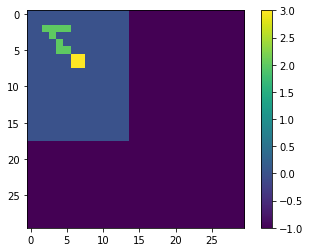

LOSS AT EPOCH 316: tf.Tensor(0.003133854760331191, shape=(), dtype=float64)
TRAINING


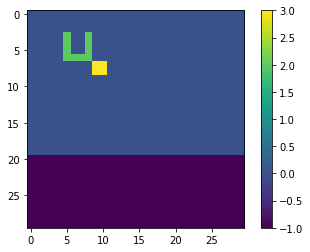

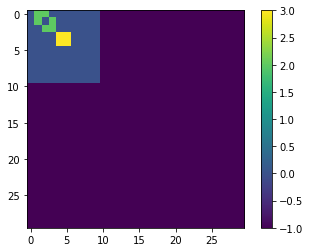

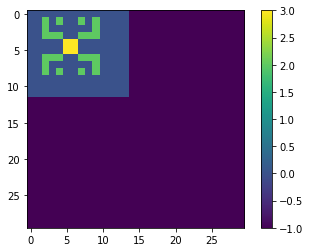

TEST


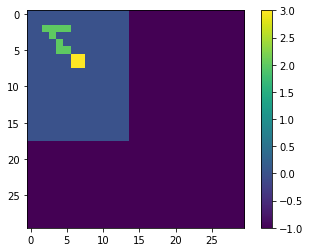

LOSS AT EPOCH 318: tf.Tensor(0.0031331027953110536, shape=(), dtype=float64)
TRAINING


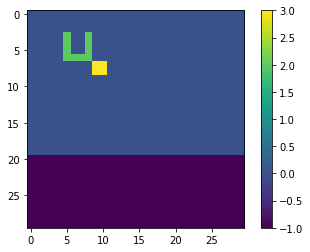

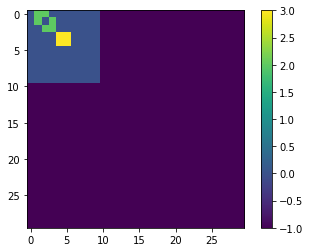

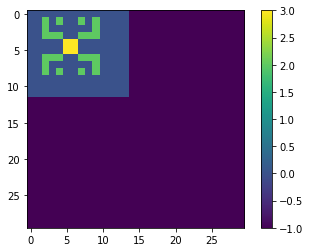

TEST


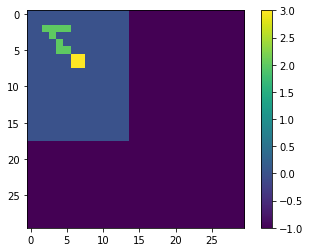

LOSS AT EPOCH 320: tf.Tensor(0.0031323844361791234, shape=(), dtype=float64)
TRAINING


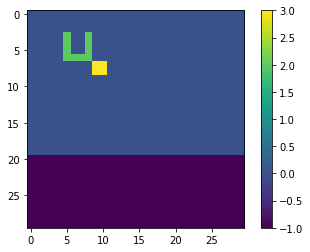

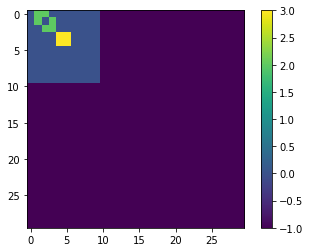

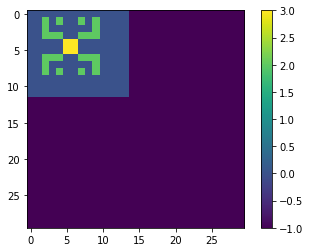

TEST


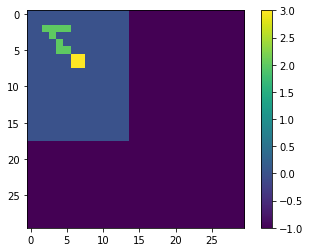

LOSS AT EPOCH 322: tf.Tensor(0.0031317016589113866, shape=(), dtype=float64)
TRAINING


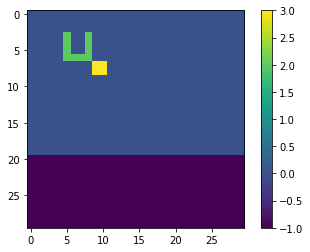

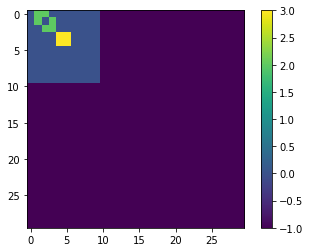

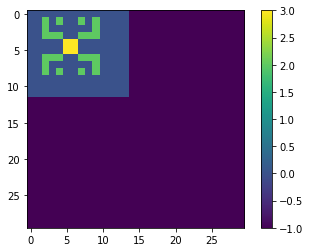

TEST


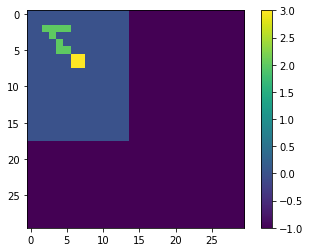

LOSS AT EPOCH 324: tf.Tensor(0.003131032658630036, shape=(), dtype=float64)
TRAINING


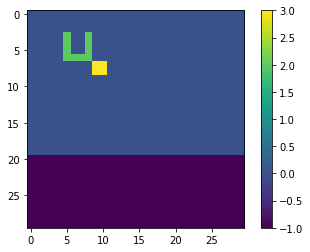

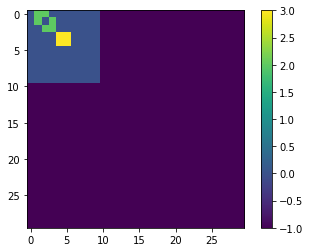

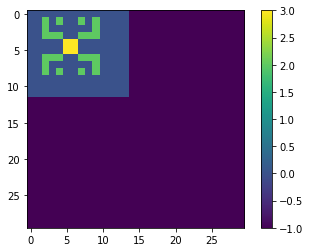

TEST


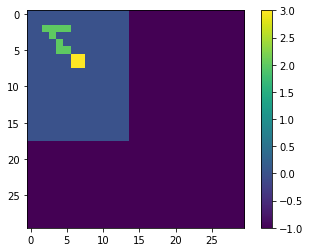

LOSS AT EPOCH 326: tf.Tensor(0.0031303998667448632, shape=(), dtype=float64)
TRAINING


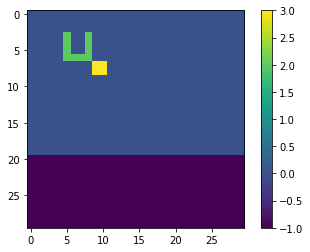

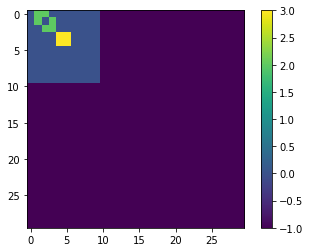

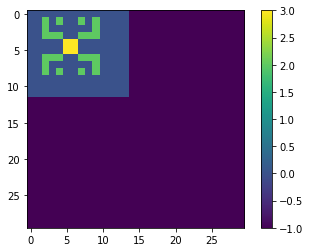

TEST


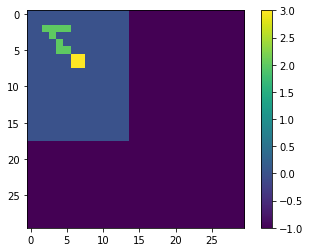

LOSS AT EPOCH 328: tf.Tensor(0.003129767347473725, shape=(), dtype=float64)
TRAINING


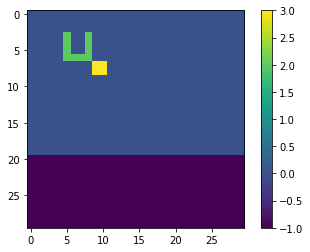

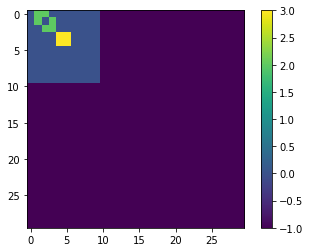

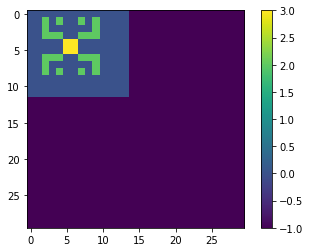

TEST


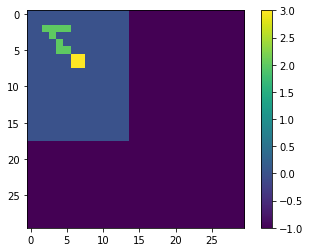

LOSS AT EPOCH 330: tf.Tensor(0.0031291376596598577, shape=(), dtype=float64)
TRAINING


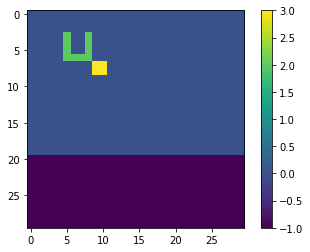

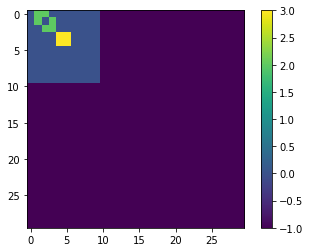

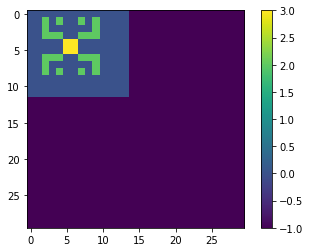

TEST


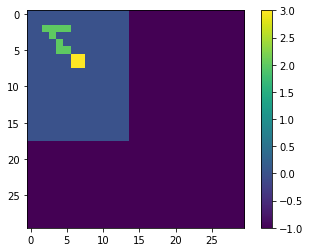

LOSS AT EPOCH 332: tf.Tensor(0.003128520466795731, shape=(), dtype=float64)
TRAINING


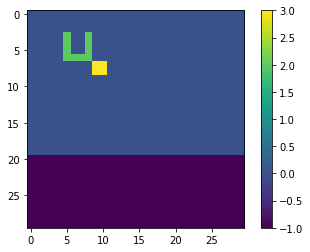

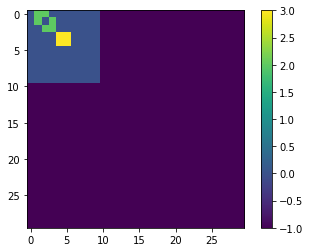

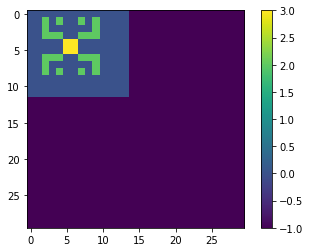

TEST


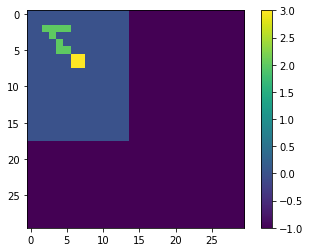

LOSS AT EPOCH 334: tf.Tensor(0.003127868720712705, shape=(), dtype=float64)
TRAINING


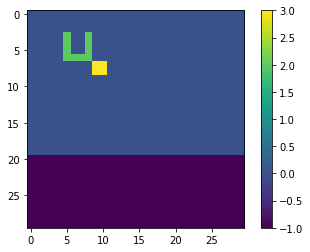

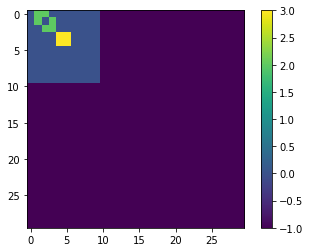

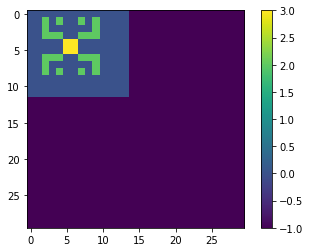

TEST


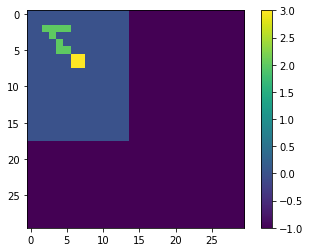

LOSS AT EPOCH 336: tf.Tensor(0.0031272270163921747, shape=(), dtype=float64)
TRAINING


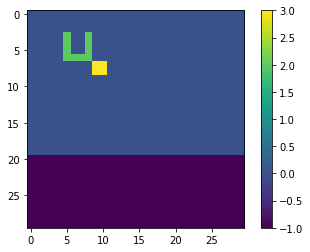

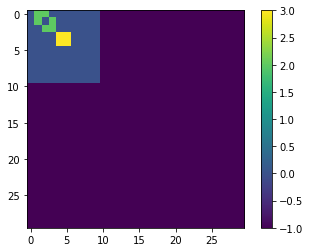

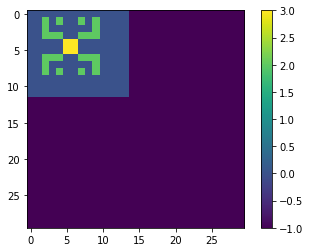

TEST


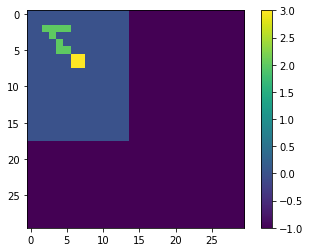

LOSS AT EPOCH 338: tf.Tensor(0.003126593693315614, shape=(), dtype=float64)
TRAINING


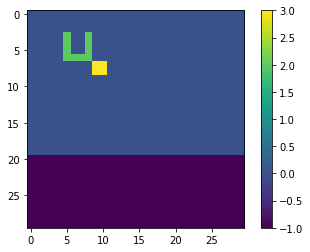

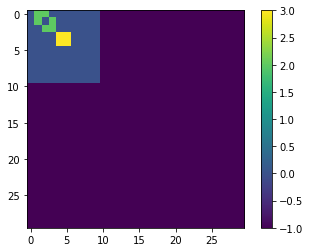

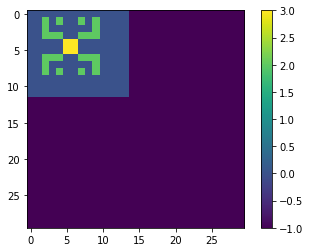

TEST


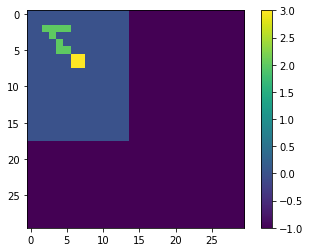

LOSS AT EPOCH 340: tf.Tensor(0.0031259540120401313, shape=(), dtype=float64)
TRAINING


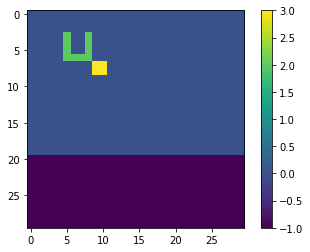

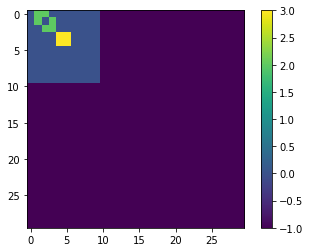

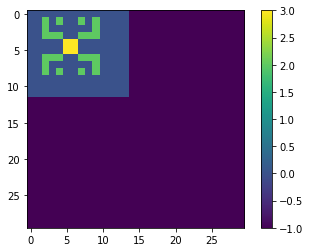

TEST


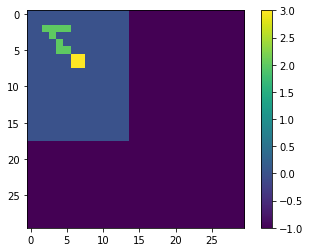

LOSS AT EPOCH 342: tf.Tensor(0.003125323681829214, shape=(), dtype=float64)
TRAINING


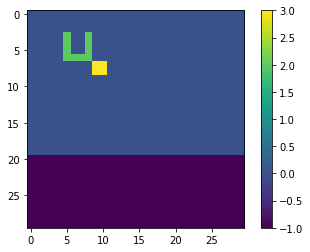

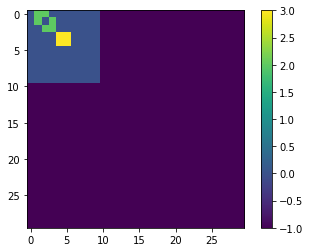

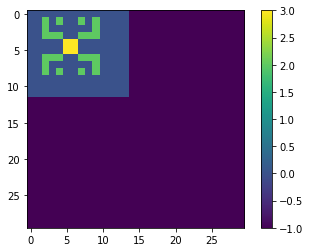

TEST


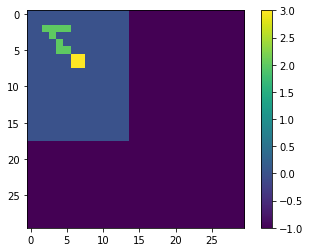

LOSS AT EPOCH 344: tf.Tensor(0.0031246848631530234, shape=(), dtype=float64)
TRAINING


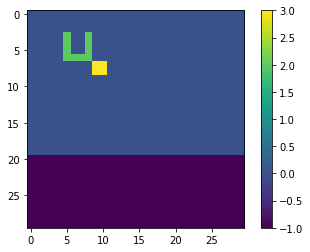

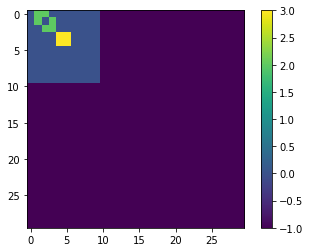

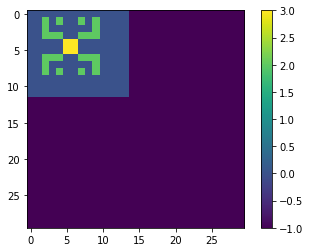

TEST


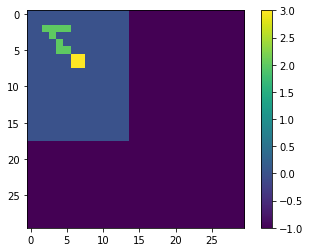

LOSS AT EPOCH 346: tf.Tensor(0.0031240364750282205, shape=(), dtype=float64)
TRAINING


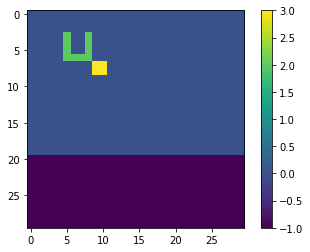

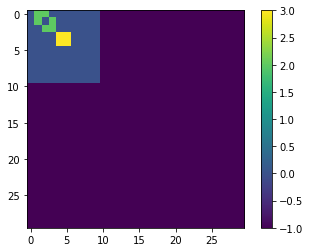

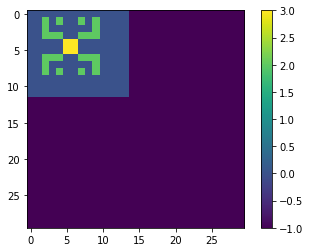

TEST


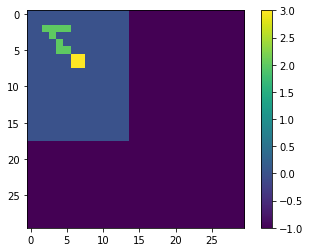

LOSS AT EPOCH 348: tf.Tensor(0.0031233922058006057, shape=(), dtype=float64)
TRAINING


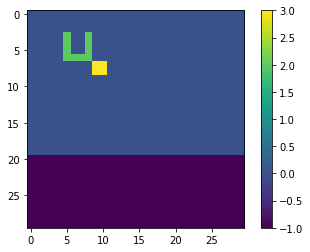

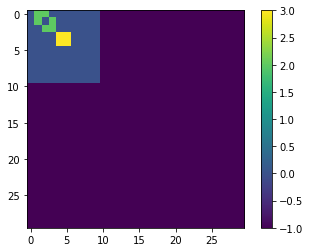

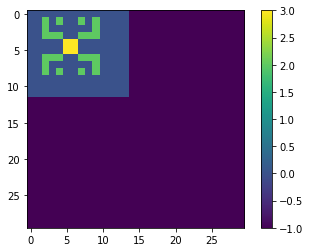

TEST


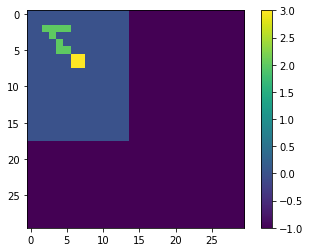

LOSS AT EPOCH 350: tf.Tensor(0.0031227361762311595, shape=(), dtype=float64)
TRAINING


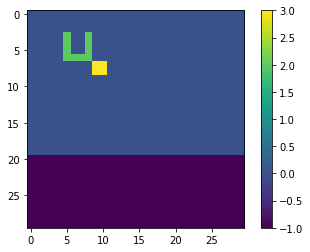

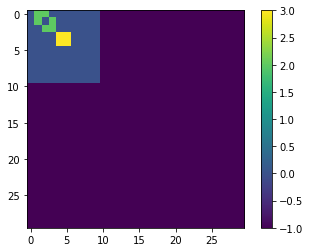

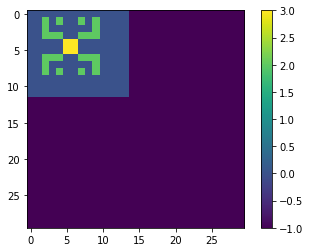

TEST


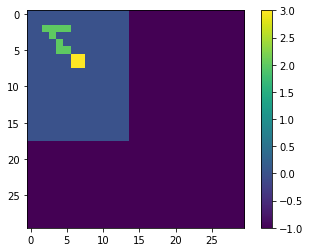

LOSS AT EPOCH 352: tf.Tensor(0.0031220805486013733, shape=(), dtype=float64)
TRAINING


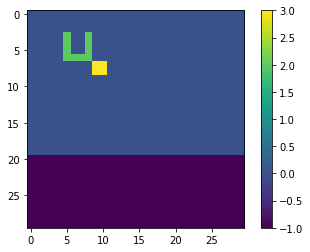

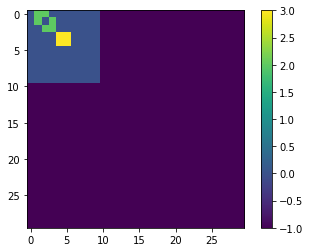

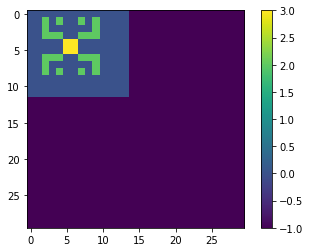

TEST


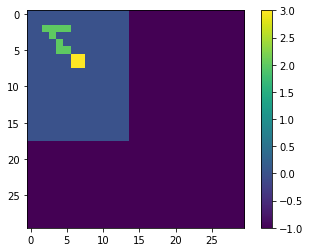

LOSS AT EPOCH 354: tf.Tensor(0.003121424746329402, shape=(), dtype=float64)
TRAINING


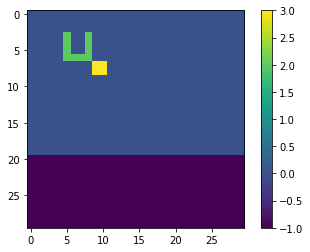

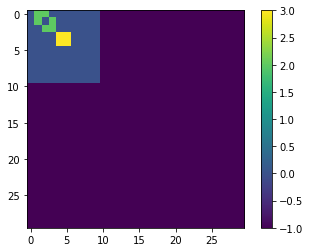

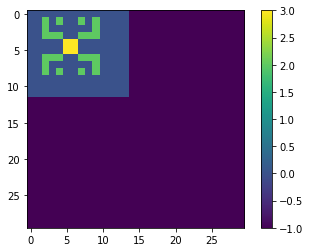

TEST


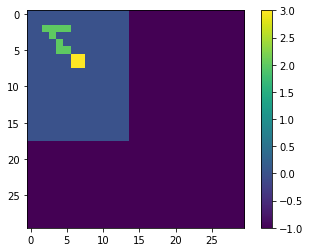

LOSS AT EPOCH 356: tf.Tensor(0.003120772449286442, shape=(), dtype=float64)
TRAINING


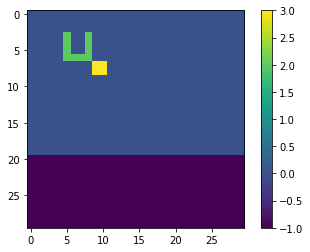

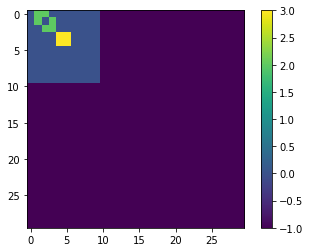

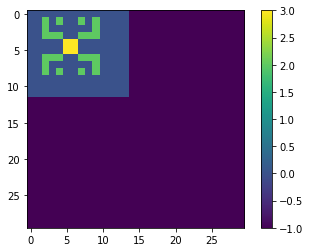

TEST


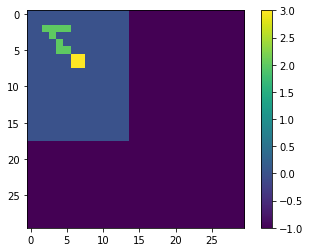

LOSS AT EPOCH 358: tf.Tensor(0.003120127498421747, shape=(), dtype=float64)
TRAINING


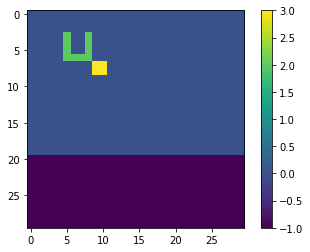

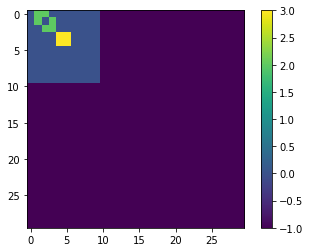

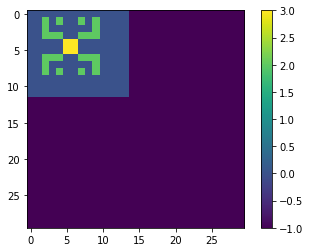

TEST


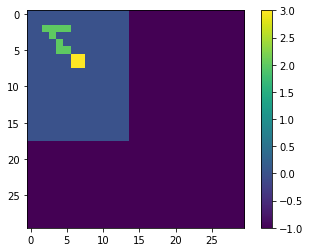

LOSS AT EPOCH 360: tf.Tensor(0.0031194751273805215, shape=(), dtype=float64)
TRAINING


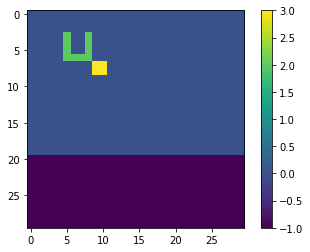

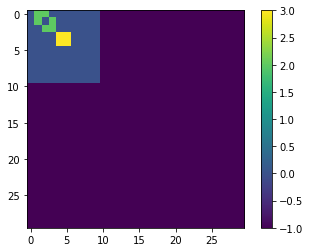

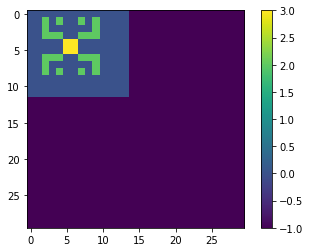

TEST


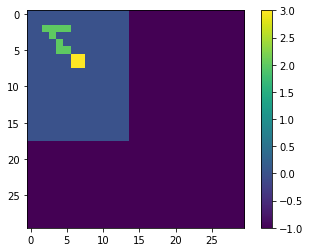

LOSS AT EPOCH 362: tf.Tensor(0.003118825155907188, shape=(), dtype=float64)
TRAINING


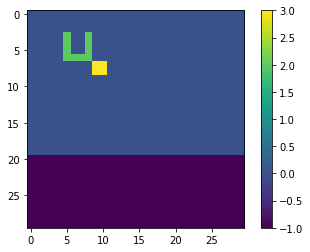

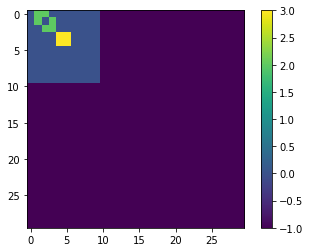

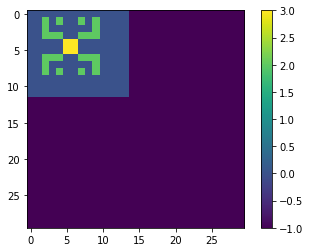

TEST


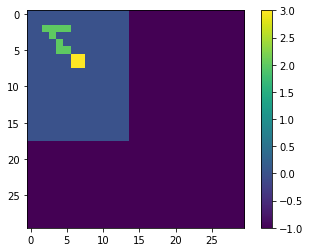

LOSS AT EPOCH 364: tf.Tensor(0.0031181750886864474, shape=(), dtype=float64)
TRAINING


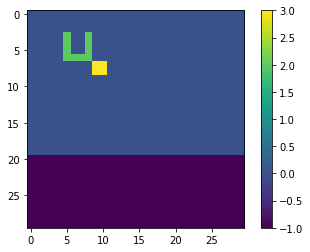

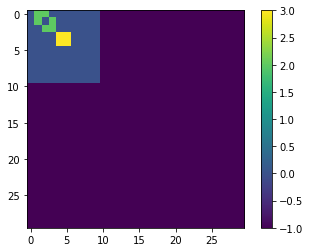

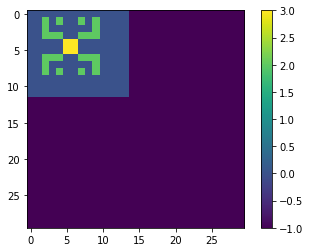

TEST


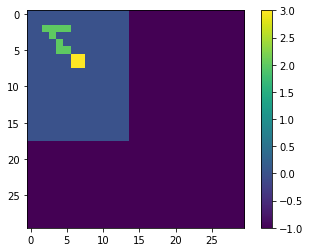

LOSS AT EPOCH 366: tf.Tensor(0.0031175313395408423, shape=(), dtype=float64)
TRAINING


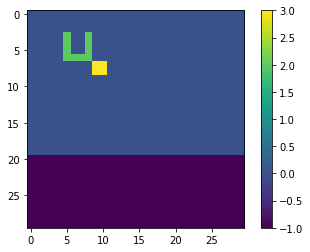

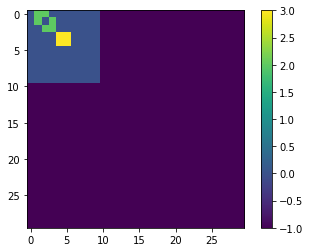

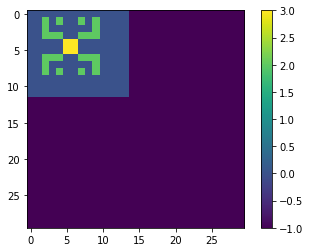

TEST


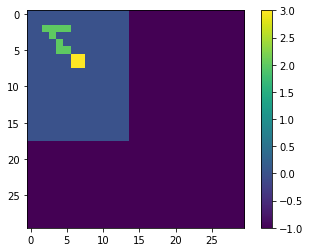

LOSS AT EPOCH 368: tf.Tensor(0.0031169022399369487, shape=(), dtype=float64)
TRAINING


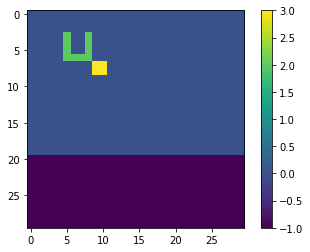

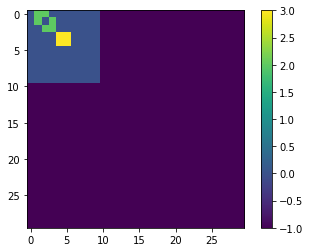

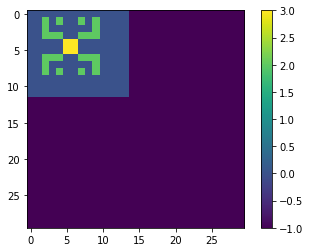

TEST


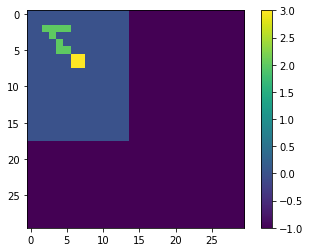

LOSS AT EPOCH 370: tf.Tensor(0.0031162813605791367, shape=(), dtype=float64)
TRAINING


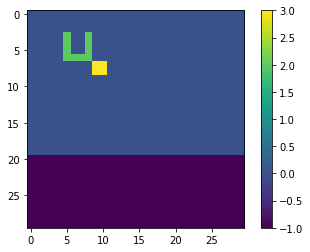

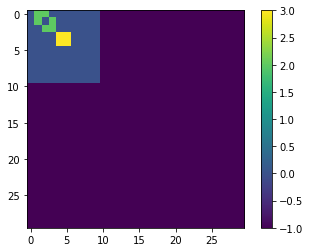

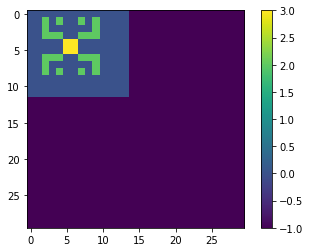

TEST


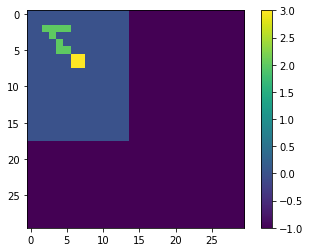

LOSS AT EPOCH 372: tf.Tensor(0.0031156682478761227, shape=(), dtype=float64)
TRAINING


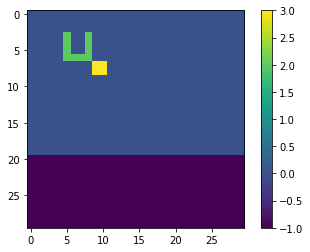

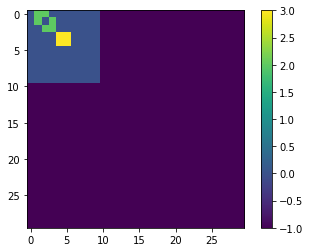

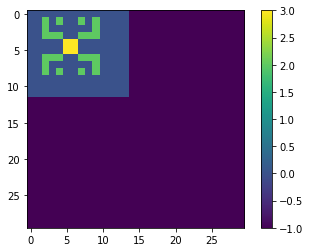

TEST


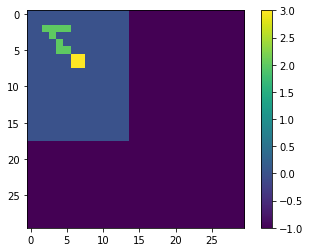

LOSS AT EPOCH 374: tf.Tensor(0.0031150608724560104, shape=(), dtype=float64)
TRAINING


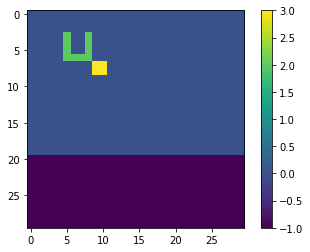

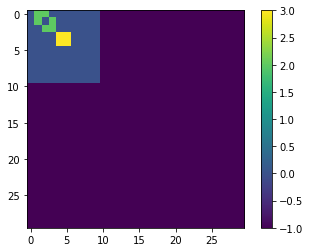

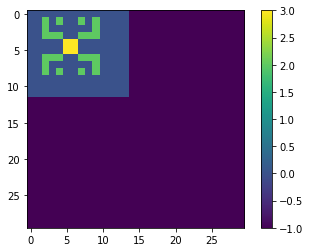

TEST


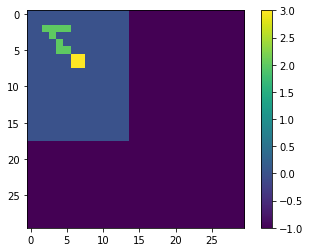

LOSS AT EPOCH 376: tf.Tensor(0.0031144544158556303, shape=(), dtype=float64)
TRAINING


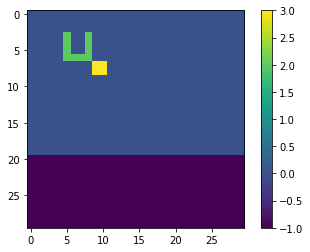

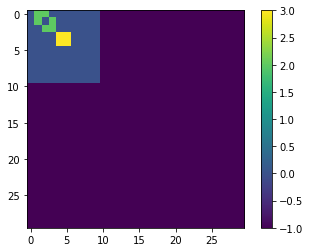

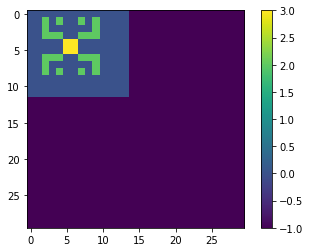

TEST


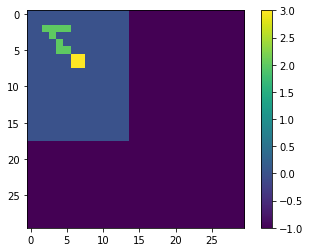

LOSS AT EPOCH 378: tf.Tensor(0.0031138600454708276, shape=(), dtype=float64)
TRAINING


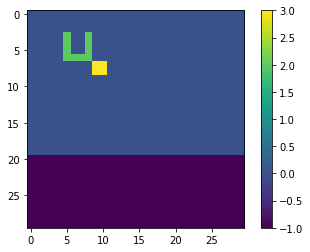

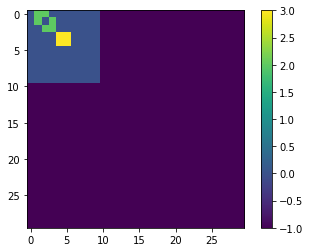

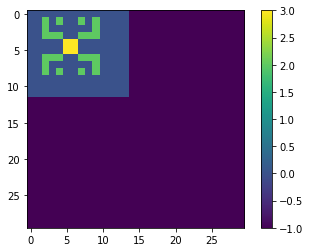

TEST


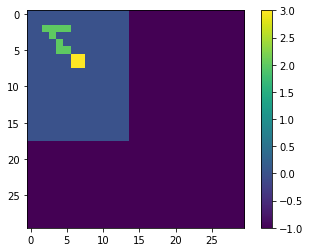

LOSS AT EPOCH 380: tf.Tensor(0.0031132799026226334, shape=(), dtype=float64)
TRAINING


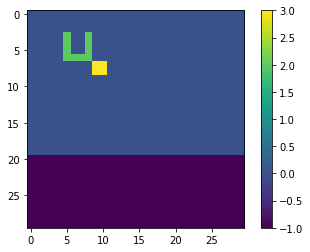

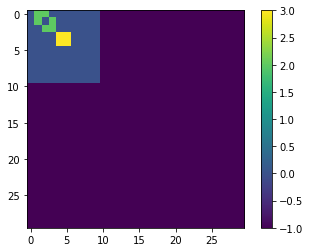

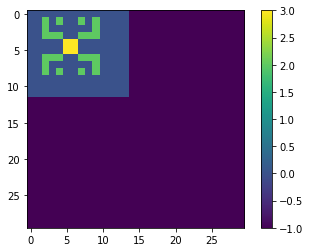

TEST


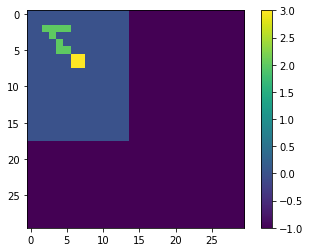

LOSS AT EPOCH 382: tf.Tensor(0.0031127048151452486, shape=(), dtype=float64)
TRAINING


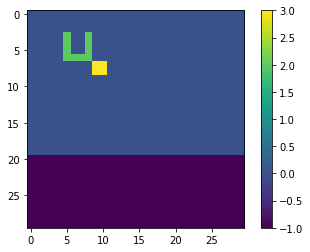

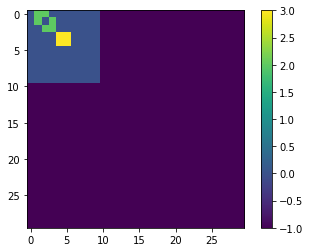

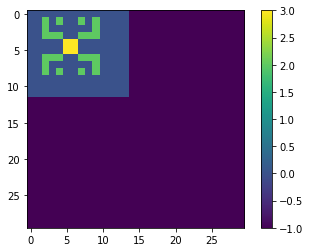

TEST


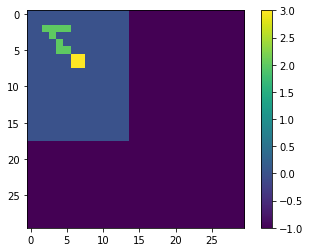

LOSS AT EPOCH 384: tf.Tensor(0.003112134394667567, shape=(), dtype=float64)
TRAINING


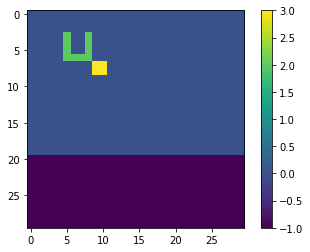

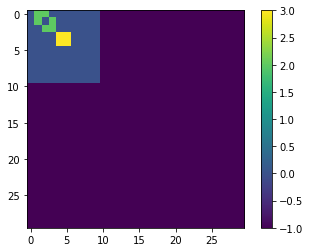

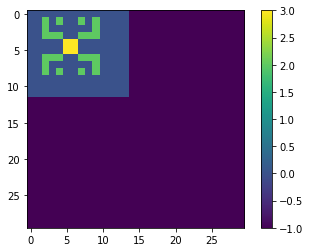

TEST


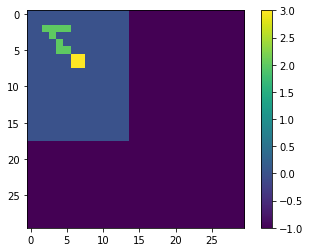

LOSS AT EPOCH 386: tf.Tensor(0.0031115844393058297, shape=(), dtype=float64)
TRAINING


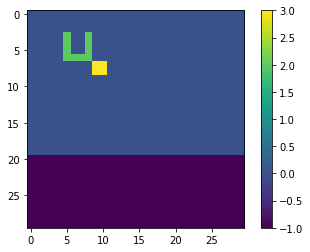

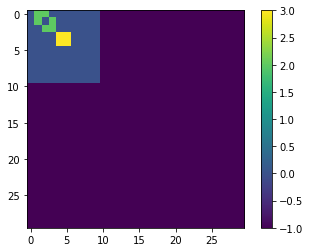

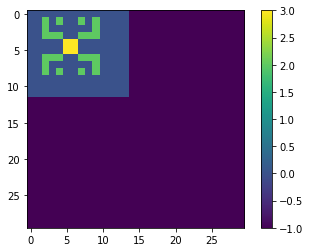

TEST


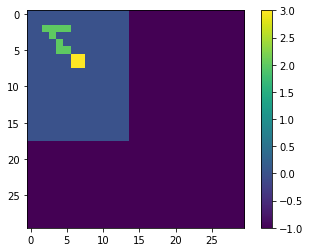

LOSS AT EPOCH 388: tf.Tensor(0.003111025249172503, shape=(), dtype=float64)
TRAINING


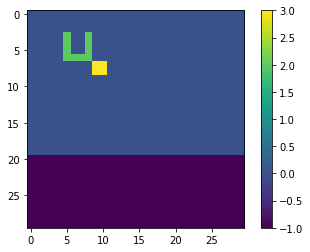

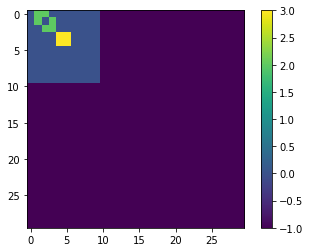

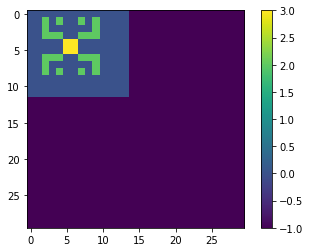

TEST


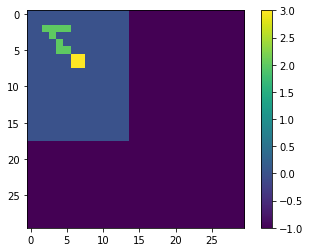

LOSS AT EPOCH 390: tf.Tensor(0.003110476350711488, shape=(), dtype=float64)
TRAINING


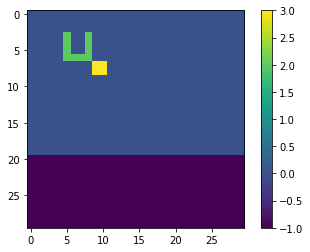

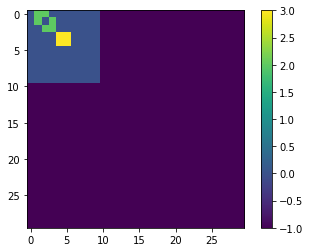

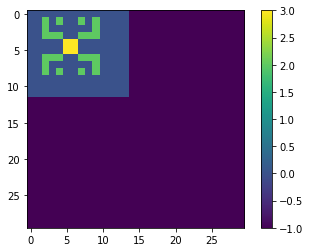

TEST


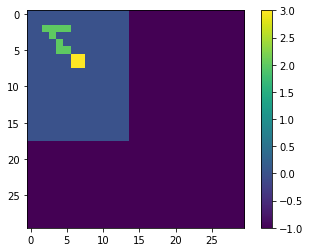

LOSS AT EPOCH 392: tf.Tensor(0.0031099386004026907, shape=(), dtype=float64)
TRAINING


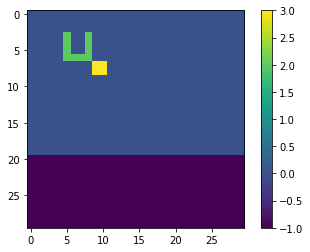

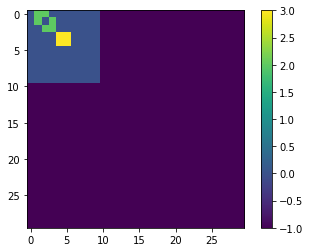

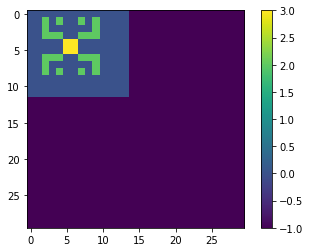

TEST


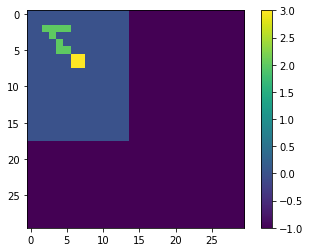

LOSS AT EPOCH 394: tf.Tensor(0.003109409169078858, shape=(), dtype=float64)
TRAINING


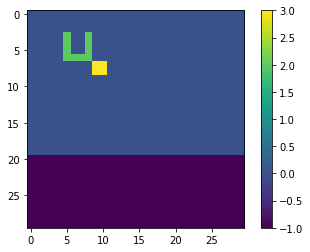

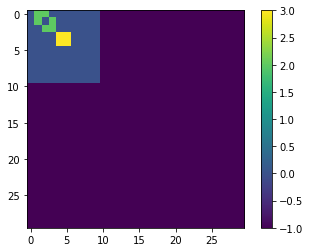

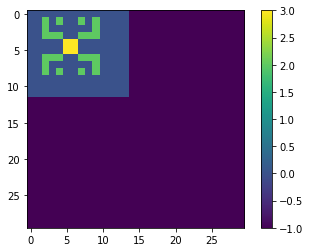

TEST


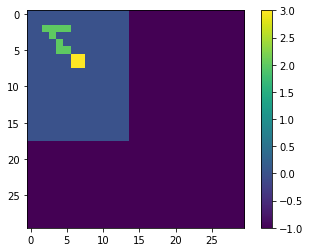

LOSS AT EPOCH 396: tf.Tensor(0.0031088801934587252, shape=(), dtype=float64)
TRAINING


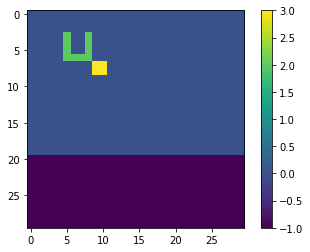

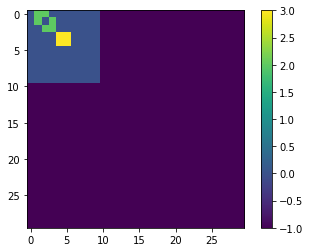

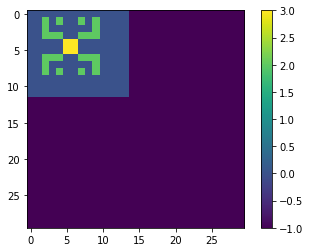

TEST


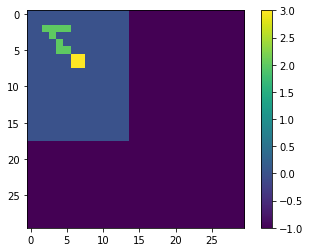

LOSS AT EPOCH 398: tf.Tensor(0.0031083490561979324, shape=(), dtype=float64)
TRAINING


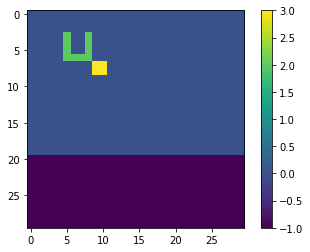

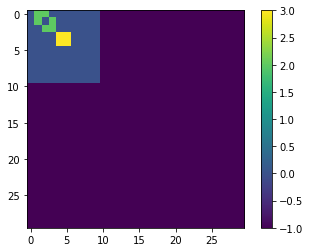

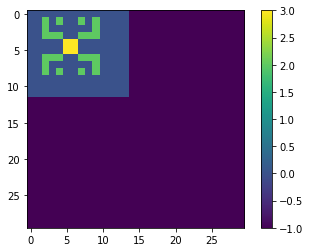

TEST


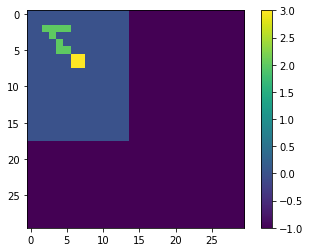

LOSS AT EPOCH 400: tf.Tensor(0.0031078239419209354, shape=(), dtype=float64)
TRAINING


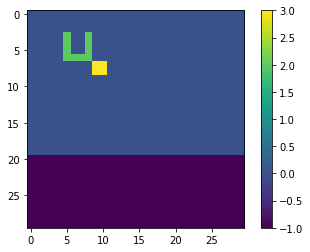

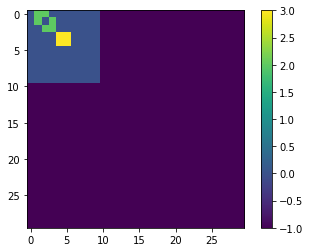

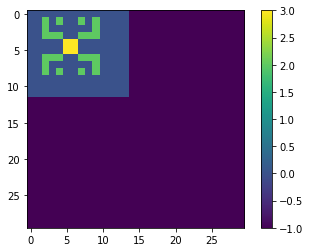

TEST


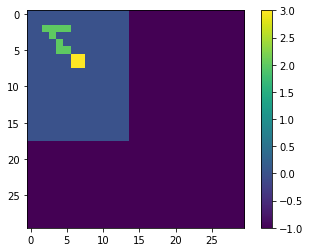

LOSS AT EPOCH 402: tf.Tensor(0.003107305995338, shape=(), dtype=float64)
TRAINING


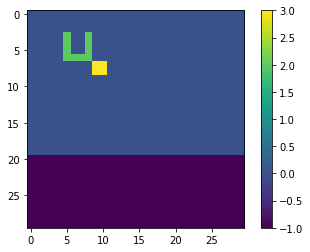

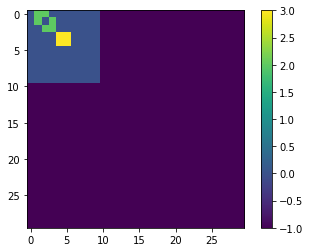

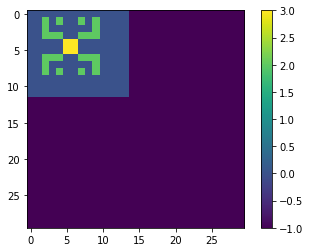

TEST


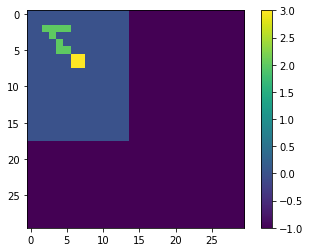

LOSS AT EPOCH 404: tf.Tensor(0.0031067957839429707, shape=(), dtype=float64)
TRAINING


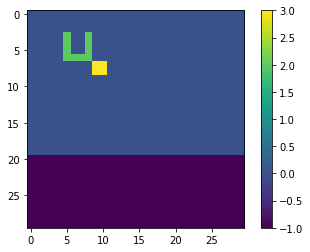

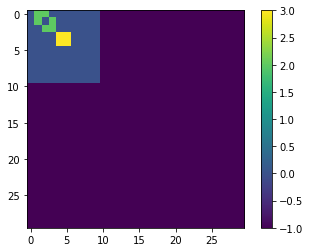

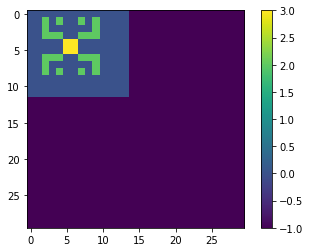

TEST


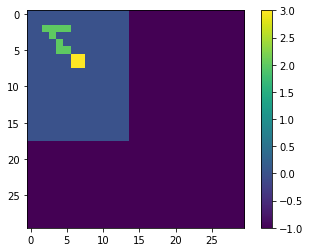

LOSS AT EPOCH 406: tf.Tensor(0.003106289865994823, shape=(), dtype=float64)
TRAINING


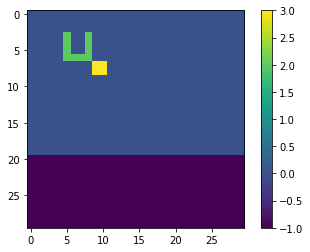

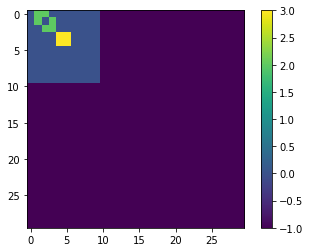

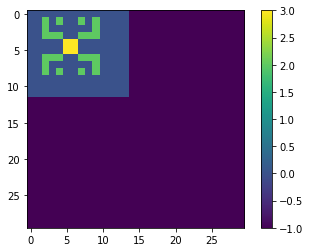

TEST


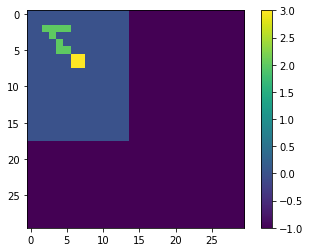

LOSS AT EPOCH 408: tf.Tensor(0.0031057837173638966, shape=(), dtype=float64)
TRAINING


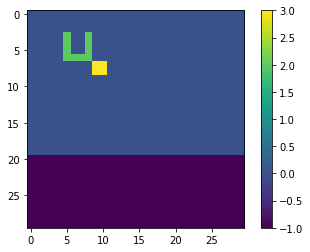

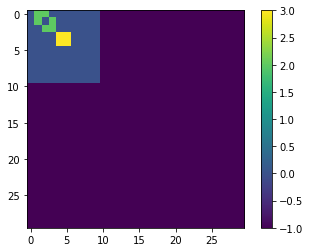

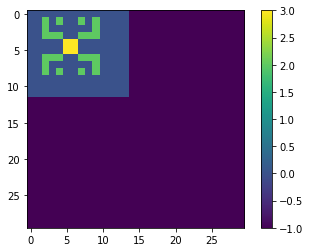

TEST


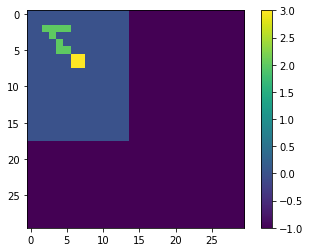

LOSS AT EPOCH 410: tf.Tensor(0.003105286228984073, shape=(), dtype=float64)
TRAINING


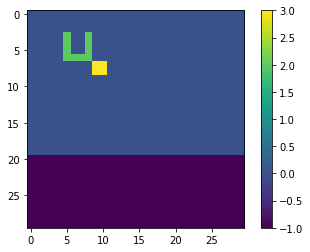

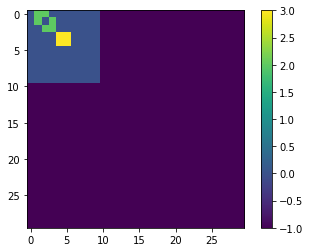

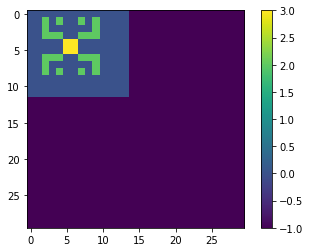

TEST


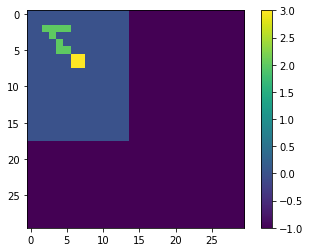

LOSS AT EPOCH 412: tf.Tensor(0.0031047961353845186, shape=(), dtype=float64)
TRAINING


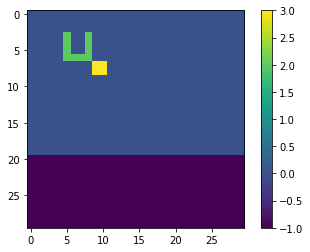

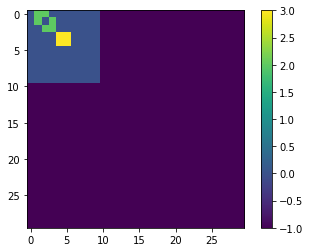

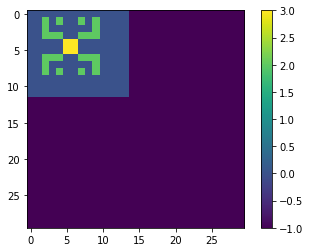

TEST


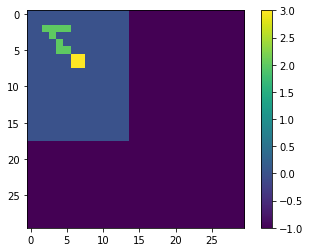

LOSS AT EPOCH 414: tf.Tensor(0.0031043016008015993, shape=(), dtype=float64)
TRAINING


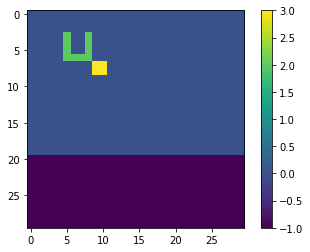

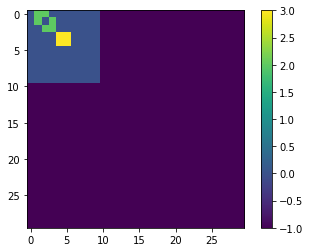

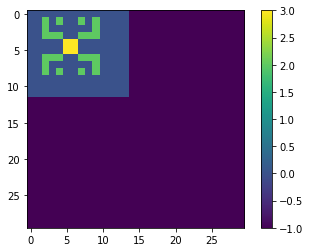

TEST


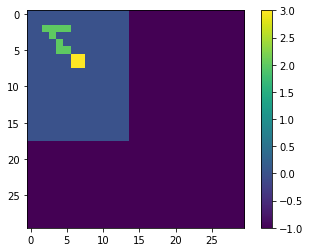

LOSS AT EPOCH 416: tf.Tensor(0.003103809579605922, shape=(), dtype=float64)
TRAINING


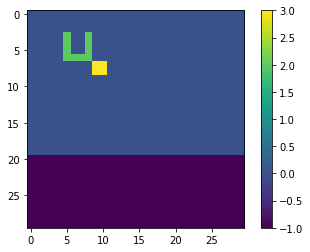

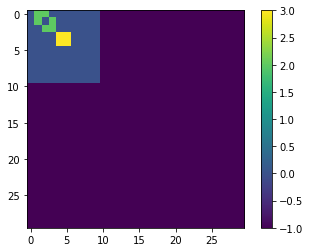

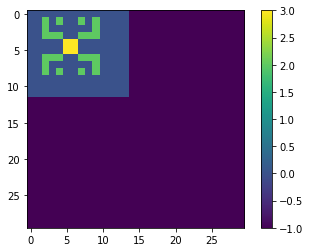

TEST


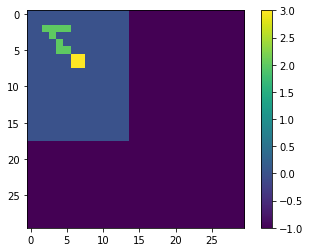

LOSS AT EPOCH 418: tf.Tensor(0.0031033258698402555, shape=(), dtype=float64)
TRAINING


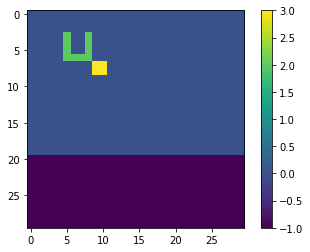

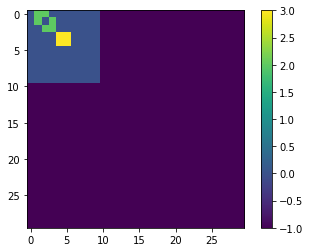

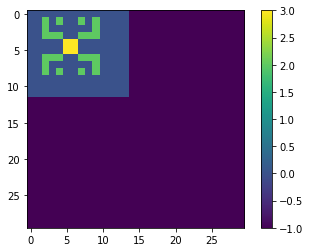

TEST


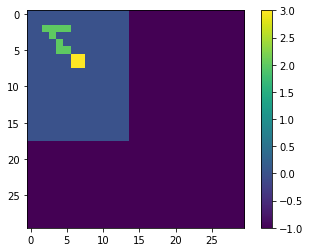

LOSS AT EPOCH 420: tf.Tensor(0.0031028513335535713, shape=(), dtype=float64)
TRAINING


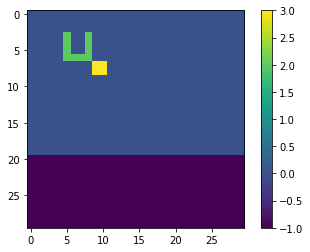

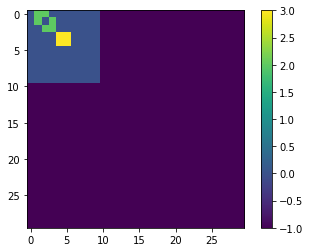

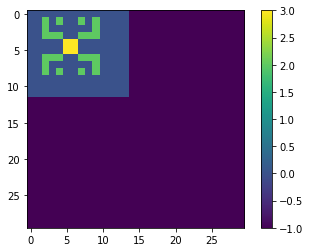

TEST


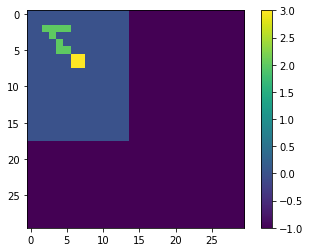

LOSS AT EPOCH 422: tf.Tensor(0.003102373205802356, shape=(), dtype=float64)
TRAINING


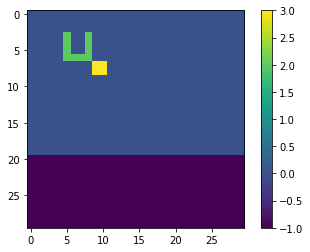

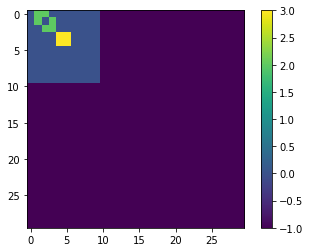

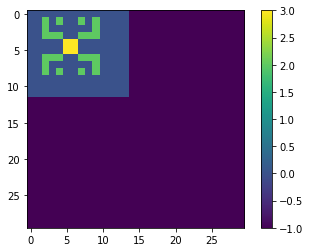

TEST


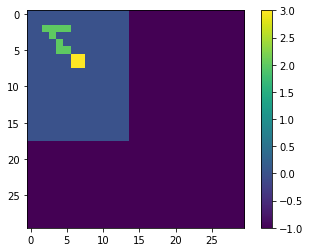

LOSS AT EPOCH 424: tf.Tensor(0.003101896934162978, shape=(), dtype=float64)
TRAINING


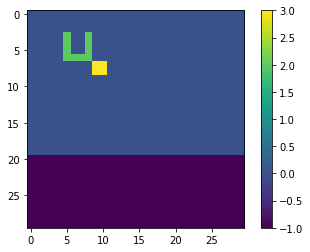

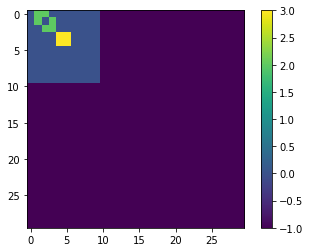

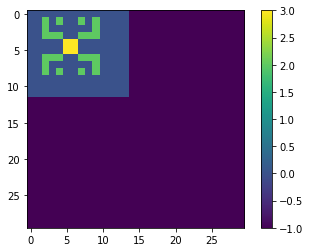

TEST


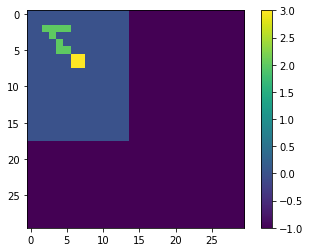

LOSS AT EPOCH 426: tf.Tensor(0.003101425519956979, shape=(), dtype=float64)
TRAINING


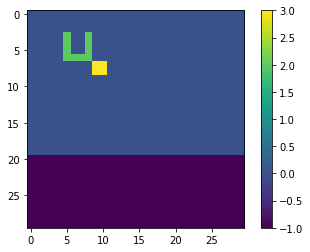

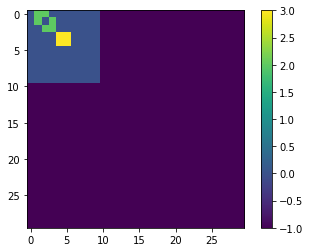

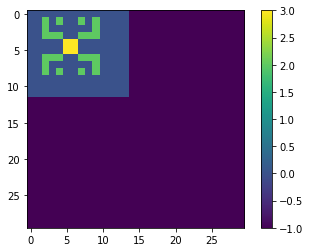

TEST


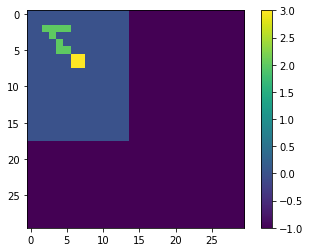

LOSS AT EPOCH 428: tf.Tensor(0.0031009537629279604, shape=(), dtype=float64)
TRAINING


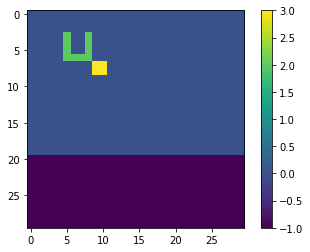

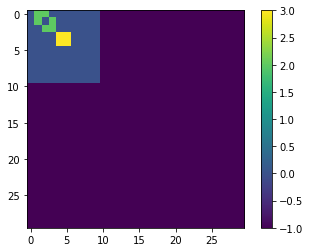

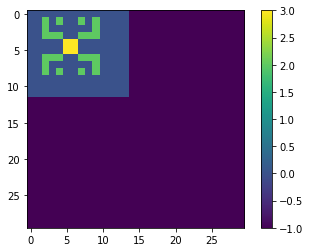

TEST


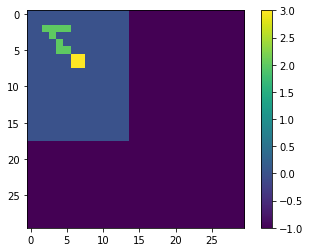

LOSS AT EPOCH 430: tf.Tensor(0.0031004817242146544, shape=(), dtype=float64)
TRAINING


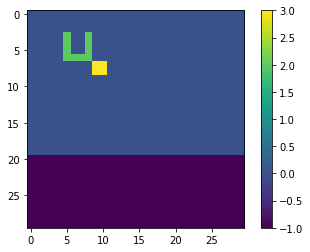

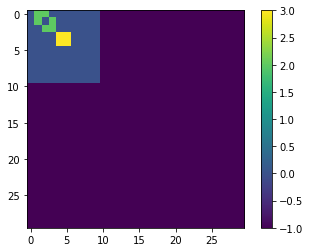

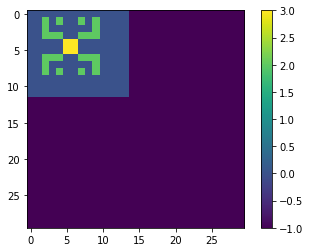

TEST


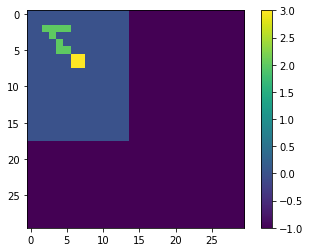

LOSS AT EPOCH 432: tf.Tensor(0.0031000153049675168, shape=(), dtype=float64)
TRAINING


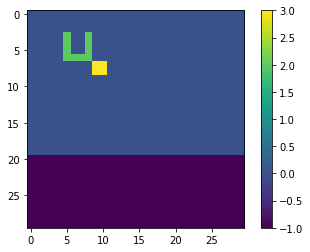

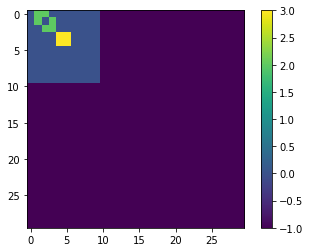

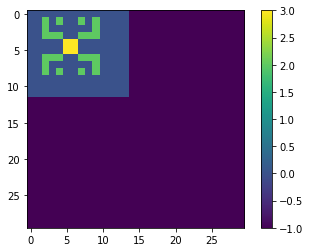

TEST


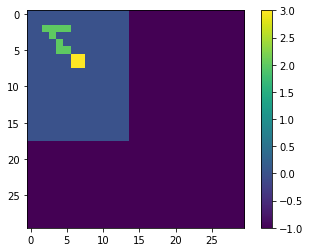

LOSS AT EPOCH 434: tf.Tensor(0.00309955746823202, shape=(), dtype=float64)
TRAINING


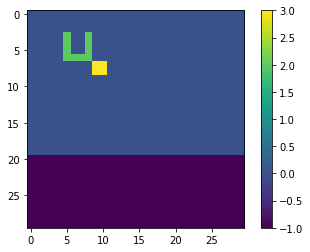

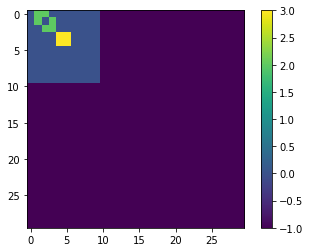

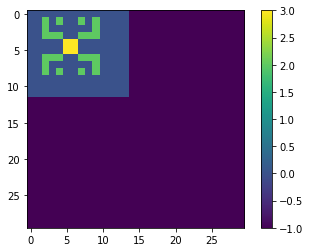

TEST


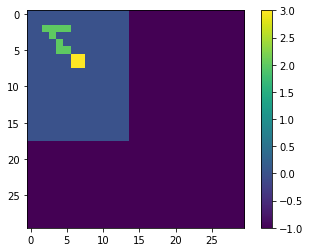

LOSS AT EPOCH 436: tf.Tensor(0.003099101468251226, shape=(), dtype=float64)
TRAINING


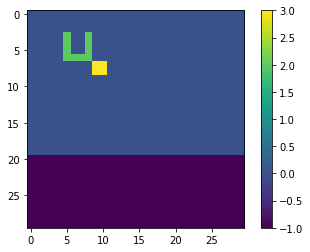

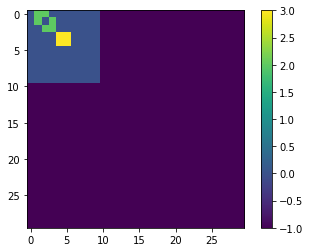

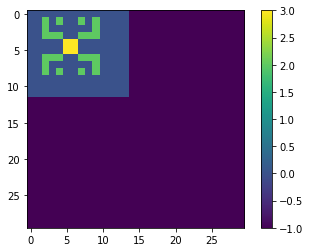

TEST


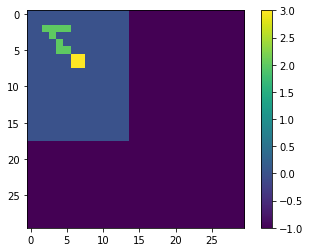

LOSS AT EPOCH 438: tf.Tensor(0.0030986465922862123, shape=(), dtype=float64)
TRAINING


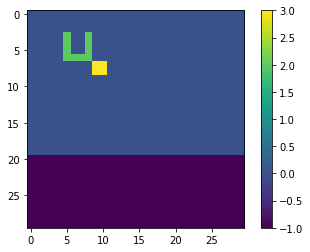

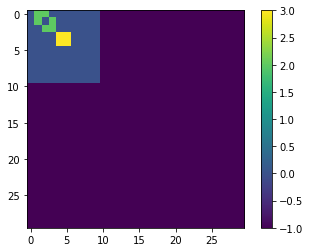

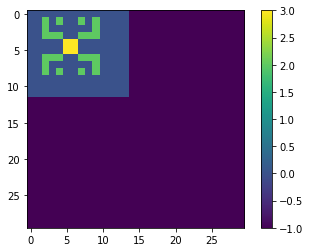

TEST


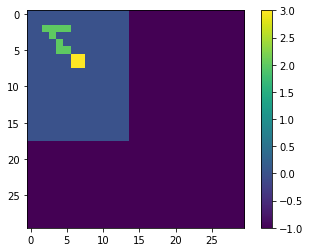

LOSS AT EPOCH 440: tf.Tensor(0.003098201882237438, shape=(), dtype=float64)
TRAINING


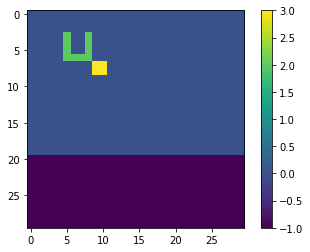

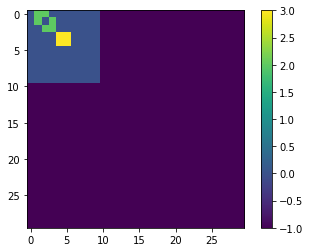

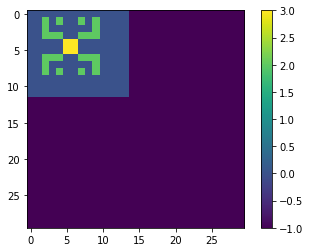

TEST


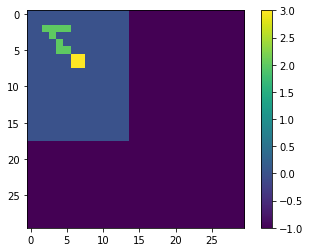

LOSS AT EPOCH 442: tf.Tensor(0.0030977580773965687, shape=(), dtype=float64)
TRAINING


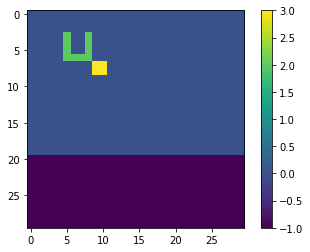

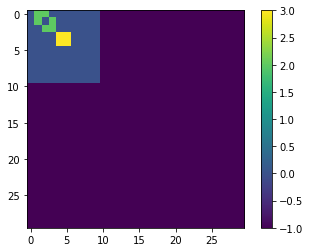

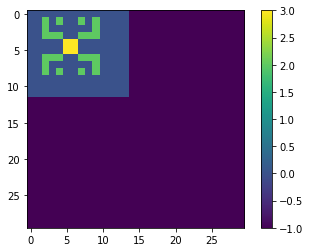

TEST


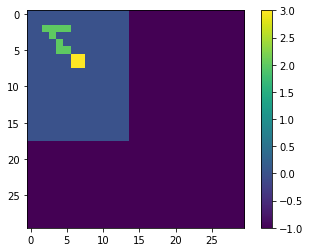

LOSS AT EPOCH 444: tf.Tensor(0.0030973159236820516, shape=(), dtype=float64)
TRAINING


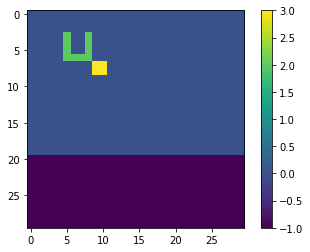

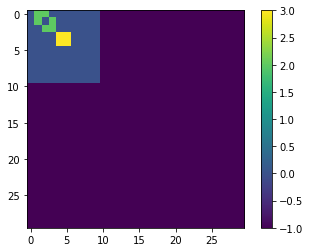

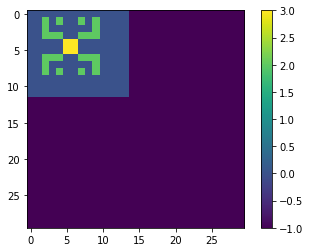

TEST


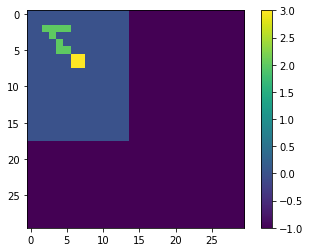

LOSS AT EPOCH 446: tf.Tensor(0.0030968810630338977, shape=(), dtype=float64)
TRAINING


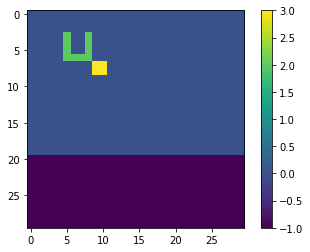

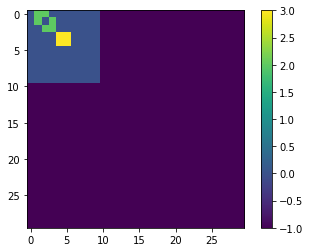

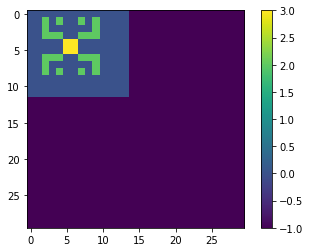

TEST


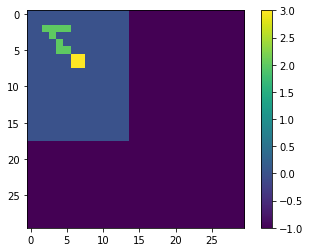

LOSS AT EPOCH 448: tf.Tensor(0.0030964529183299385, shape=(), dtype=float64)
TRAINING


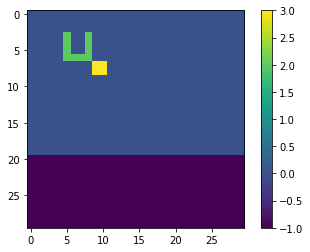

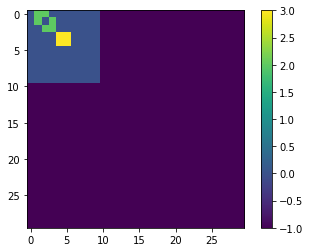

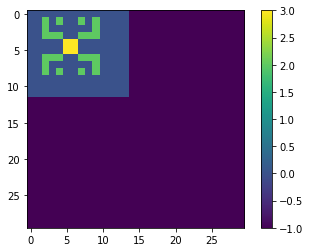

TEST


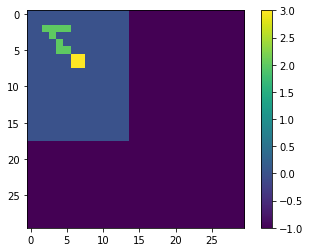

LOSS AT EPOCH 450: tf.Tensor(0.0030960261690330757, shape=(), dtype=float64)
TRAINING


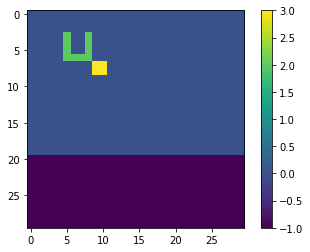

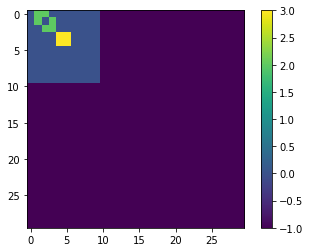

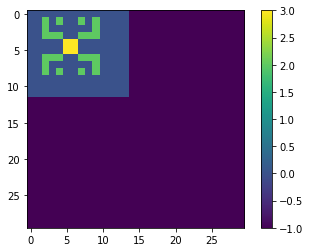

TEST


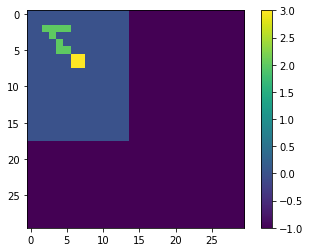

LOSS AT EPOCH 452: tf.Tensor(0.003095607613157354, shape=(), dtype=float64)
TRAINING


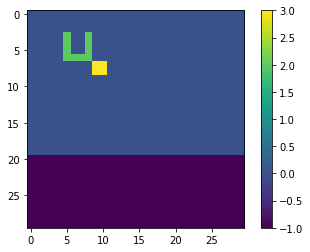

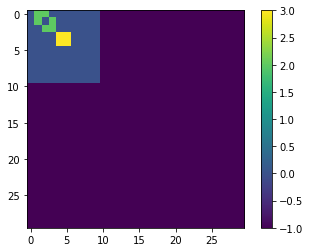

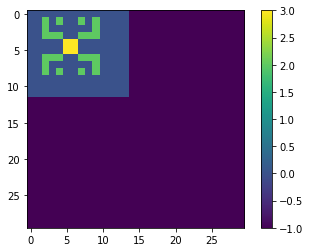

TEST


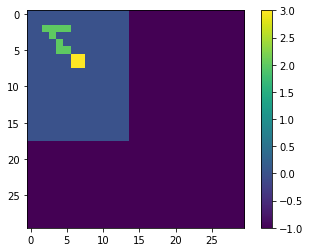

LOSS AT EPOCH 454: tf.Tensor(0.0030951971084191175, shape=(), dtype=float64)
TRAINING


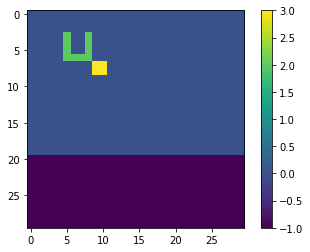

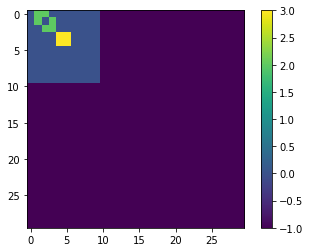

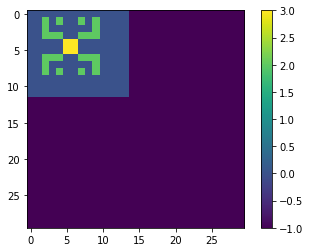

TEST


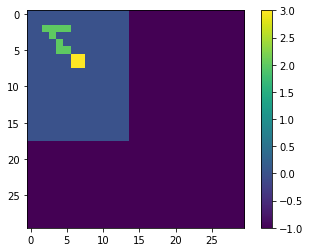

LOSS AT EPOCH 456: tf.Tensor(0.0030947944369746462, shape=(), dtype=float64)
TRAINING


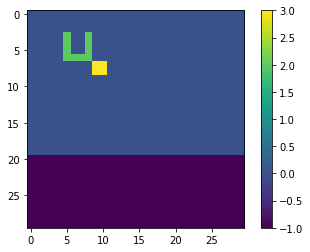

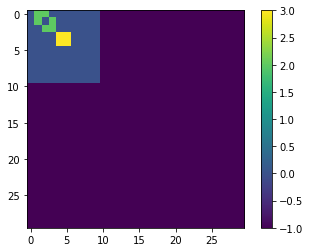

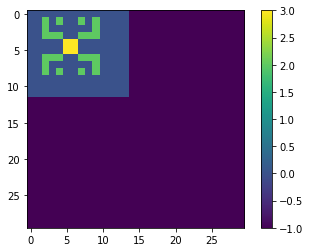

TEST


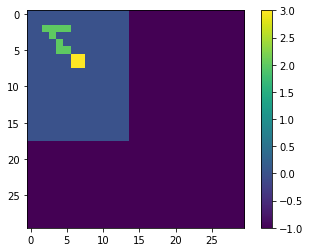

LOSS AT EPOCH 458: tf.Tensor(0.0030943917893987145, shape=(), dtype=float64)
TRAINING


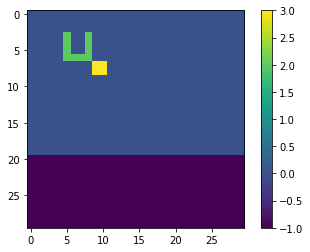

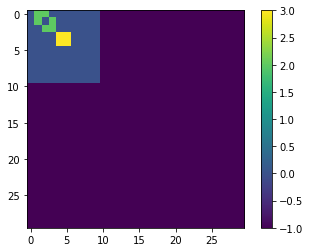

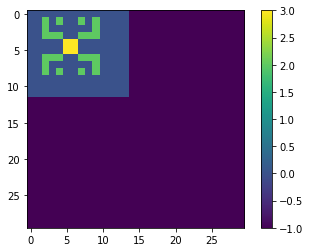

TEST


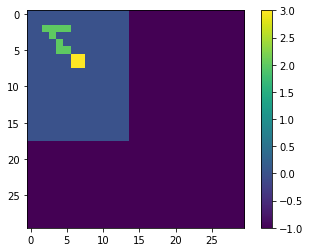

LOSS AT EPOCH 460: tf.Tensor(0.0030939948238360927, shape=(), dtype=float64)
TRAINING


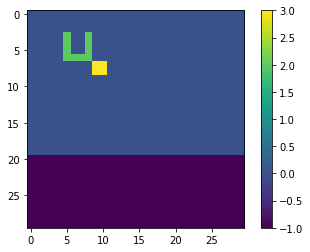

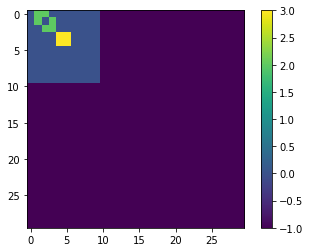

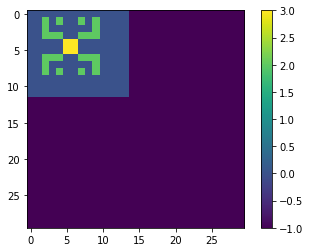

TEST


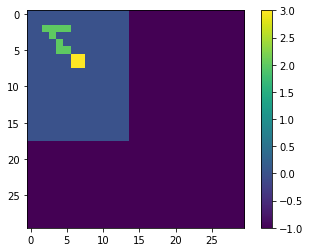

LOSS AT EPOCH 462: tf.Tensor(0.0030936044781746394, shape=(), dtype=float64)
TRAINING


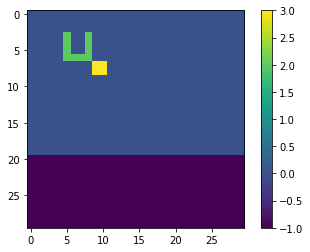

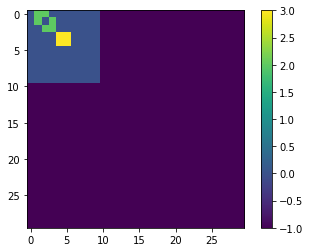

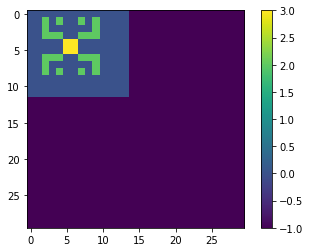

TEST


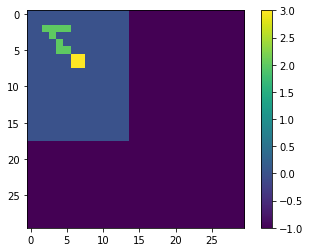

LOSS AT EPOCH 464: tf.Tensor(0.0030932216586609545, shape=(), dtype=float64)
TRAINING


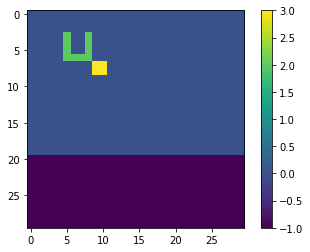

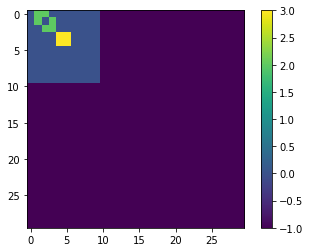

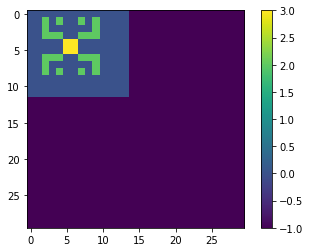

TEST


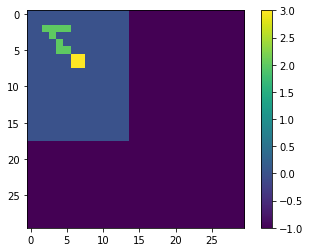

LOSS AT EPOCH 466: tf.Tensor(0.0030928460252239703, shape=(), dtype=float64)
TRAINING


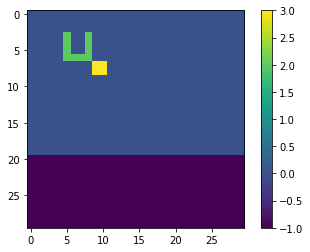

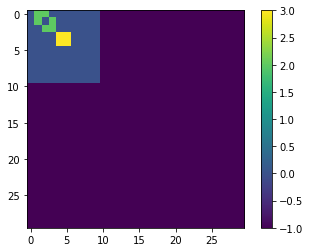

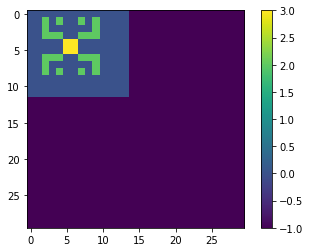

TEST


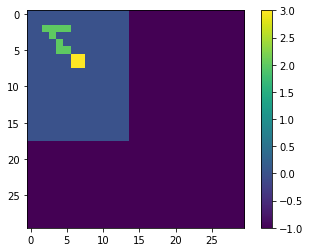

LOSS AT EPOCH 468: tf.Tensor(0.003092475955138989, shape=(), dtype=float64)
TRAINING


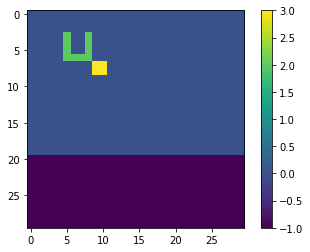

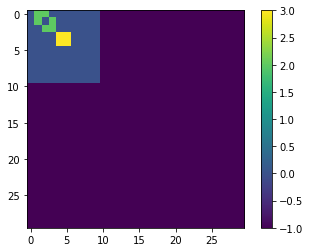

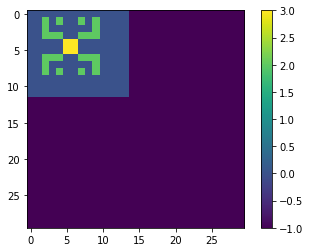

TEST


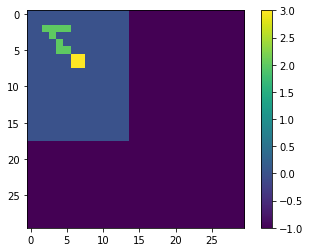

LOSS AT EPOCH 470: tf.Tensor(0.0030921104624400636, shape=(), dtype=float64)
TRAINING


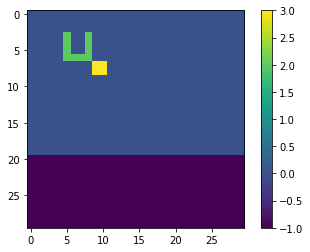

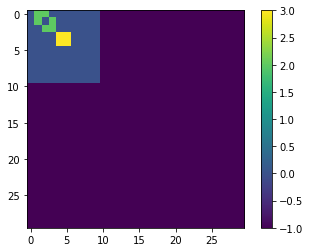

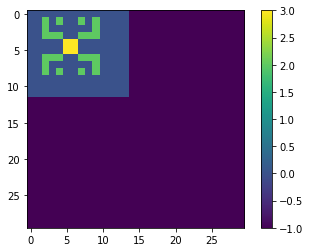

TEST


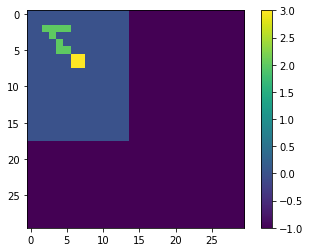

LOSS AT EPOCH 472: tf.Tensor(0.003091750617603284, shape=(), dtype=float64)
TRAINING


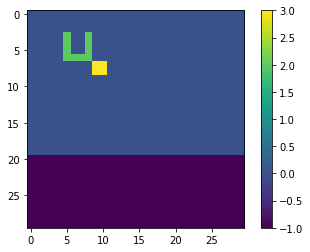

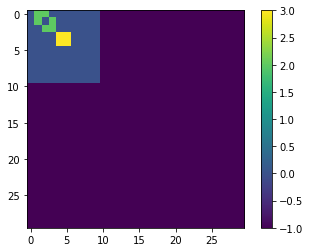

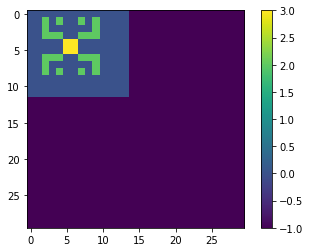

TEST


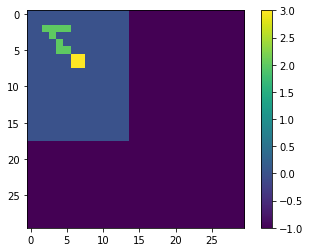

LOSS AT EPOCH 474: tf.Tensor(0.003091396094157169, shape=(), dtype=float64)
TRAINING


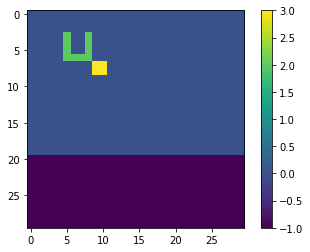

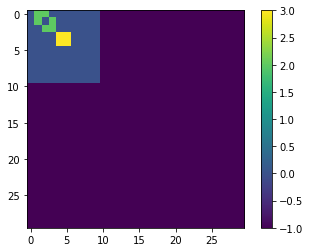

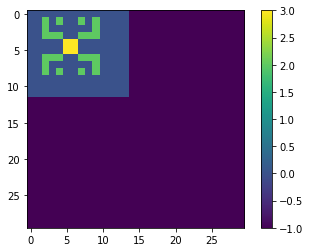

TEST


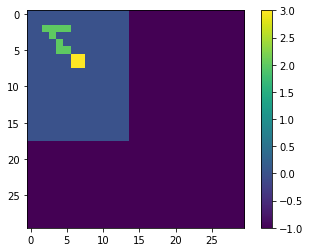

LOSS AT EPOCH 476: tf.Tensor(0.003091045911322839, shape=(), dtype=float64)
TRAINING


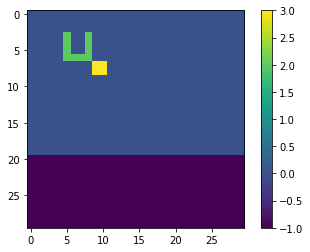

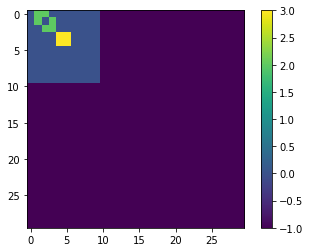

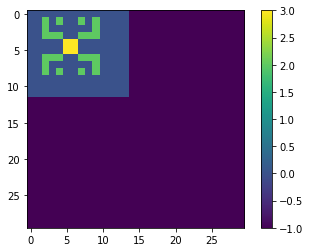

TEST


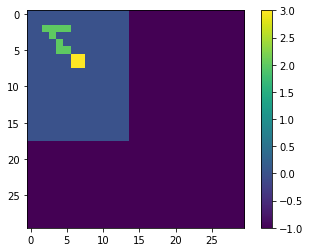

LOSS AT EPOCH 478: tf.Tensor(0.0030907002736258946, shape=(), dtype=float64)
TRAINING


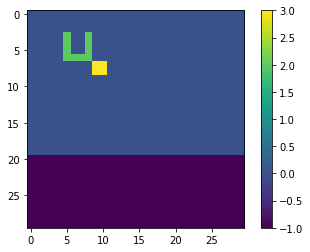

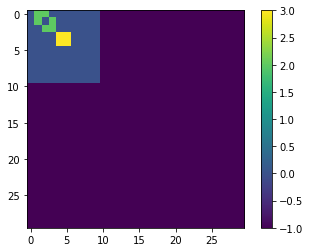

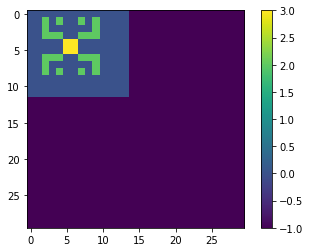

TEST


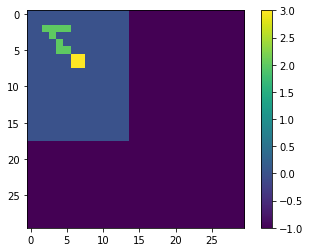

LOSS AT EPOCH 480: tf.Tensor(0.003090361365026384, shape=(), dtype=float64)
TRAINING


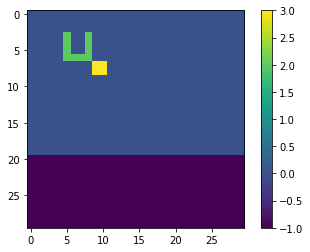

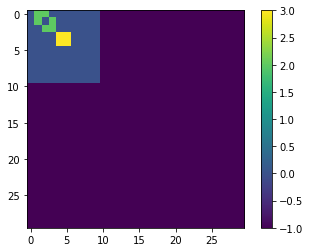

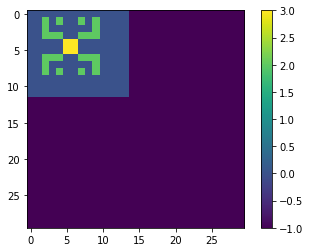

TEST


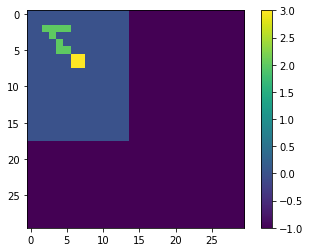

LOSS AT EPOCH 482: tf.Tensor(0.0030900291420162605, shape=(), dtype=float64)
TRAINING


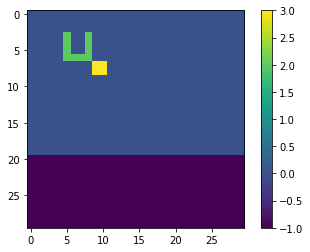

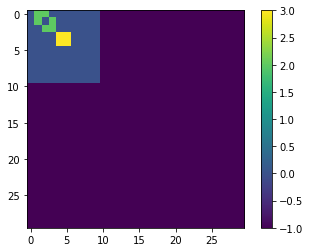

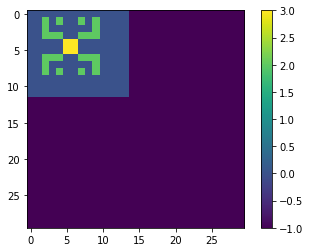

TEST


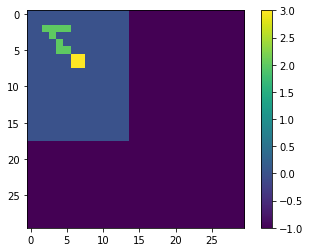

LOSS AT EPOCH 484: tf.Tensor(0.003089701087365763, shape=(), dtype=float64)
TRAINING


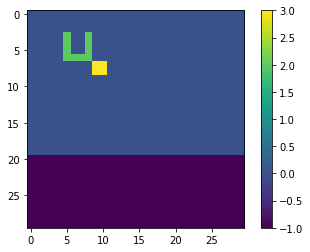

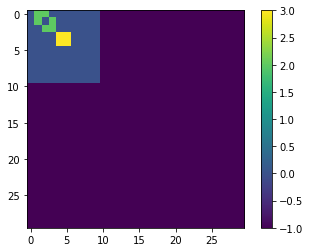

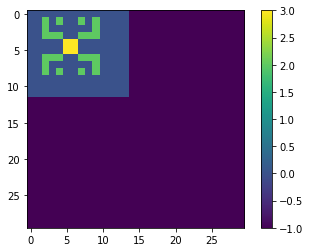

TEST


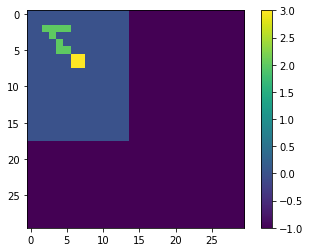

LOSS AT EPOCH 486: tf.Tensor(0.003089375500420874, shape=(), dtype=float64)
TRAINING


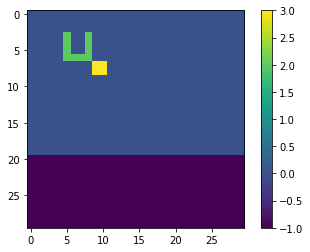

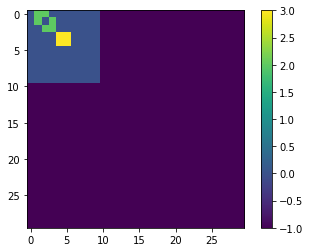

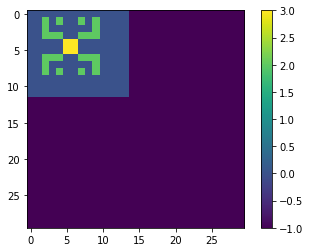

TEST


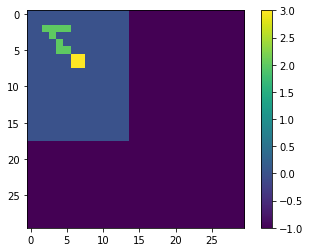

LOSS AT EPOCH 488: tf.Tensor(0.0030890549925408862, shape=(), dtype=float64)
TRAINING


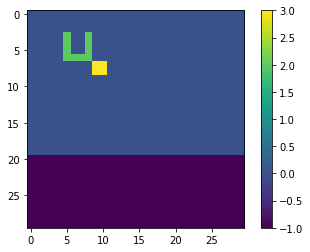

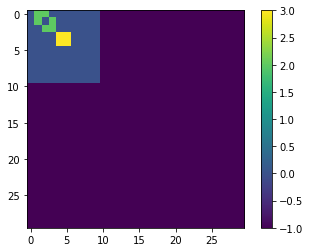

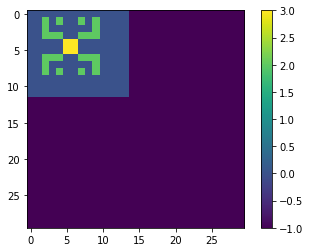

TEST


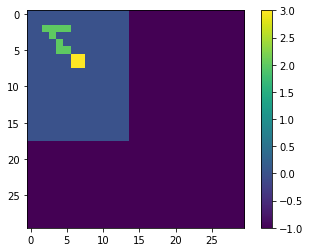

LOSS AT EPOCH 490: tf.Tensor(0.0030887414042350546, shape=(), dtype=float64)
TRAINING


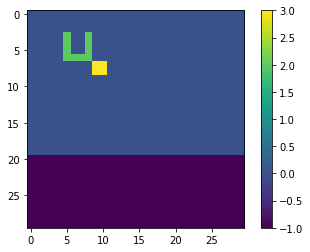

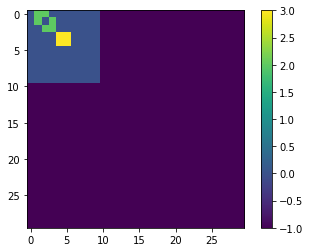

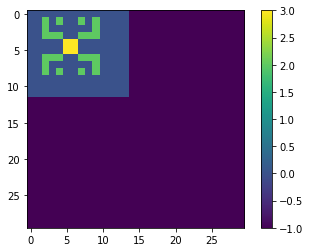

TEST


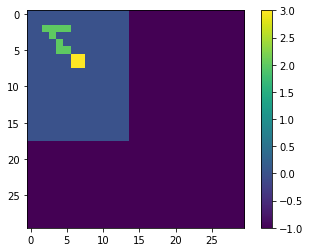

LOSS AT EPOCH 492: tf.Tensor(0.0030884260717908216, shape=(), dtype=float64)
TRAINING


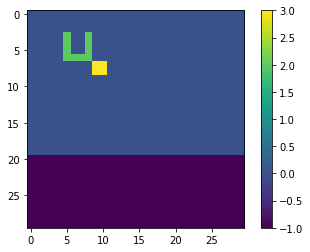

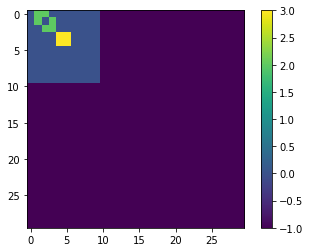

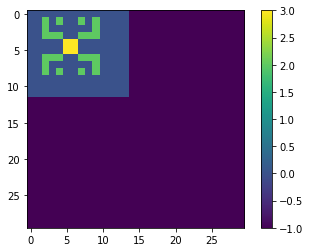

TEST


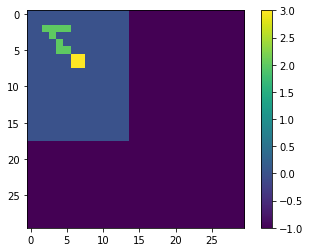

LOSS AT EPOCH 494: tf.Tensor(0.003088117077164792, shape=(), dtype=float64)
TRAINING


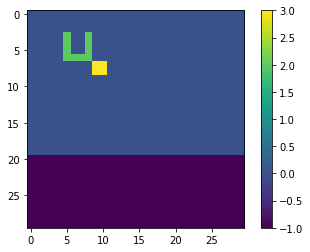

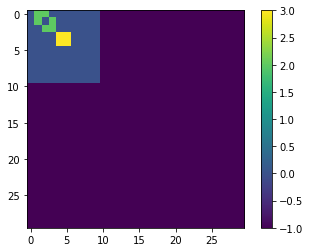

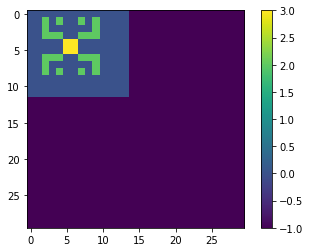

TEST


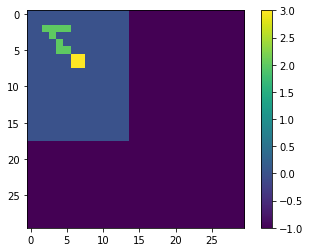

LOSS AT EPOCH 496: tf.Tensor(0.0030878150309305626, shape=(), dtype=float64)
TRAINING


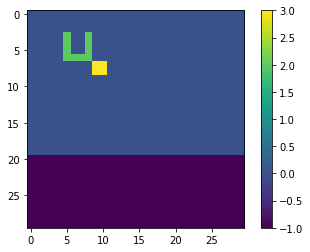

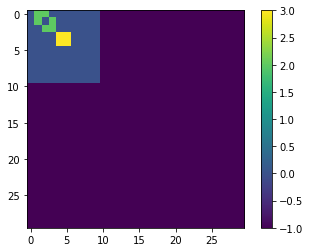

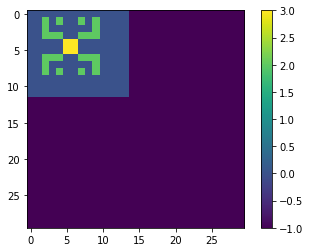

TEST


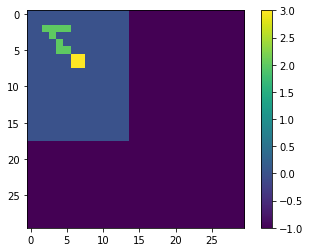

LOSS AT EPOCH 498: tf.Tensor(0.0030875192931377735, shape=(), dtype=float64)
TRAINING


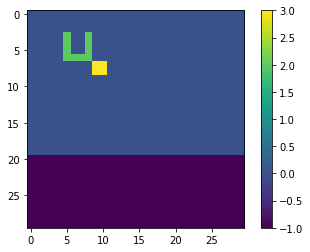

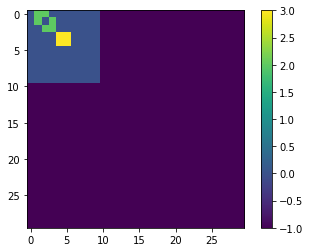

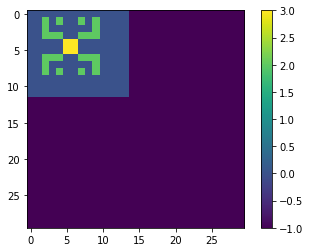

TEST


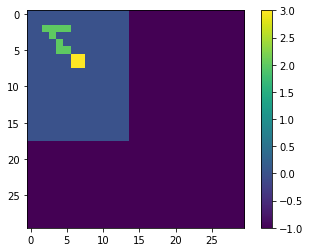

LOSS AT EPOCH 500: tf.Tensor(0.003087223691699784, shape=(), dtype=float64)
TRAINING


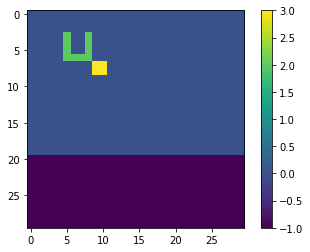

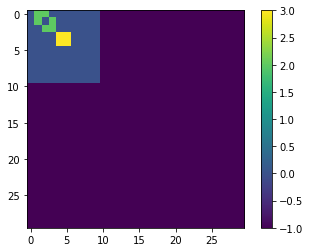

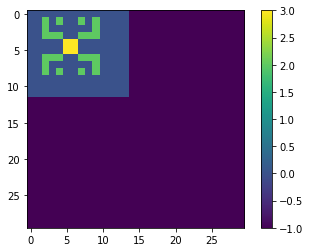

TEST


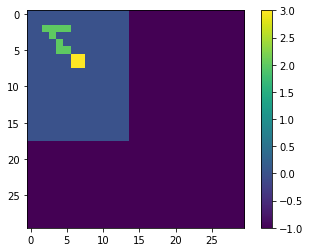

LOSS AT EPOCH 502: tf.Tensor(0.003086932614855406, shape=(), dtype=float64)
TRAINING


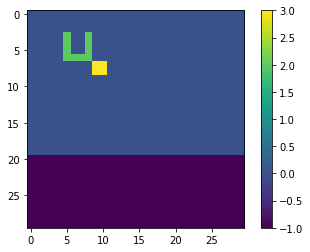

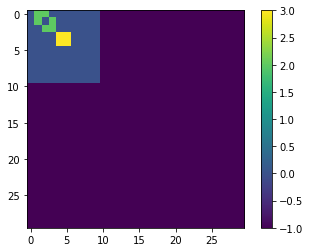

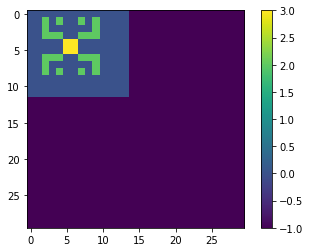

TEST


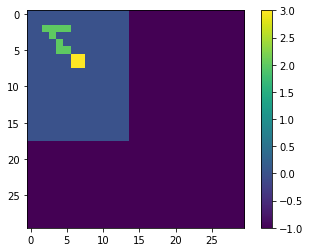

LOSS AT EPOCH 504: tf.Tensor(0.0030866486858537635, shape=(), dtype=float64)
TRAINING


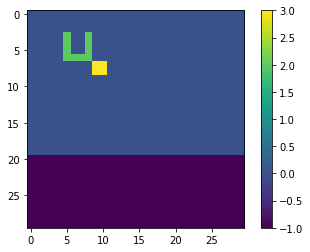

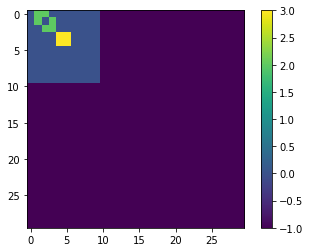

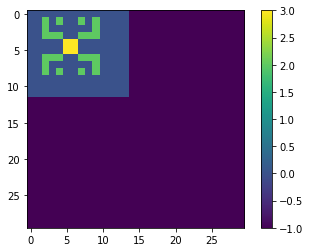

TEST


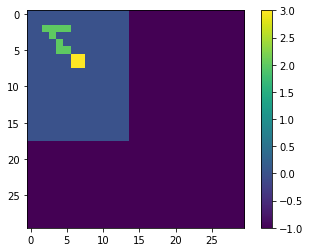

LOSS AT EPOCH 506: tf.Tensor(0.0030863694336459584, shape=(), dtype=float64)
TRAINING


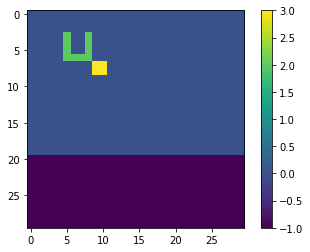

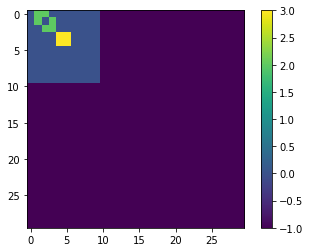

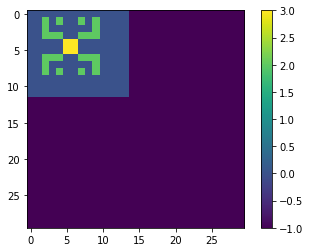

TEST


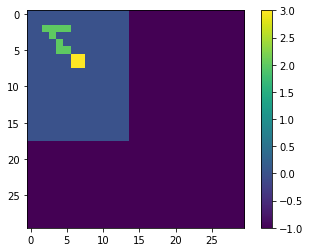

LOSS AT EPOCH 508: tf.Tensor(0.0030860975151783925, shape=(), dtype=float64)
TRAINING


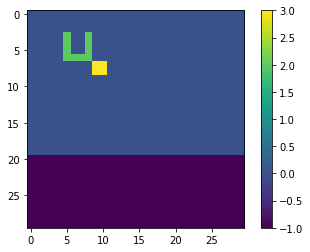

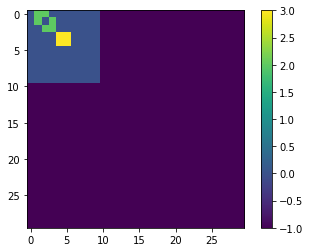

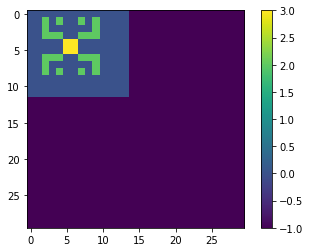

TEST


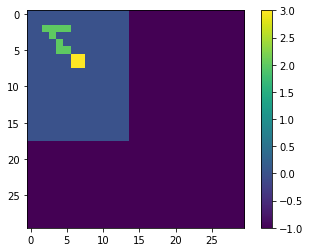

LOSS AT EPOCH 510: tf.Tensor(0.003085829272149878, shape=(), dtype=float64)
TRAINING


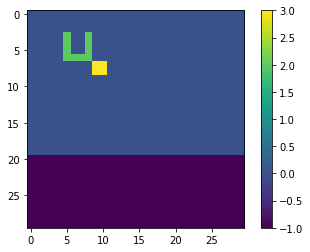

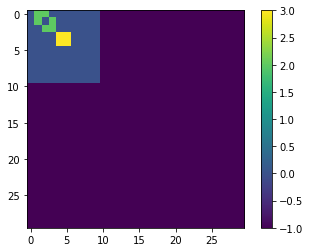

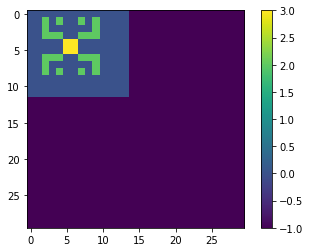

TEST


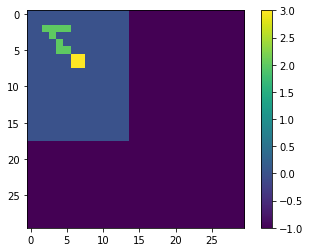

LOSS AT EPOCH 512: tf.Tensor(0.0030855621829845325, shape=(), dtype=float64)
TRAINING


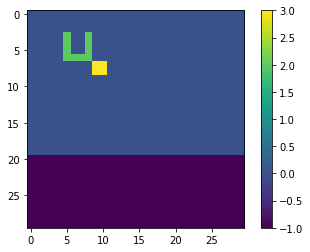

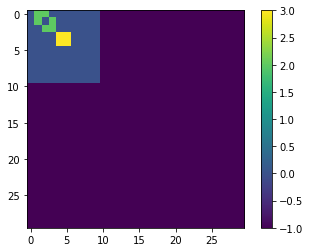

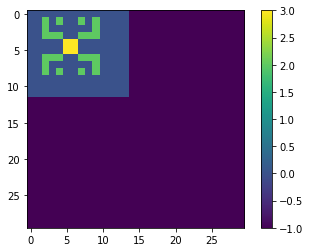

TEST


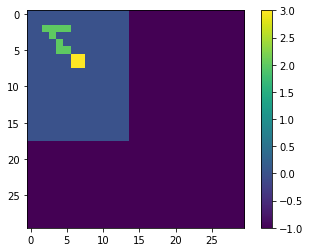

LOSS AT EPOCH 514: tf.Tensor(0.003085300369092713, shape=(), dtype=float64)
TRAINING


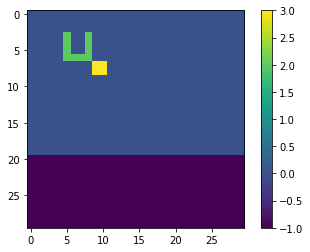

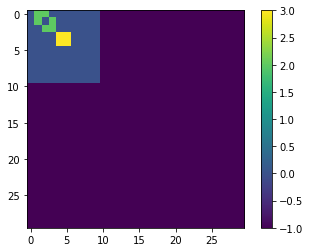

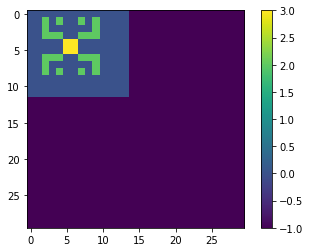

TEST


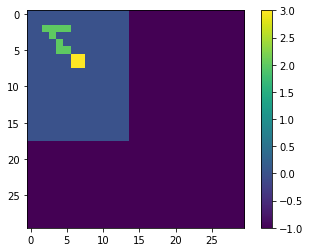

LOSS AT EPOCH 516: tf.Tensor(0.003085043816074543, shape=(), dtype=float64)
TRAINING


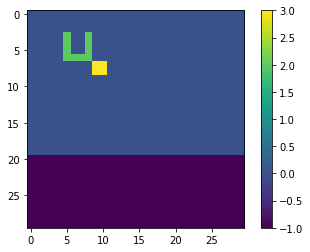

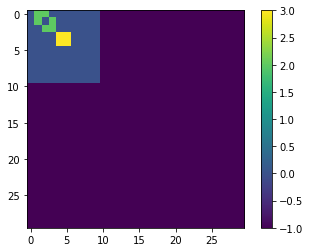

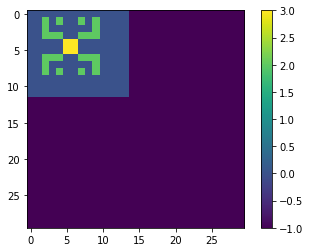

TEST


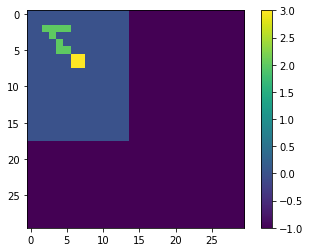

LOSS AT EPOCH 518: tf.Tensor(0.0030847928659627952, shape=(), dtype=float64)
TRAINING


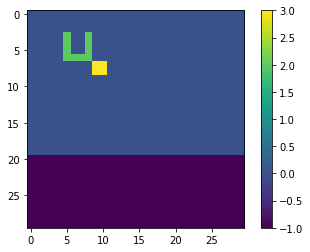

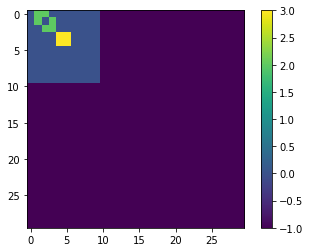

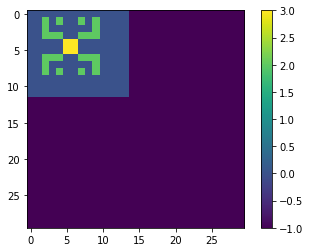

TEST


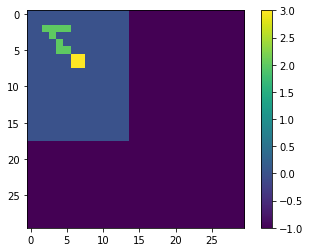

LOSS AT EPOCH 520: tf.Tensor(0.0030845473062370613, shape=(), dtype=float64)
TRAINING


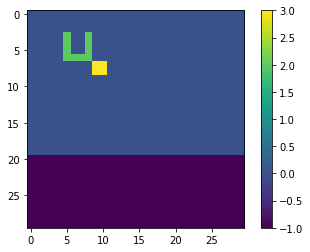

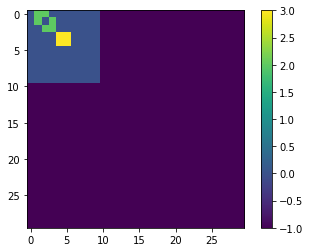

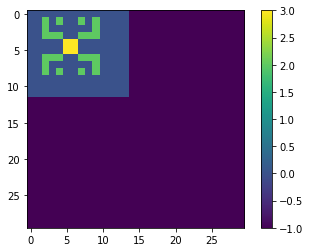

TEST


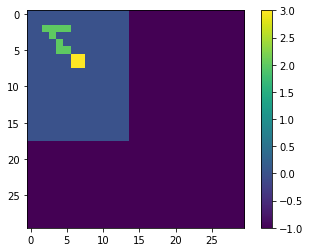

LOSS AT EPOCH 522: tf.Tensor(0.0030843070995799104, shape=(), dtype=float64)
TRAINING


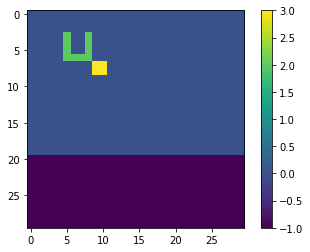

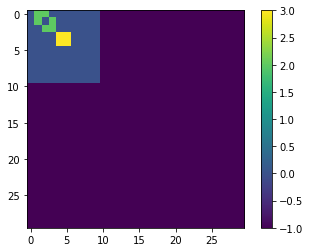

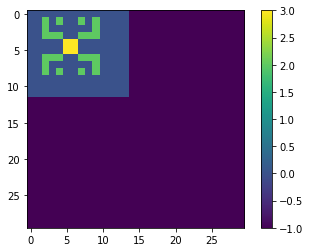

TEST


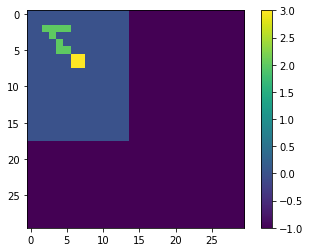

LOSS AT EPOCH 524: tf.Tensor(0.00308407241388984, shape=(), dtype=float64)
TRAINING


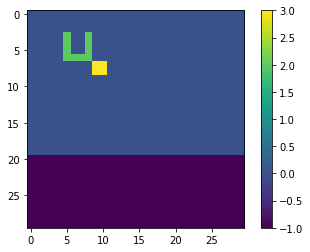

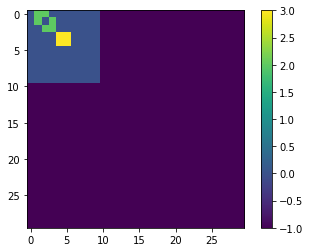

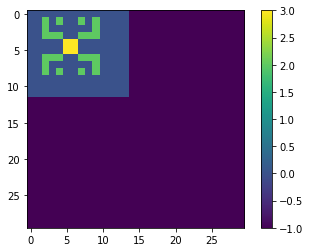

TEST


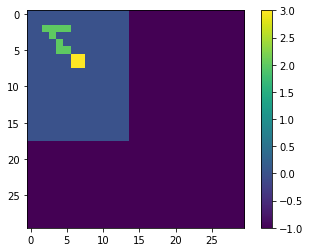

LOSS AT EPOCH 526: tf.Tensor(0.0030838438460728686, shape=(), dtype=float64)
TRAINING


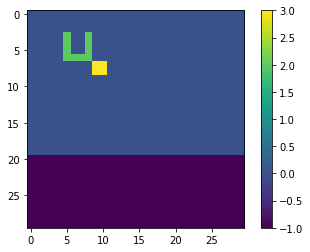

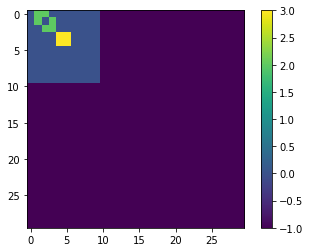

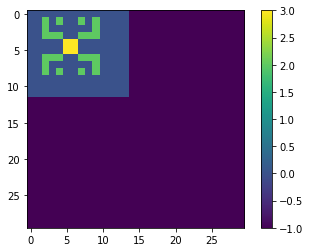

TEST


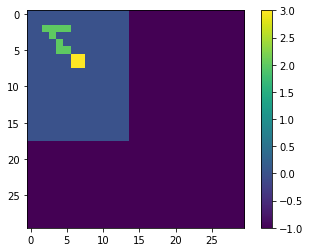

LOSS AT EPOCH 528: tf.Tensor(0.0030836206347931382, shape=(), dtype=float64)
TRAINING


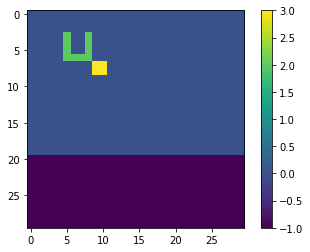

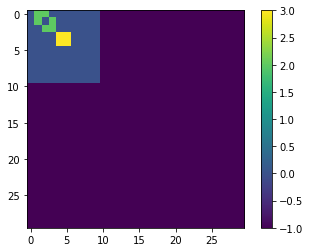

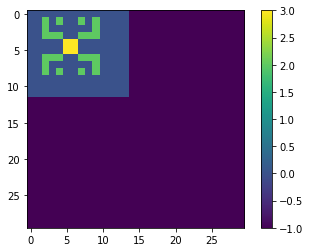

TEST


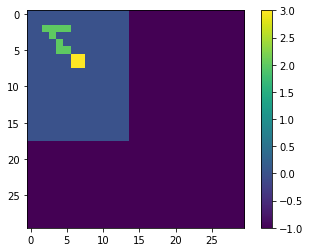

LOSS AT EPOCH 530: tf.Tensor(0.0030834024140369257, shape=(), dtype=float64)
TRAINING


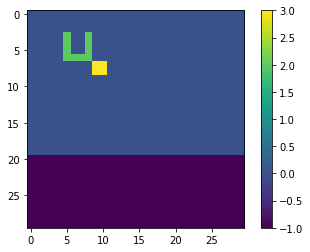

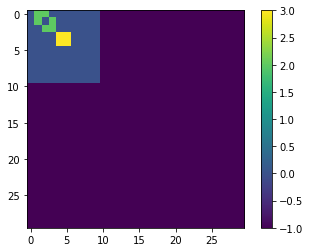

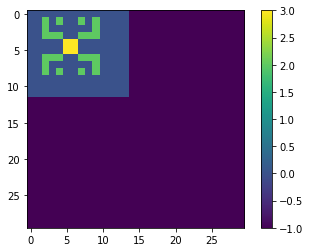

TEST


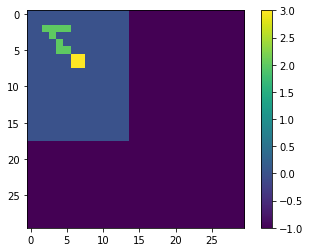

LOSS AT EPOCH 532: tf.Tensor(0.003083189104798423, shape=(), dtype=float64)
TRAINING


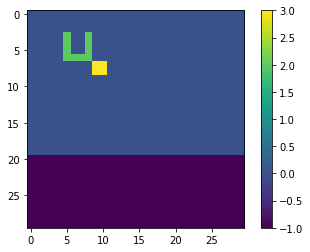

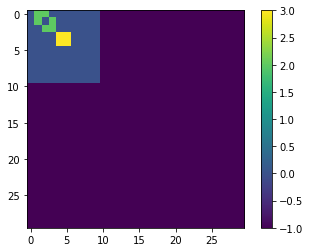

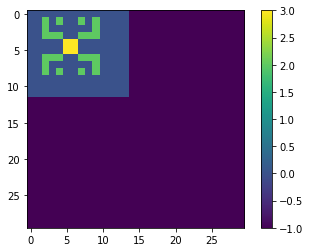

TEST


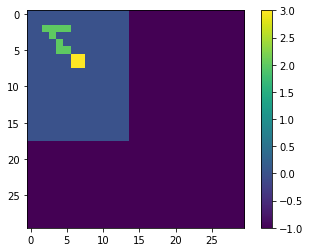

LOSS AT EPOCH 534: tf.Tensor(0.0030829803334738487, shape=(), dtype=float64)
TRAINING


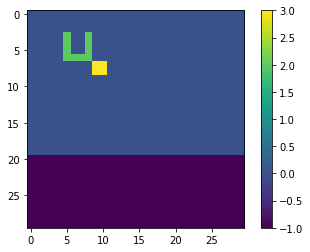

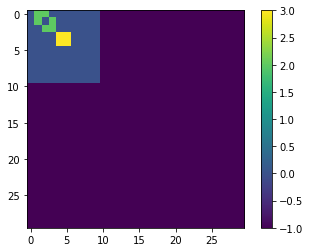

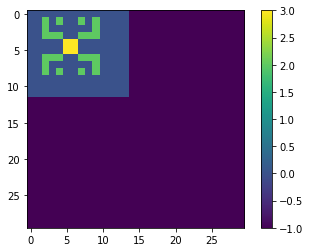

TEST


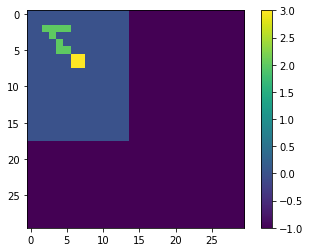

LOSS AT EPOCH 536: tf.Tensor(0.0030827759841069, shape=(), dtype=float64)
TRAINING


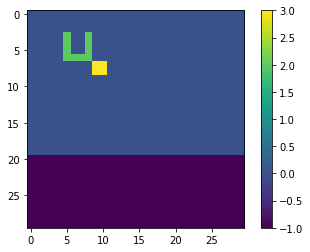

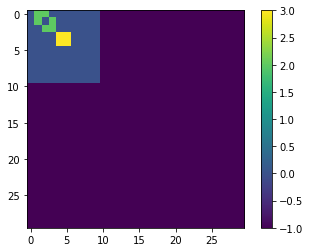

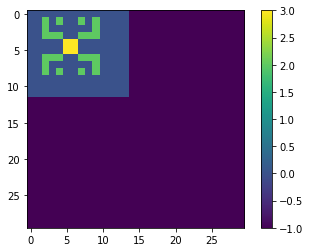

TEST


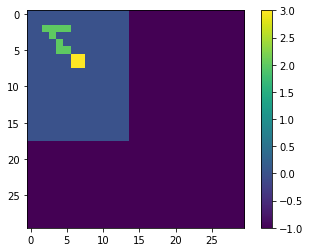

LOSS AT EPOCH 538: tf.Tensor(0.003082576318187468, shape=(), dtype=float64)
TRAINING


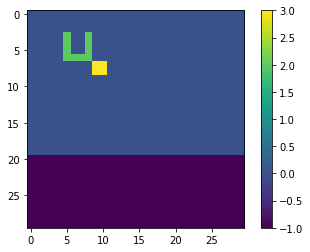

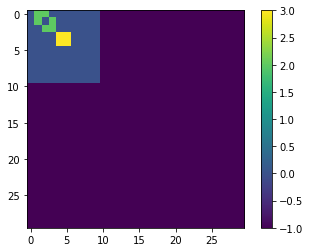

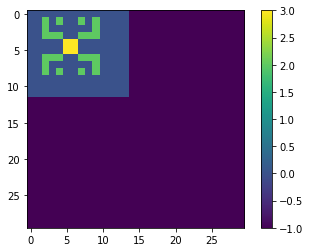

TEST


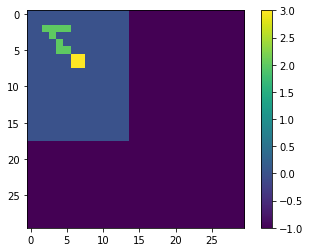

LOSS AT EPOCH 540: tf.Tensor(0.00308238004561831, shape=(), dtype=float64)
TRAINING


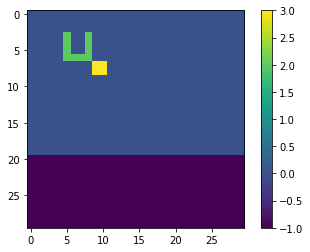

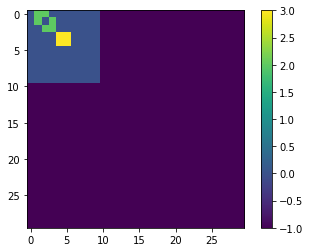

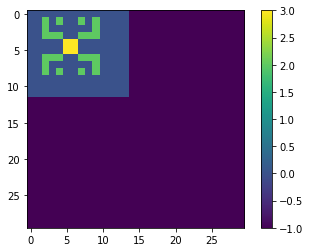

TEST


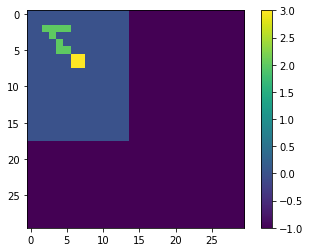

LOSS AT EPOCH 542: tf.Tensor(0.0030821884631514777, shape=(), dtype=float64)
TRAINING


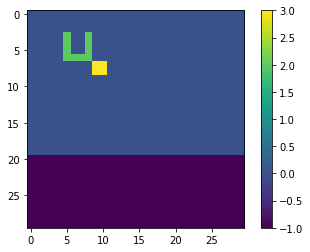

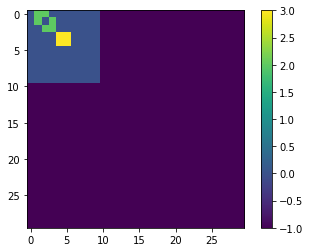

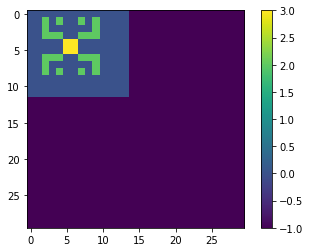

TEST


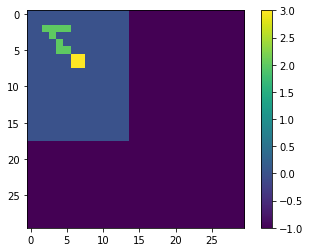

LOSS AT EPOCH 544: tf.Tensor(0.0030820009189220796, shape=(), dtype=float64)
TRAINING


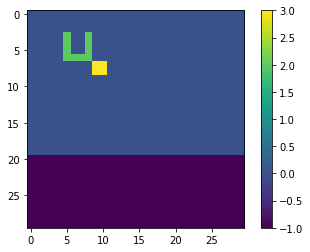

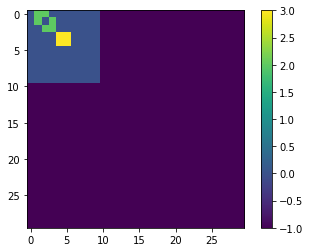

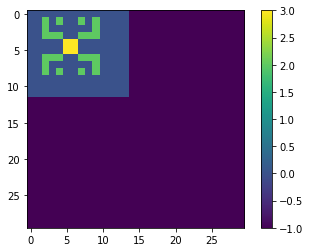

TEST


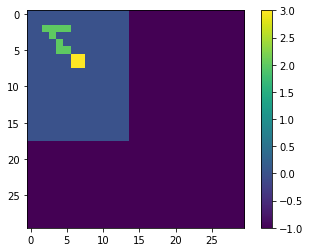

LOSS AT EPOCH 546: tf.Tensor(0.003081817434854391, shape=(), dtype=float64)
TRAINING


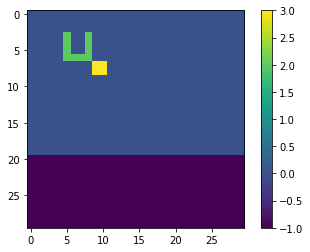

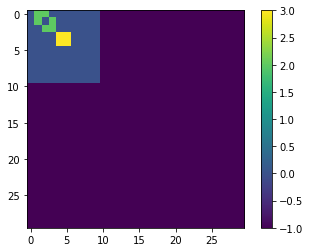

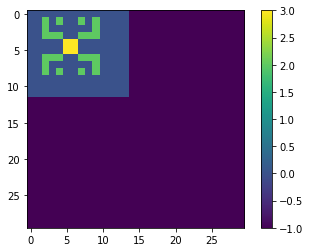

TEST


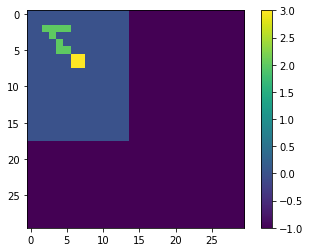

LOSS AT EPOCH 548: tf.Tensor(0.0030816375953612077, shape=(), dtype=float64)
TRAINING


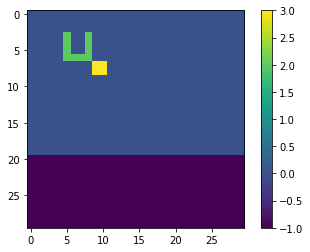

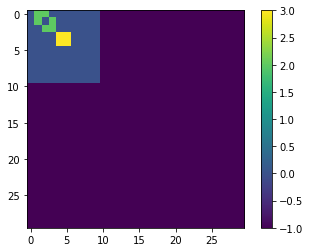

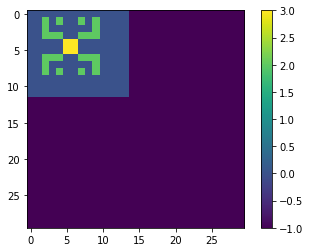

TEST


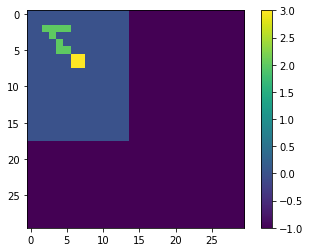

LOSS AT EPOCH 550: tf.Tensor(0.00308146153480969, shape=(), dtype=float64)
TRAINING


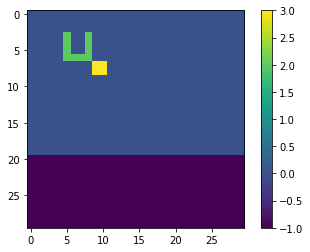

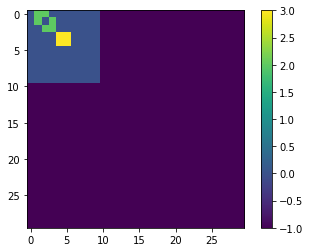

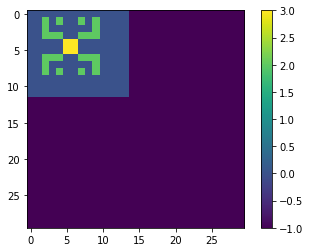

TEST


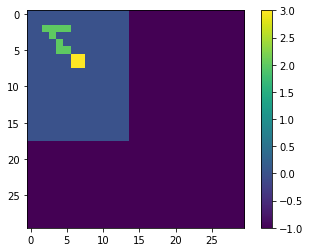

LOSS AT EPOCH 552: tf.Tensor(0.0030812893865046404, shape=(), dtype=float64)
TRAINING


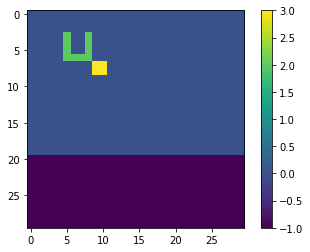

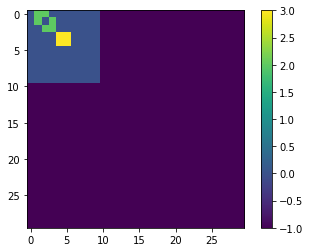

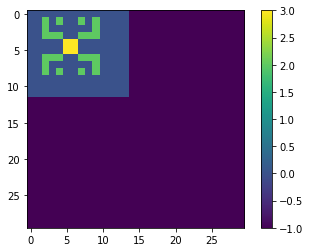

TEST


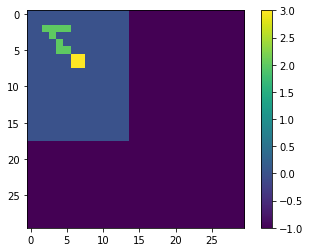

LOSS AT EPOCH 554: tf.Tensor(0.003081120408409883, shape=(), dtype=float64)
TRAINING


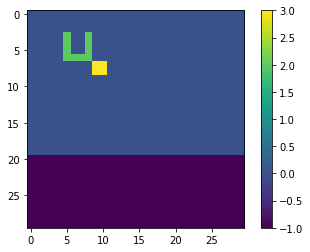

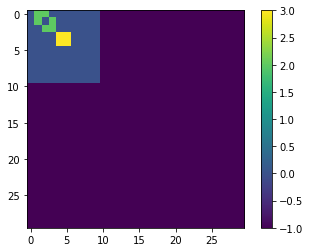

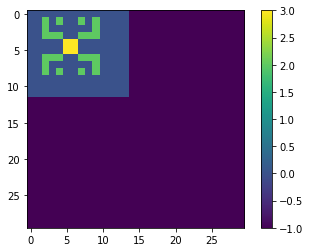

TEST


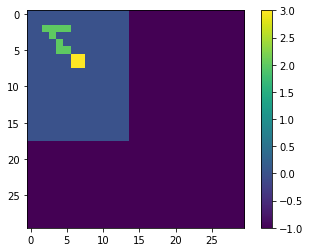

LOSS AT EPOCH 556: tf.Tensor(0.0030809544517228266, shape=(), dtype=float64)
TRAINING


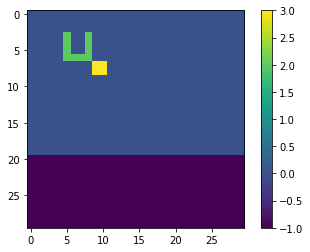

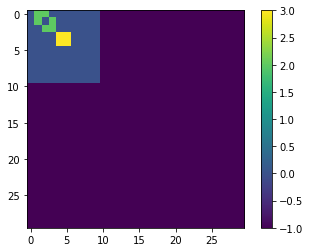

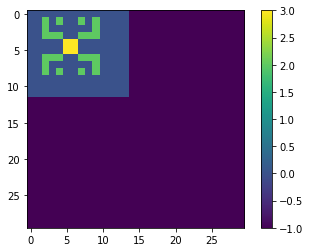

TEST


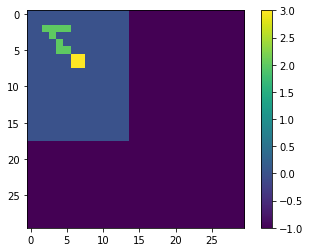

LOSS AT EPOCH 558: tf.Tensor(0.003080791894042687, shape=(), dtype=float64)
TRAINING


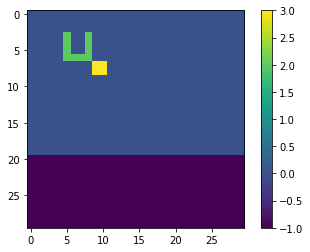

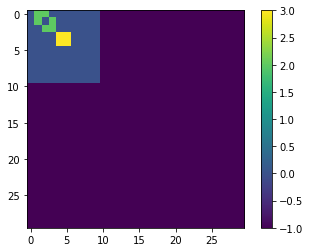

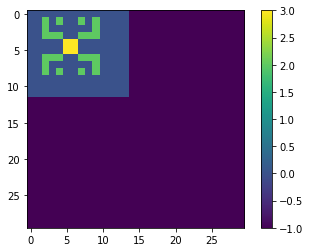

TEST


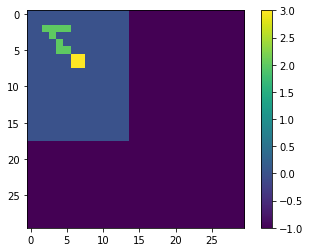

LOSS AT EPOCH 560: tf.Tensor(0.0030806320985444554, shape=(), dtype=float64)
TRAINING


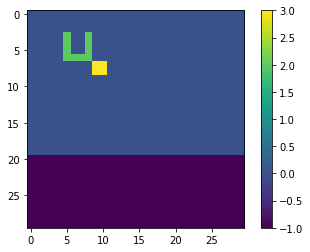

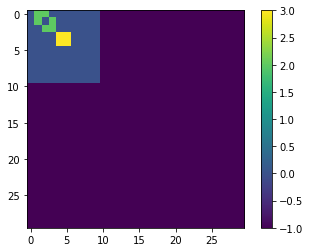

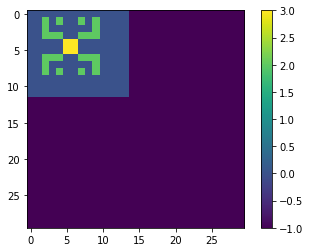

TEST


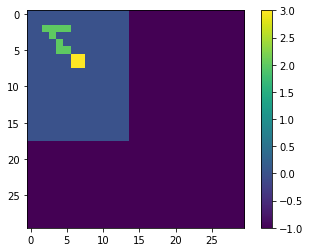

LOSS AT EPOCH 562: tf.Tensor(0.0030804760503354554, shape=(), dtype=float64)
TRAINING


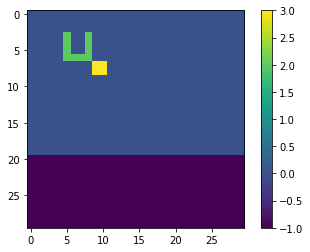

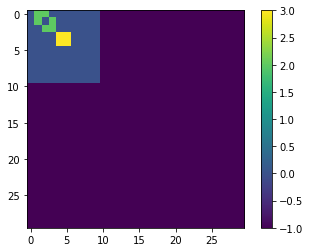

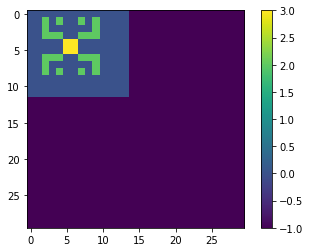

TEST


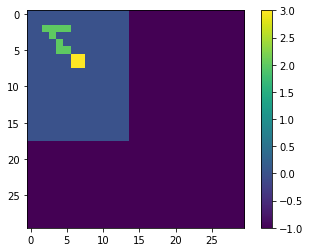

LOSS AT EPOCH 564: tf.Tensor(0.003080322947861498, shape=(), dtype=float64)
TRAINING


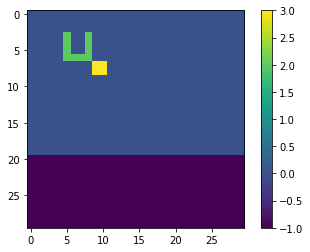

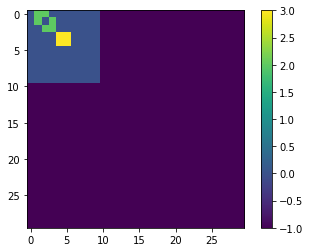

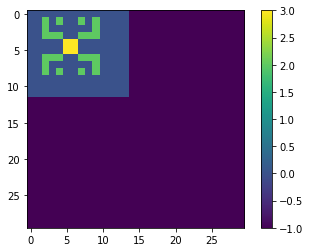

TEST


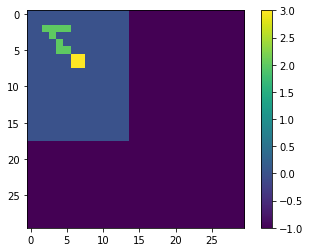

LOSS AT EPOCH 566: tf.Tensor(0.0030801726931980896, shape=(), dtype=float64)
TRAINING


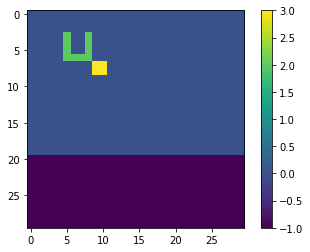

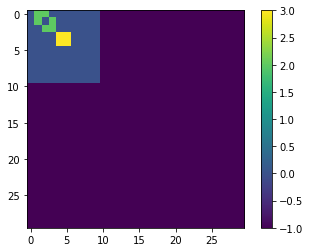

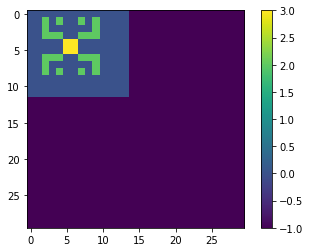

TEST


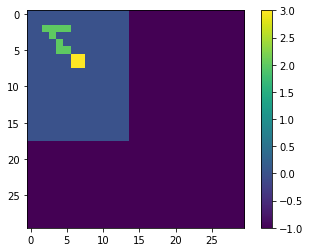

LOSS AT EPOCH 568: tf.Tensor(0.003080025312489426, shape=(), dtype=float64)
TRAINING


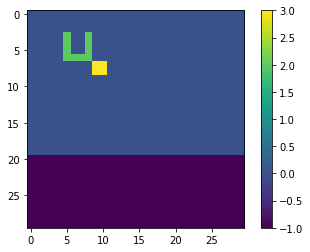

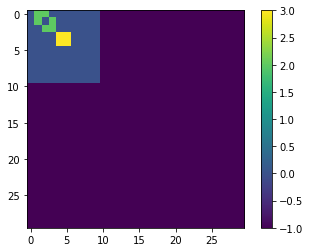

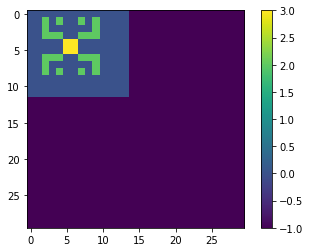

TEST


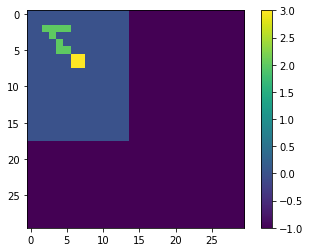

LOSS AT EPOCH 570: tf.Tensor(0.0030798804503535007, shape=(), dtype=float64)
TRAINING


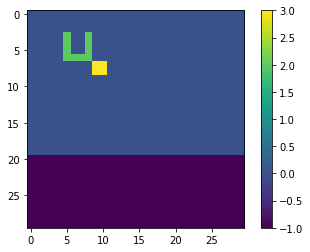

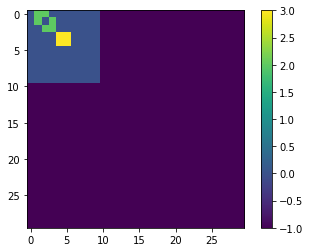

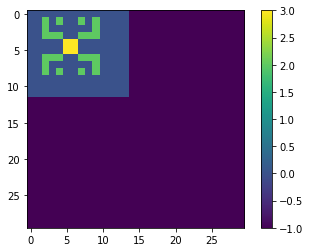

TEST


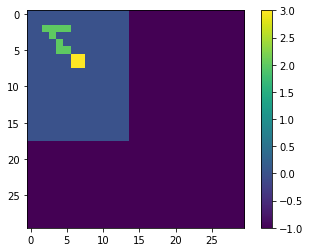

LOSS AT EPOCH 572: tf.Tensor(0.0030797383729993387, shape=(), dtype=float64)
TRAINING


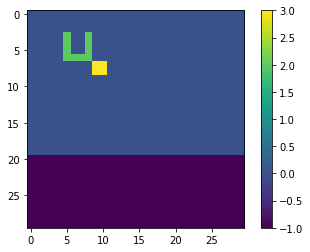

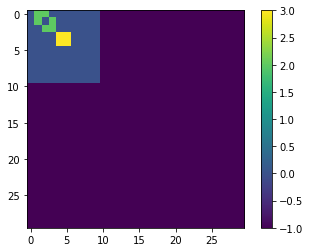

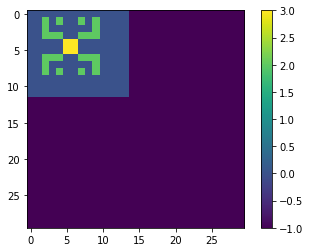

TEST


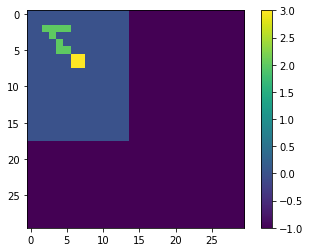

LOSS AT EPOCH 574: tf.Tensor(0.0030795994328878555, shape=(), dtype=float64)
TRAINING


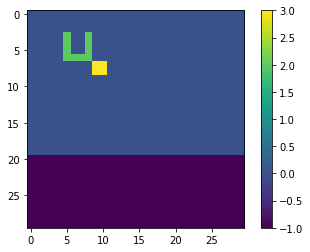

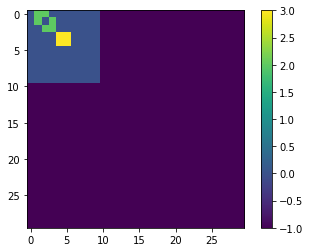

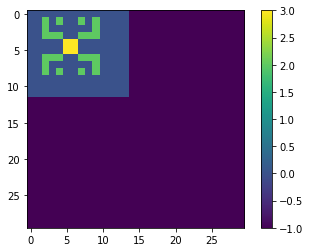

TEST


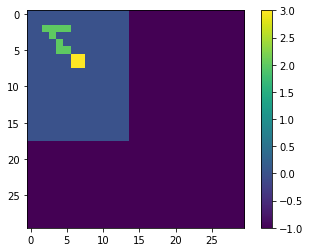

LOSS AT EPOCH 576: tf.Tensor(0.0030794630097560807, shape=(), dtype=float64)
TRAINING


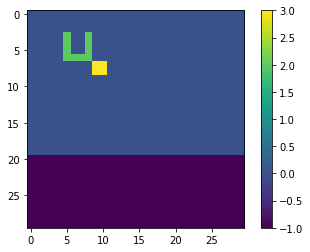

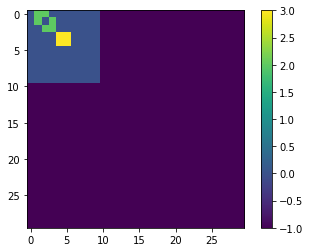

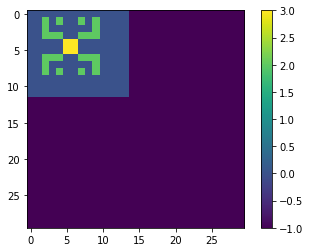

TEST


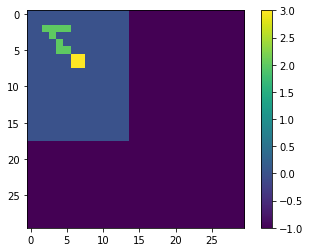

LOSS AT EPOCH 578: tf.Tensor(0.0030793289074467736, shape=(), dtype=float64)
TRAINING


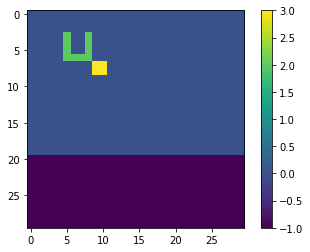

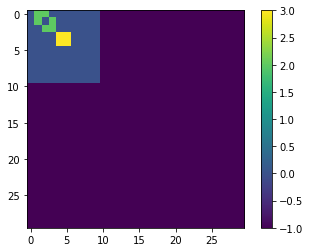

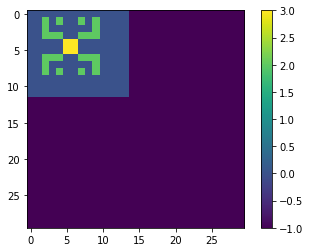

TEST


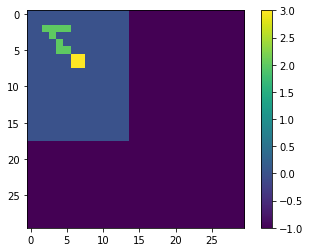

LOSS AT EPOCH 580: tf.Tensor(0.003079196969299722, shape=(), dtype=float64)
TRAINING


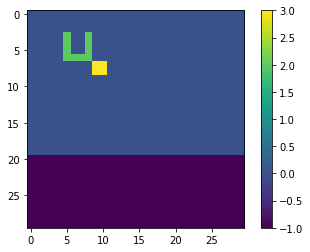

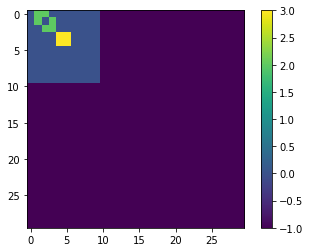

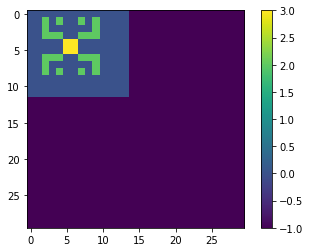

TEST


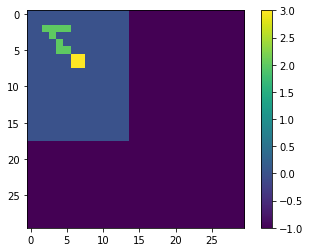

LOSS AT EPOCH 582: tf.Tensor(0.003079067392553621, shape=(), dtype=float64)
TRAINING


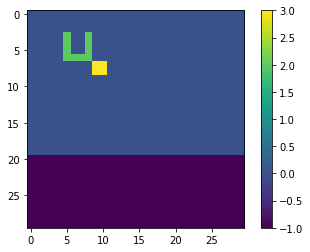

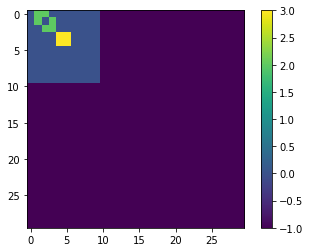

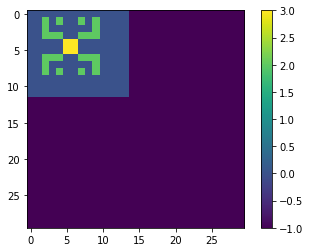

TEST


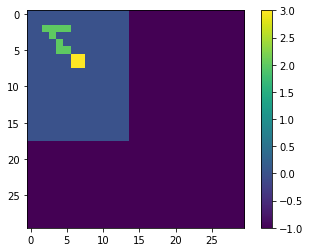

LOSS AT EPOCH 584: tf.Tensor(0.0030789399932636707, shape=(), dtype=float64)
TRAINING


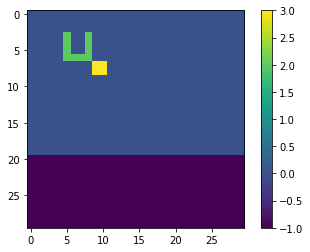

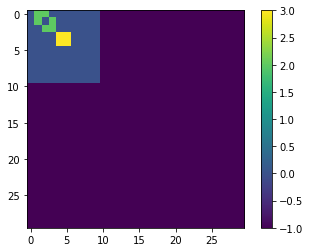

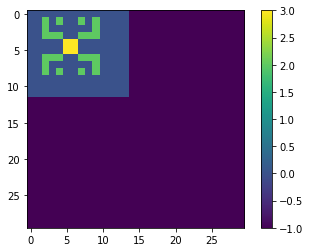

TEST


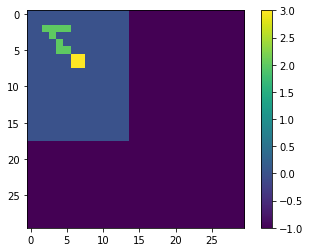

LOSS AT EPOCH 586: tf.Tensor(0.003078814405368287, shape=(), dtype=float64)
TRAINING


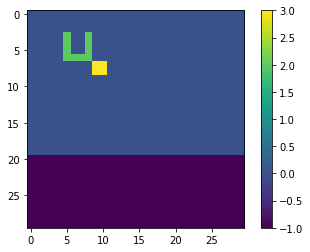

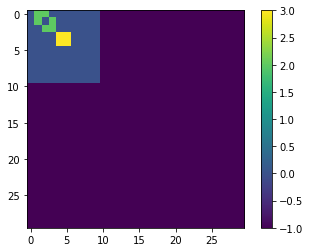

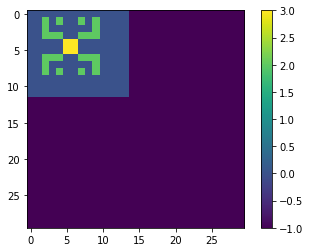

TEST


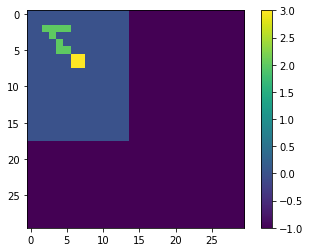

LOSS AT EPOCH 588: tf.Tensor(0.0030786906774907404, shape=(), dtype=float64)
TRAINING


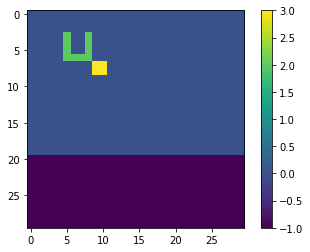

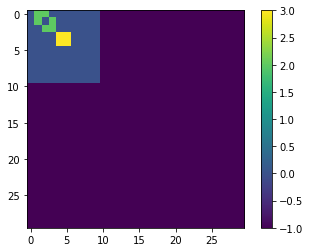

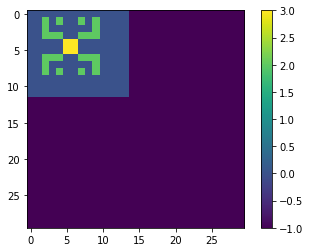

TEST


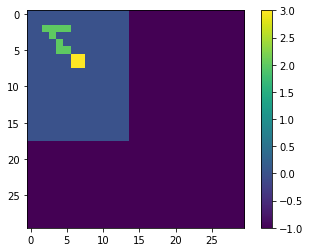

LOSS AT EPOCH 590: tf.Tensor(0.0030785687840007387, shape=(), dtype=float64)
TRAINING


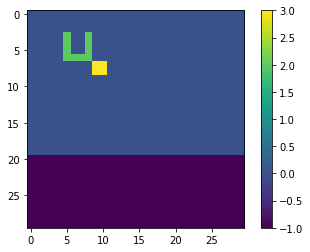

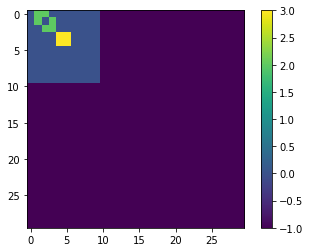

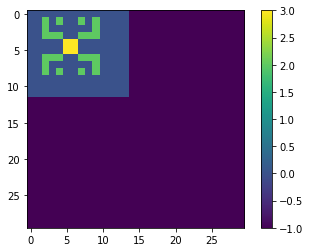

TEST


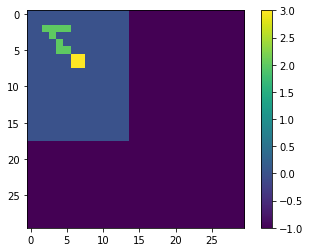

LOSS AT EPOCH 592: tf.Tensor(0.0030784486268052007, shape=(), dtype=float64)
TRAINING


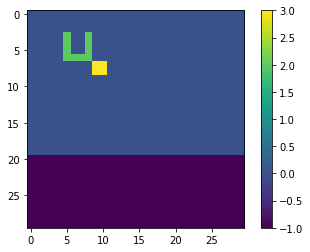

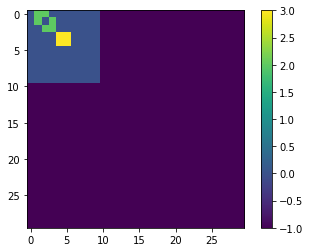

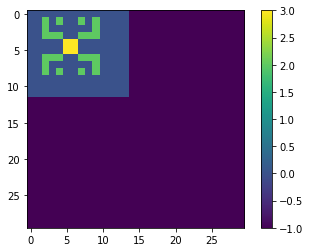

TEST


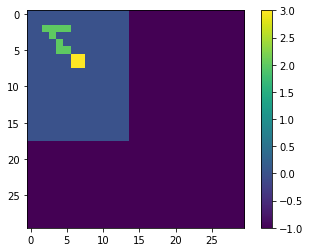

LOSS AT EPOCH 594: tf.Tensor(0.0030783302777168823, shape=(), dtype=float64)
TRAINING


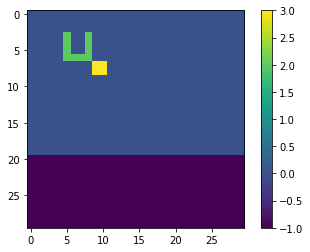

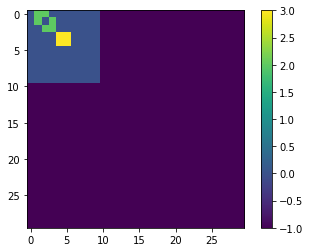

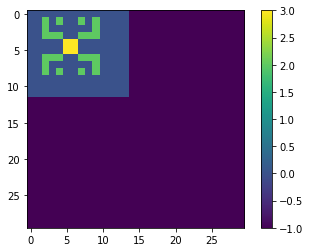

TEST


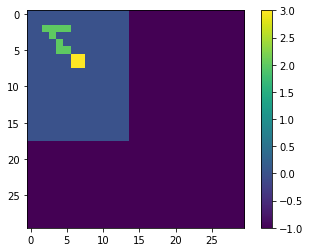

LOSS AT EPOCH 596: tf.Tensor(0.0030782133205396545, shape=(), dtype=float64)
TRAINING


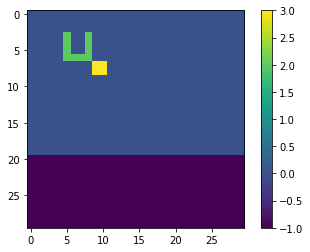

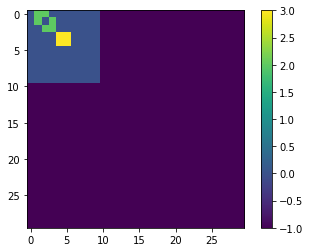

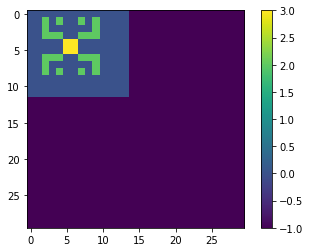

TEST


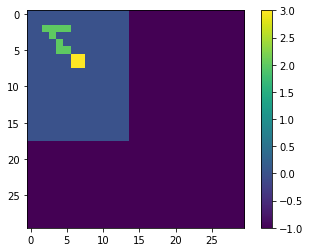

LOSS AT EPOCH 598: tf.Tensor(0.0030780980681808447, shape=(), dtype=float64)
TRAINING


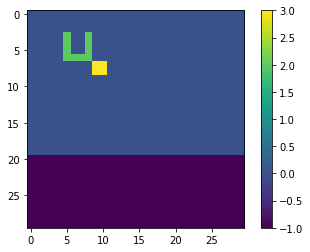

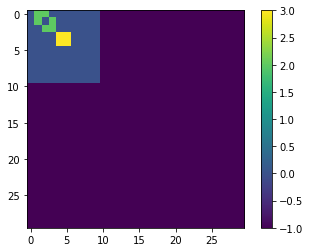

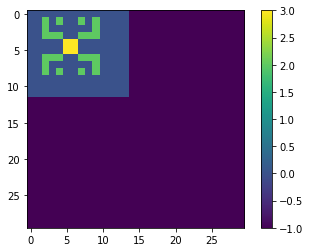

TEST


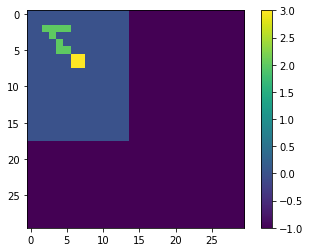

LOSS AT EPOCH 600: tf.Tensor(0.00307798438529834, shape=(), dtype=float64)
TRAINING


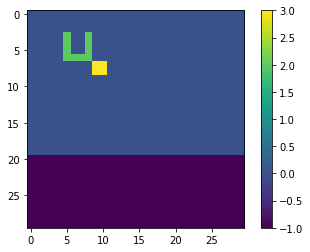

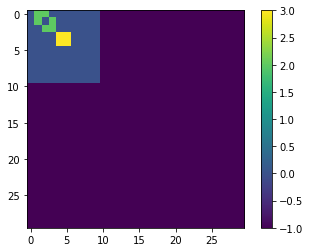

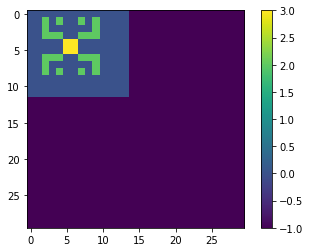

TEST


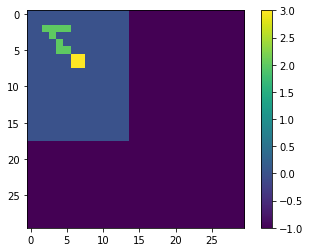

LOSS AT EPOCH 602: tf.Tensor(0.003077872108146925, shape=(), dtype=float64)
TRAINING


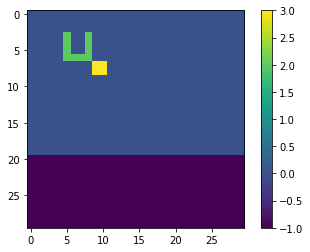

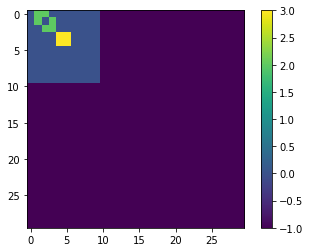

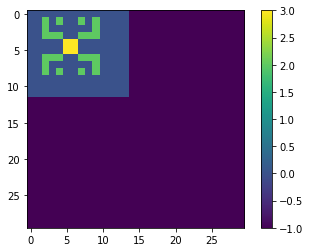

TEST


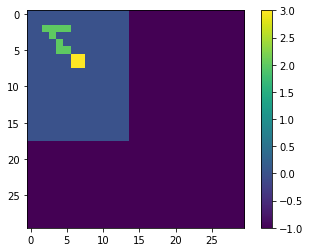

LOSS AT EPOCH 604: tf.Tensor(0.0030777612960621484, shape=(), dtype=float64)
TRAINING


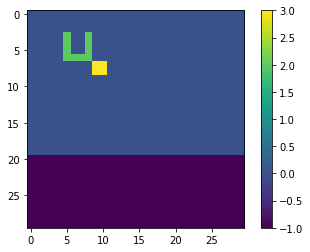

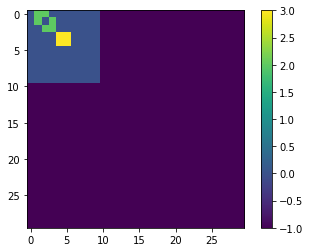

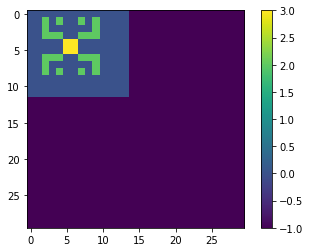

TEST


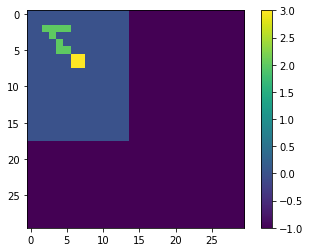

LOSS AT EPOCH 606: tf.Tensor(0.0030776517717222562, shape=(), dtype=float64)
TRAINING


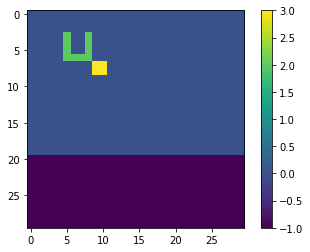

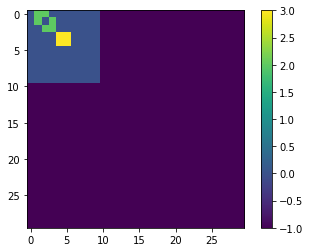

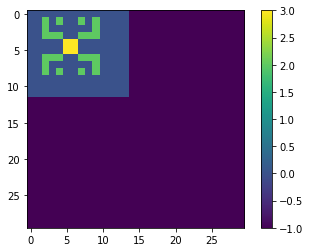

TEST


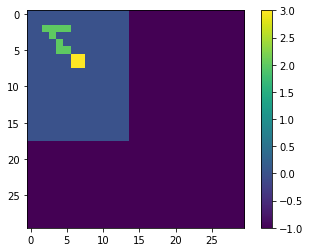

LOSS AT EPOCH 608: tf.Tensor(0.003077543488300911, shape=(), dtype=float64)
TRAINING


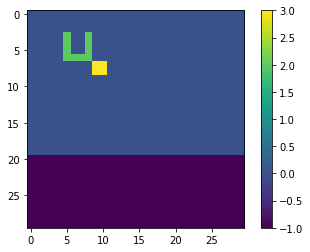

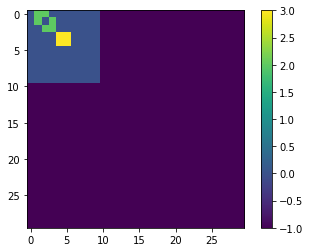

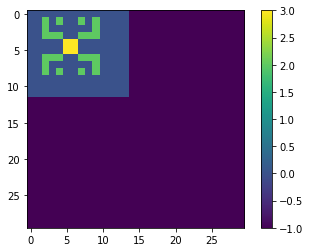

TEST


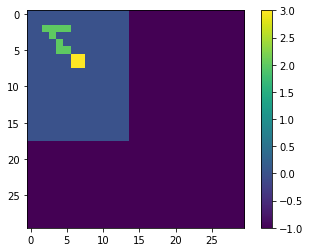

LOSS AT EPOCH 610: tf.Tensor(0.0030774363503732693, shape=(), dtype=float64)
TRAINING


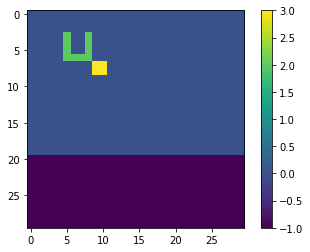

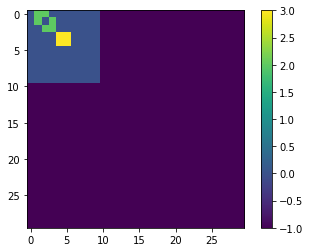

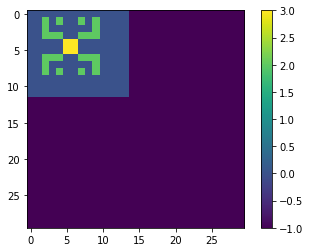

TEST


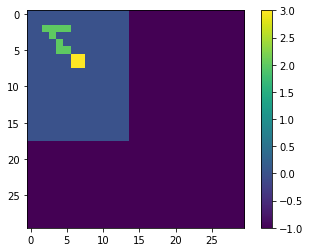

LOSS AT EPOCH 612: tf.Tensor(0.003077330483311665, shape=(), dtype=float64)
TRAINING


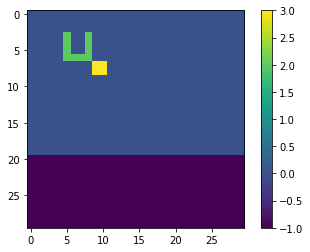

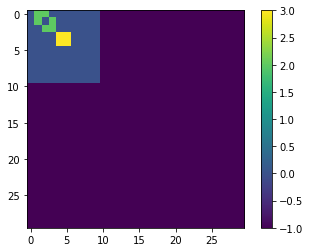

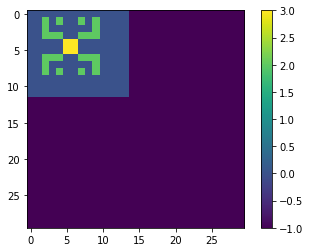

TEST


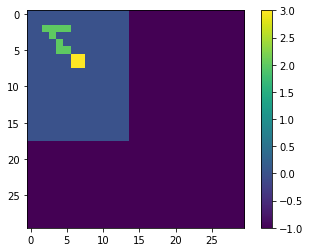

LOSS AT EPOCH 614: tf.Tensor(0.0030772258656955815, shape=(), dtype=float64)
TRAINING


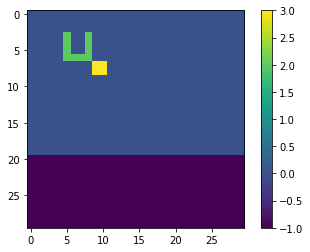

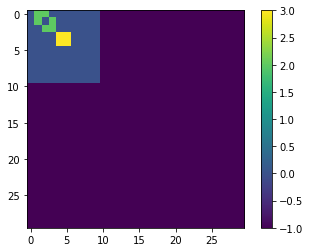

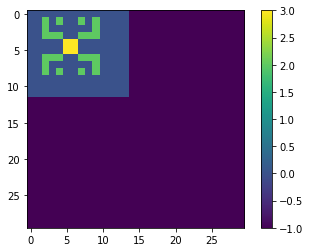

TEST


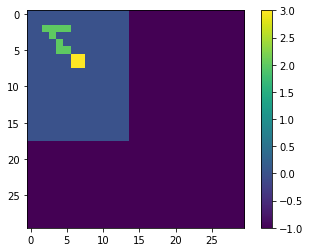

LOSS AT EPOCH 616: tf.Tensor(0.0030771224482446626, shape=(), dtype=float64)
TRAINING


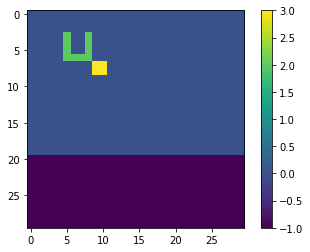

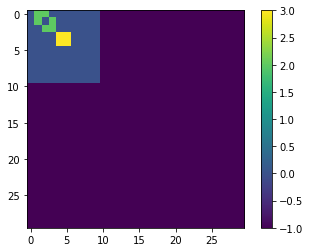

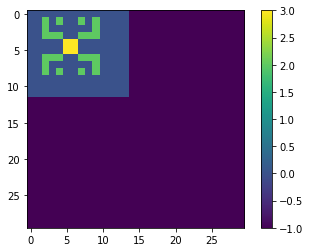

TEST


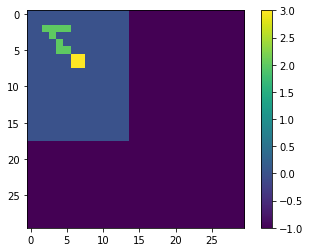

LOSS AT EPOCH 618: tf.Tensor(0.00307702017400214, shape=(), dtype=float64)
TRAINING


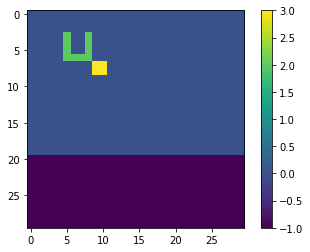

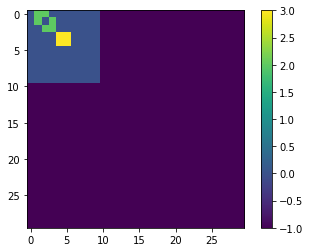

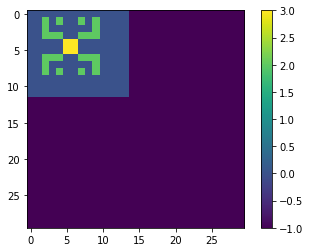

TEST


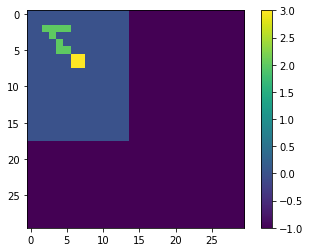

LOSS AT EPOCH 620: tf.Tensor(0.0030769191954898335, shape=(), dtype=float64)
TRAINING


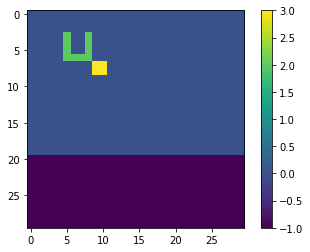

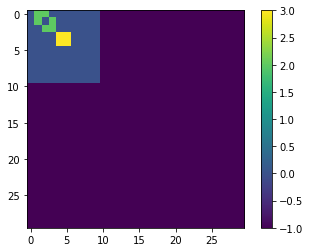

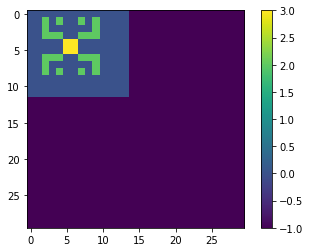

TEST


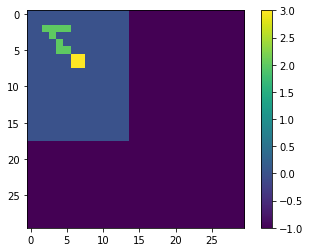

LOSS AT EPOCH 622: tf.Tensor(0.0030768193898437447, shape=(), dtype=float64)
TRAINING


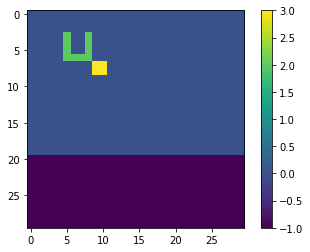

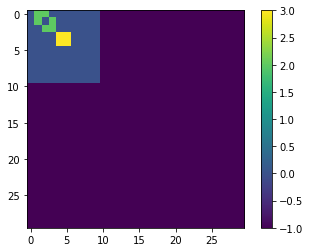

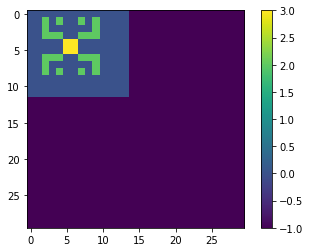

TEST


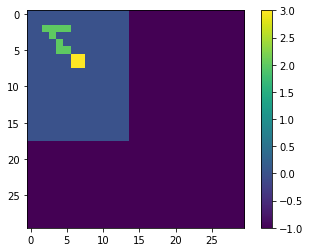

LOSS AT EPOCH 624: tf.Tensor(0.0030767205679324097, shape=(), dtype=float64)
TRAINING


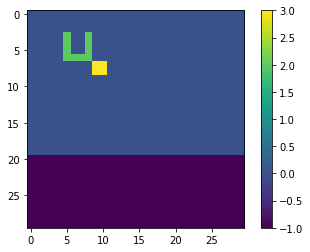

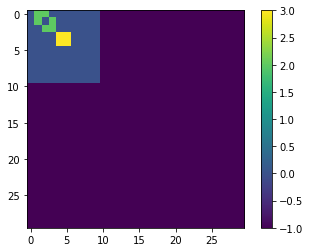

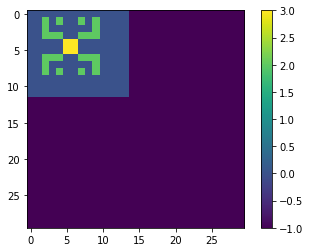

TEST


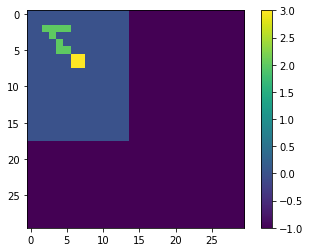

LOSS AT EPOCH 626: tf.Tensor(0.0030766226980829983, shape=(), dtype=float64)
TRAINING


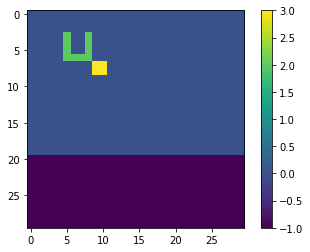

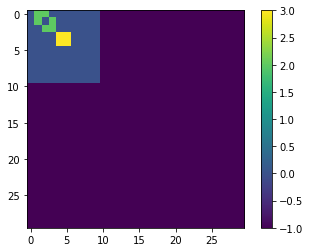

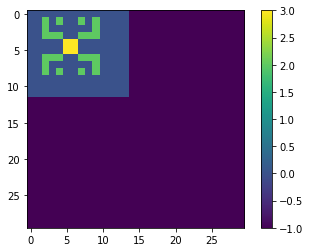

TEST


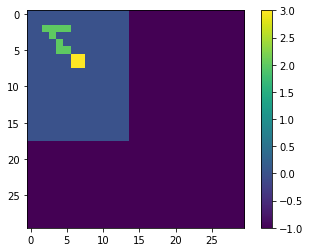

LOSS AT EPOCH 628: tf.Tensor(0.0030765258114361046, shape=(), dtype=float64)
TRAINING


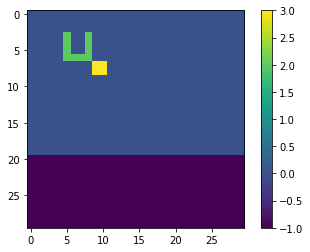

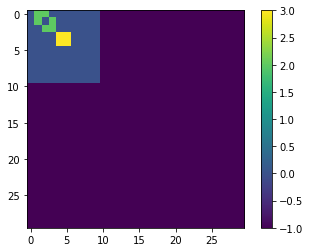

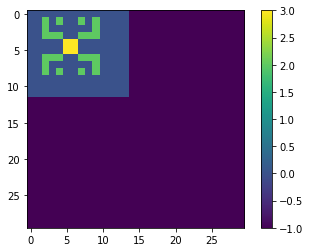

TEST


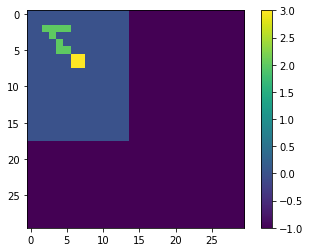

LOSS AT EPOCH 630: tf.Tensor(0.003076429978367851, shape=(), dtype=float64)
TRAINING


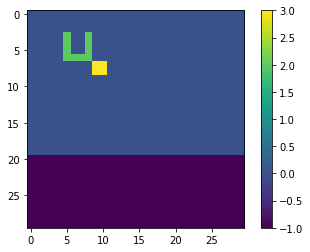

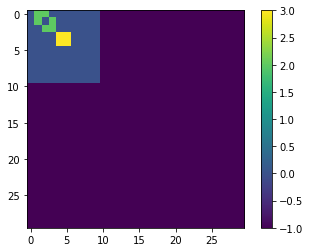

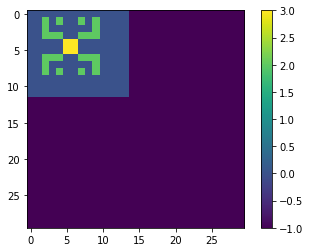

TEST


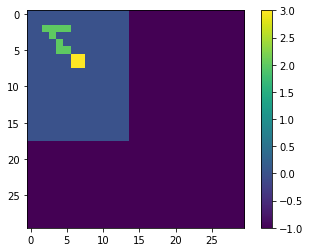

LOSS AT EPOCH 632: tf.Tensor(0.0030763349939161764, shape=(), dtype=float64)
TRAINING


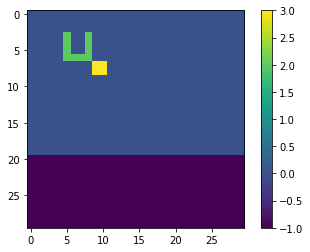

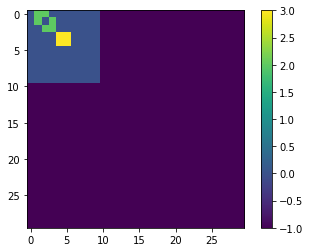

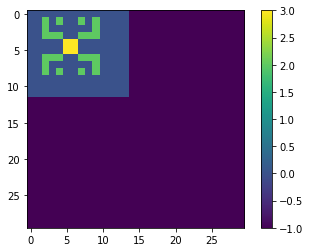

TEST


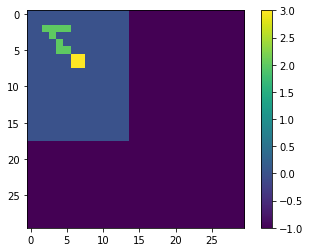

LOSS AT EPOCH 634: tf.Tensor(0.003076240853588355, shape=(), dtype=float64)
TRAINING


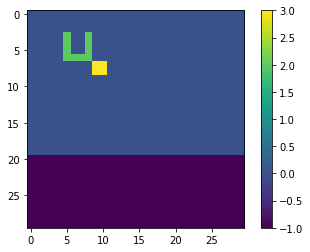

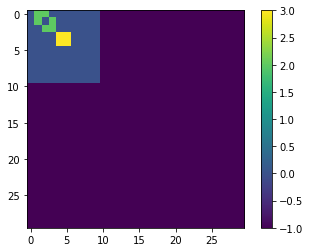

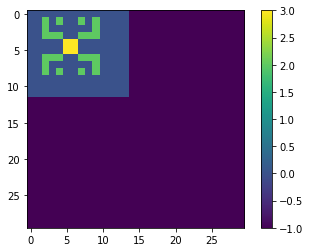

TEST


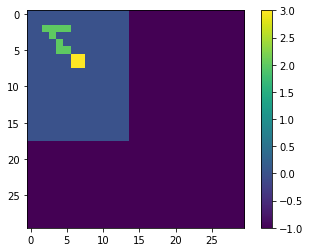

LOSS AT EPOCH 636: tf.Tensor(0.0030761476253411426, shape=(), dtype=float64)
TRAINING


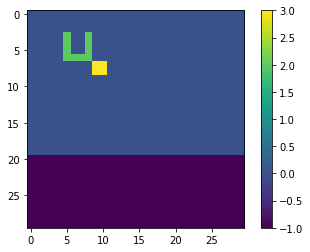

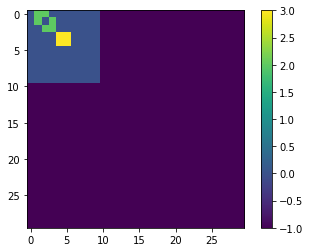

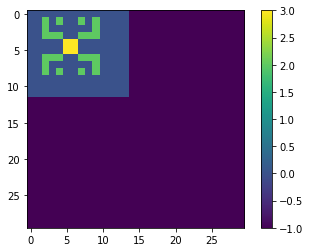

TEST


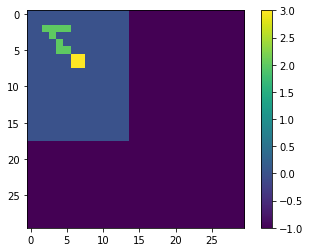

LOSS AT EPOCH 638: tf.Tensor(0.003076055280164092, shape=(), dtype=float64)
TRAINING


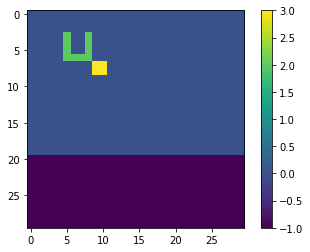

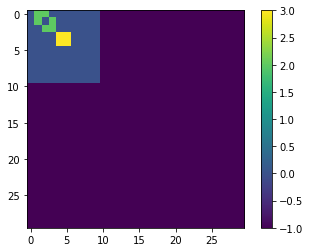

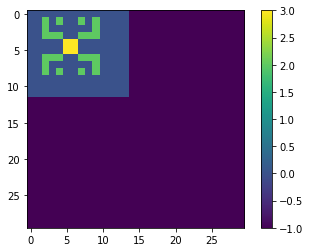

TEST


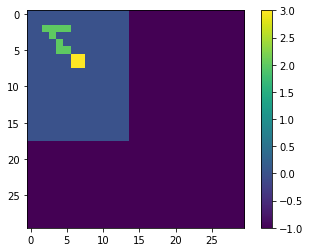

LOSS AT EPOCH 640: tf.Tensor(0.003075963762950985, shape=(), dtype=float64)
TRAINING


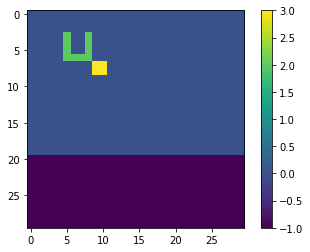

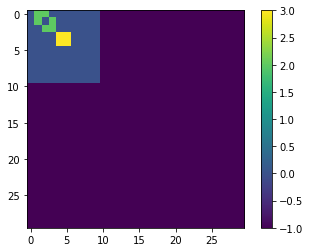

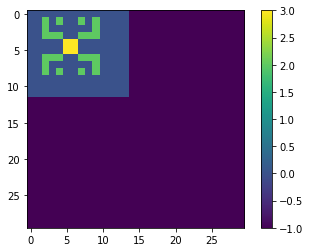

TEST


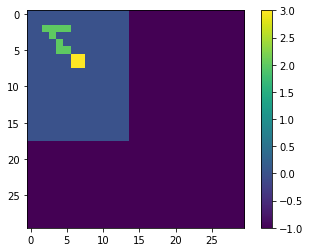

LOSS AT EPOCH 642: tf.Tensor(0.003075873026617043, shape=(), dtype=float64)
TRAINING


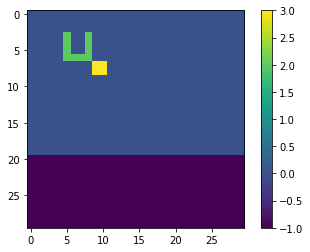

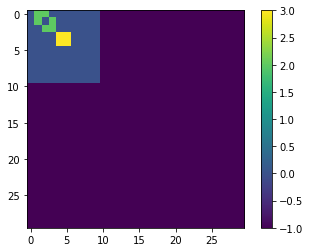

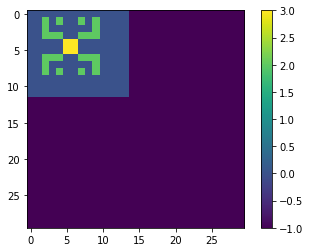

TEST


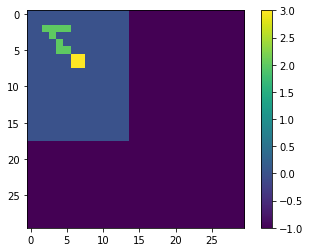

LOSS AT EPOCH 644: tf.Tensor(0.0030757830066684903, shape=(), dtype=float64)
TRAINING


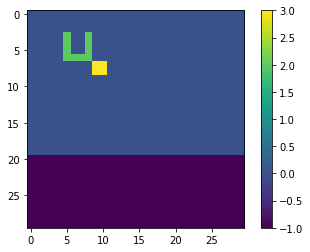

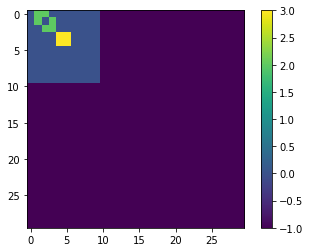

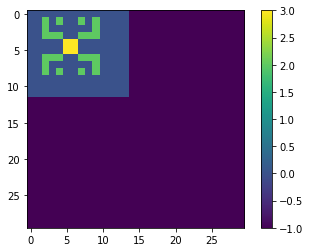

TEST


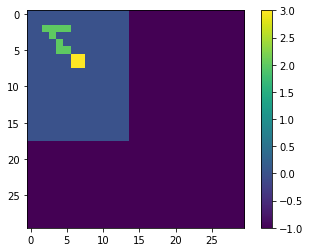

LOSS AT EPOCH 646: tf.Tensor(0.0030756937647590577, shape=(), dtype=float64)
TRAINING


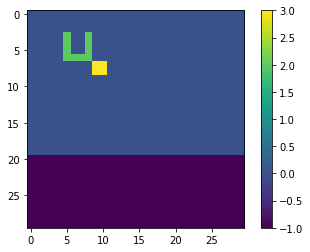

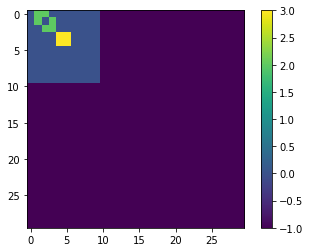

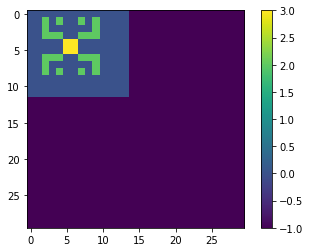

TEST


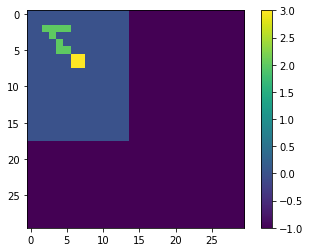

LOSS AT EPOCH 648: tf.Tensor(0.0030756053840461676, shape=(), dtype=float64)
TRAINING


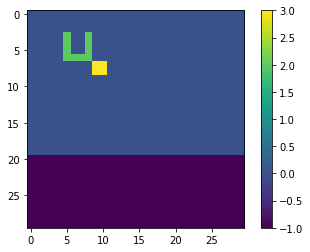

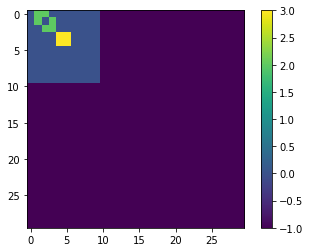

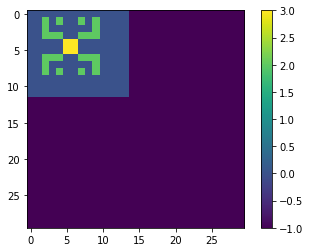

TEST


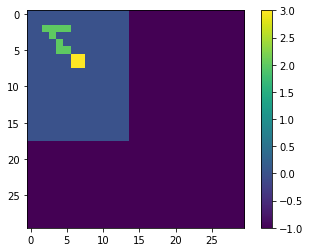

LOSS AT EPOCH 650: tf.Tensor(0.0030755176201982494, shape=(), dtype=float64)
TRAINING


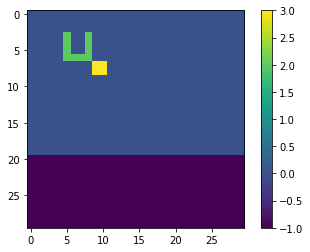

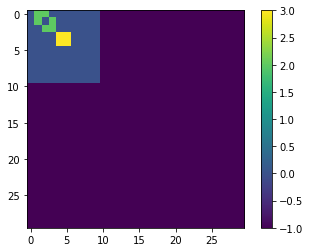

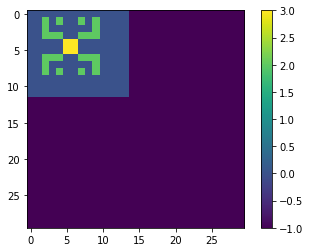

TEST


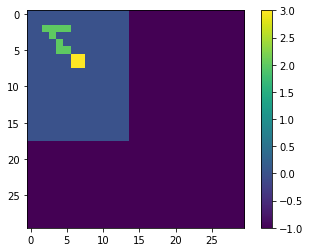

LOSS AT EPOCH 652: tf.Tensor(0.003075430494149406, shape=(), dtype=float64)
TRAINING


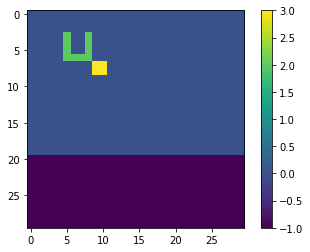

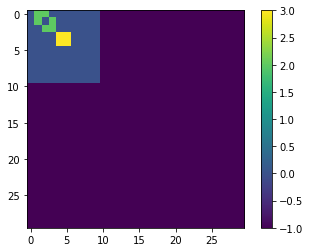

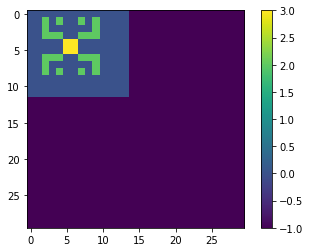

TEST


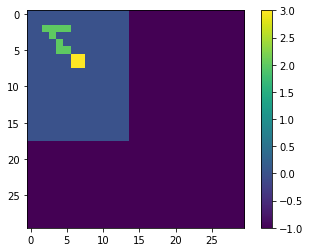

LOSS AT EPOCH 654: tf.Tensor(0.0030753439376671105, shape=(), dtype=float64)
TRAINING


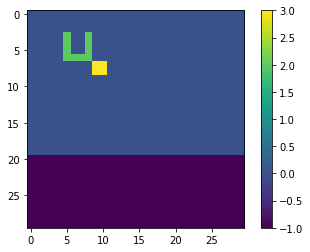

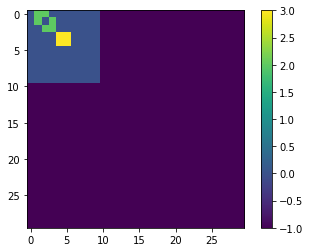

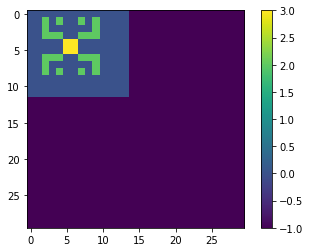

TEST


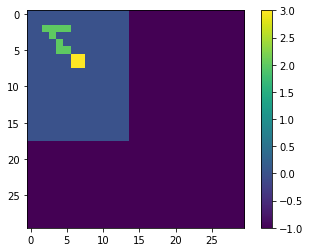

LOSS AT EPOCH 656: tf.Tensor(0.003075257942250147, shape=(), dtype=float64)
TRAINING


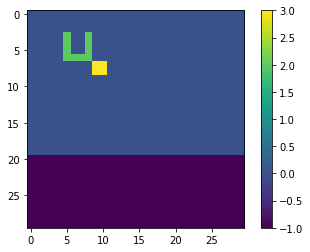

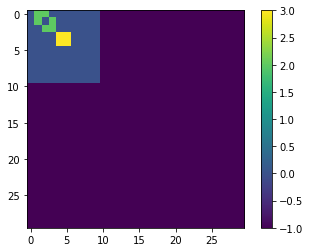

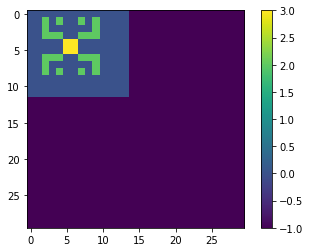

TEST


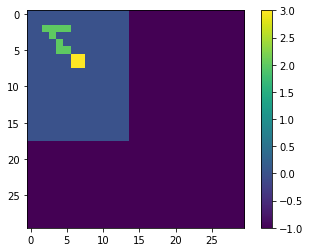

LOSS AT EPOCH 658: tf.Tensor(0.0030751724888606388, shape=(), dtype=float64)
TRAINING


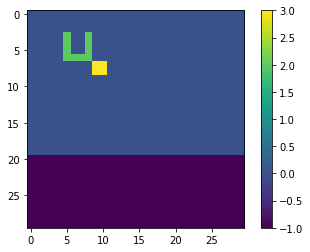

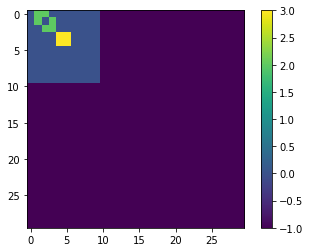

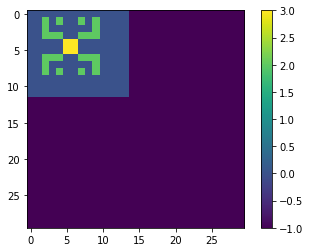

TEST


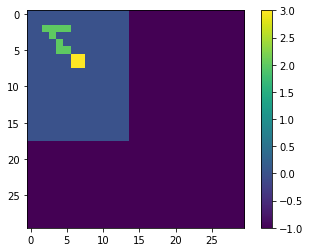

LOSS AT EPOCH 660: tf.Tensor(0.003075087524103872, shape=(), dtype=float64)
TRAINING


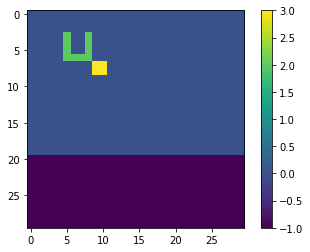

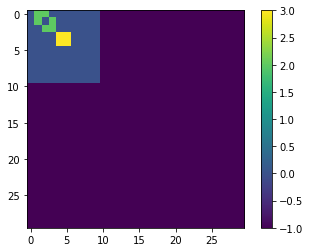

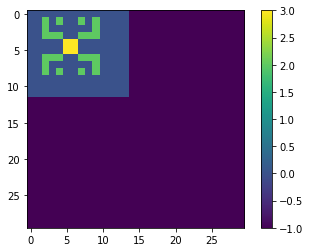

TEST


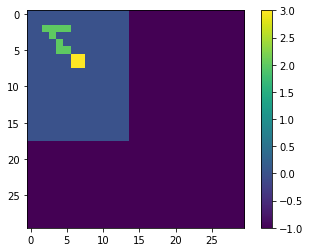

LOSS AT EPOCH 662: tf.Tensor(0.003075003123117449, shape=(), dtype=float64)
TRAINING


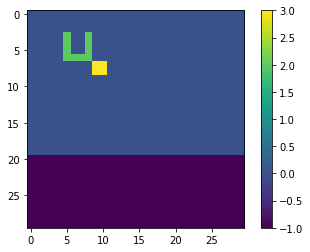

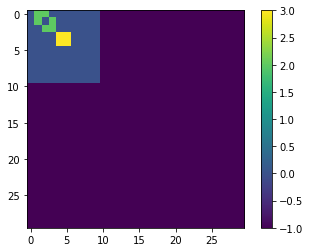

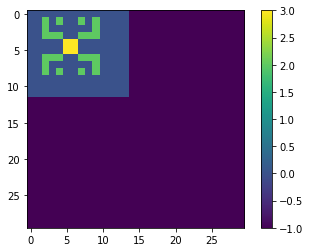

TEST


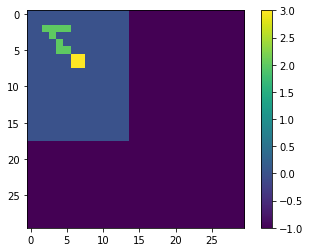

LOSS AT EPOCH 664: tf.Tensor(0.00307491935695522, shape=(), dtype=float64)
TRAINING


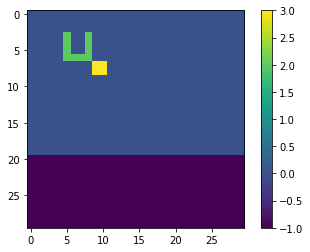

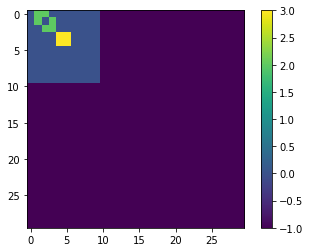

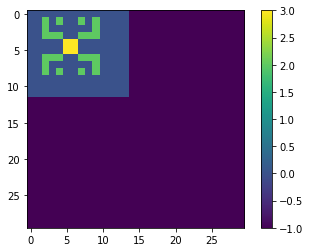

TEST


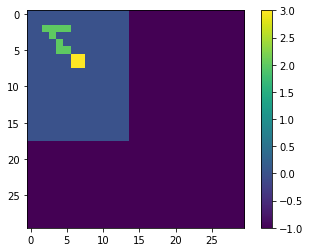

LOSS AT EPOCH 666: tf.Tensor(0.003074836059473396, shape=(), dtype=float64)
TRAINING


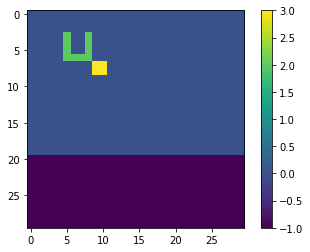

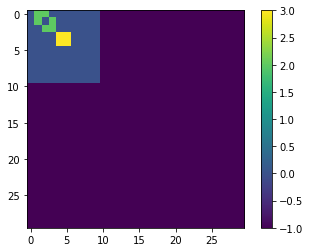

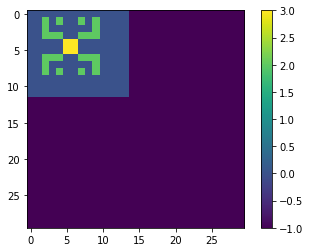

TEST


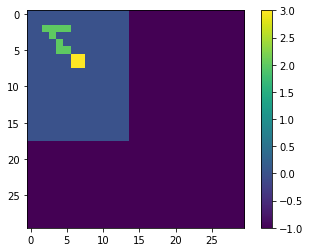

LOSS AT EPOCH 668: tf.Tensor(0.0030747533352352705, shape=(), dtype=float64)
TRAINING


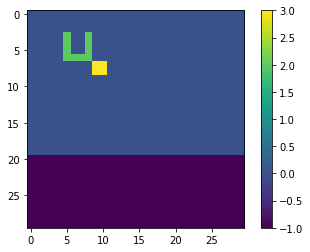

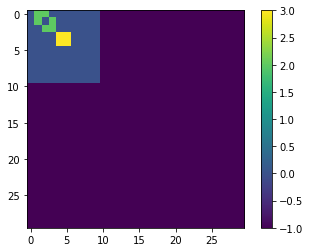

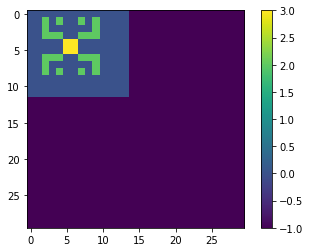

TEST


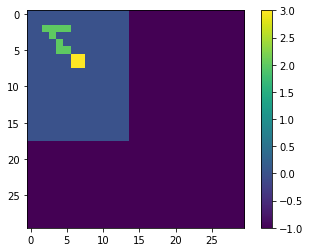

LOSS AT EPOCH 670: tf.Tensor(0.003074671107333876, shape=(), dtype=float64)
TRAINING


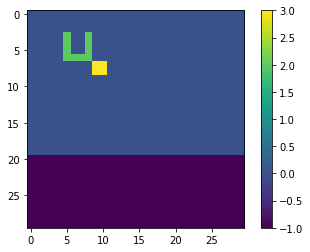

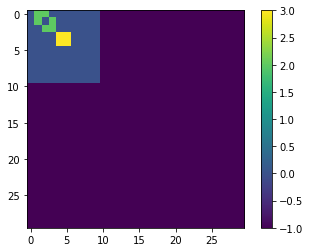

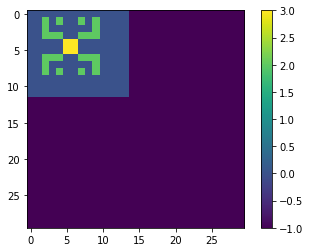

TEST


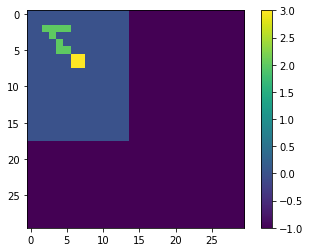

LOSS AT EPOCH 672: tf.Tensor(0.0030745892744354552, shape=(), dtype=float64)
TRAINING


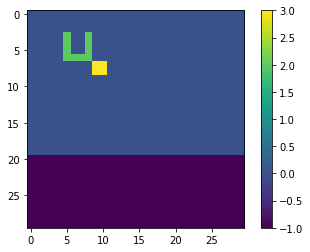

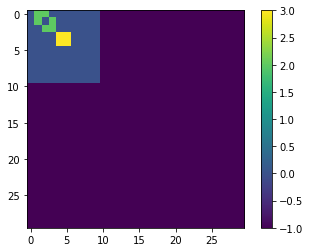

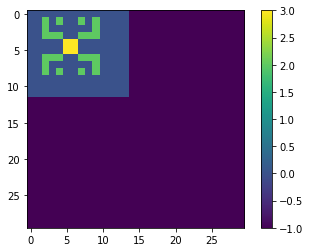

TEST


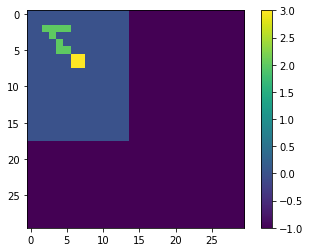

LOSS AT EPOCH 674: tf.Tensor(0.003074507853646072, shape=(), dtype=float64)
TRAINING


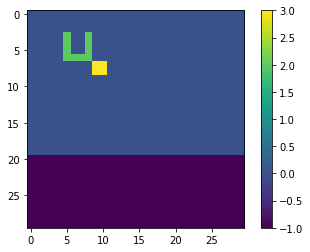

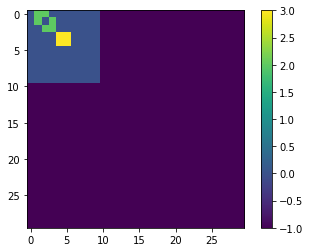

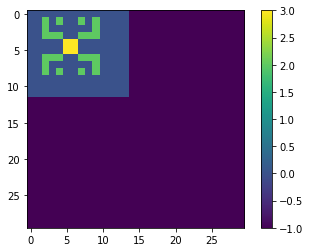

TEST


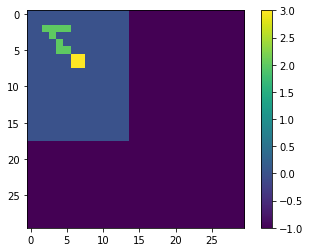

LOSS AT EPOCH 676: tf.Tensor(0.0030744267981396337, shape=(), dtype=float64)
TRAINING


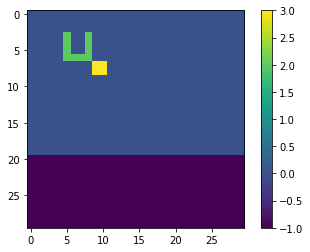

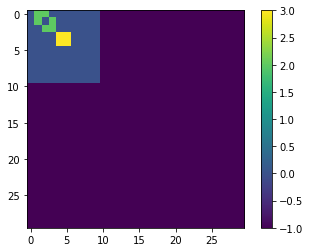

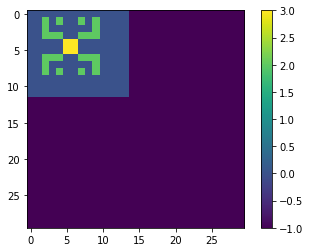

TEST


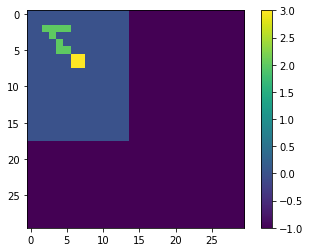

LOSS AT EPOCH 678: tf.Tensor(0.0030743462865911522, shape=(), dtype=float64)
TRAINING


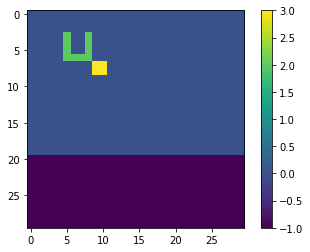

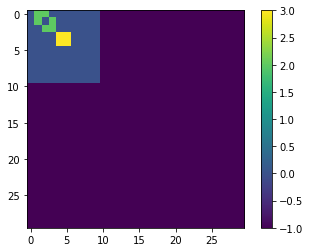

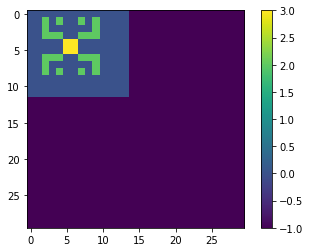

TEST


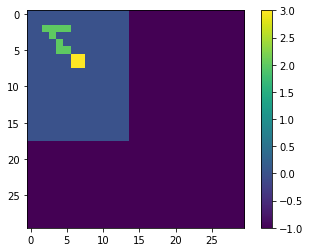

LOSS AT EPOCH 680: tf.Tensor(0.0030742663489439397, shape=(), dtype=float64)
TRAINING


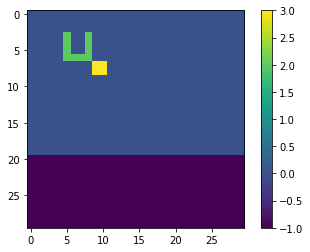

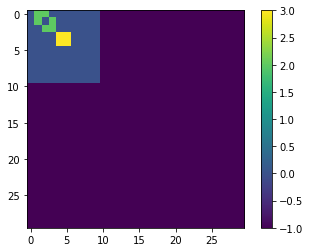

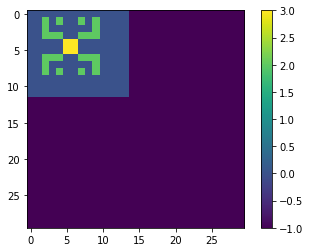

TEST


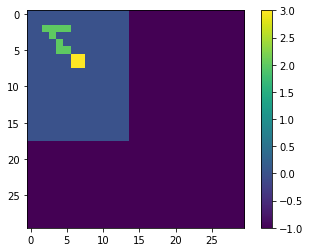

LOSS AT EPOCH 682: tf.Tensor(0.003074186780977976, shape=(), dtype=float64)
TRAINING


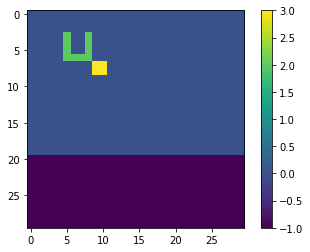

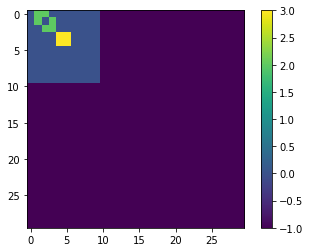

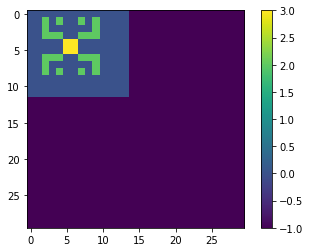

TEST


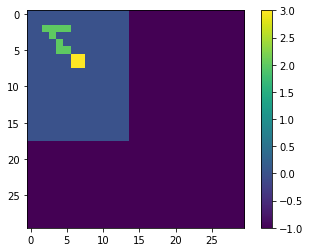

LOSS AT EPOCH 684: tf.Tensor(0.0030741075929391496, shape=(), dtype=float64)
TRAINING


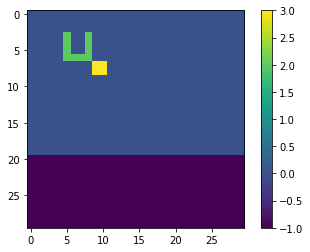

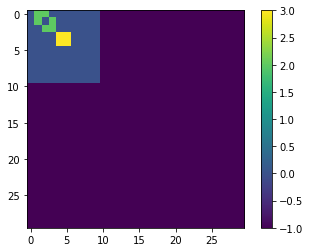

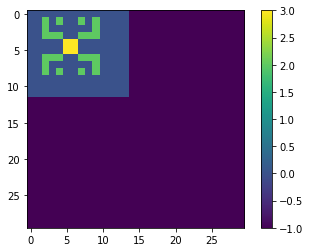

TEST


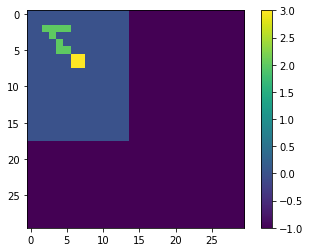

LOSS AT EPOCH 686: tf.Tensor(0.0030740287357120368, shape=(), dtype=float64)
TRAINING


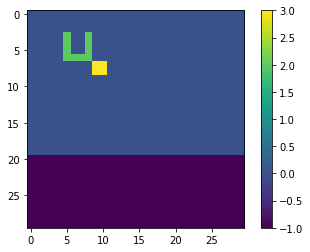

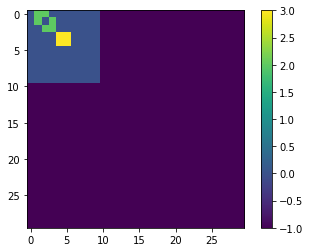

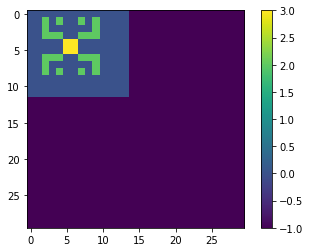

TEST


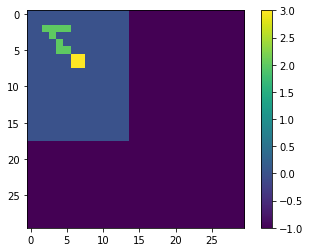

LOSS AT EPOCH 688: tf.Tensor(0.0030739503209349325, shape=(), dtype=float64)
TRAINING


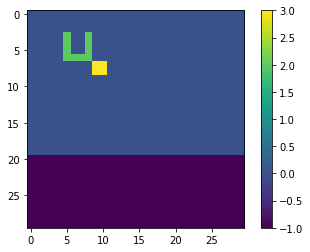

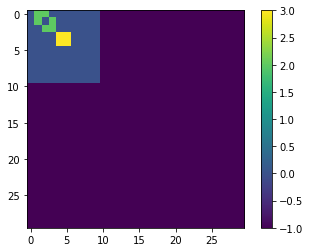

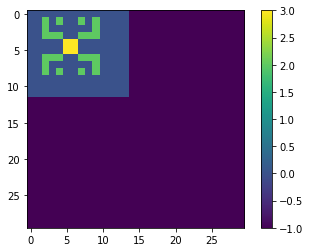

TEST


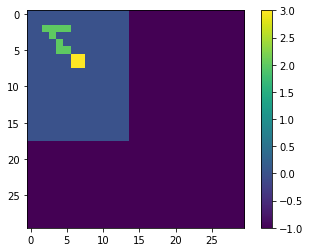

LOSS AT EPOCH 690: tf.Tensor(0.003073872266951646, shape=(), dtype=float64)
TRAINING


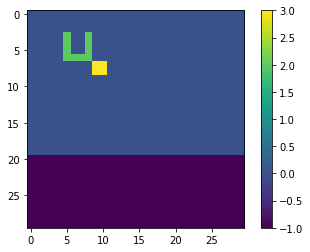

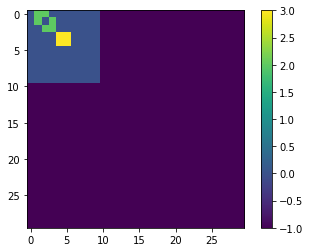

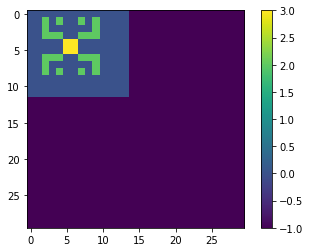

TEST


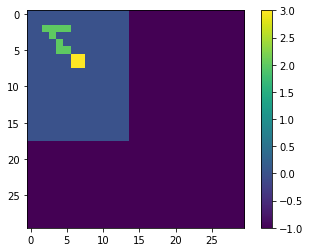

LOSS AT EPOCH 692: tf.Tensor(0.003073794568969652, shape=(), dtype=float64)
TRAINING


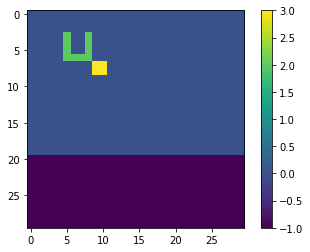

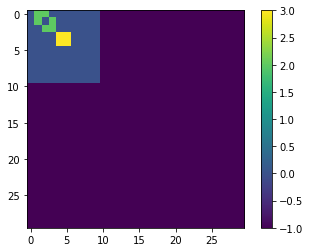

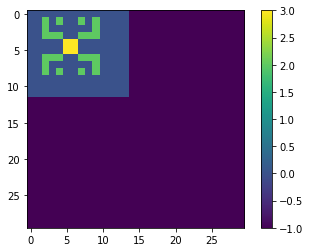

TEST


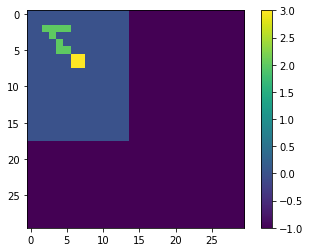

LOSS AT EPOCH 694: tf.Tensor(0.0030737172071809435, shape=(), dtype=float64)
TRAINING


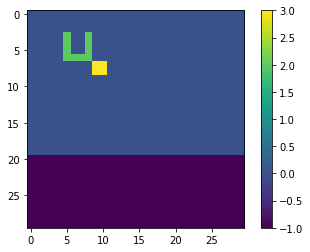

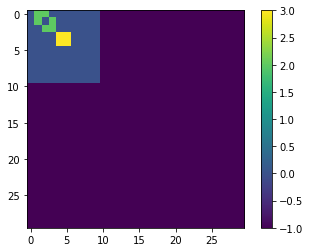

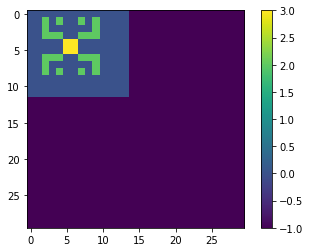

TEST


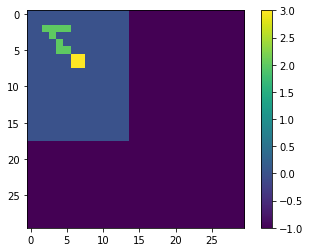

LOSS AT EPOCH 696: tf.Tensor(0.003073640162099507, shape=(), dtype=float64)
TRAINING


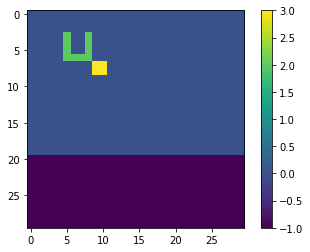

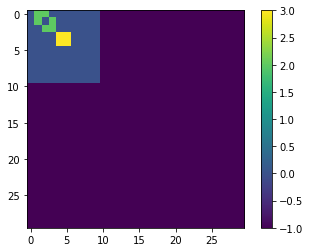

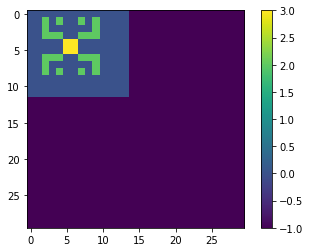

TEST


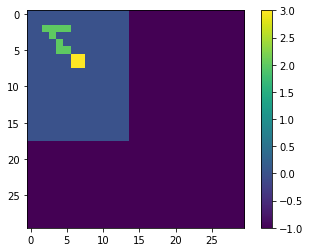

LOSS AT EPOCH 698: tf.Tensor(0.0030735634000452444, shape=(), dtype=float64)
TRAINING


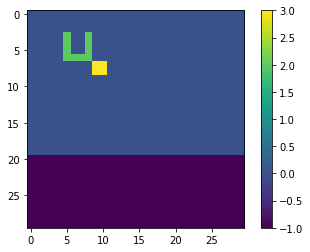

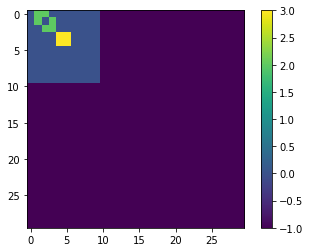

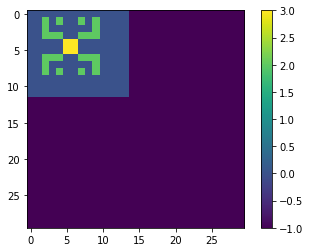

TEST


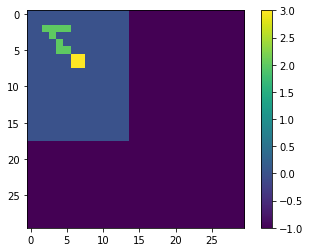

LOSS AT EPOCH 700: tf.Tensor(0.0030734870467005806, shape=(), dtype=float64)
TRAINING


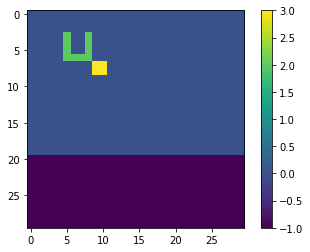

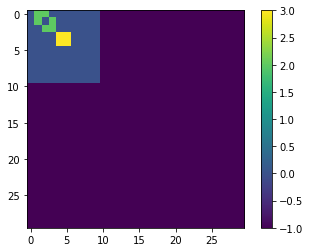

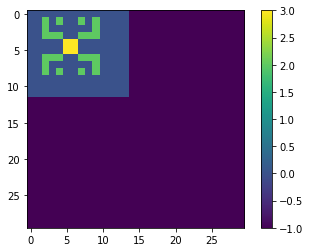

TEST


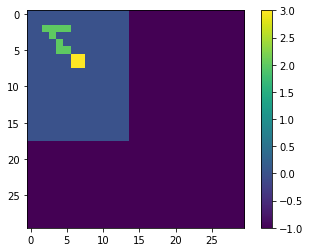

LOSS AT EPOCH 702: tf.Tensor(0.0030734110817957692, shape=(), dtype=float64)
TRAINING


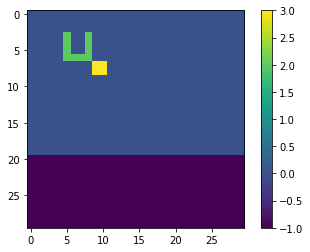

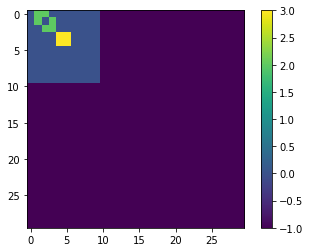

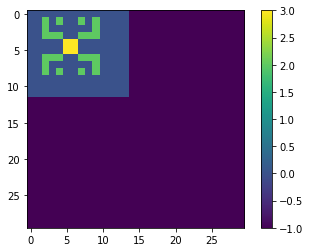

TEST


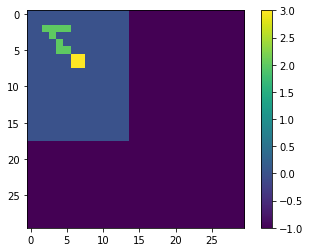

LOSS AT EPOCH 704: tf.Tensor(0.003073335360289428, shape=(), dtype=float64)
TRAINING


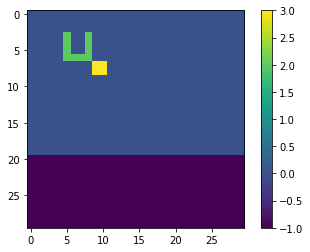

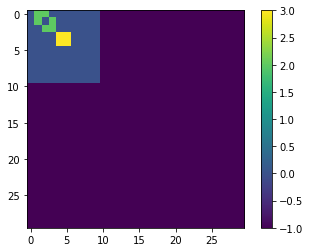

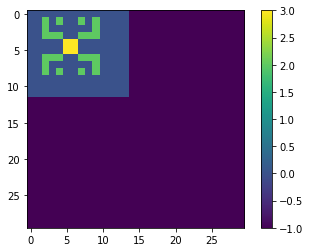

TEST


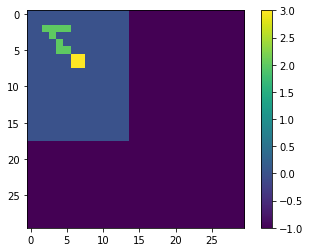

LOSS AT EPOCH 706: tf.Tensor(0.003073259871031136, shape=(), dtype=float64)
TRAINING


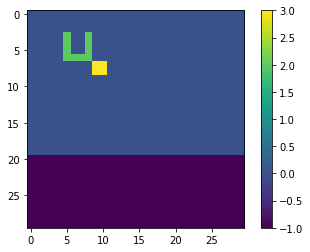

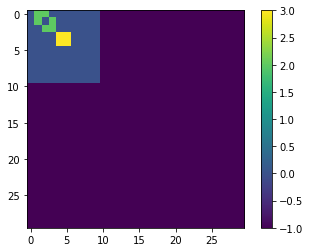

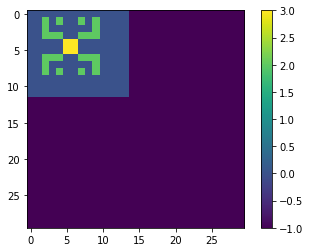

TEST


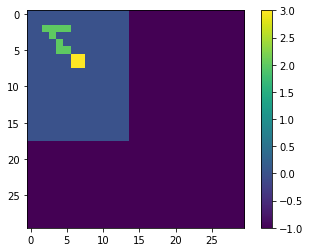

LOSS AT EPOCH 708: tf.Tensor(0.003073184625800911, shape=(), dtype=float64)
TRAINING


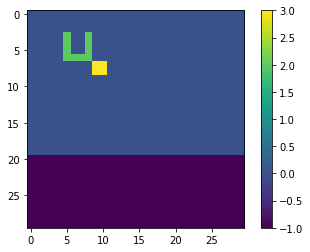

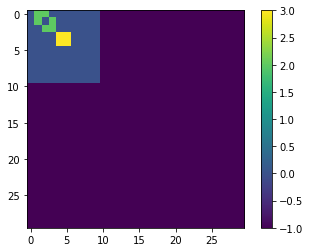

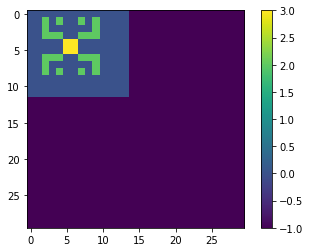

TEST


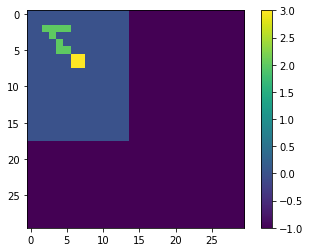

LOSS AT EPOCH 710: tf.Tensor(0.0030731096830262784, shape=(), dtype=float64)
TRAINING


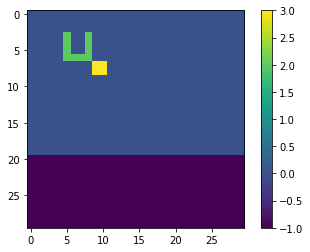

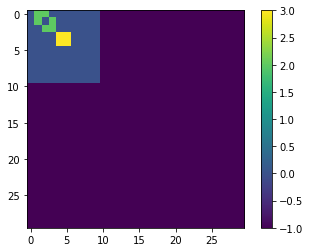

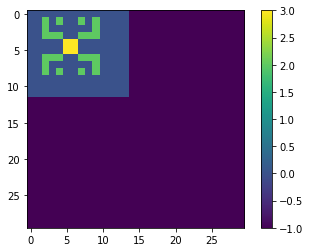

TEST


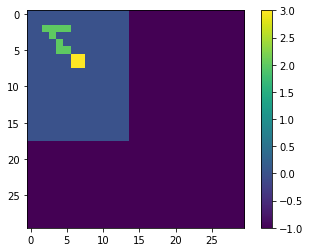

LOSS AT EPOCH 712: tf.Tensor(0.0030730349861053763, shape=(), dtype=float64)
TRAINING


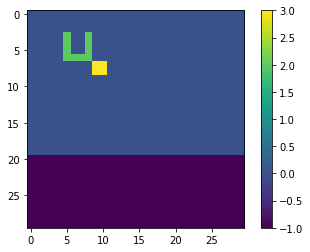

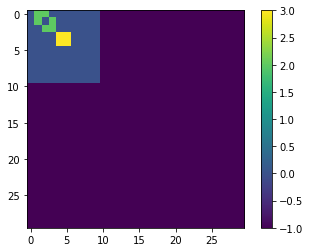

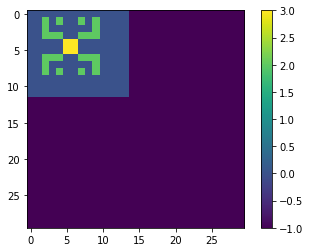

TEST


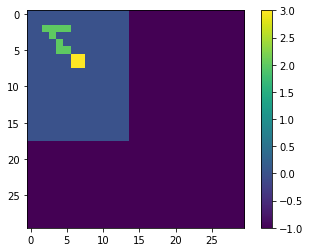

LOSS AT EPOCH 714: tf.Tensor(0.0030729605292987893, shape=(), dtype=float64)
TRAINING


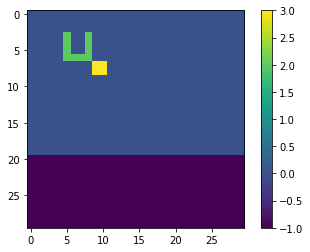

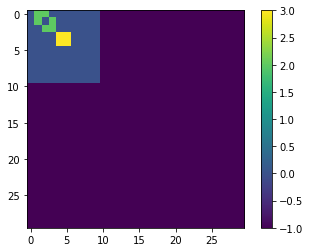

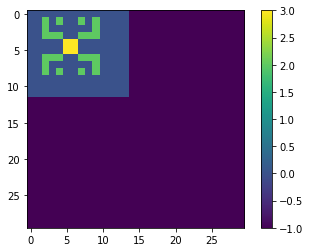

TEST


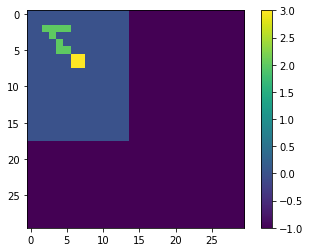

LOSS AT EPOCH 716: tf.Tensor(0.0030728863008125775, shape=(), dtype=float64)
TRAINING


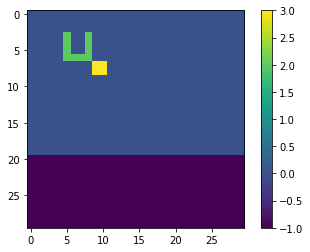

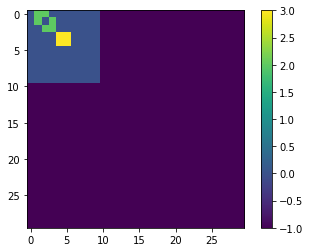

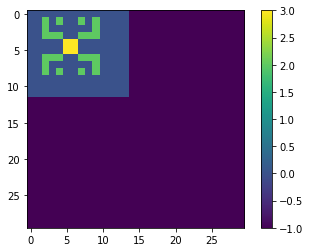

TEST


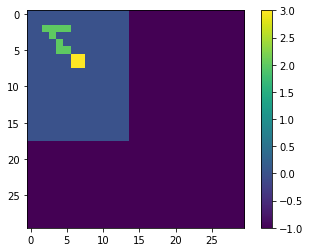

LOSS AT EPOCH 718: tf.Tensor(0.0030728122673653376, shape=(), dtype=float64)
TRAINING


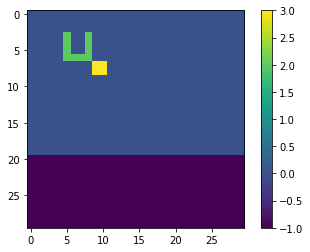

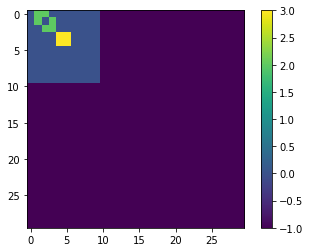

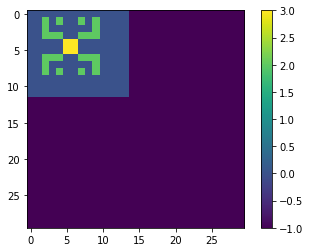

TEST


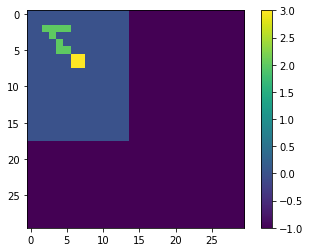

LOSS AT EPOCH 720: tf.Tensor(0.003072738451071742, shape=(), dtype=float64)
TRAINING


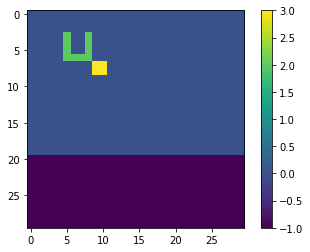

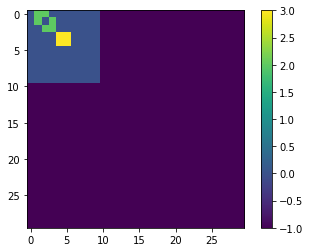

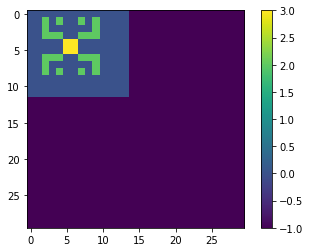

TEST


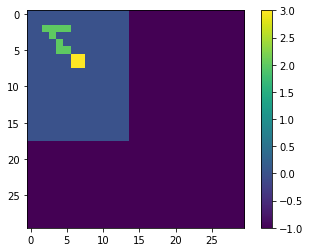

LOSS AT EPOCH 722: tf.Tensor(0.0030726648019841316, shape=(), dtype=float64)
TRAINING


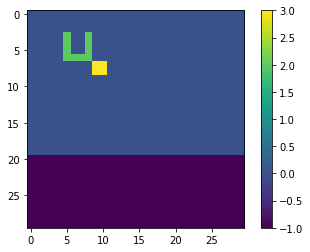

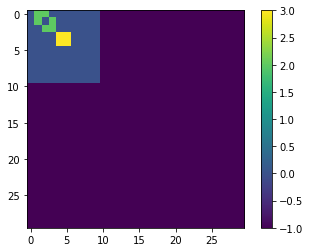

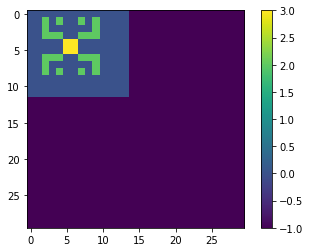

TEST


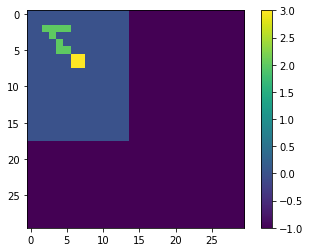

LOSS AT EPOCH 724: tf.Tensor(0.003072591367411523, shape=(), dtype=float64)
TRAINING


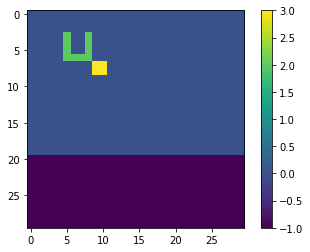

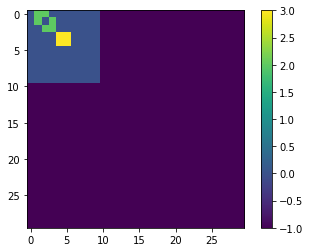

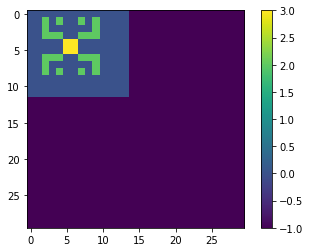

TEST


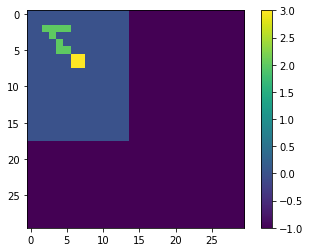

LOSS AT EPOCH 726: tf.Tensor(0.0030725181247098217, shape=(), dtype=float64)
TRAINING


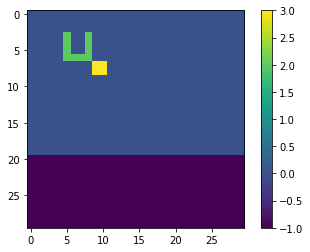

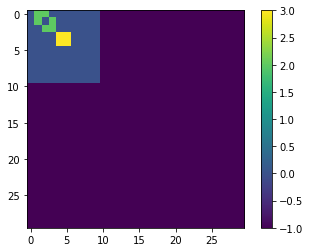

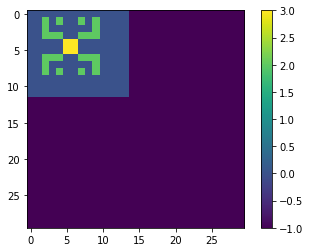

TEST


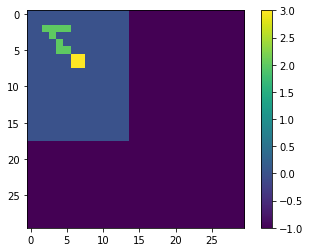

LOSS AT EPOCH 728: tf.Tensor(0.0030724450540248844, shape=(), dtype=float64)
TRAINING


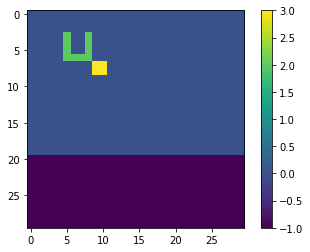

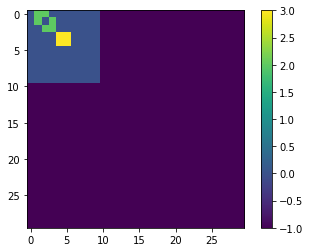

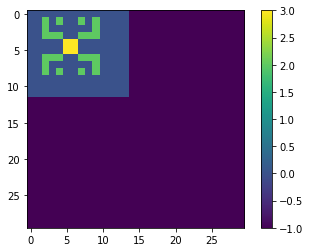

TEST


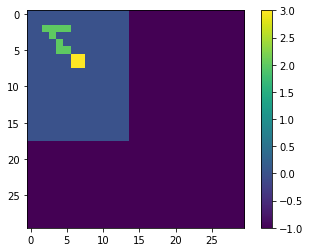

LOSS AT EPOCH 730: tf.Tensor(0.003072372128343596, shape=(), dtype=float64)
TRAINING


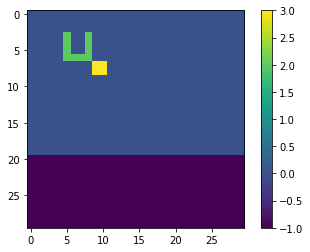

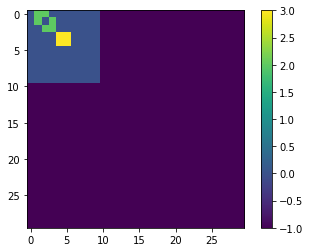

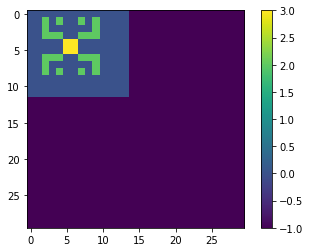

TEST


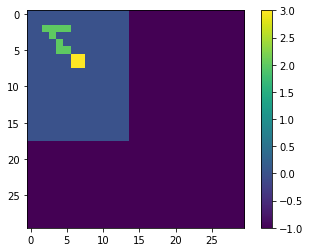

LOSS AT EPOCH 732: tf.Tensor(0.0030722993451494604, shape=(), dtype=float64)
TRAINING


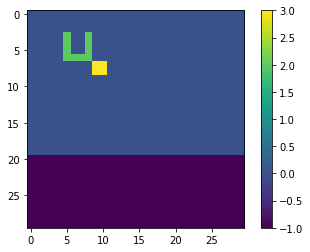

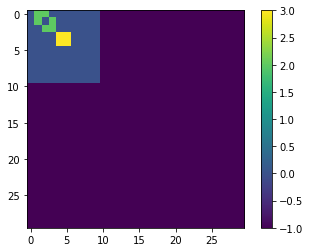

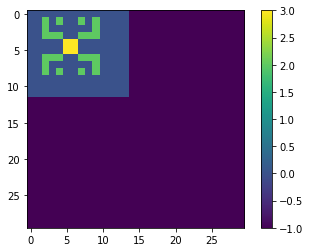

TEST


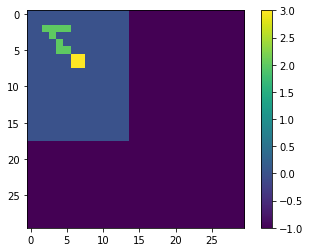

LOSS AT EPOCH 734: tf.Tensor(0.0030722267081843297, shape=(), dtype=float64)
TRAINING


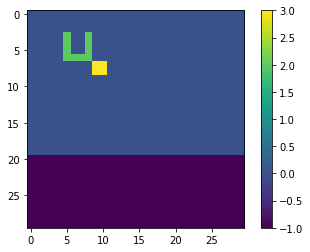

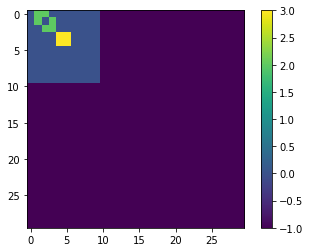

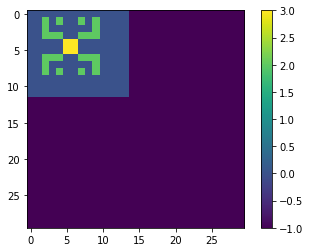

TEST


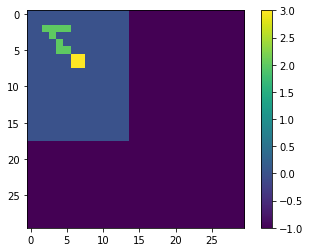

LOSS AT EPOCH 736: tf.Tensor(0.003072154177159769, shape=(), dtype=float64)
TRAINING


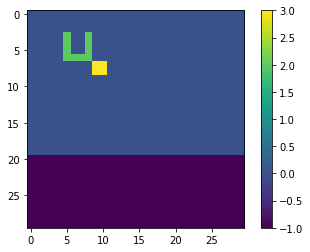

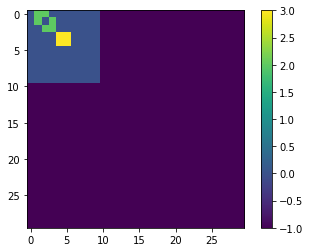

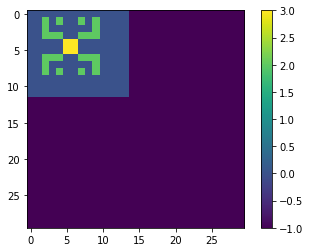

TEST


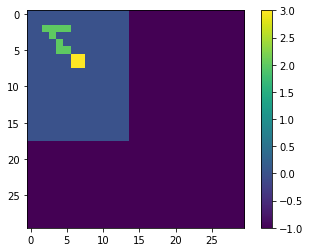

LOSS AT EPOCH 738: tf.Tensor(0.003072081812663598, shape=(), dtype=float64)
TRAINING


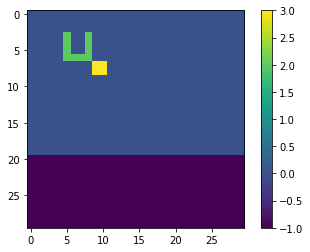

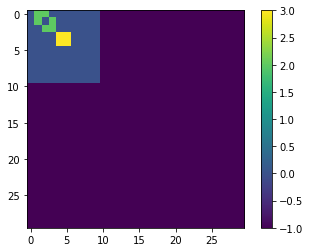

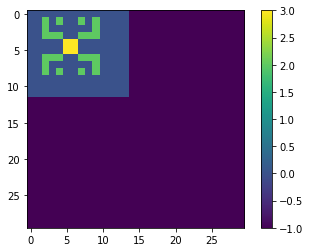

TEST


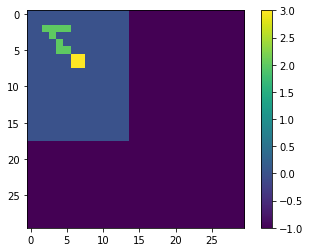

LOSS AT EPOCH 740: tf.Tensor(0.0030720095928774417, shape=(), dtype=float64)
TRAINING


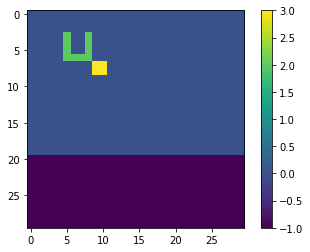

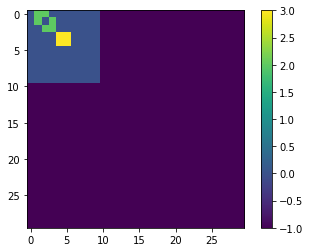

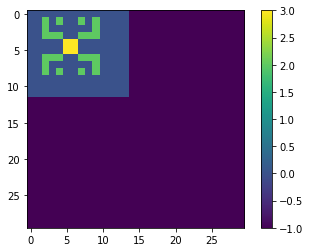

TEST


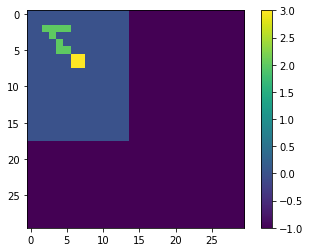

LOSS AT EPOCH 742: tf.Tensor(0.003071937495651186, shape=(), dtype=float64)
TRAINING


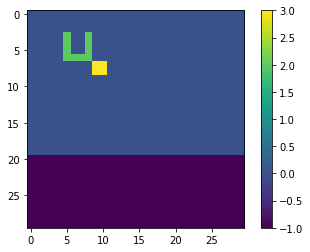

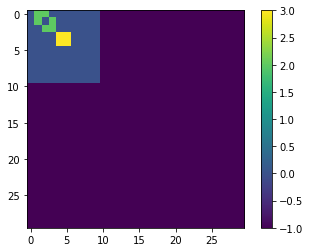

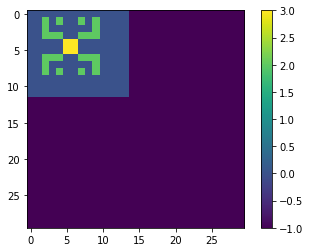

TEST


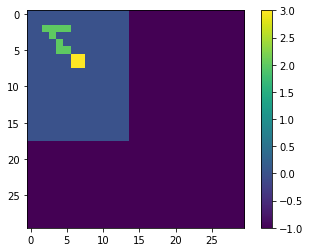

LOSS AT EPOCH 744: tf.Tensor(0.0030718656642455323, shape=(), dtype=float64)
TRAINING


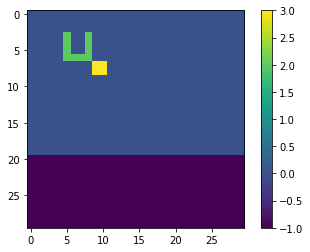

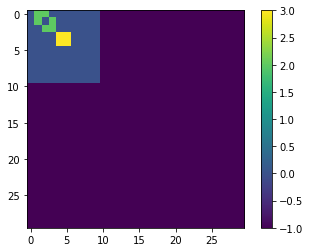

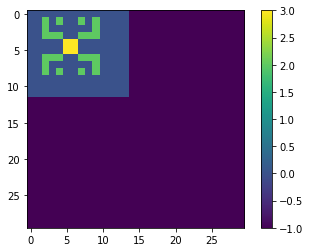

TEST


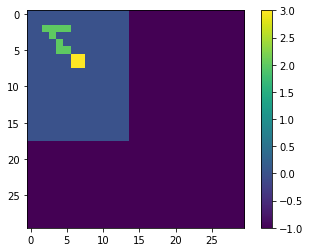

LOSS AT EPOCH 746: tf.Tensor(0.003071794061351173, shape=(), dtype=float64)
TRAINING


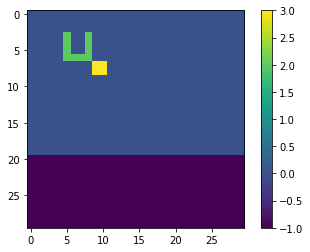

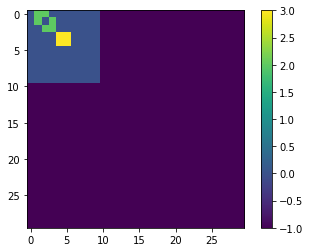

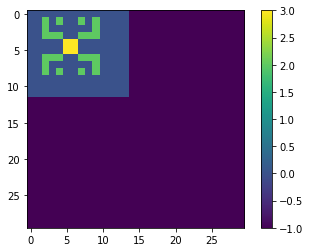

TEST


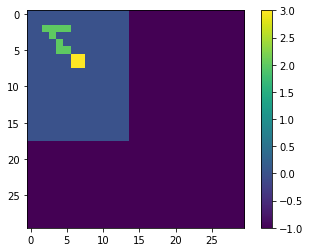

LOSS AT EPOCH 748: tf.Tensor(0.0030717225731748394, shape=(), dtype=float64)
TRAINING


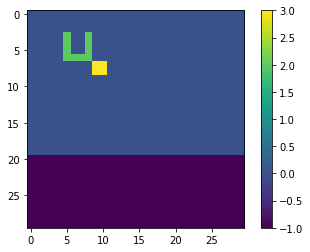

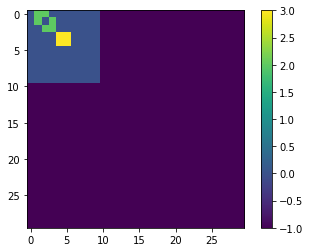

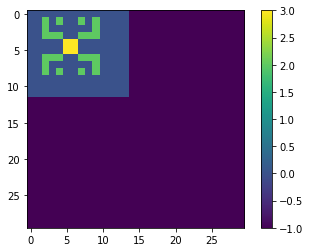

TEST


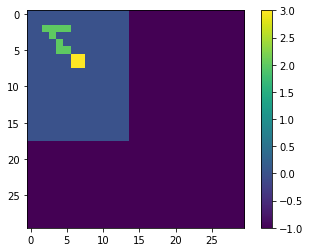

LOSS AT EPOCH 750: tf.Tensor(0.0030716512504781767, shape=(), dtype=float64)
TRAINING


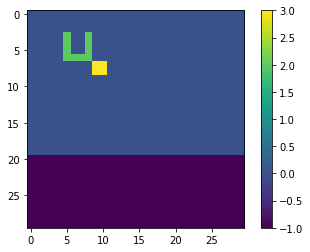

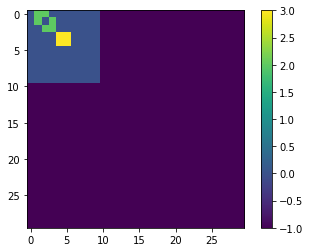

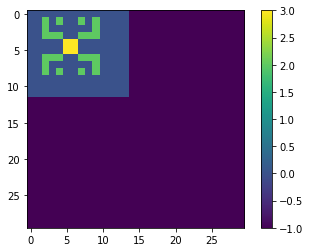

TEST


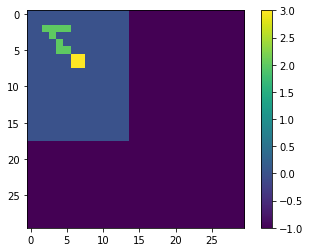

LOSS AT EPOCH 752: tf.Tensor(0.0030715800502970378, shape=(), dtype=float64)
TRAINING


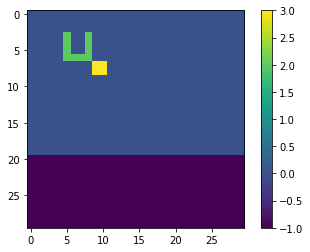

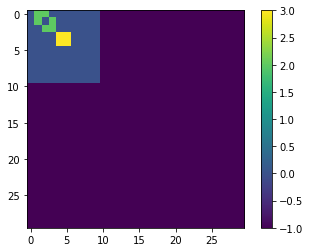

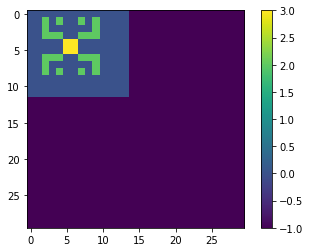

TEST


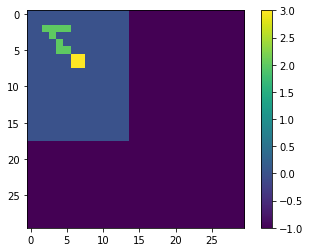

LOSS AT EPOCH 754: tf.Tensor(0.0030715089111593165, shape=(), dtype=float64)
TRAINING


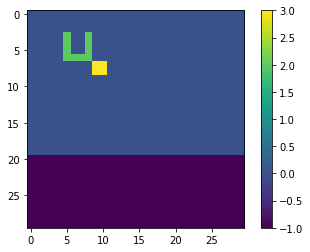

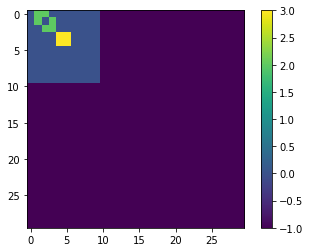

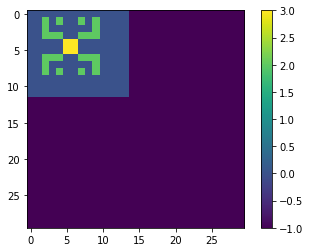

TEST


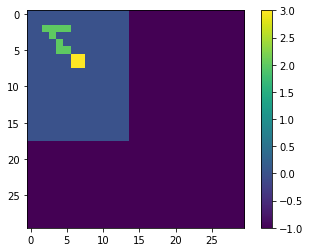

LOSS AT EPOCH 756: tf.Tensor(0.0030714378492388956, shape=(), dtype=float64)
TRAINING


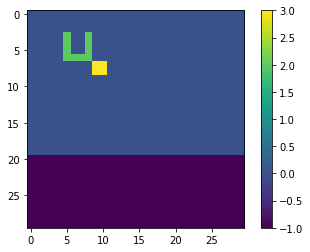

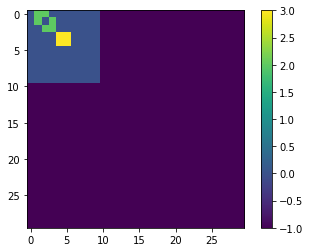

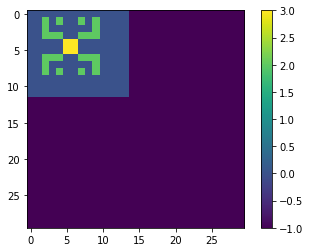

TEST


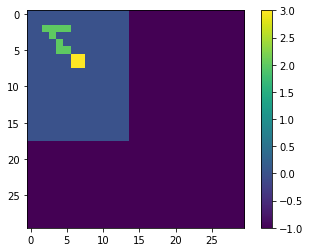

LOSS AT EPOCH 758: tf.Tensor(0.003071366846310908, shape=(), dtype=float64)
TRAINING


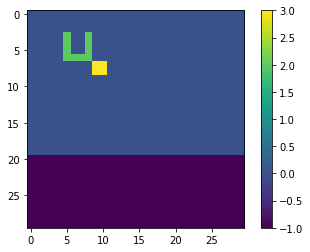

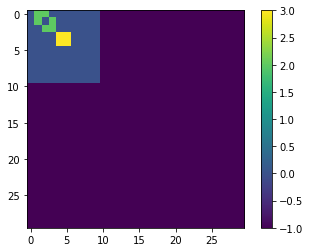

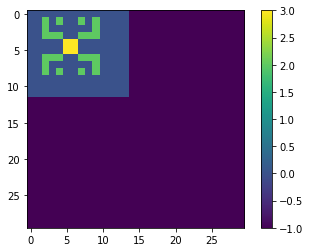

TEST


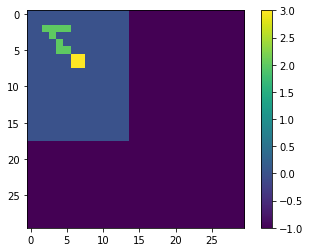

LOSS AT EPOCH 760: tf.Tensor(0.003071295918018024, shape=(), dtype=float64)
TRAINING


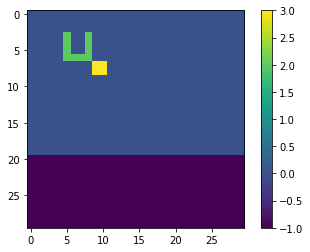

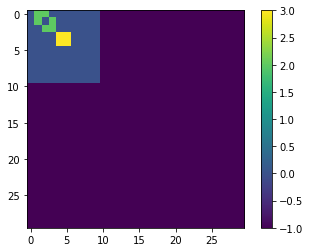

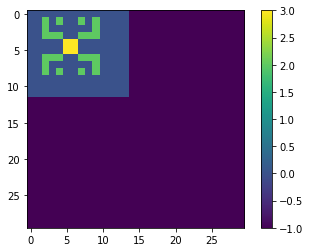

TEST


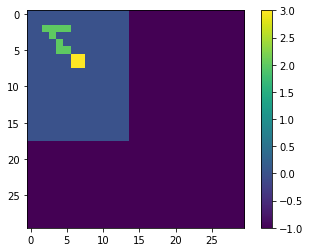

LOSS AT EPOCH 762: tf.Tensor(0.0030712251763005756, shape=(), dtype=float64)
TRAINING


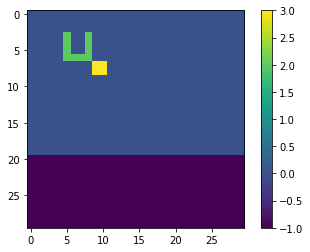

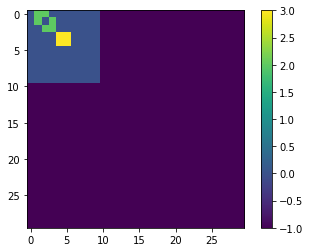

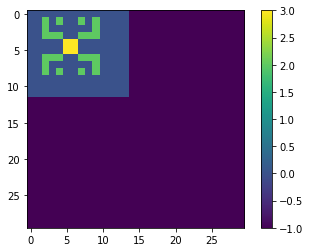

TEST


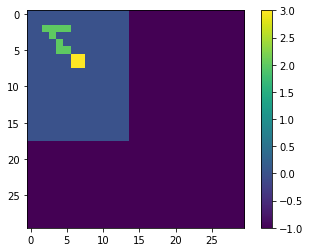

LOSS AT EPOCH 764: tf.Tensor(0.003071154519033433, shape=(), dtype=float64)
TRAINING


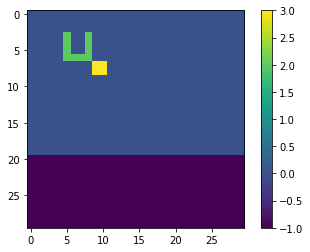

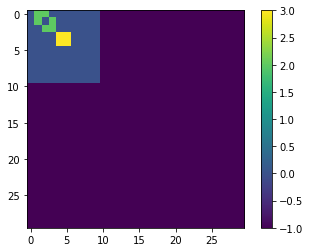

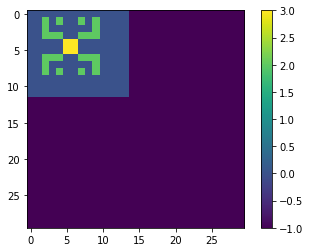

TEST


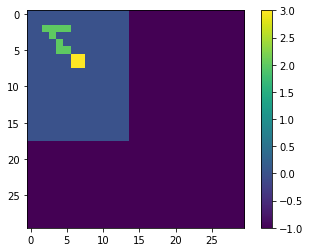

LOSS AT EPOCH 766: tf.Tensor(0.003071083922811012, shape=(), dtype=float64)
TRAINING


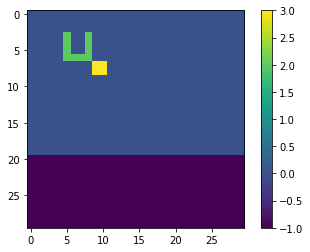

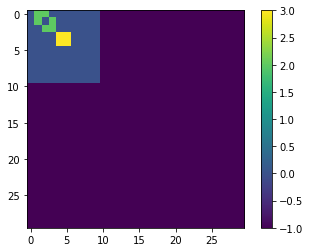

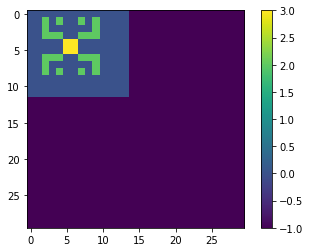

TEST


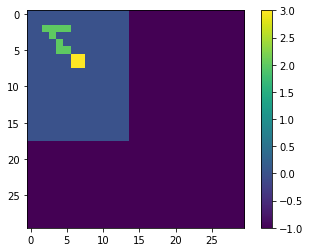

LOSS AT EPOCH 768: tf.Tensor(0.003071013433243665, shape=(), dtype=float64)
TRAINING


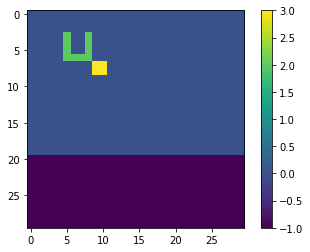

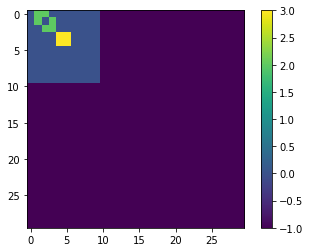

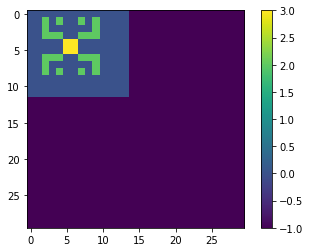

TEST


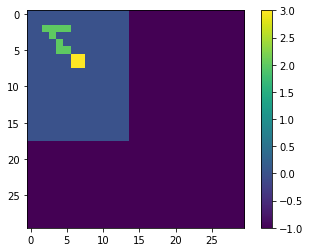

LOSS AT EPOCH 770: tf.Tensor(0.0030709430290720282, shape=(), dtype=float64)
TRAINING


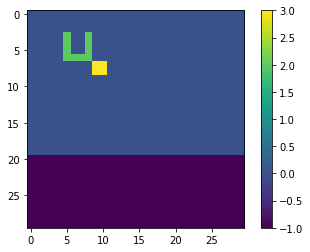

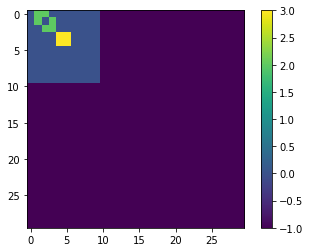

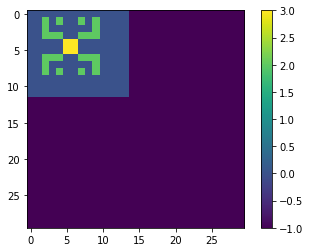

TEST


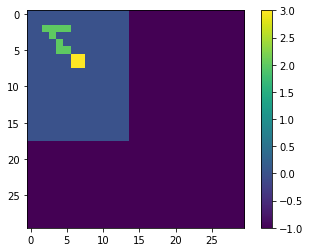

LOSS AT EPOCH 772: tf.Tensor(0.0030708726695864073, shape=(), dtype=float64)
TRAINING


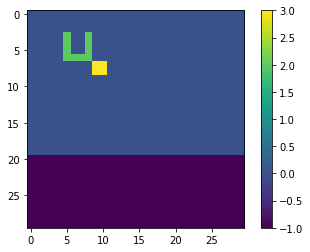

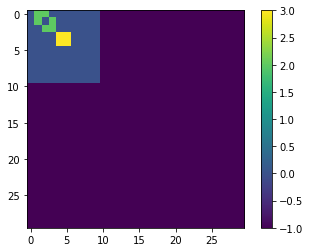

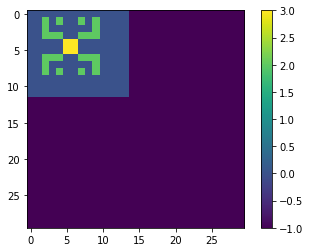

TEST


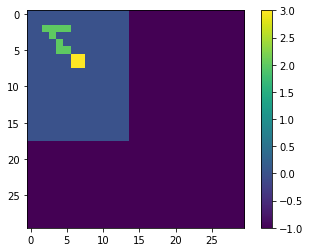

LOSS AT EPOCH 774: tf.Tensor(0.0030708023352550044, shape=(), dtype=float64)
TRAINING


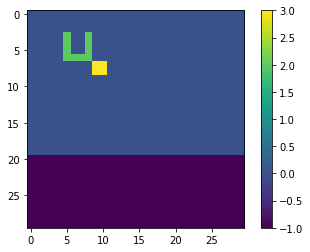

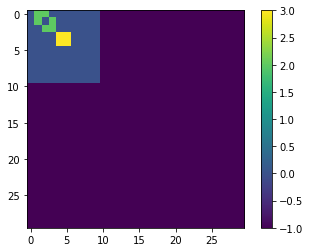

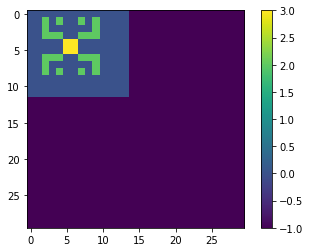

TEST


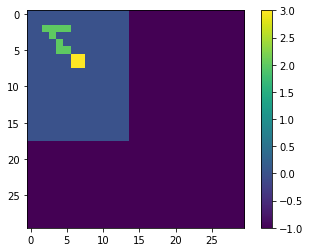

LOSS AT EPOCH 776: tf.Tensor(0.0030707320301069803, shape=(), dtype=float64)
TRAINING


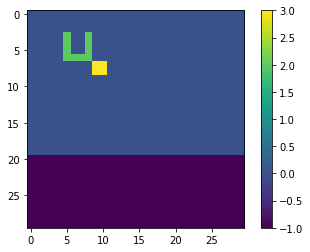

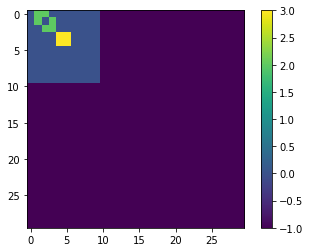

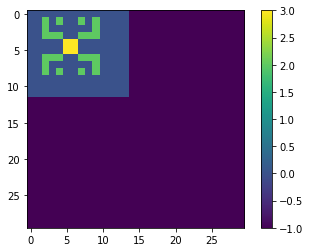

TEST


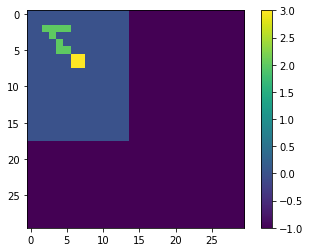

LOSS AT EPOCH 778: tf.Tensor(0.003070661747121741, shape=(), dtype=float64)
TRAINING


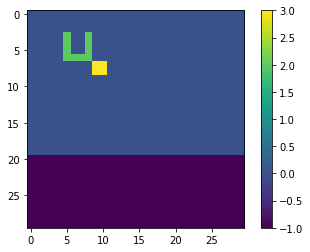

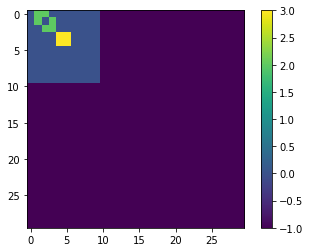

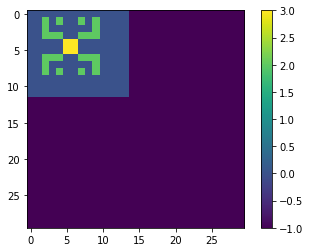

TEST


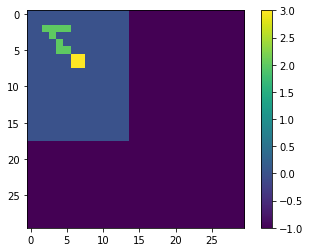

LOSS AT EPOCH 780: tf.Tensor(0.003070591516197174, shape=(), dtype=float64)
TRAINING


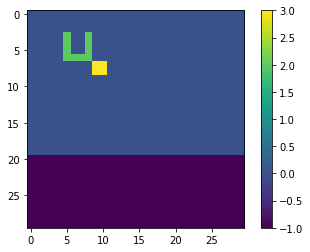

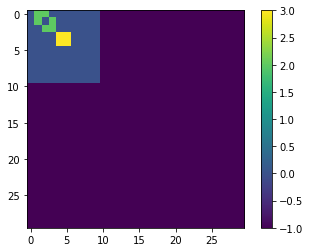

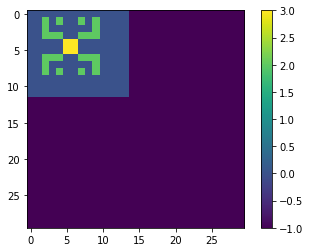

TEST


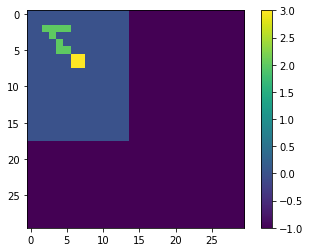

LOSS AT EPOCH 782: tf.Tensor(0.0030705214271253183, shape=(), dtype=float64)
TRAINING


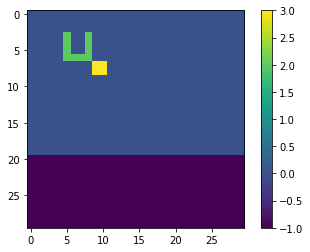

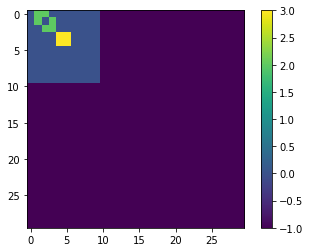

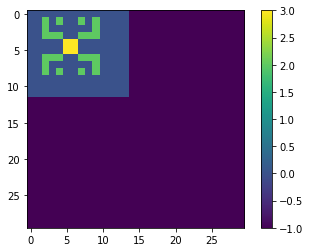

TEST


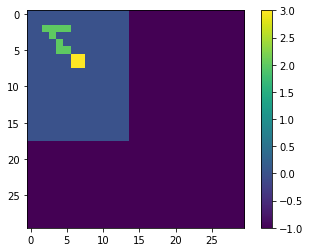

LOSS AT EPOCH 784: tf.Tensor(0.003070451461320147, shape=(), dtype=float64)
TRAINING


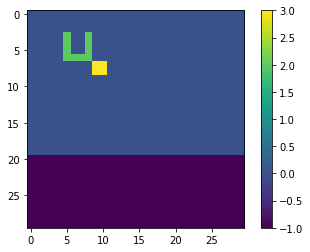

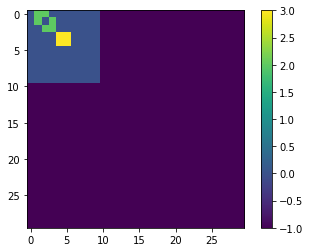

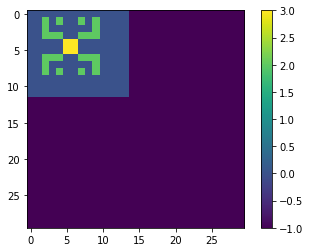

TEST


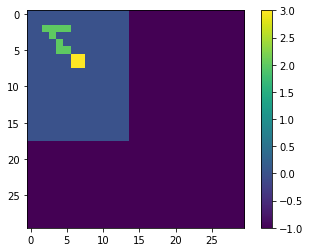

LOSS AT EPOCH 786: tf.Tensor(0.0030703815271472083, shape=(), dtype=float64)
TRAINING


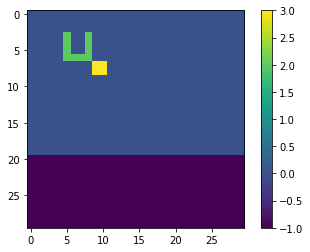

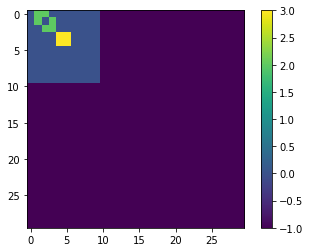

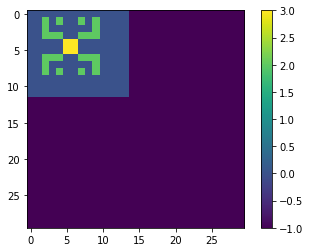

TEST


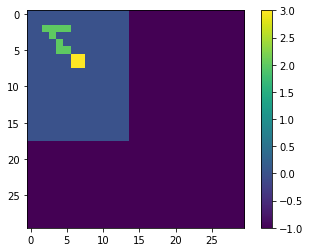

LOSS AT EPOCH 788: tf.Tensor(0.0030703116144746106, shape=(), dtype=float64)
TRAINING


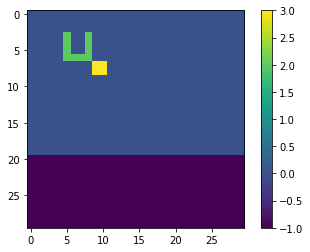

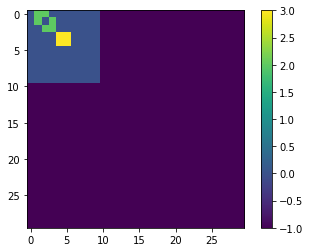

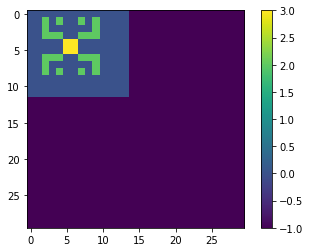

TEST


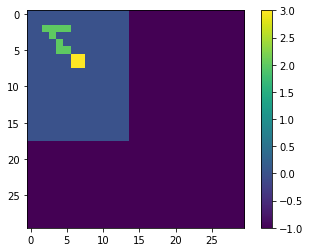

LOSS AT EPOCH 790: tf.Tensor(0.0030702417194159956, shape=(), dtype=float64)
TRAINING


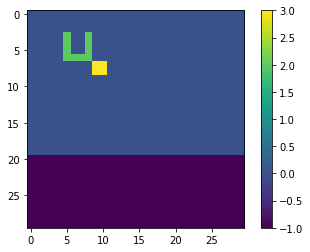

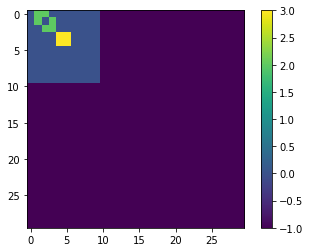

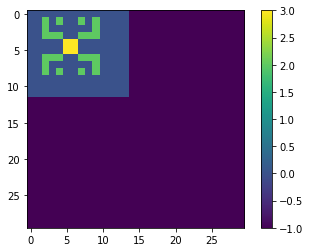

TEST


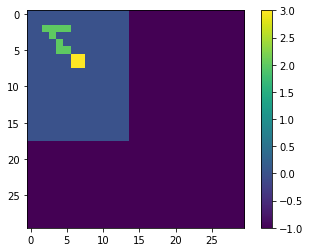

LOSS AT EPOCH 792: tf.Tensor(0.0030701718321251813, shape=(), dtype=float64)
TRAINING


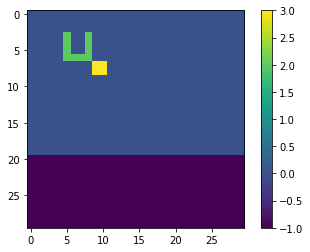

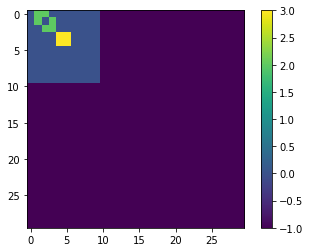

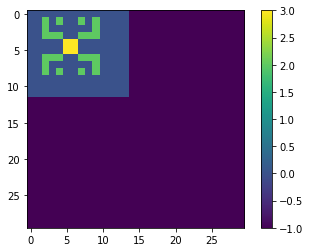

TEST


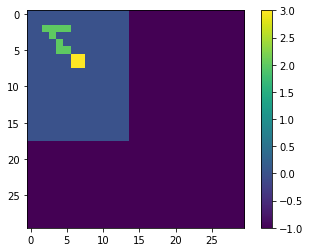

LOSS AT EPOCH 794: tf.Tensor(0.0030701019374003613, shape=(), dtype=float64)
TRAINING


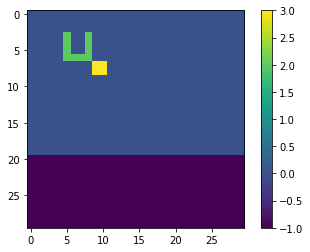

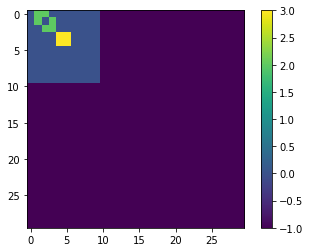

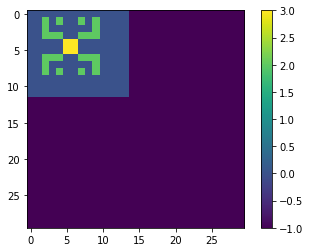

TEST


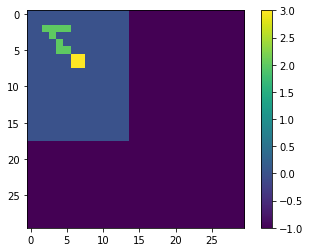

LOSS AT EPOCH 796: tf.Tensor(0.0030700320674576674, shape=(), dtype=float64)
TRAINING


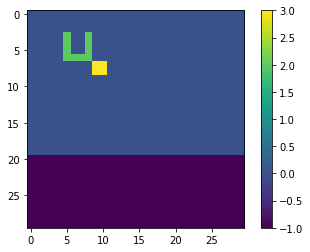

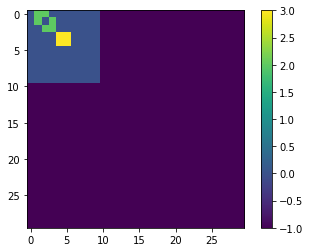

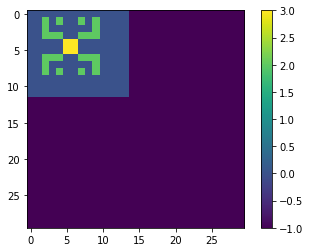

TEST


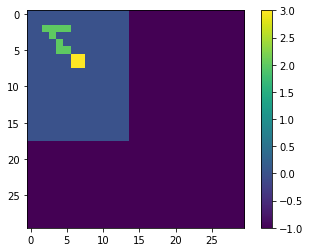

LOSS AT EPOCH 798: tf.Tensor(0.003069962197603576, shape=(), dtype=float64)
TRAINING


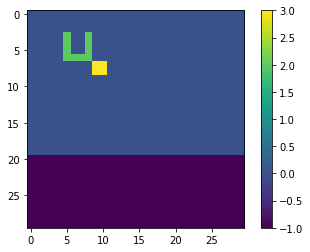

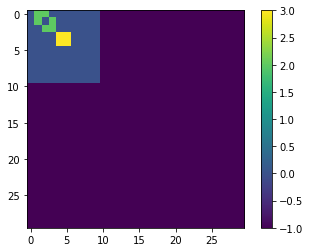

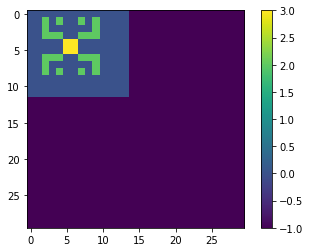

TEST


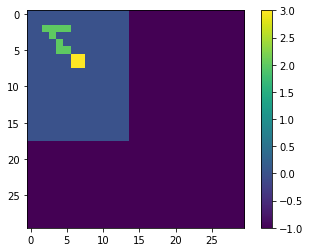

LOSS AT EPOCH 800: tf.Tensor(0.0030698923461493946, shape=(), dtype=float64)
TRAINING


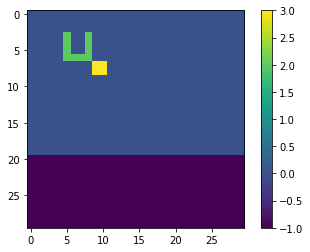

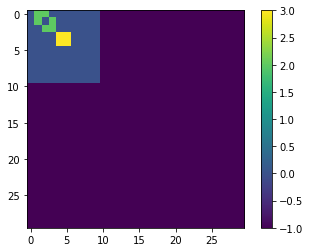

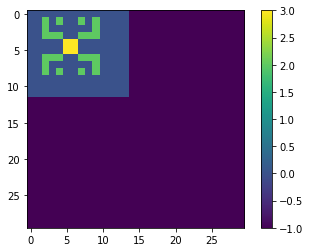

TEST


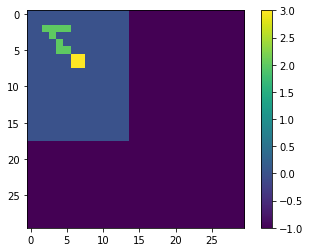

LOSS AT EPOCH 802: tf.Tensor(0.0030698225185197985, shape=(), dtype=float64)
TRAINING


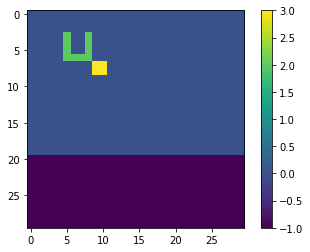

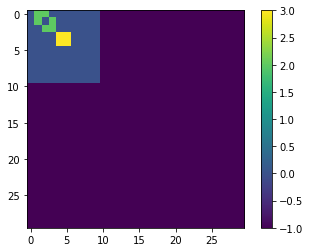

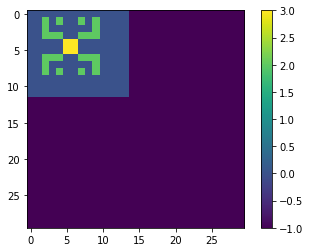

TEST


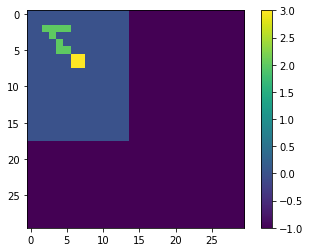

LOSS AT EPOCH 804: tf.Tensor(0.0030697527120817606, shape=(), dtype=float64)
TRAINING


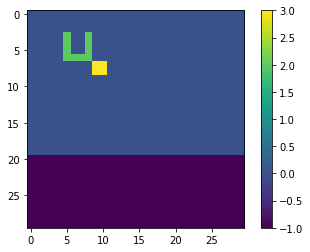

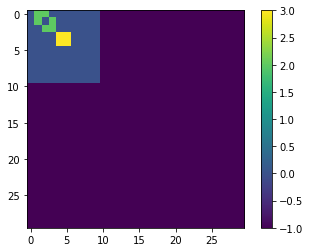

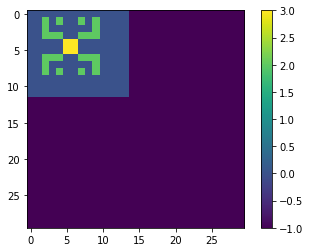

TEST


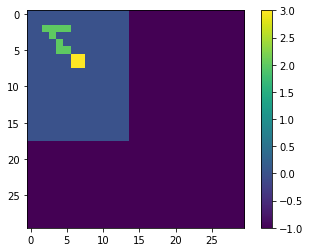

LOSS AT EPOCH 806: tf.Tensor(0.0030696829005965177, shape=(), dtype=float64)
TRAINING


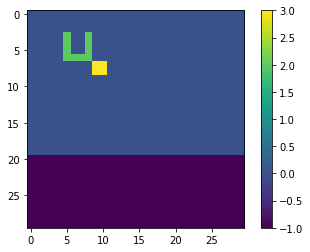

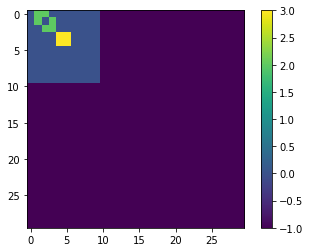

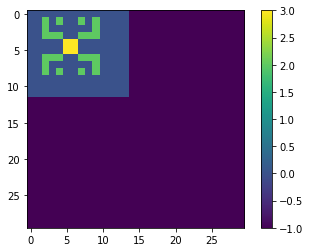

TEST


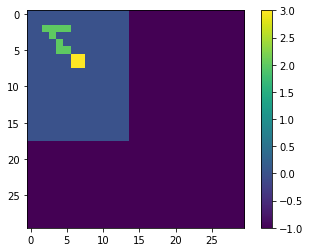

LOSS AT EPOCH 808: tf.Tensor(0.0030696131210347826, shape=(), dtype=float64)
TRAINING


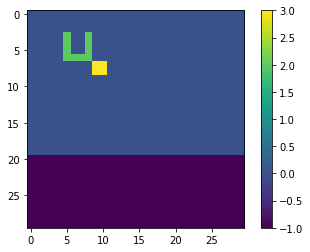

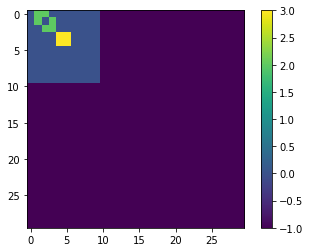

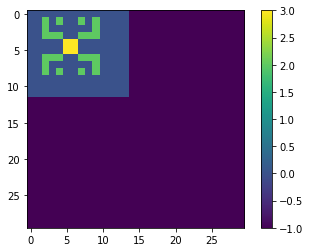

TEST


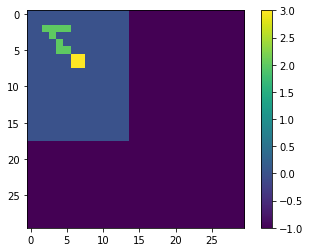

LOSS AT EPOCH 810: tf.Tensor(0.003069543357083292, shape=(), dtype=float64)
TRAINING


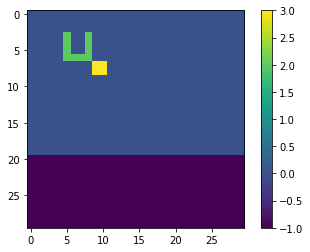

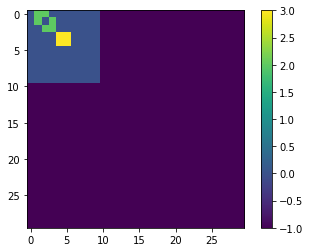

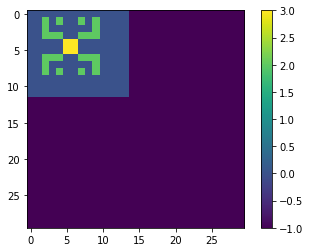

TEST


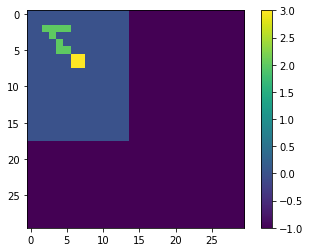

LOSS AT EPOCH 812: tf.Tensor(0.0030694736161427294, shape=(), dtype=float64)
TRAINING


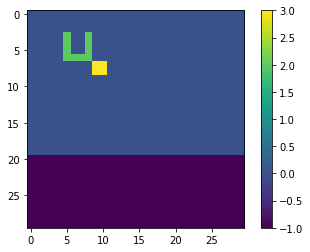

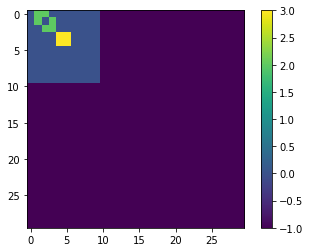

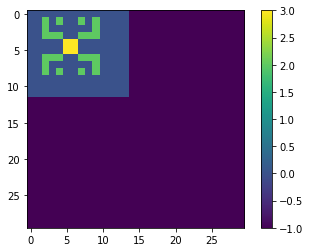

TEST


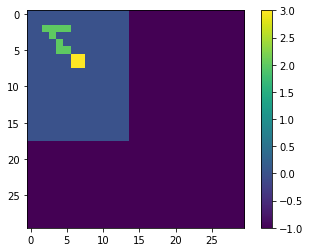

LOSS AT EPOCH 814: tf.Tensor(0.0030694038493009087, shape=(), dtype=float64)
TRAINING


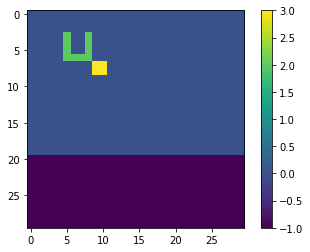

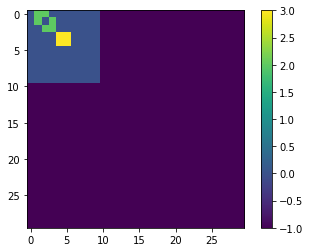

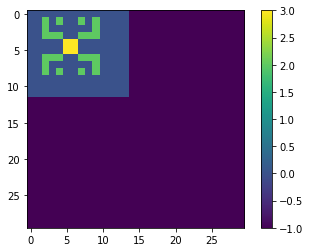

TEST


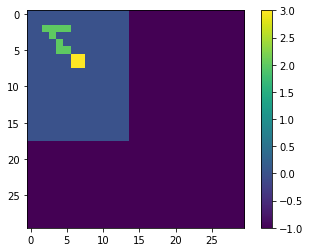

LOSS AT EPOCH 816: tf.Tensor(0.0030693340537017296, shape=(), dtype=float64)
TRAINING


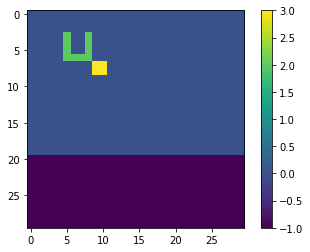

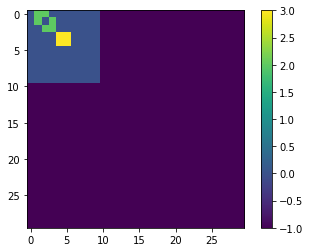

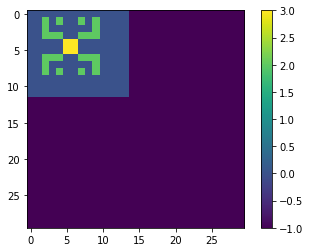

TEST


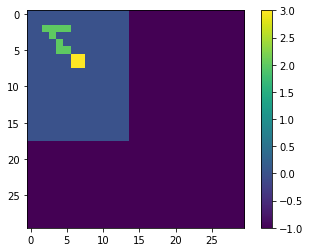

LOSS AT EPOCH 818: tf.Tensor(0.0030692642614119823, shape=(), dtype=float64)
TRAINING


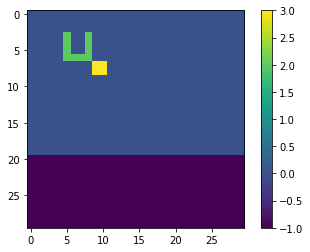

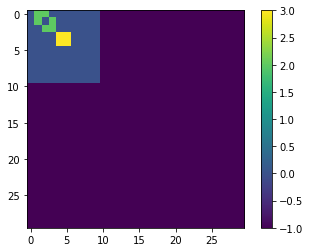

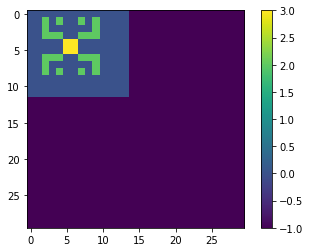

TEST


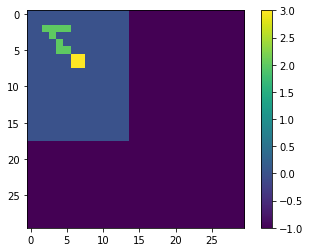

LOSS AT EPOCH 820: tf.Tensor(0.0030691944524517973, shape=(), dtype=float64)
TRAINING


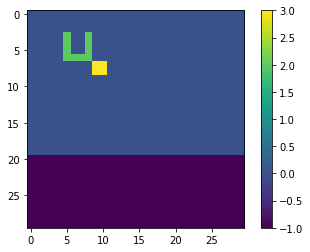

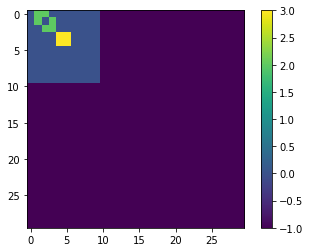

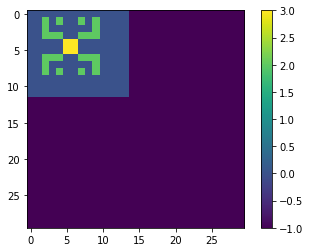

TEST


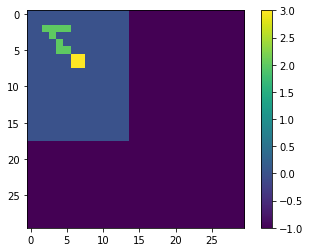

LOSS AT EPOCH 822: tf.Tensor(0.003069124617803393, shape=(), dtype=float64)
TRAINING


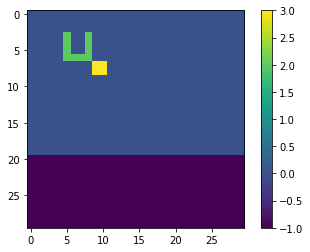

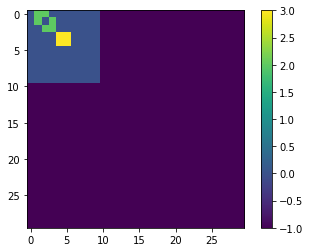

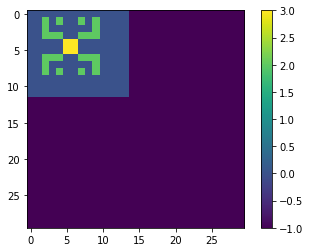

TEST


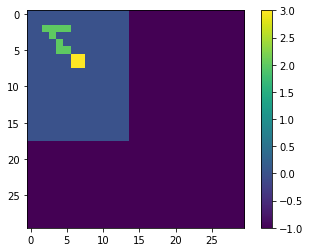

LOSS AT EPOCH 824: tf.Tensor(0.0030690548106554996, shape=(), dtype=float64)
TRAINING


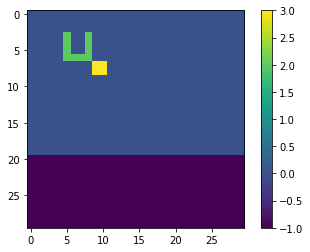

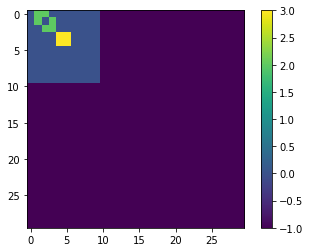

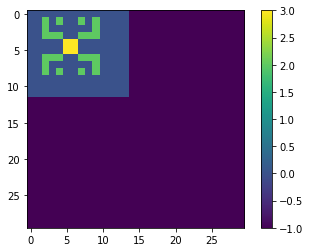

TEST


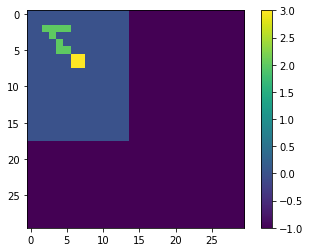

LOSS AT EPOCH 826: tf.Tensor(0.003068984972558314, shape=(), dtype=float64)
TRAINING


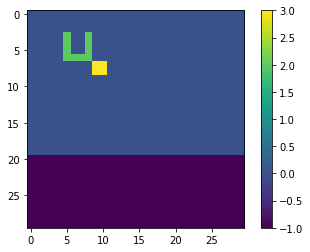

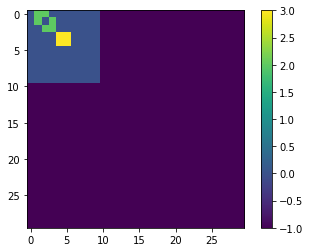

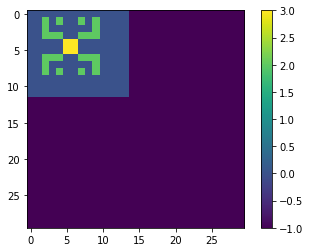

TEST


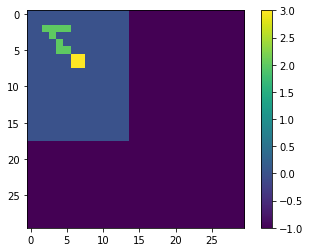

LOSS AT EPOCH 828: tf.Tensor(0.0030689151297973007, shape=(), dtype=float64)
TRAINING


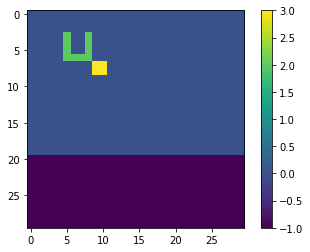

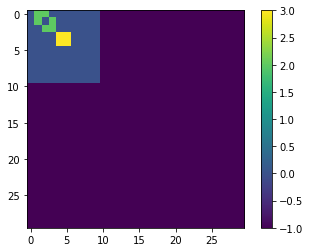

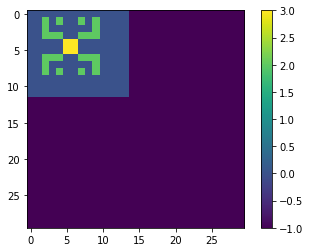

TEST


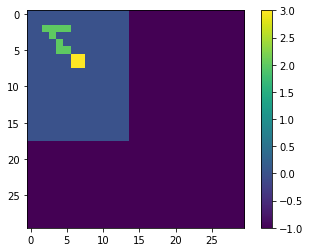

LOSS AT EPOCH 830: tf.Tensor(0.003068845274976256, shape=(), dtype=float64)
TRAINING


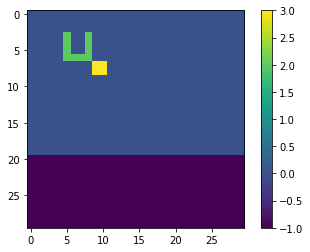

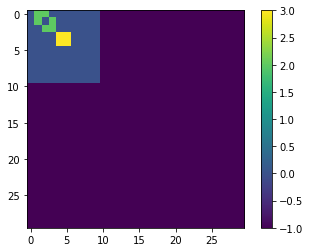

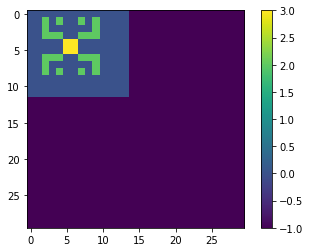

TEST


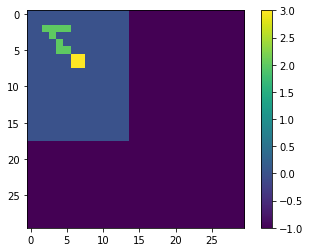

LOSS AT EPOCH 832: tf.Tensor(0.00306877539528398, shape=(), dtype=float64)
TRAINING


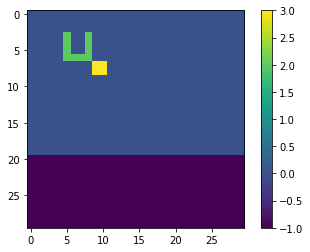

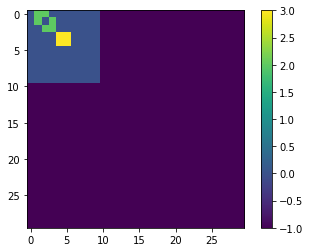

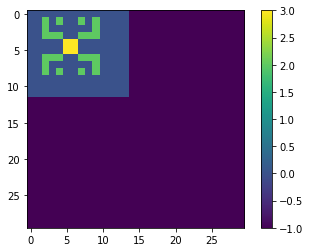

TEST


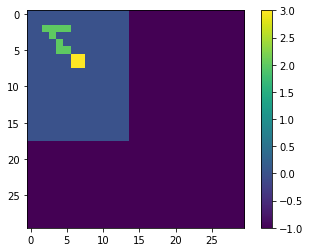

LOSS AT EPOCH 834: tf.Tensor(0.003068705497009294, shape=(), dtype=float64)
TRAINING


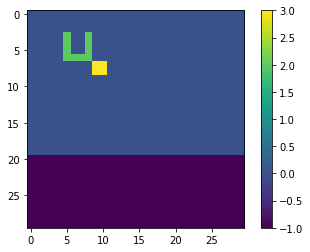

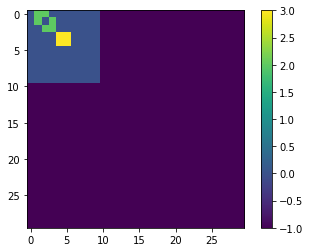

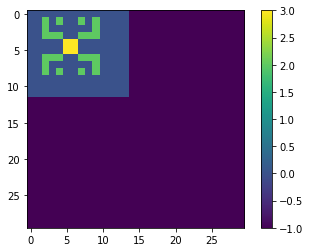

TEST


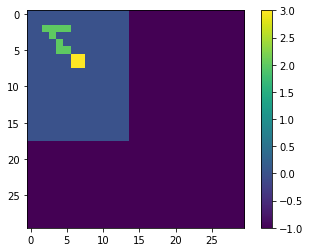

LOSS AT EPOCH 836: tf.Tensor(0.0030686355576492537, shape=(), dtype=float64)
TRAINING


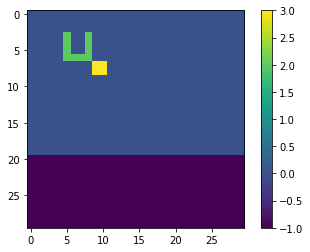

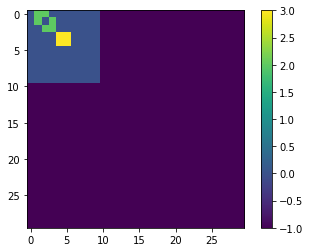

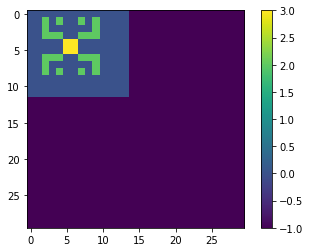

TEST


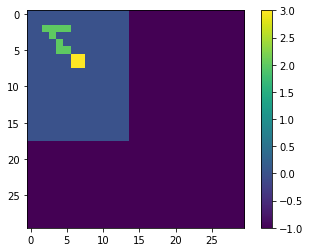

LOSS AT EPOCH 838: tf.Tensor(0.0030685655756956124, shape=(), dtype=float64)
TRAINING


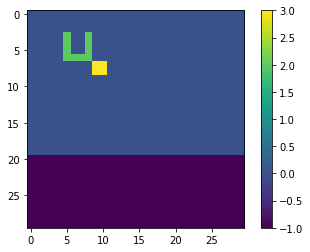

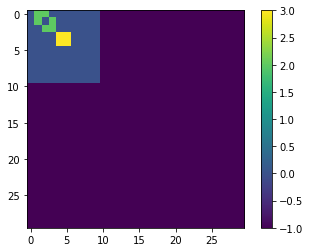

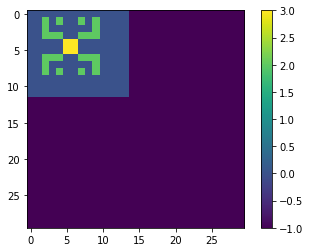

TEST


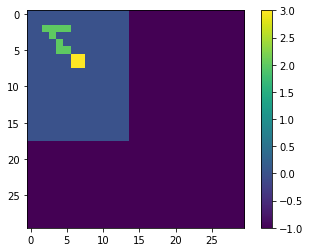

LOSS AT EPOCH 840: tf.Tensor(0.003068495552539861, shape=(), dtype=float64)
TRAINING


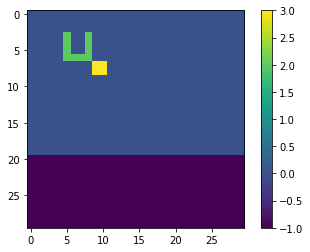

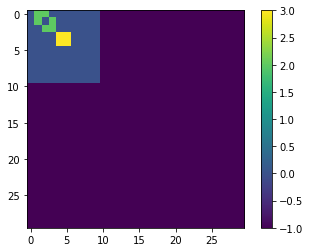

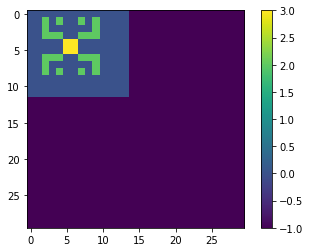

TEST


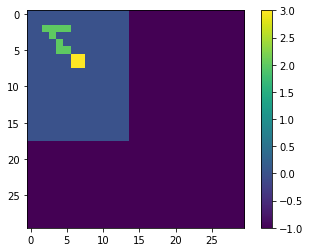

LOSS AT EPOCH 842: tf.Tensor(0.0030684254812702438, shape=(), dtype=float64)
TRAINING


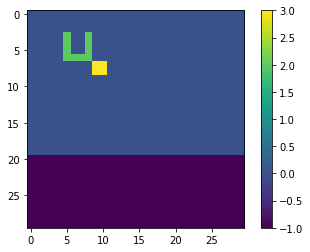

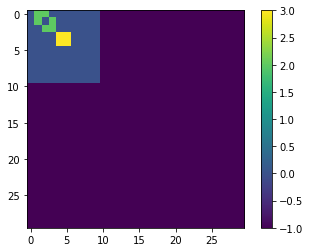

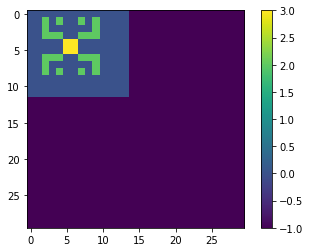

TEST


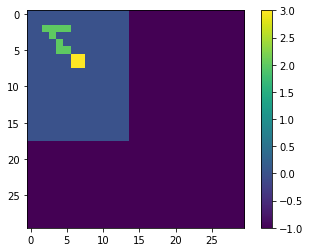

LOSS AT EPOCH 844: tf.Tensor(0.003068355354742665, shape=(), dtype=float64)
TRAINING


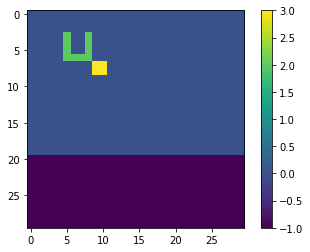

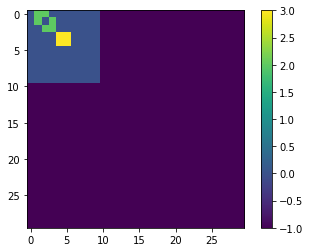

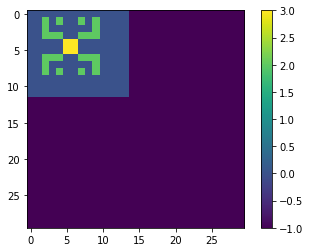

TEST


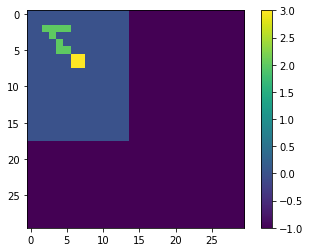

LOSS AT EPOCH 846: tf.Tensor(0.003068285169652137, shape=(), dtype=float64)
TRAINING


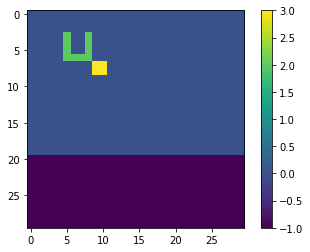

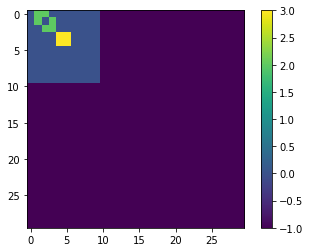

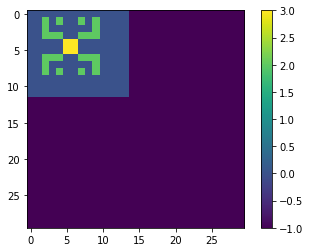

TEST


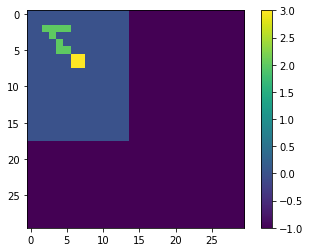

LOSS AT EPOCH 848: tf.Tensor(0.0030682149696108028, shape=(), dtype=float64)
TRAINING


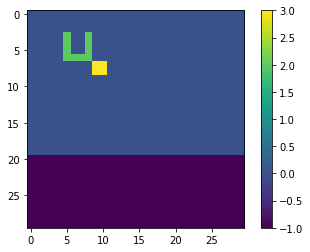

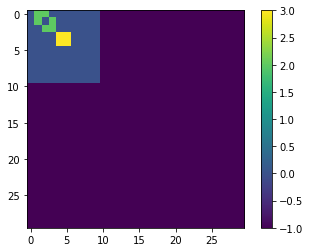

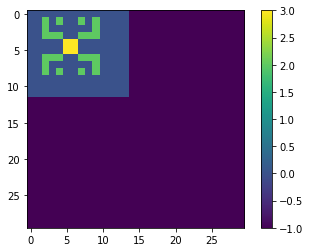

TEST


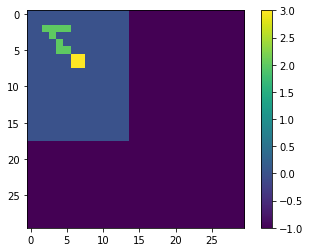

LOSS AT EPOCH 850: tf.Tensor(0.0030681447794764674, shape=(), dtype=float64)
TRAINING


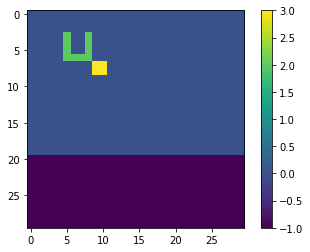

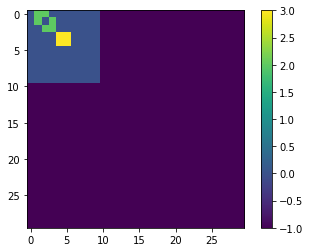

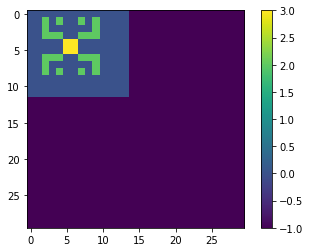

TEST


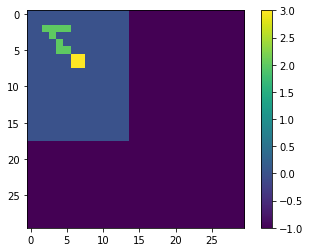

LOSS AT EPOCH 852: tf.Tensor(0.003068074585917585, shape=(), dtype=float64)
TRAINING


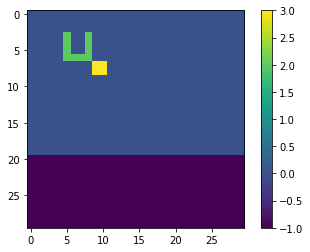

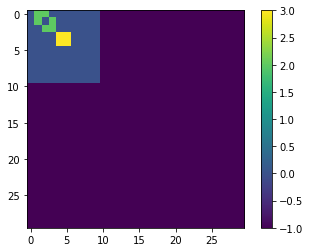

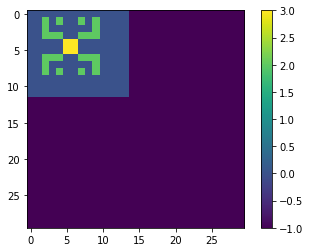

TEST


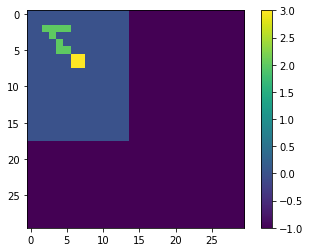

LOSS AT EPOCH 854: tf.Tensor(0.0030680043490440476, shape=(), dtype=float64)
TRAINING


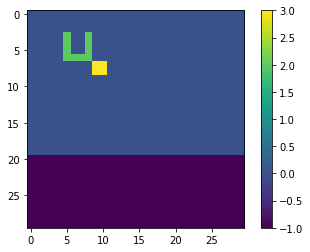

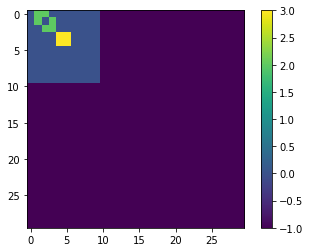

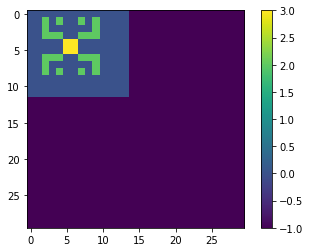

TEST


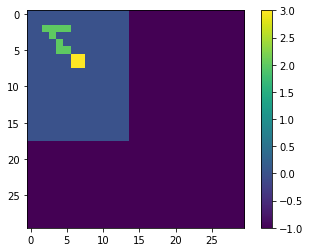

LOSS AT EPOCH 856: tf.Tensor(0.0030679340834900955, shape=(), dtype=float64)
TRAINING


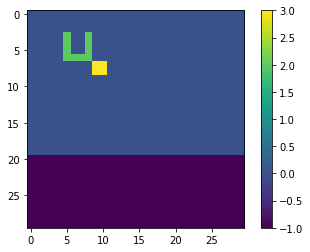

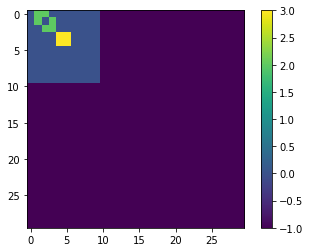

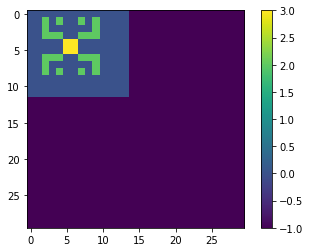

TEST


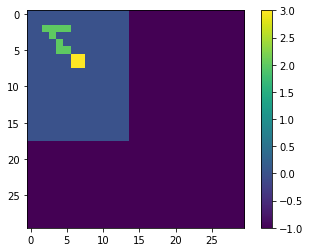

LOSS AT EPOCH 858: tf.Tensor(0.0030678638007993583, shape=(), dtype=float64)
TRAINING


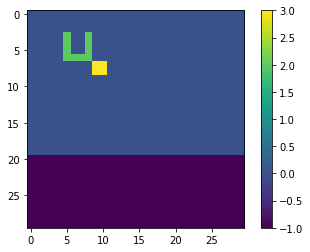

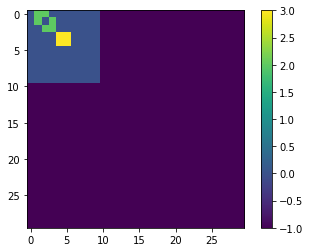

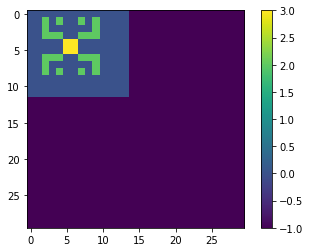

TEST


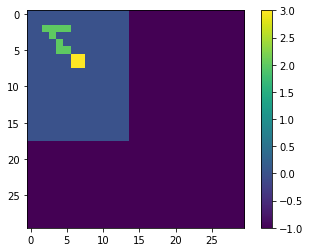

LOSS AT EPOCH 860: tf.Tensor(0.003067793467492649, shape=(), dtype=float64)
TRAINING


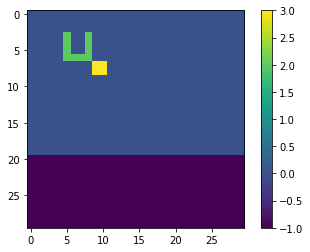

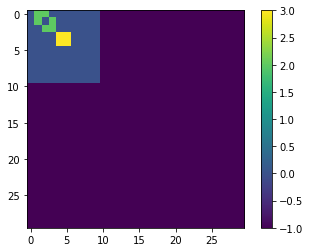

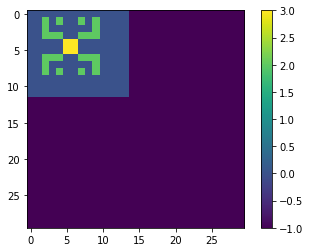

TEST


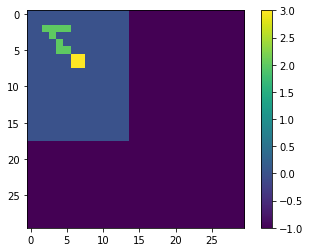

LOSS AT EPOCH 862: tf.Tensor(0.0030677230777943223, shape=(), dtype=float64)
TRAINING


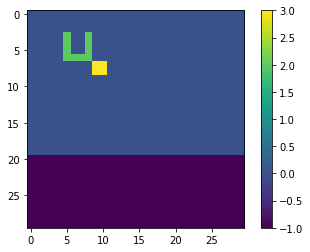

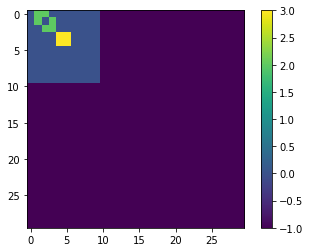

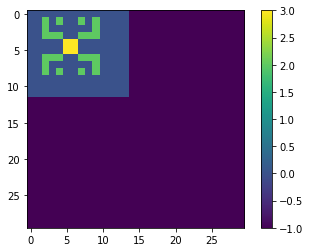

TEST


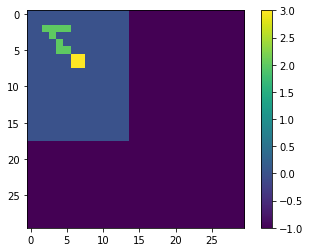

LOSS AT EPOCH 864: tf.Tensor(0.003067652624800583, shape=(), dtype=float64)
TRAINING


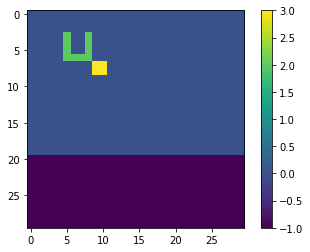

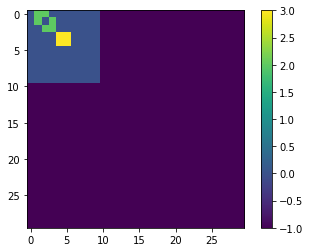

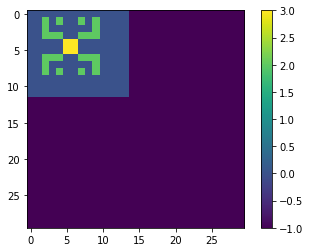

TEST


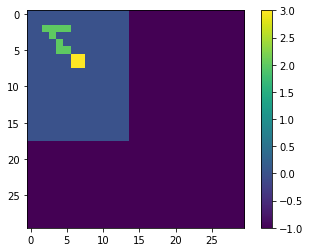

LOSS AT EPOCH 866: tf.Tensor(0.003067582115686956, shape=(), dtype=float64)
TRAINING


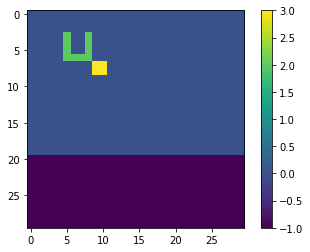

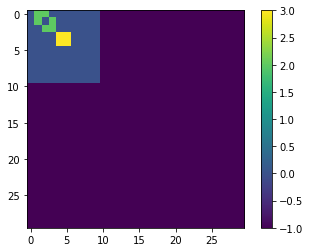

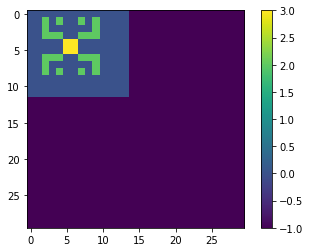

TEST


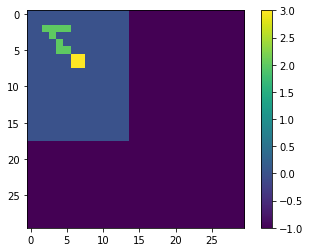

LOSS AT EPOCH 868: tf.Tensor(0.0030675115669024145, shape=(), dtype=float64)
TRAINING


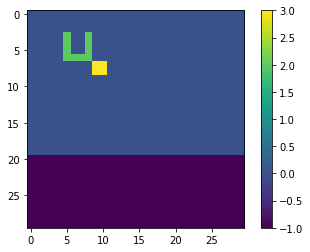

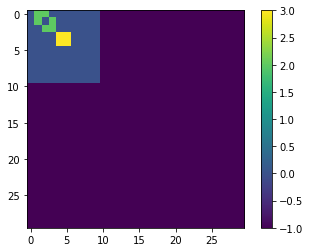

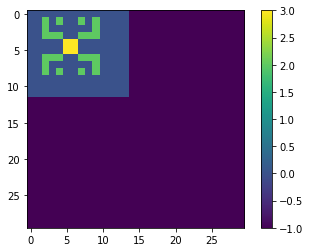

TEST


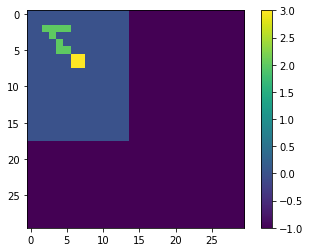

LOSS AT EPOCH 870: tf.Tensor(0.003067440951948998, shape=(), dtype=float64)
TRAINING


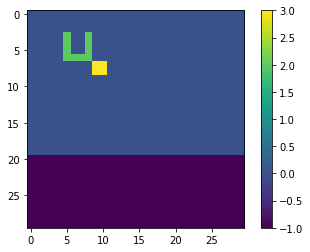

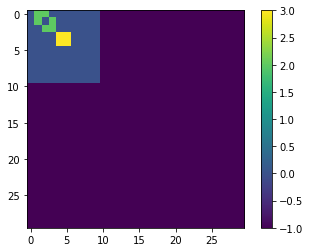

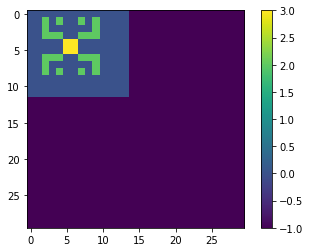

TEST


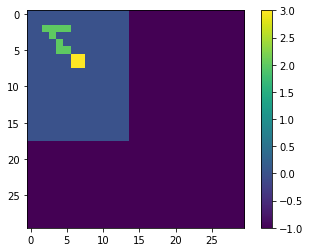

LOSS AT EPOCH 872: tf.Tensor(0.00306737028482195, shape=(), dtype=float64)
TRAINING


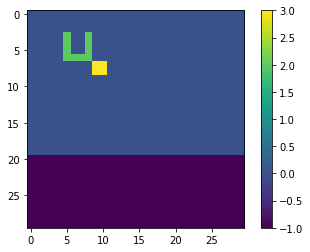

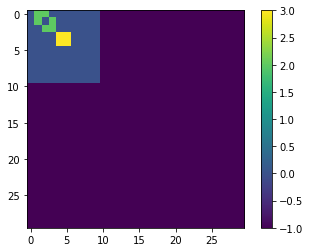

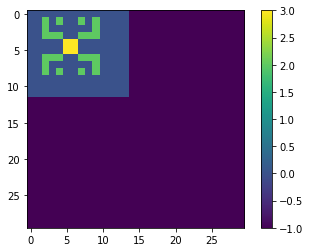

TEST


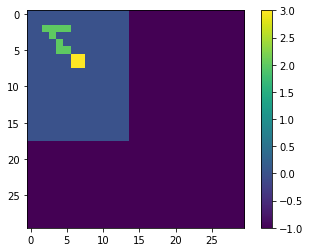

LOSS AT EPOCH 874: tf.Tensor(0.003067299572965171, shape=(), dtype=float64)
TRAINING


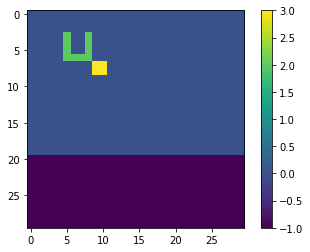

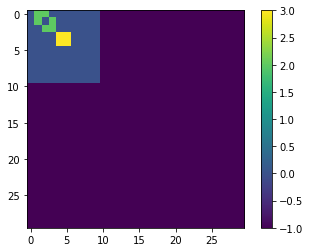

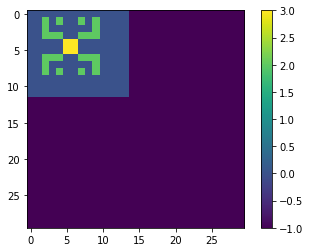

TEST


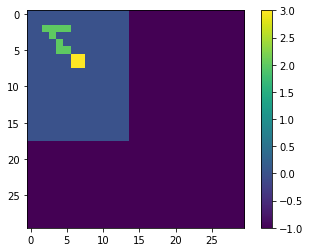

LOSS AT EPOCH 876: tf.Tensor(0.0030672288114982197, shape=(), dtype=float64)
TRAINING


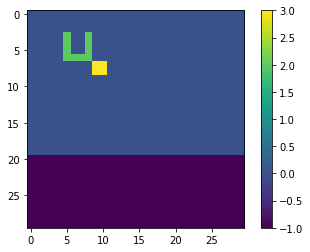

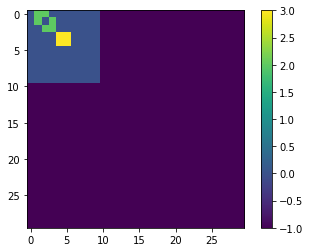

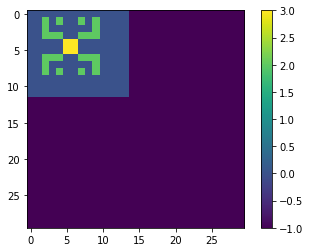

TEST


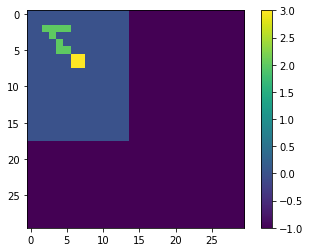

LOSS AT EPOCH 878: tf.Tensor(0.003067158008735389, shape=(), dtype=float64)
TRAINING


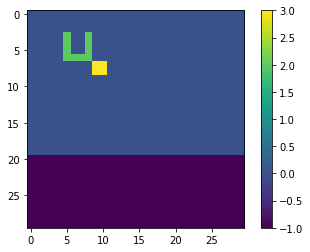

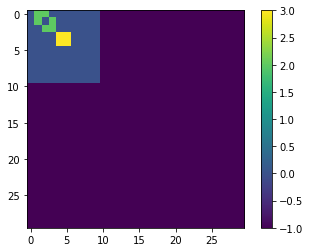

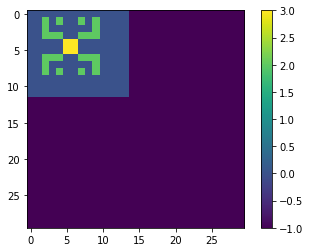

TEST


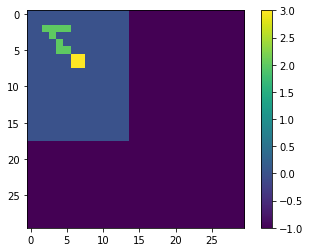

LOSS AT EPOCH 880: tf.Tensor(0.0030670871328682303, shape=(), dtype=float64)
TRAINING


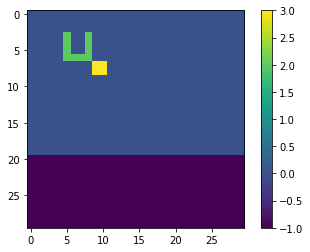

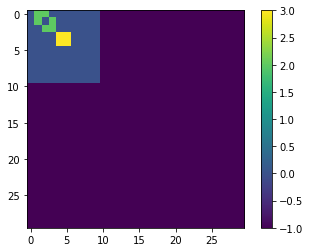

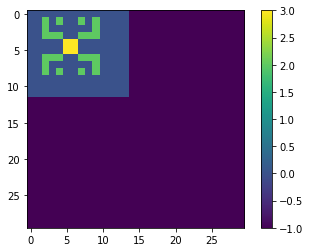

TEST


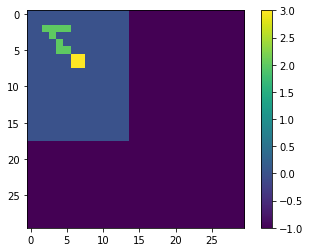

LOSS AT EPOCH 882: tf.Tensor(0.0030670161881136398, shape=(), dtype=float64)
TRAINING


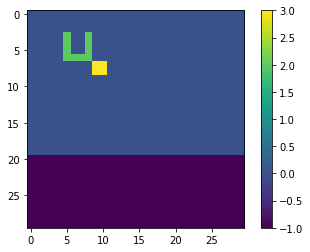

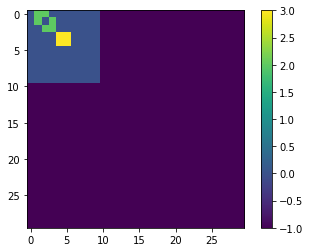

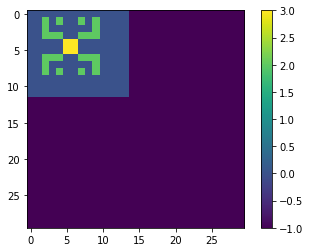

TEST


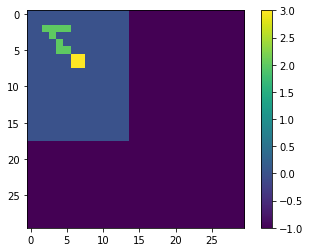

LOSS AT EPOCH 884: tf.Tensor(0.0030669451740857885, shape=(), dtype=float64)
TRAINING


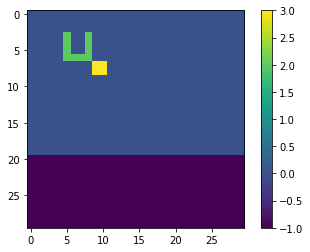

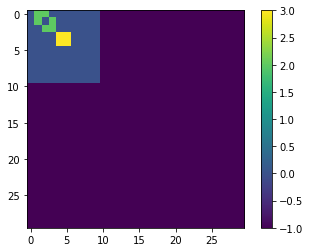

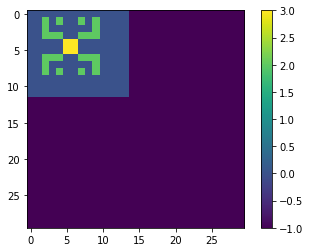

TEST


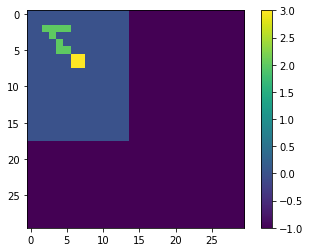

LOSS AT EPOCH 886: tf.Tensor(0.0030668741056435536, shape=(), dtype=float64)
TRAINING


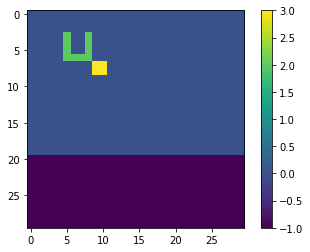

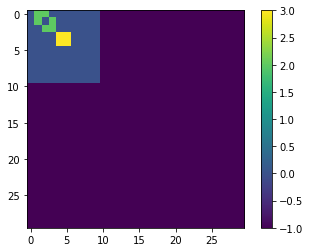

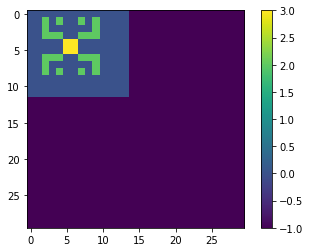

TEST


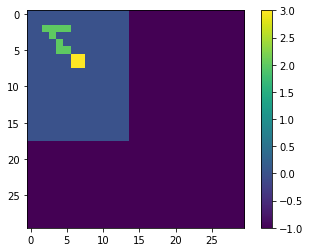

LOSS AT EPOCH 888: tf.Tensor(0.003066802955049833, shape=(), dtype=float64)
TRAINING


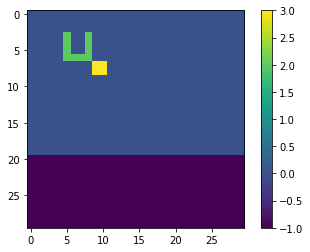

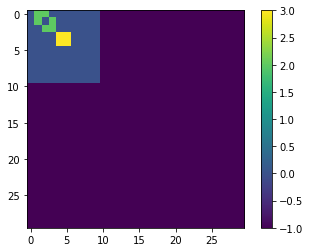

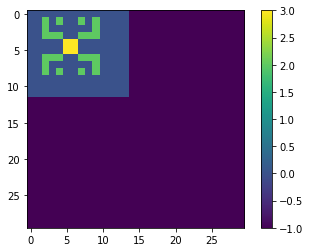

TEST


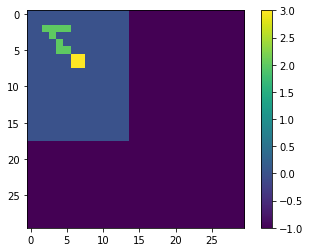

LOSS AT EPOCH 890: tf.Tensor(0.003066731728140177, shape=(), dtype=float64)
TRAINING


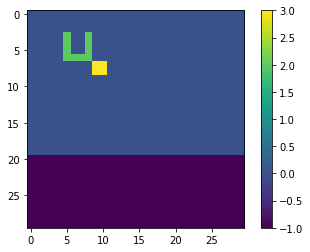

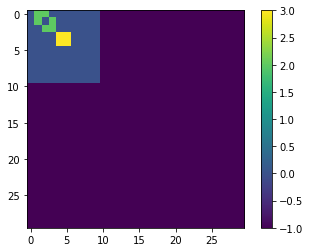

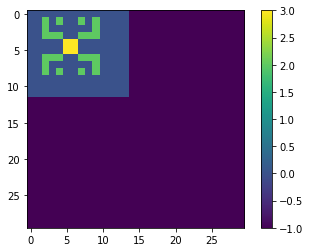

TEST


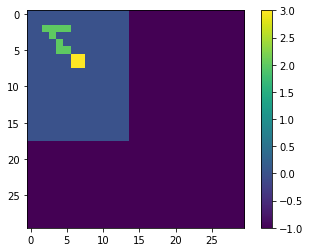

LOSS AT EPOCH 892: tf.Tensor(0.0030666604349054447, shape=(), dtype=float64)
TRAINING


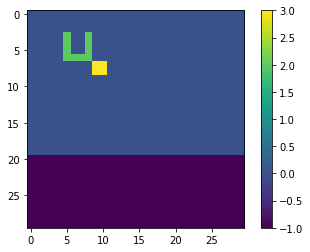

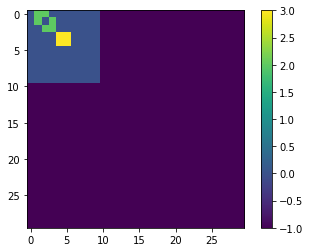

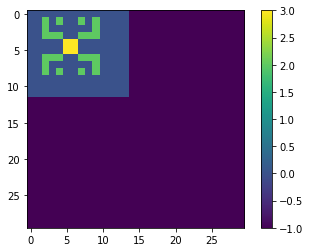

TEST


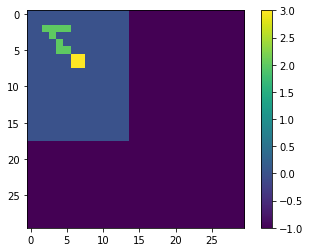

LOSS AT EPOCH 894: tf.Tensor(0.0030665890649083, shape=(), dtype=float64)
TRAINING


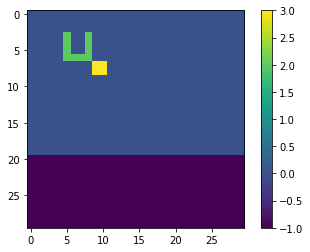

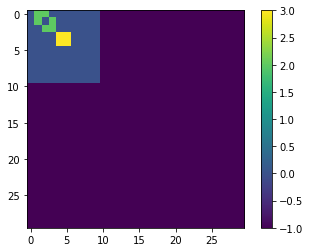

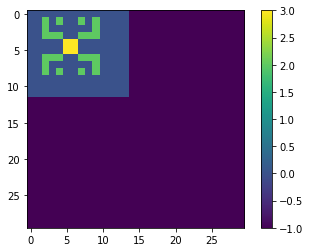

TEST


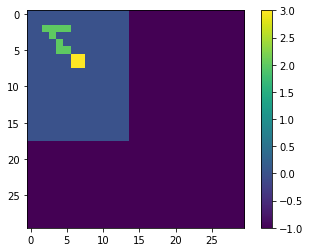

LOSS AT EPOCH 896: tf.Tensor(0.0030665176154441786, shape=(), dtype=float64)
TRAINING


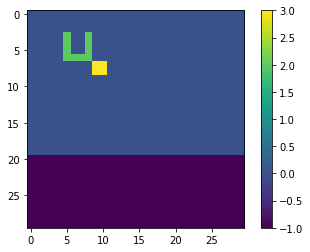

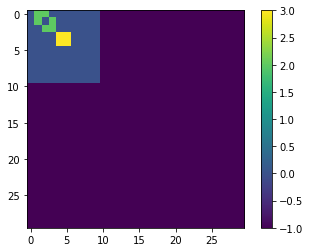

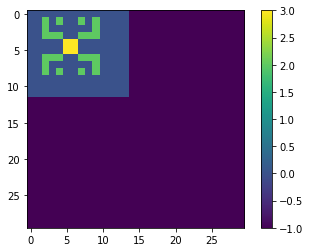

TEST


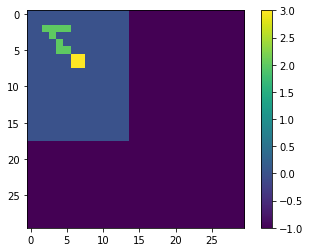

LOSS AT EPOCH 898: tf.Tensor(0.0030664461029986296, shape=(), dtype=float64)
TRAINING


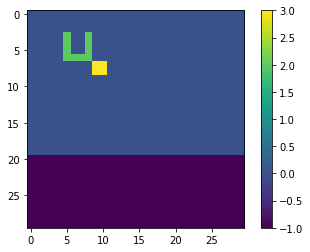

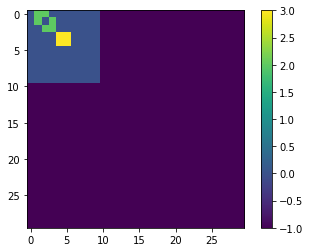

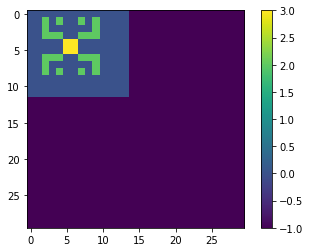

TEST


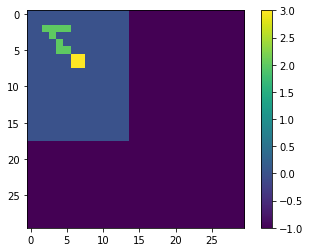

LOSS AT EPOCH 900: tf.Tensor(0.003066374522555613, shape=(), dtype=float64)
TRAINING


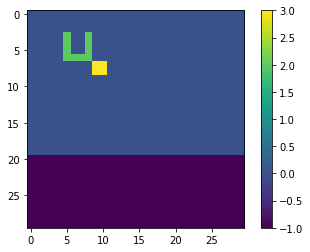

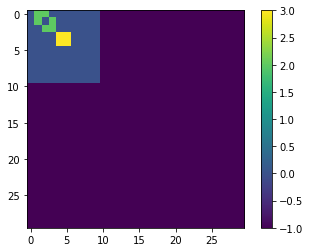

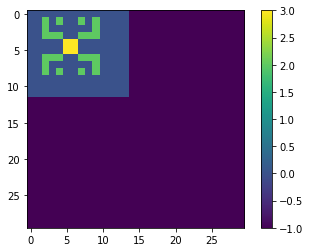

TEST


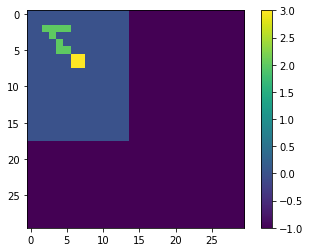

LOSS AT EPOCH 902: tf.Tensor(0.003066302864828068, shape=(), dtype=float64)
TRAINING


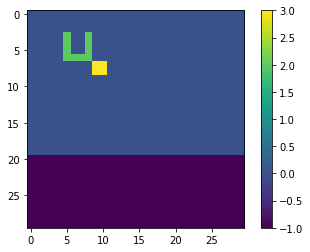

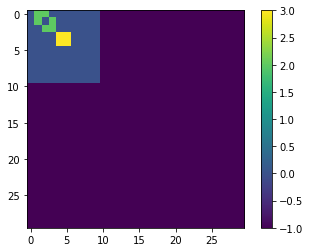

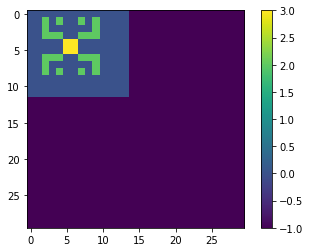

TEST


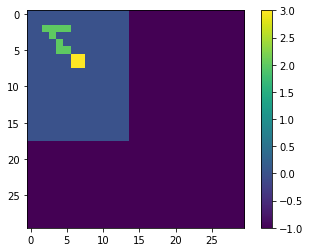

LOSS AT EPOCH 904: tf.Tensor(0.0030662311372699758, shape=(), dtype=float64)
TRAINING


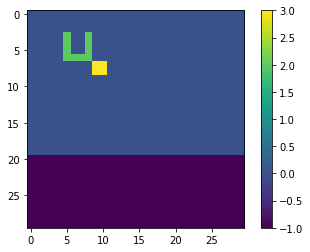

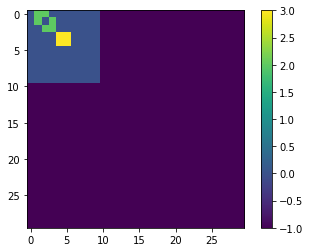

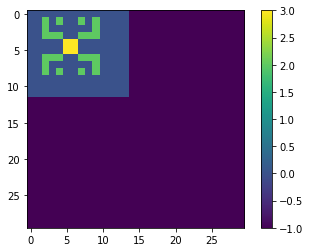

TEST


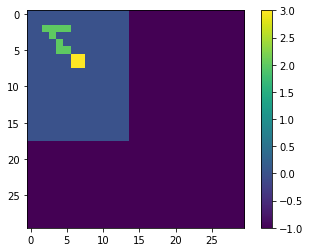

LOSS AT EPOCH 906: tf.Tensor(0.003066159344512552, shape=(), dtype=float64)
TRAINING


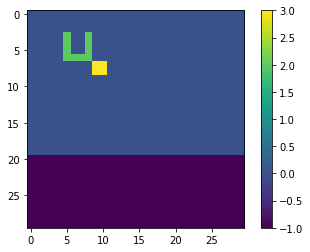

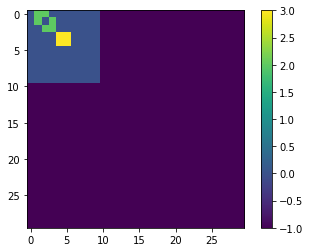

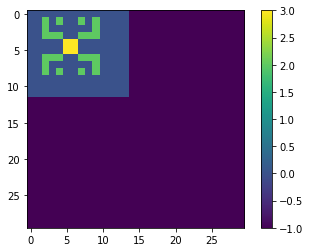

TEST


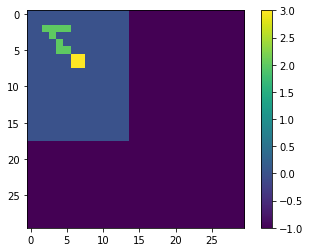

LOSS AT EPOCH 908: tf.Tensor(0.0030660874692854338, shape=(), dtype=float64)
TRAINING


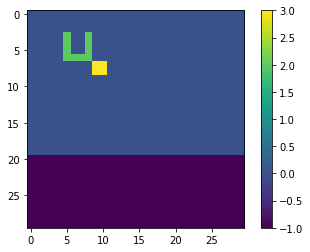

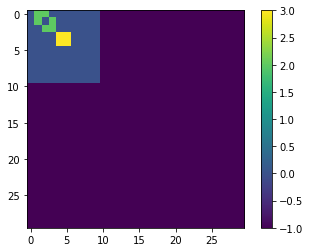

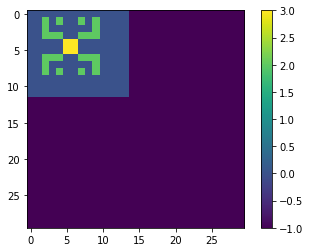

TEST


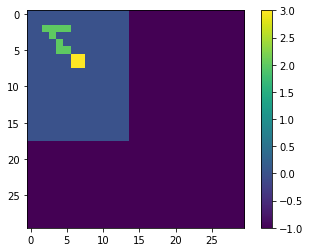

LOSS AT EPOCH 910: tf.Tensor(0.003066015506896115, shape=(), dtype=float64)
TRAINING


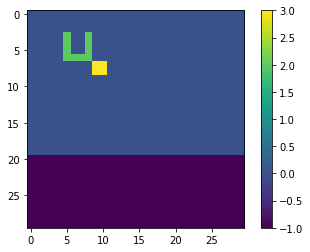

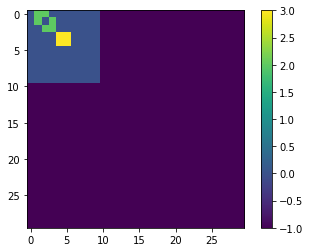

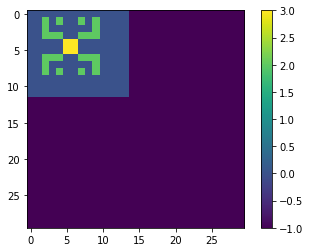

TEST


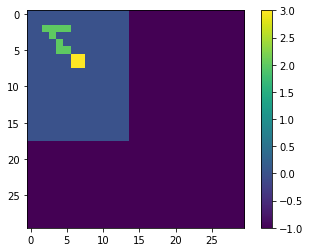

LOSS AT EPOCH 912: tf.Tensor(0.0030659434527131922, shape=(), dtype=float64)
TRAINING


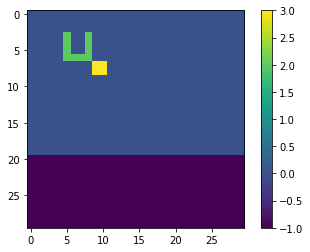

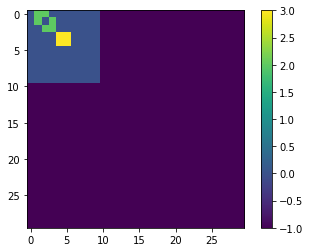

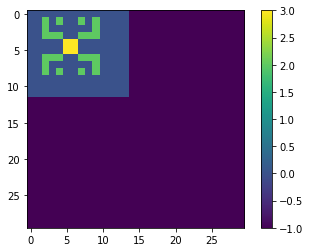

TEST


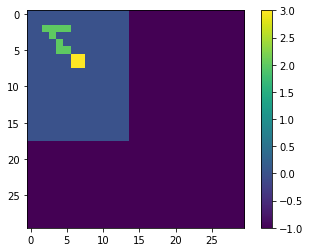

LOSS AT EPOCH 914: tf.Tensor(0.003065871306996081, shape=(), dtype=float64)
TRAINING


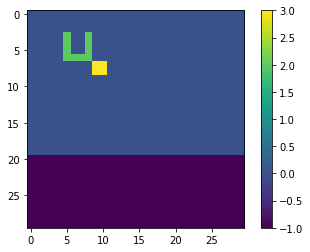

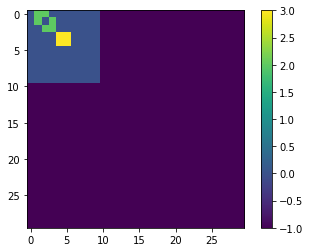

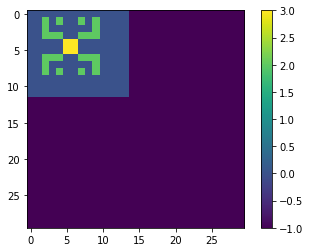

TEST


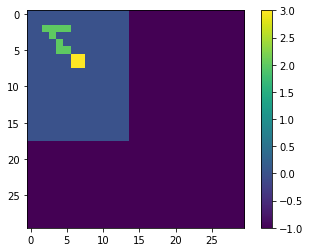

LOSS AT EPOCH 916: tf.Tensor(0.0030657990667363865, shape=(), dtype=float64)
TRAINING


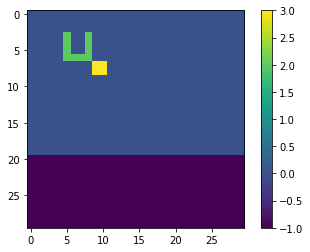

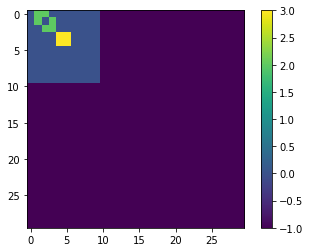

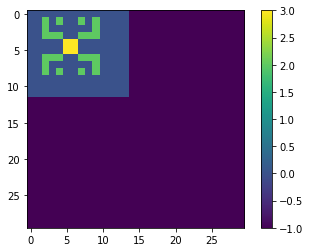

TEST


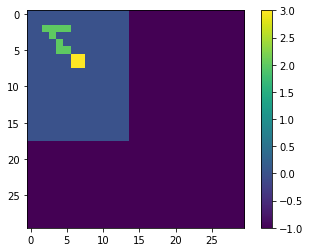

LOSS AT EPOCH 918: tf.Tensor(0.0030657267321087143, shape=(), dtype=float64)
TRAINING


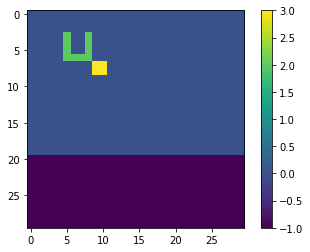

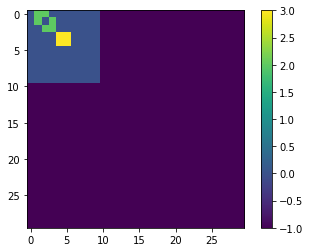

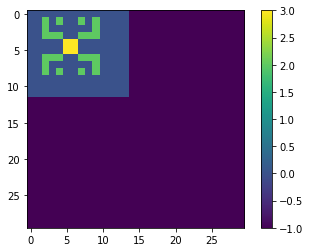

TEST


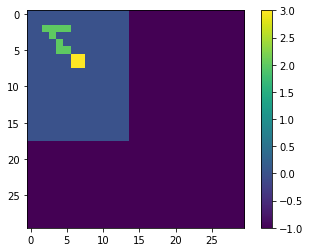

LOSS AT EPOCH 920: tf.Tensor(0.0030656543168377953, shape=(), dtype=float64)
TRAINING


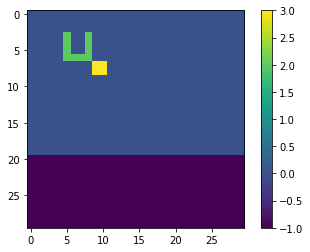

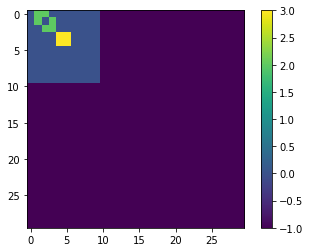

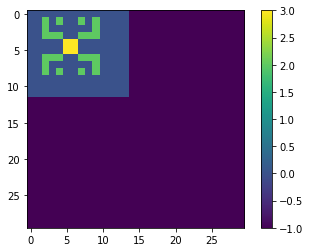

TEST


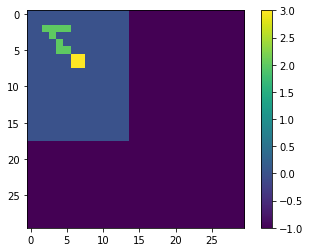

LOSS AT EPOCH 922: tf.Tensor(0.0030655818363743235, shape=(), dtype=float64)
TRAINING


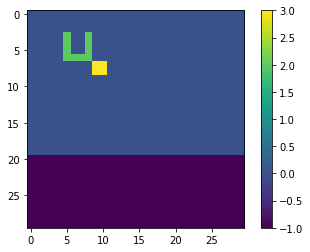

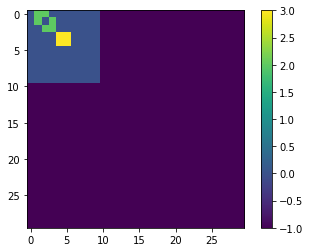

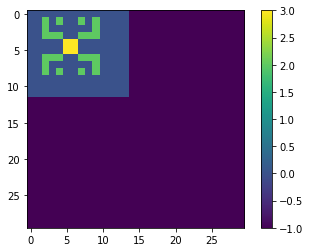

TEST


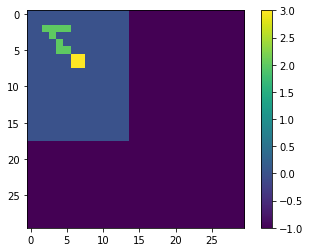

LOSS AT EPOCH 924: tf.Tensor(0.0030655092641521937, shape=(), dtype=float64)
TRAINING


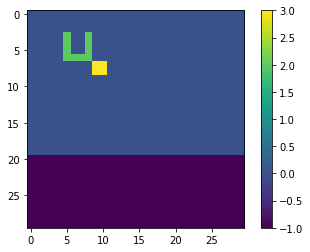

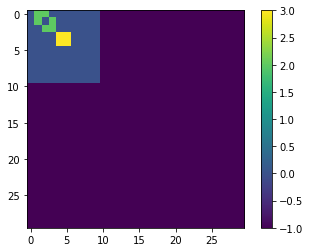

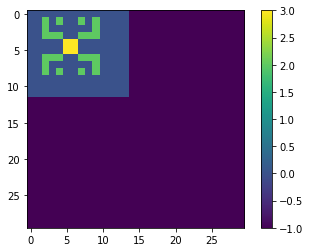

TEST


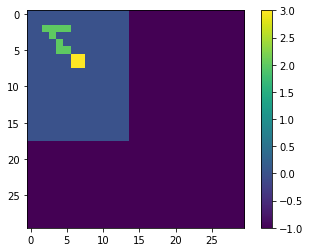

LOSS AT EPOCH 926: tf.Tensor(0.003065436596160781, shape=(), dtype=float64)
TRAINING


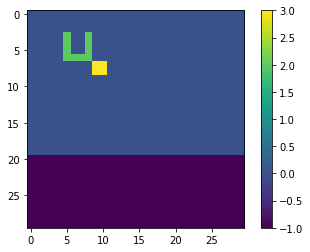

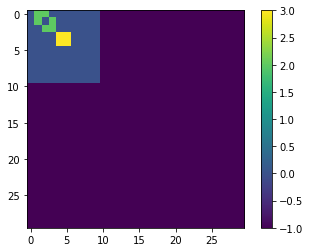

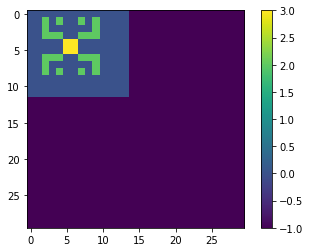

TEST


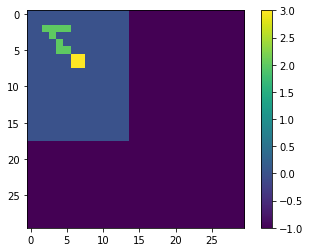

LOSS AT EPOCH 928: tf.Tensor(0.003065363829690732, shape=(), dtype=float64)
TRAINING


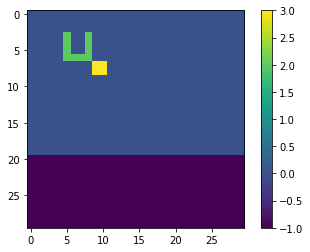

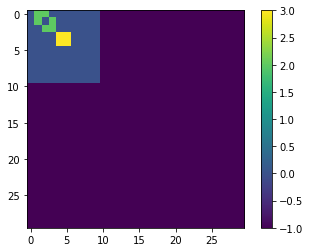

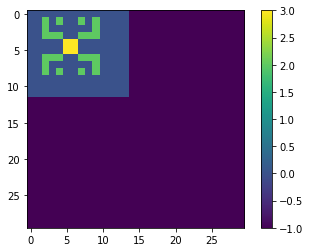

TEST


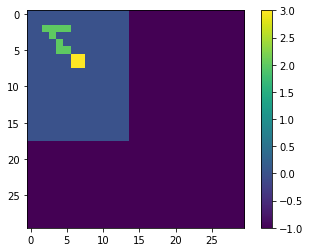

LOSS AT EPOCH 930: tf.Tensor(0.0030652909648436655, shape=(), dtype=float64)
TRAINING


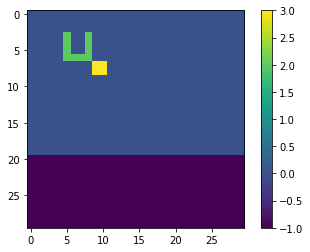

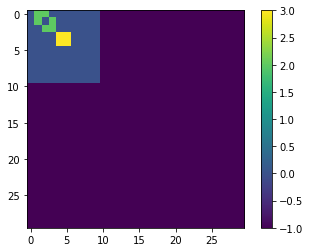

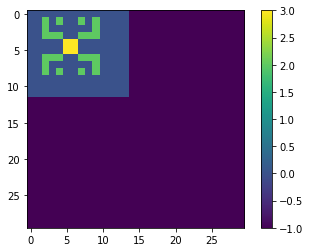

TEST


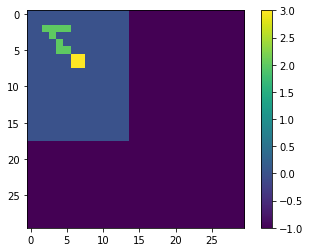

LOSS AT EPOCH 932: tf.Tensor(0.0030652180002898642, shape=(), dtype=float64)
TRAINING


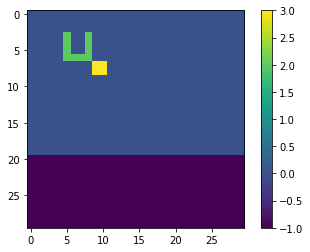

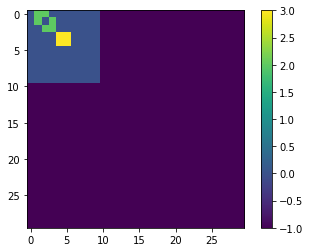

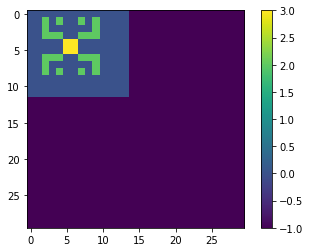

TEST


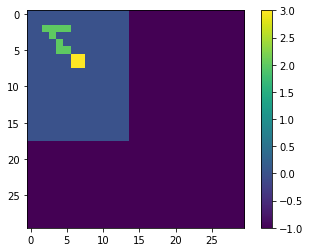

LOSS AT EPOCH 934: tf.Tensor(0.003065144906274559, shape=(), dtype=float64)
TRAINING


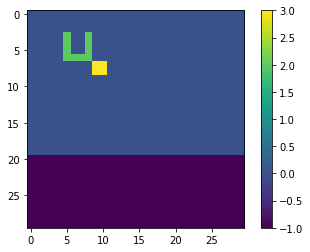

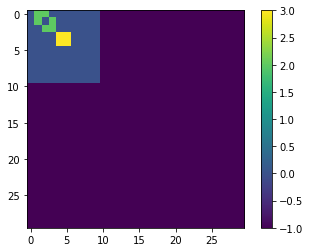

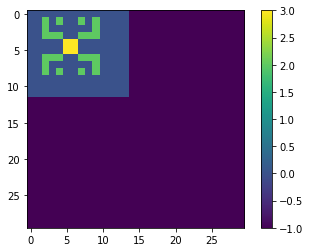

TEST


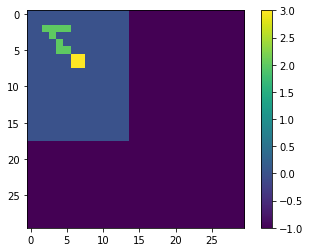

LOSS AT EPOCH 936: tf.Tensor(0.003065071542994147, shape=(), dtype=float64)
TRAINING


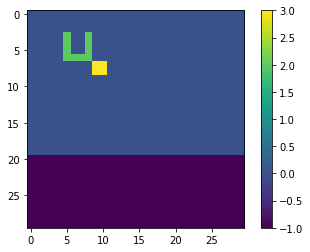

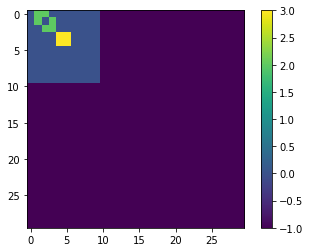

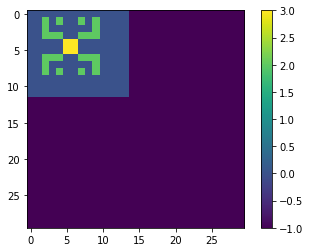

TEST


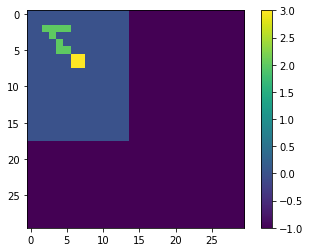

LOSS AT EPOCH 938: tf.Tensor(0.003064998003944122, shape=(), dtype=float64)
TRAINING


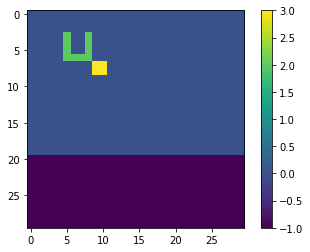

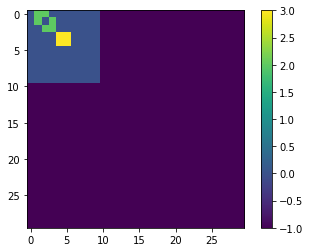

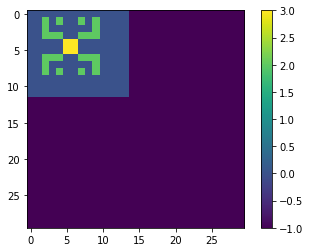

TEST


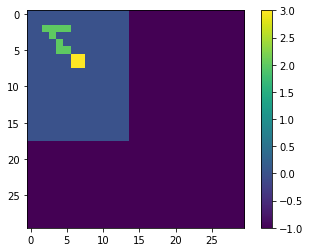

LOSS AT EPOCH 940: tf.Tensor(0.003064924306180277, shape=(), dtype=float64)
TRAINING


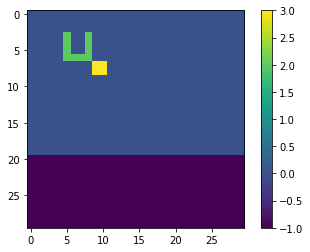

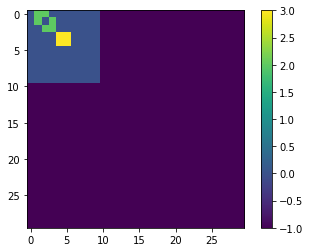

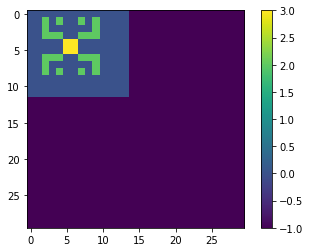

TEST


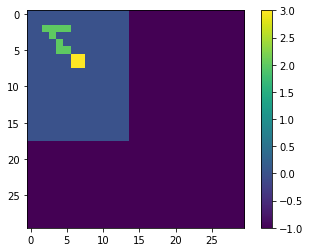

LOSS AT EPOCH 942: tf.Tensor(0.003064850436936165, shape=(), dtype=float64)
TRAINING


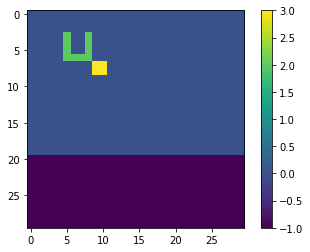

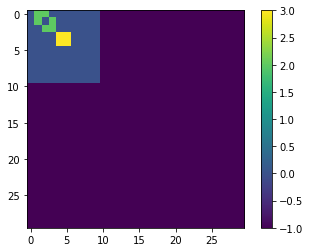

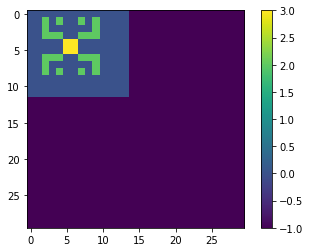

TEST


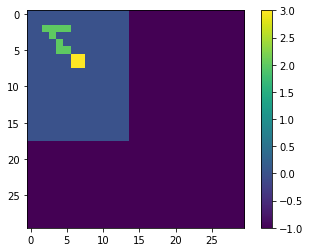

LOSS AT EPOCH 944: tf.Tensor(0.0030647764200875103, shape=(), dtype=float64)
TRAINING


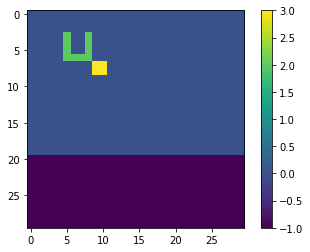

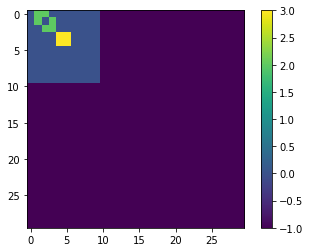

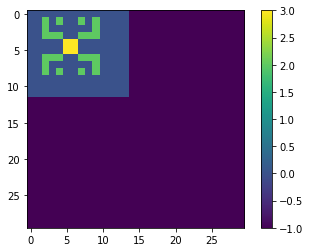

TEST


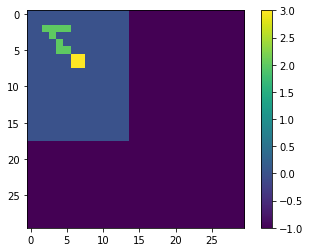

LOSS AT EPOCH 946: tf.Tensor(0.0030647022749331065, shape=(), dtype=float64)
TRAINING


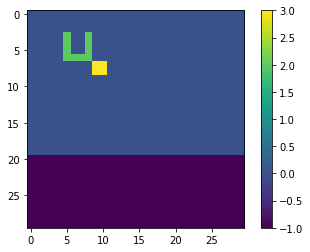

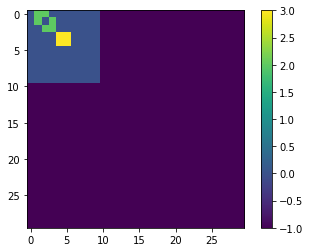

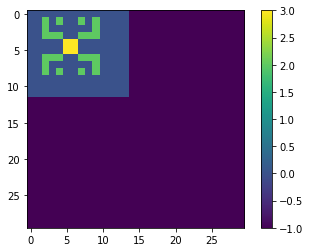

TEST


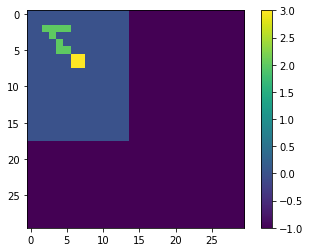

LOSS AT EPOCH 948: tf.Tensor(0.003064628015442957, shape=(), dtype=float64)
TRAINING


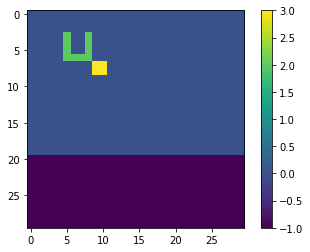

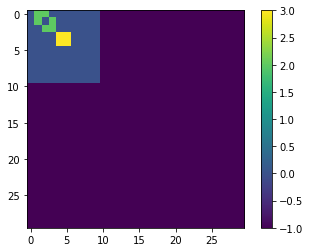

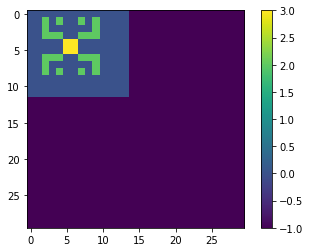

TEST


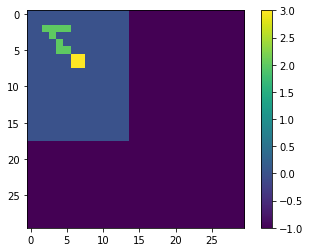

LOSS AT EPOCH 950: tf.Tensor(0.0030645536787821453, shape=(), dtype=float64)
TRAINING


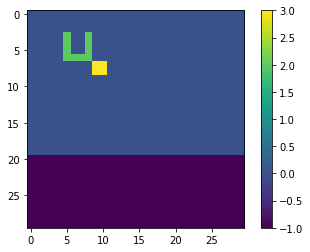

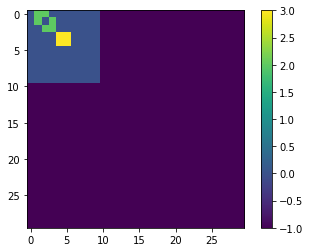

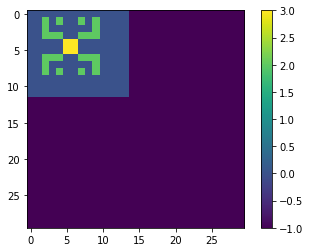

TEST


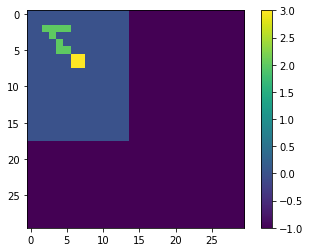

LOSS AT EPOCH 952: tf.Tensor(0.0030644792732919834, shape=(), dtype=float64)
TRAINING


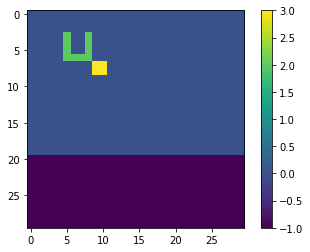

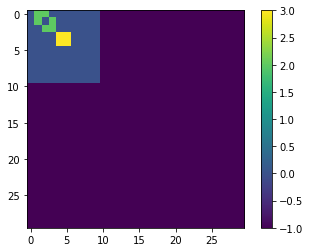

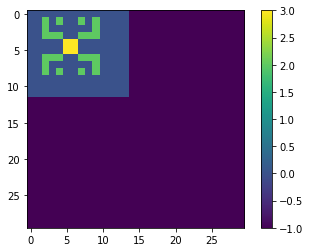

TEST


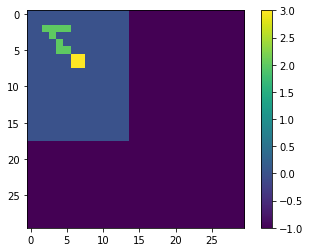

LOSS AT EPOCH 954: tf.Tensor(0.003064404783750912, shape=(), dtype=float64)
TRAINING


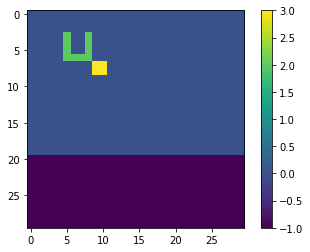

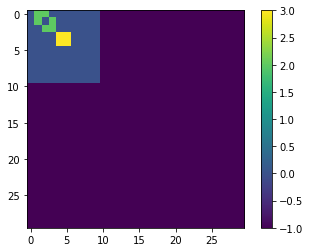

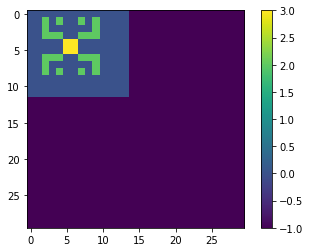

TEST


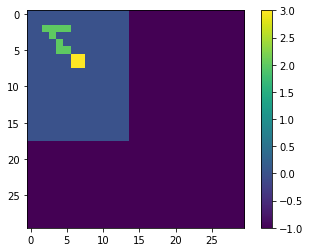

LOSS AT EPOCH 956: tf.Tensor(0.00306433021310728, shape=(), dtype=float64)
TRAINING


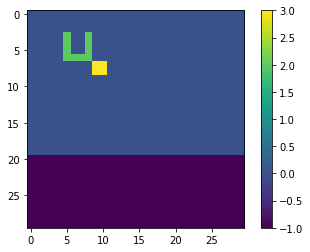

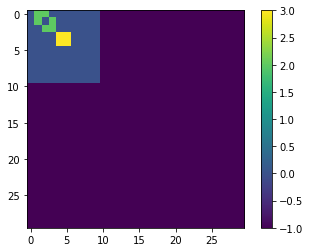

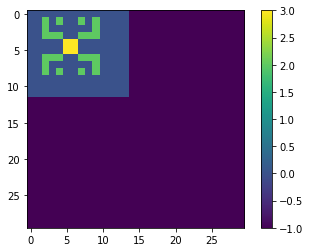

TEST


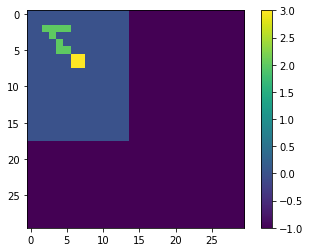

LOSS AT EPOCH 958: tf.Tensor(0.0030642555645401704, shape=(), dtype=float64)
TRAINING


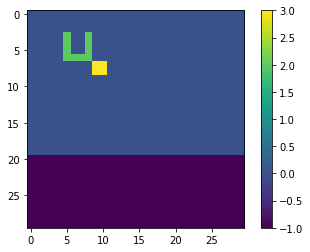

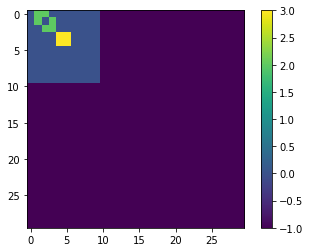

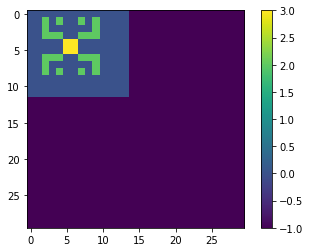

TEST


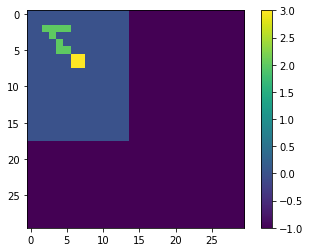

LOSS AT EPOCH 960: tf.Tensor(0.003064180852726221, shape=(), dtype=float64)
TRAINING


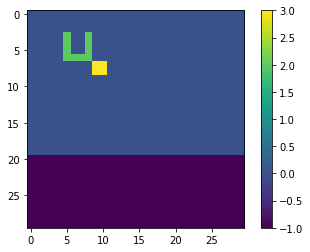

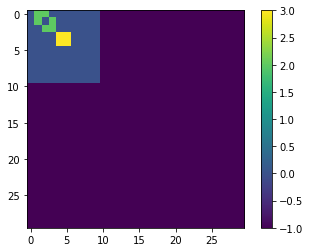

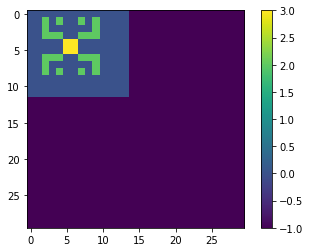

TEST


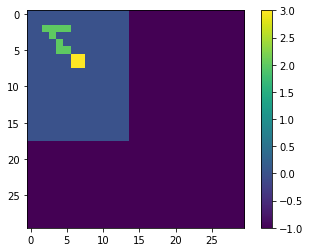

LOSS AT EPOCH 962: tf.Tensor(0.0030641061011063325, shape=(), dtype=float64)
TRAINING


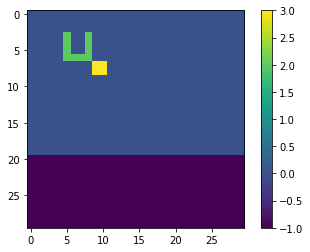

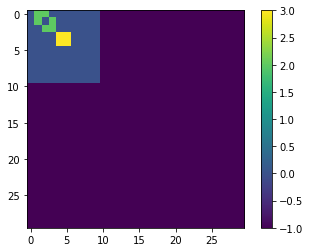

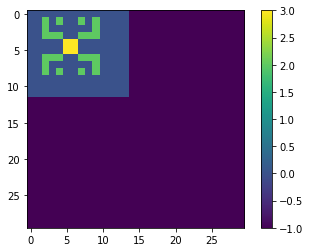

TEST


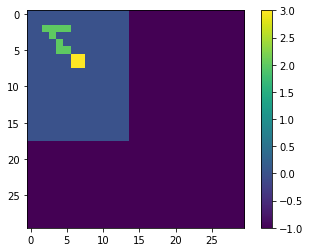

LOSS AT EPOCH 964: tf.Tensor(0.003064031309267499, shape=(), dtype=float64)
TRAINING


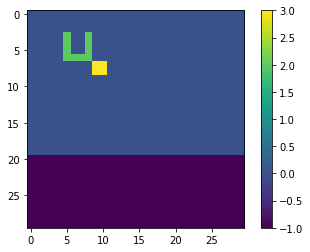

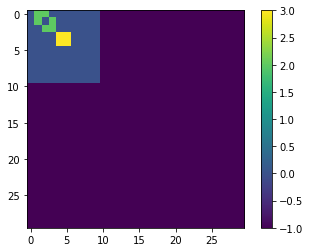

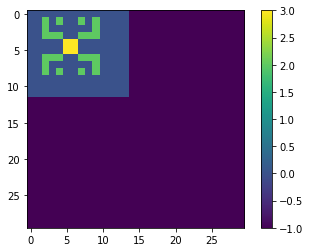

TEST


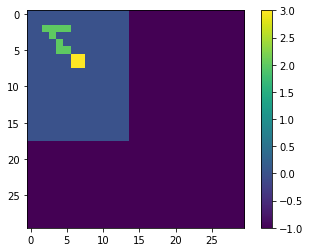

LOSS AT EPOCH 966: tf.Tensor(0.003063956460868903, shape=(), dtype=float64)
TRAINING


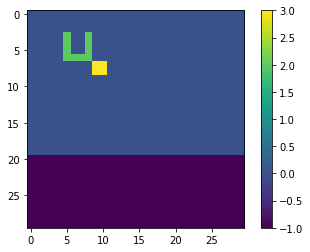

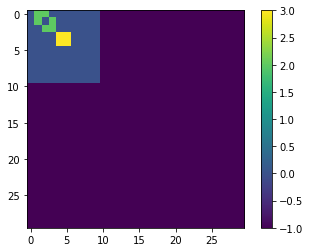

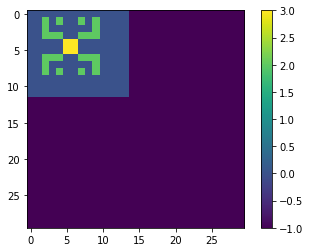

TEST


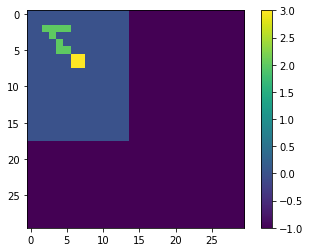

LOSS AT EPOCH 968: tf.Tensor(0.0030638816375311243, shape=(), dtype=float64)
TRAINING


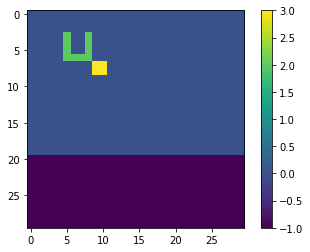

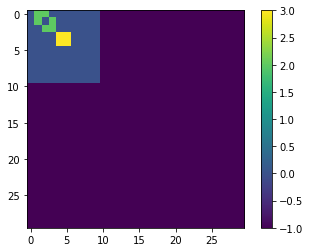

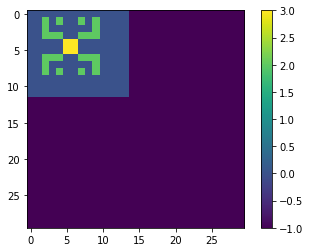

TEST


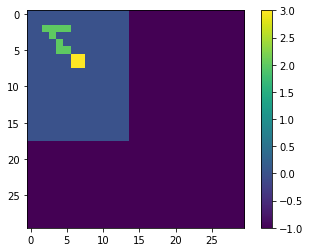

LOSS AT EPOCH 970: tf.Tensor(0.003063806761852236, shape=(), dtype=float64)
TRAINING


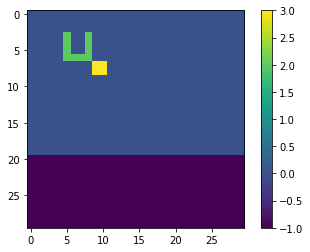

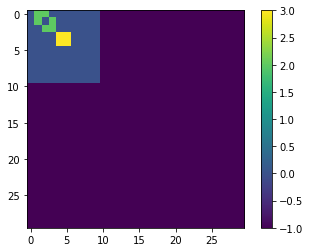

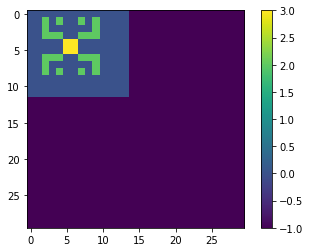

TEST


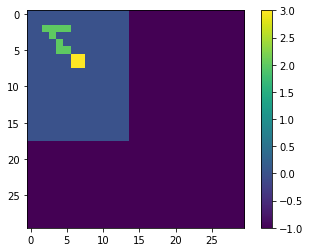

LOSS AT EPOCH 972: tf.Tensor(0.003063731818437245, shape=(), dtype=float64)
TRAINING


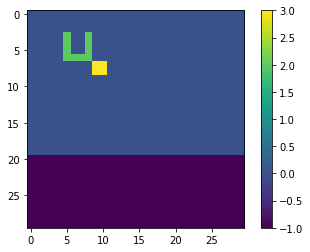

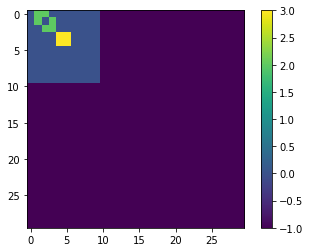

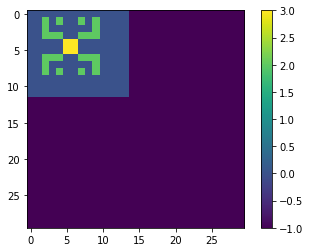

TEST


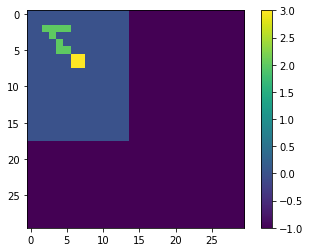

LOSS AT EPOCH 974: tf.Tensor(0.0030636568124706464, shape=(), dtype=float64)
TRAINING


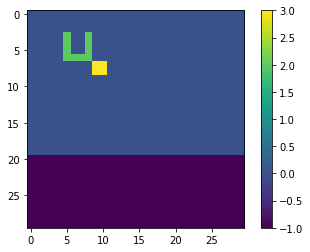

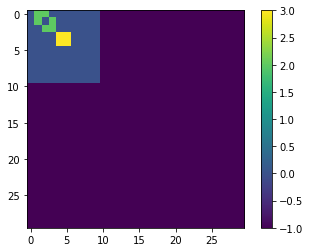

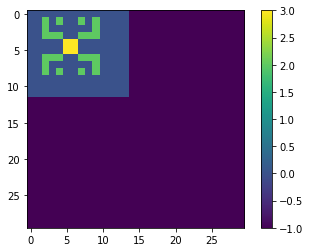

TEST


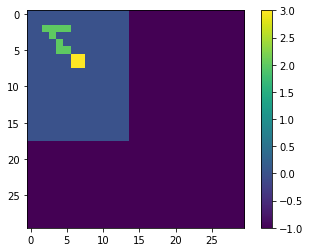

LOSS AT EPOCH 976: tf.Tensor(0.0030635817456281787, shape=(), dtype=float64)
TRAINING


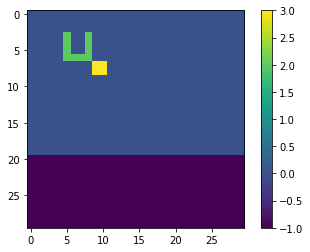

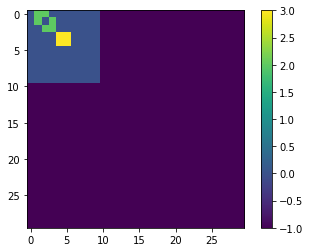

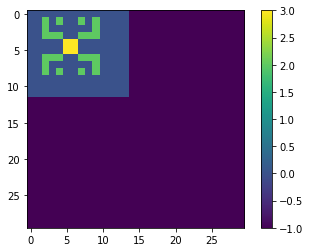

TEST


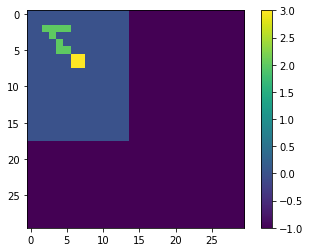

LOSS AT EPOCH 978: tf.Tensor(0.003063506579497337, shape=(), dtype=float64)
TRAINING


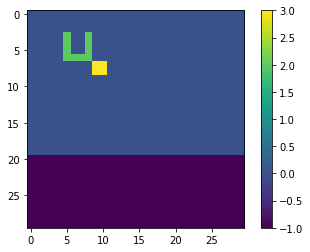

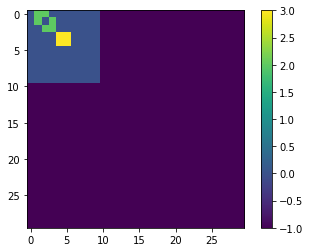

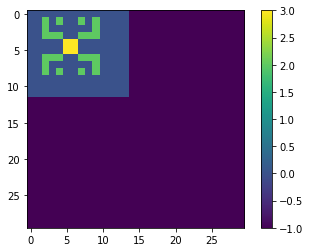

TEST


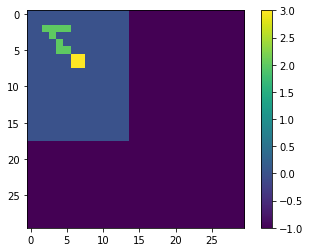

LOSS AT EPOCH 980: tf.Tensor(0.0030634313367309263, shape=(), dtype=float64)
TRAINING


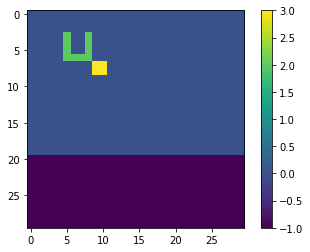

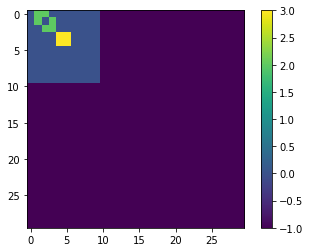

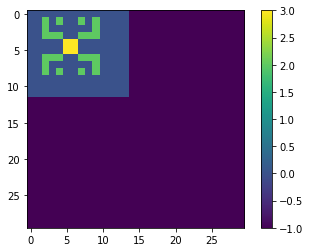

TEST


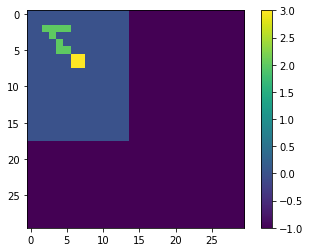

LOSS AT EPOCH 982: tf.Tensor(0.0030633560065882136, shape=(), dtype=float64)
TRAINING


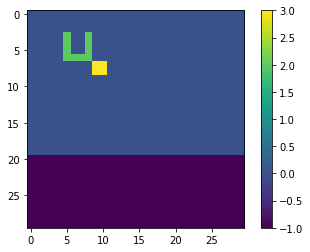

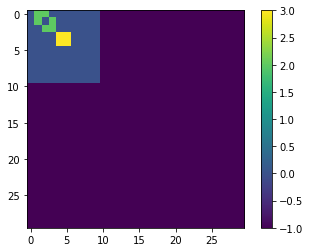

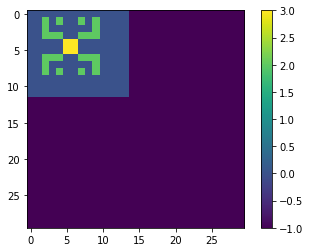

TEST


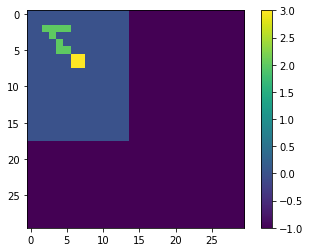

LOSS AT EPOCH 984: tf.Tensor(0.0030632805847096533, shape=(), dtype=float64)
TRAINING


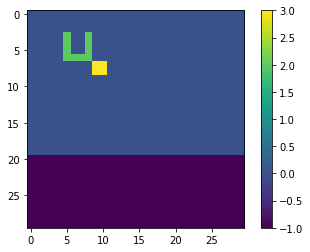

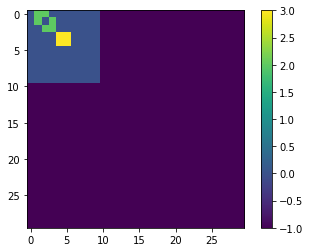

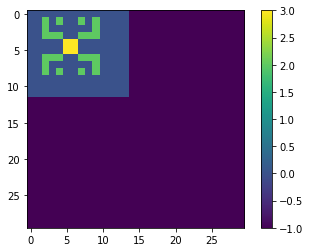

TEST


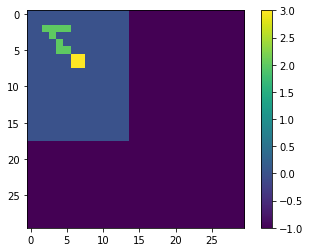

LOSS AT EPOCH 986: tf.Tensor(0.003063205074850756, shape=(), dtype=float64)
TRAINING


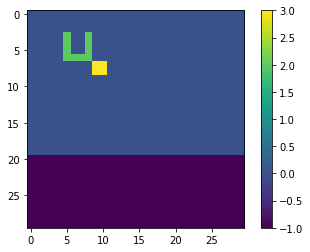

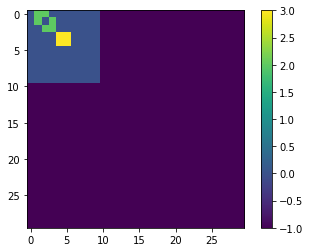

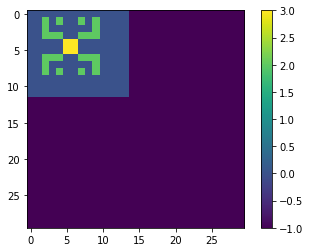

TEST


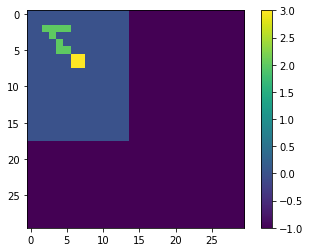

LOSS AT EPOCH 988: tf.Tensor(0.003063129474790318, shape=(), dtype=float64)
TRAINING


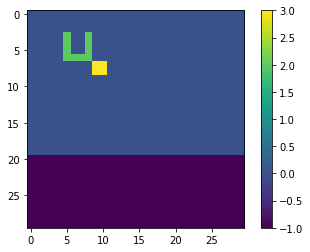

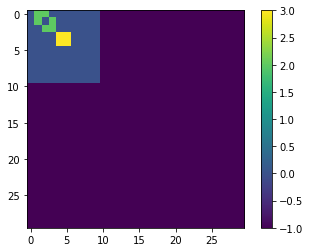

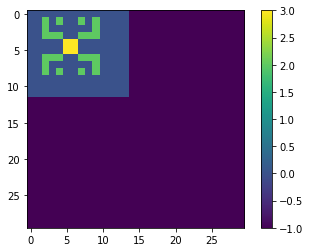

TEST


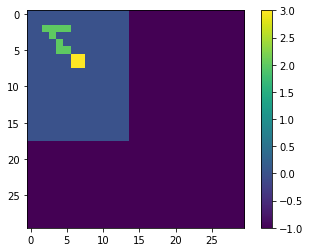

LOSS AT EPOCH 990: tf.Tensor(0.0030630537757749365, shape=(), dtype=float64)
TRAINING


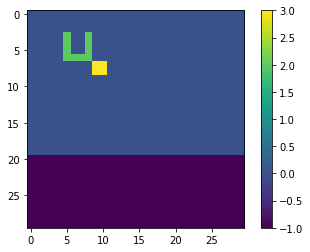

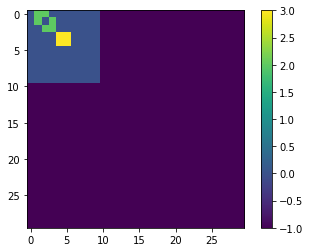

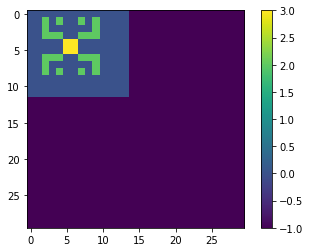

TEST


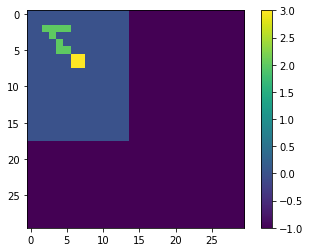

LOSS AT EPOCH 992: tf.Tensor(0.003062977975709, shape=(), dtype=float64)
TRAINING


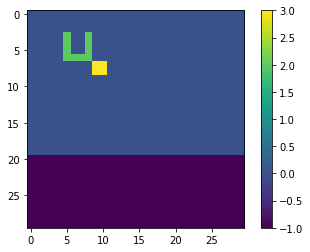

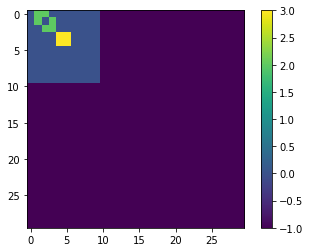

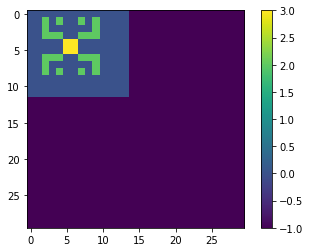

TEST


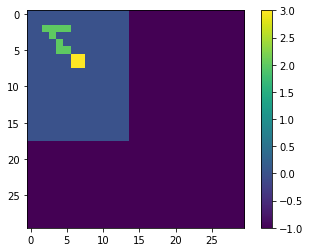

LOSS AT EPOCH 994: tf.Tensor(0.0030629020704963103, shape=(), dtype=float64)
TRAINING


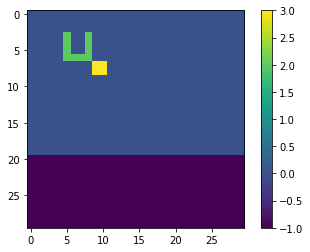

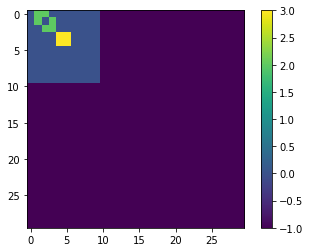

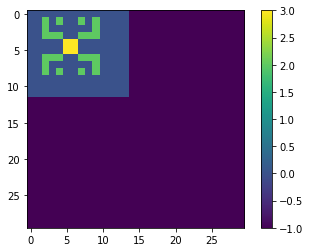

TEST


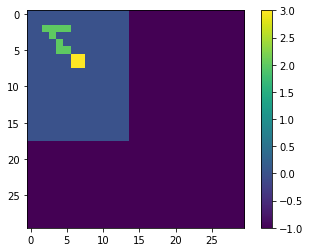

LOSS AT EPOCH 996: tf.Tensor(0.003062826060688634, shape=(), dtype=float64)
TRAINING


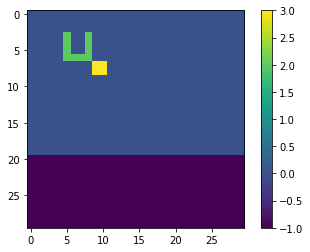

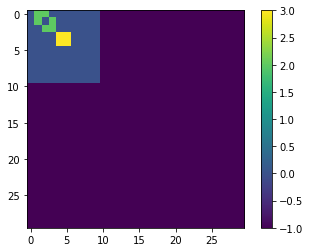

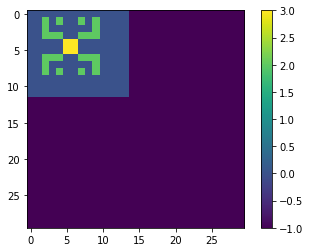

TEST


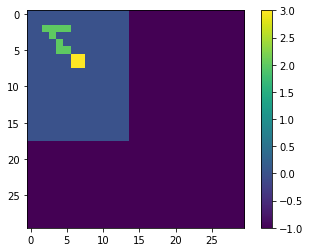

LOSS AT EPOCH 998: tf.Tensor(0.0030627499440234016, shape=(), dtype=float64)
TRAINING


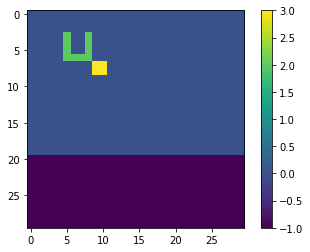

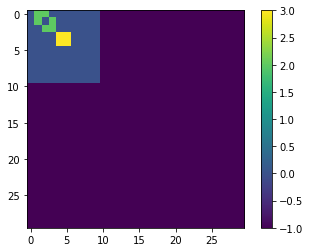

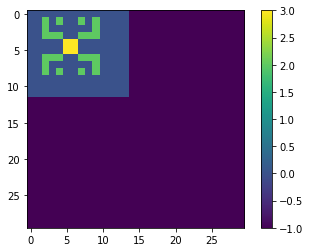

TEST


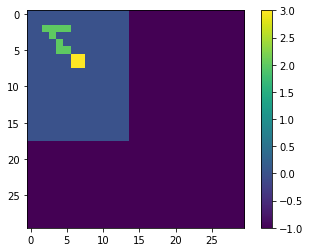

LOSS AT EPOCH 999: tf.Tensor(0.003062711845085927, shape=(), dtype=float64)


'\ntaskin = tf.keras.Input(shape=(ctask[0].shape[1], ctask[0].shape[2], channels+defaultchannels))\n\nX = DepthwiseConv2D((perceptionsize, perceptionsize), strides=[1, 1], padding="same", depth_multiplier=filters, activation="relu")(taskin)\nX = Conv2D(neurons, 1, activation="relu")(X)\nX = Conv2D(channels+defaultchannels, 1, activation=None)(X)\n\nmodel = tf.keras.Model(inputs=[taskin], outputs=[X])\nmodel.summary()\n\nmodel = train(model, cin, epochs, iterations, channels, True, True, ctest, resize)\n'

In [7]:
ntasks = 5
channels = 5
filters = 8
perceptionsize = 7
neurons = 8
epochs = 1000
iterations = 30

#ctask = load(names[104], channels, resize)
ctask = load(names[106], channels, resize)
#task = load("training/db3e9e38.json", channels, resize)
if ctask == False:
    print("DIFFERENT SIZED IN/OUT")

cin = ctask[0:2]
ctest = ctask[2]
    

if resize:
    model = tf.keras.Sequential([
        tf.keras.layers.DepthwiseConv2D((perceptionsize, perceptionsize), input_shape=(ctask[0].shape[1], ctask[0].shape[2], channels+22), strides=[1, 1], padding="same", depth_multiplier=filters, activation="relu"),
        #tf.keras.layers.Conv2D(filters, (perceptionsize, perceptionsize), input_shape=(ctask[0].shape[1], ctask[0].shape[2], channels+22), activation="relu", padding="same"),
        tf.keras.layers.Conv2D(neurons, 1, activation="relu"),
        tf.keras.layers.Conv2D(channels+22, 1, activation=None)
    ])
else:
    model = tf.keras.Sequential([
        tf.keras.layers.DepthwiseConv2D((perceptionsize, perceptionsize), input_shape=(ctask[0].shape[1], ctask[0].shape[2], channels+20), strides=[1, 1], padding="same", depth_multiplier=filters, activation="relu"),
        #tf.keras.layers.Conv2D(filters, (perceptionsize, perceptionsize), input_shape=(ctask[0].shape[1], ctask[0].shape[2], channels+20), activation="relu", padding="same"),
        tf.keras.layers.Conv2D(neurons, 1, activation="relu"),
        tf.keras.layers.Conv2D(channels+20, 1, activation=None)
    ])

model.summary()

cin = ctask[0:2]
ctest = ctask[2]

model = train(model, cin, epochs, iterations, channels, True, True, ctest, resize)
'''
taskin = tf.keras.Input(shape=(ctask[0].shape[1], ctask[0].shape[2], channels+defaultchannels))

X = DepthwiseConv2D((perceptionsize, perceptionsize), strides=[1, 1], padding="same", depth_multiplier=filters, activation="relu")(taskin)
X = Conv2D(neurons, 1, activation="relu")(X)
X = Conv2D(channels+defaultchannels, 1, activation=None)(X)

model = tf.keras.Model(inputs=[taskin], outputs=[X])
model.summary()

model = train(model, cin, epochs, iterations, channels, True, True, ctest, resize)
'''

In [ ]:
gen = generate(model, ctask[0], channels, iterations, resize)
plot(fromRep(ctask[0][2], resize))
plot(fromRep(gen[2], resize))

gen = generate(model, ctest, channels, iterations, resize)
plot(fromRep(ctest[0], resize))
plot(fromRep(gen[0], resize))

In [ ]:
a = load(names[106], 10, resize)

print(names[106])

print("TRAINING TASKS")
for t in range(len(a[0])):
    print("IN")
    plot(fromRep(a[0][t], resize))
    print("OUT")
    plot(fromRep(a[1][t], resize))
print("TEST IN")
for t in range(len(a[2])):
    plot(fromRep(a[2][t], resize))

## 

In [ ]:
a